In [1]:
import pandas as pd
import numpy as np
import random
from numpy.random import RandomState
from scipy import stats
from scipy.optimize import minimize
import scipy
import os
os.environ['R_HOME'] = '/Library/Frameworks/R.framework/Versions/4.1/Resources/'
import rpy2
from rpy2.robjects.packages import importr
from rpy2.robjects.packages import SignatureTranslatedAnonymousPackage
import datetime
from rpy2.robjects.vectors import FloatVector
from statsmodels.tsa.stattools import adfuller
from sklearn.linear_model import LinearRegression
import math

real_data_folder = "/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Data/sp500_mixed_period_2000_2021/"
np.random.seed(12001)


# Define the model that generates pair simulations.
yuima = importr("yuima")
n_jumpou_NIG_sim_string = """
n_jumpou_NIG = function(random_seed, num_sim,
                        mu11, mu12, mu21, mu22, 
                        sigma11, sigma12, sigma21, sigma22,
                        j11, j12, j21, j22,
                        alpha, beta1, beta2, delta0, mu1, mu2, 
                        lambda11, lambda12, lambda21, lambda22,
                        xinit_vec, T0, T, length){
  
  set.seed(random_seed)
  
  drift = c("mu11*t-mu12*X1", "mu21*t-mu22*X2")
  diffusion = matrix(c("exp(sigma11)", "exp(sigma12)", "exp(sigma21)", "exp(sigma22)"), 2, 2, byrow=TRUE)
  jumpcoef = matrix(c("j11", "j12", "j21", "j22"), 2, 2, byrow=TRUE) 
  
  alpha = alpha
  beta = c(beta1, beta2)
  delta0 = delta0
  mu = c(mu1, mu2)
  Lambda = matrix(c(lambda11, lambda12, lambda21, lambda22), 2, 2, byrow=TRUE)
  
  ou_model = setModel(drift=drift, diffusion=diffusion, jump.coeff=jumpcoef, 
                      measure.type="code",
                      measure=list(df="rNIG(z, alpha, beta, delta0, mu, Lambda)"), 
                      time.variable = "t",
                      state.var=c("X1","X2"), solve.variable=c("X1","X2"))
  newsamp = setSampling(Initial=T0, Terminal=T, n=length)
  
  n_sim_data = data.frame(matrix(nrow=length+1, ncol=2*num_sim))
  for (i in 1:num_sim){
    jumpou_sim = simulate(ou_model, 
                          true.par=list(
                            mu11=mu11, mu12=mu12, mu21=mu21, mu22=mu22, 
                            sigma11=sigma11, sigma12=sigma12, sigma21=sigma21, sigma22=sigma22,
                            j11=j11, j12=j12, j21=j21, j22=j22,
                            alpha=alpha, beta=beta, delta0=delta0, mu=mu, Lambda=Lambda), 
                          xinit=xinit_vec[[i]], sampling=newsamp)
    original_data = jumpou_sim@data@original.data
    one_sim_jumpou = data.frame(original_data[,1], original_data[,2])
    colnames(one_sim_jumpou) = c('series1', 'series2')
    n_sim_data[, (2*i-1):(2*i)] = one_sim_jumpou
  }
  return(n_sim_data)
}
"""

n_jumpou_NIG_sim = SignatureTranslatedAnonymousPackage(n_jumpou_NIG_sim_string, "n_jumpou_NIG_sim")
def n_jumpou_simulation(random_seed, num_sim,
                        mu11, mu12, mu21, mu22, 
                        sigma11, sigma12, sigma21, sigma22,
                        j11, j12, j21, j22,
                        alpha, beta1, beta2, delta0, mu1, mu2, 
                        lambda11, lambda12, lambda21, lambda22,
                        xinit_vec, T0, T, length):

    n_sim_data = pd.DataFrame(
        n_jumpou_NIG_sim.n_jumpou_NIG(random_seed, num_sim,
                                      mu11, mu12, mu21, mu22, 
                                      sigma11, sigma12, sigma21, sigma22,
                                      j11, j12, j21, j22,
                                      alpha, beta1, beta2, delta0, mu1, mu2, 
                                      lambda11, lambda12, lambda21, lambda22,
                                      xinit_vec, T0, T, length)).transpose()
    return n_sim_data


def price_to_log_price(n_price):
    return(np.log(n_price))

def log_price_to_price(n_log_price):
    return(np.exp(n_log_price))

def price_to_return(n_price):
    n_return = pd.DataFrame()
    for i in range(n_price.shape[1]):
        ith_column_price_series = n_price.iloc[:, i]
        n_return = pd.concat([n_return, 100 * (np.log(ith_column_price_series[1:].values) - np.log(ith_column_price_series[:-1]))], axis=1)
    return n_return

def log_price_to_return(n_log_price):
    n_real_return = pd.DataFrame()
    for i in range(n_log_price.shape[1]):
        ith_column_price_series = n_log_price.iloc[:, i]
        n_real_return = pd.concat([n_real_return, 100 * (ith_column_price_series[1:].values - ith_column_price_series[:-1])], axis=1)
    return n_real_return


def cross_corr_coef(lag_time_series, lead_time_series, lag):
    # calculate the cross correlation between two time series
    # if the result is not zero, then 'lead_time_series' leads 'lag_time_series'
    lag_time_series = lag_time_series.iloc[lag:]
    corr_coef = np.corrcoef(lag_time_series, lead_time_series.iloc[0:((lead_time_series.size)-lag)])[0][1]
    return corr_coef

def cal_stats(n_return, n_price):
    
    return_series1 = n_return.iloc[:, ::2]
    return_series2 = n_return.iloc[:, 1::2]
    price_series1 = n_price.iloc[:, ::2]
    price_series2 = n_price.iloc[:, 1::2]
    sq_return_series1 = return_series1**2
    sq_return_series2 = return_series2**2

    
    mean1 = return_series1.mean(axis=0).values
    sd1 = return_series1.std(axis=0).values
    skew1 = return_series1.skew(axis=0).values
    kurtosis1 = return_series1.kurtosis(axis=0).values
       
    
    mean2 = return_series2.mean(axis=0).values
    sd2 = return_series2.std(axis=0).values
    skew2 = return_series2.skew(axis=0).values
    kurtosis2 = return_series2.kurtosis(axis=0).values #8(8)
    
    
    
    # Autocorrelation of the 2 return series with 3 lags respectively
    autocorr1_lag_1 = return_series1.apply(lambda x: x.autocorr(lag=1))
    autocorr1_lag_2 = return_series1.apply(lambda x: x.autocorr(lag=2))
    autocorr1_lag_3 = return_series1.apply(lambda x: x.autocorr(lag=3))
    autocorr2_lag_1 = return_series2.apply(lambda x: x.autocorr(lag=1)) 
    autocorr2_lag_2 = return_series2.apply(lambda x: x.autocorr(lag=2)) 
    autocorr2_lag_3 = return_series2.apply(lambda x: x.autocorr(lag=3)) #6(14)
    
    # Cross-correlation between return series
    corr_ts1_lag_0 = []
    corr_ts1_lag_1 = [] # if not zero, return series 2 leads return series 1
    corr_ts1_lag_2 = []
    corr_ts1_lag_3 = []
    corr_ts2_lag_1 = [] # if not zero, return series 1 lead return series 2
    corr_ts2_lag_2 = []
    corr_ts2_lag_3 = []
    for i in range(int(real_price.shape[1]/2)):
        corr_ts1_lag_0.append(cross_corr_coef(return_series1.iloc[:, i], return_series2.iloc[:, i], 0))
        corr_ts1_lag_1.append(cross_corr_coef(return_series1.iloc[:, i], return_series2.iloc[:, i], 1))
        corr_ts1_lag_2.append(cross_corr_coef(return_series1.iloc[:, i], return_series2.iloc[:, i], 2))
        corr_ts1_lag_3.append(cross_corr_coef(return_series1.iloc[:, i], return_series2.iloc[:, i], 3))
        corr_ts2_lag_1.append(cross_corr_coef(return_series2.iloc[:, i], return_series1.iloc[:, i], 1))
        corr_ts2_lag_2.append(cross_corr_coef(return_series2.iloc[:, i], return_series1.iloc[:, i], 2))
        corr_ts2_lag_3.append(cross_corr_coef(return_series2.iloc[:, i], return_series1.iloc[:, i], 3))
    corr_ts1_lag_0 = pd.Series(corr_ts1_lag_0)
    corr_ts1_lag_1 = pd.Series(corr_ts1_lag_1)
    corr_ts1_lag_2 = pd.Series(corr_ts1_lag_2)
    corr_ts1_lag_3 = pd.Series(corr_ts1_lag_3)
    corr_ts2_lag_1 = pd.Series(corr_ts2_lag_1)
    corr_ts2_lag_2 = pd.Series(corr_ts2_lag_2)
    corr_ts2_lag_3 = pd.Series(corr_ts2_lag_3)#7(21)
    
    
    
    # Autocorrelation of the 2 squared returns with 3 lags respectively
    autocorr_sqreturn_1_lag_1 = sq_return_series1.apply(lambda x: x.autocorr(lag=1))
    autocorr_sqreturn_1_lag_2 = sq_return_series1.apply(lambda x: x.autocorr(lag=2))
    autocorr_sqreturn_1_lag_3 = sq_return_series1.apply(lambda x: x.autocorr(lag=3))
    autocorr_sqreturn_2_lag_1 = sq_return_series2.apply(lambda x: x.autocorr(lag=1)) 
    autocorr_sqreturn_2_lag_2 = sq_return_series2.apply(lambda x: x.autocorr(lag=2)) 
    autocorr_sqreturn_2_lag_3 = sq_return_series2.apply(lambda x: x.autocorr(lag=3))#6(27)
    
    # Cross-correlation between squared returns series
    corr_sqts1_lag_0 = []
    corr_sqts1_lag_1 = [] # if not zero, return series 2 leads return series 1
    corr_sqts1_lag_2 = []
    corr_sqts1_lag_3 = []
    corr_sqts2_lag_1 = [] # if not zero, return series 1 lead return series 2
    corr_sqts2_lag_2 = []
    corr_sqts2_lag_3 = []
    for i in range(int(real_price.shape[1]/2)):
        corr_sqts1_lag_0.append(cross_corr_coef(sq_return_series1.iloc[:, i], sq_return_series2.iloc[:, i], 0))
        corr_sqts1_lag_1.append(cross_corr_coef(sq_return_series1.iloc[:, i], sq_return_series2.iloc[:, i], 1))
        corr_sqts1_lag_2.append(cross_corr_coef(sq_return_series1.iloc[:, i], sq_return_series2.iloc[:, i], 2))
        corr_sqts1_lag_3.append(cross_corr_coef(sq_return_series1.iloc[:, i], sq_return_series2.iloc[:, i], 3))
        corr_sqts2_lag_1.append(cross_corr_coef(sq_return_series2.iloc[:, i], sq_return_series1.iloc[:, i], 1))
        corr_sqts2_lag_2.append(cross_corr_coef(sq_return_series2.iloc[:, i], sq_return_series1.iloc[:, i], 2))
        corr_sqts2_lag_3.append(cross_corr_coef(sq_return_series2.iloc[:, i], sq_return_series1.iloc[:, i], 3))
    corr_sqts1_lag_0 = pd.Series(corr_ts1_lag_0)
    corr_sqts1_lag_1 = pd.Series(corr_ts1_lag_1)
    corr_sqts1_lag_2 = pd.Series(corr_ts1_lag_2)
    corr_sqts1_lag_3 = pd.Series(corr_ts1_lag_3)
    corr_sqts2_lag_1 = pd.Series(corr_ts2_lag_1)
    corr_sqts2_lag_2 = pd.Series(corr_ts2_lag_2)
    corr_sqts2_lag_3 = pd.Series(corr_ts2_lag_3)#7(34)
    
    
    
    
    stats_data = pd.DataFrame([mean1, mean2, sd1, sd2, 
                               skew1, skew2, kurtosis1, kurtosis2, #8(8)
                               
                               autocorr1_lag_1, autocorr1_lag_2, autocorr1_lag_3,
                               autocorr2_lag_1, autocorr2_lag_2, autocorr2_lag_3,#6(14)
                               
                               corr_ts1_lag_0, 
                               corr_ts1_lag_1, corr_ts1_lag_2, corr_ts1_lag_3,
                               corr_ts2_lag_1, corr_ts2_lag_2, corr_ts2_lag_3, #7(21)
                               
                               autocorr_sqreturn_1_lag_1, autocorr_sqreturn_1_lag_2, autocorr_sqreturn_1_lag_3,
                               autocorr_sqreturn_2_lag_1, autocorr_sqreturn_2_lag_2, autocorr_sqreturn_2_lag_3,#6(27)
                               
                               corr_sqts1_lag_0,
                               corr_sqts1_lag_1, corr_sqts1_lag_2, corr_sqts1_lag_3,
                               corr_sqts2_lag_1, corr_sqts2_lag_2, corr_sqts2_lag_3])#7(34)
    stats_data = stats_data.transpose()
#     stats_data.columns = [
#         'return_mean1', 'return_mean2',
#         'return_sd1', 'return_sd2',
#         'return_skew1', 'return_skew2',
#         'return_kurtosis1', 'return_kurtosis2',
        
#         'return_autocorrelation_ts1_lag1', 'return_autocorrelation_ts1_lag2', 'return_autocorrelation_ts1_lag3',
#         'return_autocorrelation_ts2_lag1', 'return_autocorrelation_ts2_lag2', 'return_autocorrelation_ts2_lag3',
        
#         'return_correlation_ts1_lag_0',
#         'return_correlation_ts1_lag_1', 'return_correlation_ts1_lag_2', 'return_correlation_ts1_lag_3',
#         'return_correlation_ts2_lag_1', 'return_correlation_ts2_lag_2', 'return_correlation_ts2_lag_3',
        
#         'sqreturn_autocorrelation_ts1_lag1', 'sqreturn_autocorrelation_ts1_lag2', 'sqreturn_autocorrelation_ts1_lag3',
#         'sqreturn_autocorrelation_ts2_lag1', 'sqreturn_autocorrelation_ts2_lag2', 'sqreturn_autocorrelation_ts2_lag3',
    
#         'sqreturn_correlation_ts1_lag_0',
#         'sqreturn_correlation_ts1_lag_1', 'sqreturn_correlation_ts1_lag_2', 'sqreturn_correlation_ts1_lag_3', 
#         'sqreturn_correlation_ts2_lag_1', 'sqreturn_correlation_ts2_lag_2', 'sqreturn_correlation_ts2_lag_3']
    
    return stats_data



def loss_function(params):

    params = FloatVector(params)
    print(params)
    moment_loss = pd.DataFrame().reindex_like(real_stats)
    
    n_sim_log_price = n_jumpou_simulation(
        random_seed=int(np.random.randint(low=0, high=980608, size=(1,))), num_sim=num_sim,
        mu11=params[4], mu12=params[5], 
        mu21=params[6], mu22=params[7], 
        sigma11=params[8], sigma12=params[9], 
        sigma21=params[10], sigma22=params[11],
        j11=params[12], j12=params[13], 
        j21=params[14], j22=params[15],
        
        alpha=2*params[0]*params[1]+0.5, 
        beta1=params[0], beta2=params[1], 
        delta0=params[2], 
        mu1=0, mu2=0, 
        lambda11=params[3], lambda12=0, 
        lambda21=0, lambda22=1/params[3],

        xinit_vec=xinit_vec, T0=T0, T=T, length=length)
    
    n_sim_price = log_price_to_price(n_sim_log_price)
    n_sim_return = price_to_return(n_sim_price)
    n_sim_stats = cal_stats(n_sim_return, n_sim_price)

    moment_loss = np.abs(n_real_stats - n_sim_stats)
    sum_loss = np.sum(moment_loss)

    sum_loss[6] = sum_loss[6]/10 
    sum_loss[7] = sum_loss[7]/10 
    
    loss = np.sum(sum_loss)

    print(sum_loss)
    print(loss)
    print('----------')

    return loss


real_price = pd.read_csv(real_data_folder + "pair_prices_cal.csv", index_col=[0])
real_log_price = price_to_log_price(n_price=real_price)
real_return = pd.read_csv(real_data_folder + "pair_returns_cal.csv", index_col=[0])
real_stats = cal_stats(n_return=real_return, n_price=real_price)

xinit_vec = []
for i in range(int(real_log_price.shape[1]/2)):
    init_pair_log_price = [real_log_price.iloc[0, 2*i], real_log_price.iloc[0, 2*i+1]]
    init_pair_log_price = FloatVector(init_pair_log_price)
    xinit_vec.append(init_pair_log_price)
    
num_sim, T0, T, length = real_stats.shape[0], 0, 2, real_price.shape[0]
n_real_stats = real_stats




initial0 = [-1, -1, 
            1, 
            1,
            
            1, 1, 1, 1,
            -1, -1, -1, -1,
            0.1, 0.1, 0.1, 0.1]

begin_time = datetime.datetime.now()
res = minimize(loss_function, initial0, method='powell',
               tol=1e-6, 
               options={'disp': True},
               bounds=[                       
                   (None, 0), (None, 0), 
                   (0, None), 
                   (0, None),
                   
                   (0, None), (0, None), (0, None), (0, None),
                   (None, None), (None, None), (None, None), (None, None),
                   (None, None), (None, None), (None, None), (None, None)])
print(res.x)

time = datetime.datetime.now() - begin_time
print(time)

params = (res.x)
loss = loss_function((params))
print(loss)


 [1] -1.0 -1.0  1.0  1.0  1.0  1.0  1.0  1.0 -1.0 -1.0 -1.0 -1.0  0.1  0.1  0.1
[16]  0.1

0     106.594113
1     101.829092
2     401.413654
3     392.984602
4     158.965911
5     166.803483
6     157.021529
7     167.241174
8      17.002268
9      14.663006
10     14.490527
11     16.601473
12     15.268496
13     14.595761
14    166.465353
15     14.771220
16     14.739561
17     15.016837
18     15.500895
19     12.423650
20     14.500905
21     28.456453
22     24.406802
23     22.472490
24     30.879183
25     26.361951
26     22.784351
27    166.465353
28     14.771220
29     14.739561
30     15.016837
31     15.500895
32     12.423650
33     14.500905
dtype: float64
2407.6731588712214
----------
 [1] -1.793574 -1.000000  1.000000  1.000000  1.000000  1.000000  1.000000
 [8]  1.000000 -1.000000 -1.000000 -1.000000 -1.000000  0.100000  0.100000
[15]  0.100000  0.100000

0     108.005578
1     102.379939
2     388.573630
3     380.196207
4     149.906327
5     152.203435
6     15

0     106.393626
1     100.923386
2     392.614107
3     384.402912
4     143.623994
5     155.024956
6     153.989658
7     172.034817
8      16.890977
9      14.331080
10     13.714134
11     16.569686
12     15.169757
13     14.742259
14    166.461606
15     13.935351
16     14.102212
17     14.380014
18     16.301006
19     12.757432
20     14.211552
21     25.967329
22     24.817692
23     22.197982
24     28.176729
25     27.182731
26     21.181802
27    166.461606
28     13.935351
29     14.102212
30     14.380014
31     16.301006
32     12.757432
33     14.211552
dtype: float64
2354.247957939708
----------
 [1] -2.079627 -1.000000  1.000000  1.000000  1.000000  1.000000  1.000000
 [8]  1.000000 -1.000000 -1.000000 -1.000000 -1.000000  0.100000  0.100000
[15]  0.100000  0.100000

0     103.952238
1      98.333575
2     390.397913
3     381.314134
4     146.039128
5     152.975205
6     153.842945
7     171.780054
8      16.210908
9      15.294483
10     14.312944
11     16.65883

0     105.439204
1      99.670086
2     388.252648
3     380.554259
4     147.537793
5     151.140788
6     153.320104
7     171.387514
8      16.254477
9      14.705123
10     14.502781
11     16.614057
12     16.444260
13     15.667095
14    166.460409
15     15.051689
16     14.443883
17     14.538869
18     15.134073
19     13.742110
20     14.634595
21     26.904919
22     25.397661
23     22.228139
24     29.571400
25     27.627061
26     21.978666
27    166.460409
28     15.051689
29     14.443883
30     14.538869
31     15.134073
32     13.742110
33     14.634595
dtype: float64
2353.2092925920197
----------
 [1] -2.068586 -1.000000  1.000000  1.000000  1.000000  1.000000  1.000000
 [8]  1.000000 -1.000000 -1.000000 -1.000000 -1.000000  0.100000  0.100000
[15]  0.100000  0.100000

0     105.990961
1     100.324668
2     394.991164
3     385.296040
4     146.396572
5     154.555423
6     154.389876
7     173.728803
8      17.268691
9      14.863695
10     13.639964
11     17.0311

0     107.300016
1     102.411233
2     391.967636
3     382.777308
4     145.203468
5     155.724408
6     152.941316
7     171.114644
8      17.066279
9      14.896951
10     15.190374
11     16.150157
12     15.102445
13     14.239585
14    166.462550
15     14.510507
16     14.099517
17     14.491338
18     14.793066
19     12.967762
20     14.686870
21     28.010871
22     24.820751
23     21.306297
24     30.127770
25     26.623026
26     22.058053
27    166.462550
28     14.510507
29     14.099517
30     14.491338
31     14.793066
32     12.967762
33     14.686870
dtype: float64
2359.0558087075383
----------
 [1] -2.068653 -1.793574  1.000000  1.000000  1.000000  1.000000  1.000000
 [8]  1.000000 -1.000000 -1.000000 -1.000000 -1.000000  0.100000  0.100000
[15]  0.100000  0.100000

0     107.046415
1     101.947004
2     385.659527
3     375.563756
4     145.115026
5     155.123767
6     155.672429
7     173.230350
8      15.269307
9      14.930822
10     14.351822
11     16.7228

0     105.347758
1      99.444049
2     384.896297
3     377.031052
4     142.183177
5     156.326721
6     156.488126
7     174.125128
8      17.014785
9      14.807008
10     13.773197
11     16.111679
12     15.074538
13     14.843956
14    166.460529
15     15.106493
16     14.090085
17     14.596743
18     15.957550
19     13.387746
20     14.099717
21     27.077956
22     26.365017
23     21.800781
24     29.162216
25     27.648075
26     21.154573
27    166.460529
28     15.106493
29     14.090085
30     14.596743
31     15.957550
32     13.387746
33     14.099717
dtype: float64
2348.0738131458706
----------
 [1] -2.068653 -1.777223  1.000000  1.000000  1.000000  1.000000  1.000000
 [8]  1.000000 -1.000000 -1.000000 -1.000000 -1.000000  0.100000  0.100000
[15]  0.100000  0.100000

0     103.362451
1      98.093527
2     386.312696
3     377.650923
4     144.828047
5     153.422122
6     156.020216
7     173.620473
8      17.344138
9      16.253871
10     14.256409
11     16.8291

0     105.962045
1     100.305744
2     387.874986
3     379.332782
4     139.953593
5     152.308288
6     155.491337
7     173.330309
8      16.609042
9      14.500205
10     14.214432
11     16.432021
12     15.755485
13     15.255646
14    166.461277
15     14.591477
16     14.959042
17     14.729912
18     15.565006
19     13.549562
20     13.134225
21     26.807487
22     25.404251
23     21.843398
24     28.747636
25     26.651403
26     21.487321
27    166.461277
28     14.591477
29     14.959042
30     14.729912
31     15.565006
32     13.549562
33     13.134225
dtype: float64
2344.248415139271
----------
 [1] -2.068653 -1.774873  1.000000  1.000000  1.000000  1.000000  1.000000
 [8]  1.000000 -1.000000 -1.000000 -1.000000 -1.000000  0.100000  0.100000
[15]  0.100000  0.100000

0     105.282245
1      99.971584
2     388.895365
3     380.048460
4     143.152491
5     153.204334
6     156.082407
7     173.692029
8      16.388295
9      15.385644
10     15.853922
11     17.05536

0     109.859351
1     104.115624
2     394.078207
3     384.381185
4     145.427426
5     153.308768
6     155.663791
7     173.553215
8      16.813922
9      15.491311
10     14.364955
11     17.907252
12     15.653162
13     13.793087
14    166.462555
15     16.026115
16     15.173501
17     14.208285
18     16.374592
19     14.266992
20     13.936447
21     28.194232
22     26.157805
23     22.088488
24     30.524335
25     27.914721
26     21.119251
27    166.462555
28     16.026115
29     15.173501
30     14.208285
31     16.374592
32     14.266992
33     13.936447
dtype: float64
2383.3070642200832
----------
 [1] -2.068653 -1.774859  1.476296  1.000000  1.000000  1.000000  1.000000
 [8]  1.000000 -1.000000 -1.000000 -1.000000 -1.000000  0.100000  0.100000
[15]  0.100000  0.100000

0     104.725398
1      99.663361
2     389.950374
3     381.059808
4     148.959144
5     154.060557
6     156.395305
7     173.731417
8      16.703074
9      14.985746
10     14.944317
11     16.7880

0     108.176802
1     102.478144
2     390.953577
3     381.628601
4     143.182388
5     150.580500
6     155.582042
7     173.192315
8      16.913381
9      14.444685
10     14.627228
11     17.155714
12     14.770791
13     14.882342
14    166.460998
15     13.902060
16     14.724361
17     14.861236
18     16.360128
19     12.813865
20     13.684744
21     27.068700
22     24.520614
23     22.170296
24     29.839596
25     26.851992
26     22.032051
27    166.460998
28     13.902060
29     14.724361
30     14.861236
31     16.360128
32     12.813865
33     13.684744
dtype: float64
2356.6665413953874
----------
 [1] -2.068653 -1.774859  1.876886  1.000000  1.000000  1.000000  1.000000
 [8]  1.000000 -1.000000 -1.000000 -1.000000 -1.000000  0.100000  0.100000
[15]  0.100000  0.100000

0     107.760561
1     102.415300
2     390.896718
3     383.333952
4     144.433621
5     151.573839
6     155.468260
7     173.139320
8      17.360122
9      14.876964
10     14.879704
11     16.6706

0     105.774643
1     100.277317
2     390.270669
3     383.359065
4     146.118590
5     155.403763
6     155.119411
7     172.761292
8      16.712493
9      14.685772
10     13.560301
11     17.642926
12     15.121828
13     14.165521
14    166.460594
15     15.187137
16     14.151626
17     13.830972
18     15.361108
19     13.461067
20     13.656036
21     26.064137
22     24.711278
23     21.125551
24     29.090912
25     27.284516
26     21.056388
27    166.460594
28     15.187137
29     14.151626
30     13.830972
31     15.361108
32     13.461067
33     13.656036
dtype: float64
2354.5234534975566
----------
 [1] -2.068653 -1.774859  1.878786  1.000000  1.000000  1.000000  1.000000
 [8]  1.000000 -1.000000 -1.000000 -1.000000 -1.000000  0.100000  0.100000
[15]  0.100000  0.100000

0     106.292814
1     100.664907
2     388.940719
3     380.945794
4     143.035211
5     150.618474
6     155.999107
7     173.483427
8      15.926803
9      14.748812
10     14.884805
11     16.6083

0     106.783094
1     101.604337
2     389.329408
3     382.169870
4     144.230640
5     155.468260
6     155.482551
7     173.260485
8      18.170890
9      15.132903
10     14.641984
11     16.595691
12     15.750574
13     15.168785
14    166.462838
15     15.536559
16     14.838818
17     14.733016
18     16.095902
19     13.609604
20     14.455083
21     26.205080
22     24.324900
23     21.465180
24     28.285431
25     26.261346
26     21.696813
27    166.462838
28     15.536559
29     14.838818
30     14.733016
31     16.095902
32     13.609604
33     14.455083
dtype: float64
2363.4918646890314
----------
 [1] -2.0686525 -1.7748595  1.8787760  0.8139354  1.0000000  1.0000000
 [7]  1.0000000  1.0000000 -1.0000000 -1.0000000 -1.0000000 -1.0000000
[13]  0.1000000  0.1000000  0.1000000  0.1000000

0     107.686778
1     101.748368
2     389.998937
3     380.117845
4     145.838909
5     153.455717
6     156.456020
7     174.121314
8      15.800299
9      16.154167
10     13.84875

0     104.863801
1      99.357663
2     388.415609
3     380.619823
4     146.460900
5     154.848348
6     155.655657
7     173.316755
8      16.536979
9      15.048353
10     14.566015
11     16.952705
12     15.389200
13     14.267479
14    166.461697
15     15.371746
16     14.088311
17     14.346167
18     15.906320
19     13.637657
20     14.756895
21     25.957914
22     25.999022
23     20.543457
24     28.306633
25     28.316168
26     20.464367
27    166.461697
28     15.371746
29     14.088311
30     14.346167
31     15.906320
32     13.637657
33     14.756895
dtype: float64
2355.0244320481265
----------
 [1] -2.0686525 -1.7748595  1.8787760  0.7629095  1.0000000  1.0000000
 [7]  1.0000000  1.0000000 -1.0000000 -1.0000000 -1.0000000 -1.0000000
[13]  0.1000000  0.1000000  0.1000000  0.1000000

0     104.672522
1      99.057865
2     391.190924
3     382.775226
4     143.817445
5     152.218632
6     155.792140
7     173.525440
8      16.824535
9      15.196232
10     14.38955

0     104.864938
1      99.544728
2     391.301394
3     381.918408
4     145.675845
5     153.047612
6     155.929911
7     173.593121
8      16.608308
9      14.481670
10     13.953116
11     16.440527
12     15.255343
13     14.833651
14    166.462204
15     14.501567
16     15.197950
17     14.454823
18     16.011274
19     13.667053
20     14.067020
21     27.180077
22     26.509945
23     21.628749
24     29.775341
25     28.130311
26     21.315275
27    166.462204
28     14.501567
29     15.197950
30     14.454823
31     16.011274
32     13.667053
33     14.067020
dtype: float64
2360.7120524353313
----------
 [1] -2.0686525 -1.7748595  1.8787760  0.7626829  1.0000000  1.0000000
 [7]  1.0000000  1.0000000 -1.0000000 -1.0000000 -1.0000000 -1.0000000
[13]  0.1000000  0.1000000  0.1000000  0.1000000

0     107.267842
1     102.822725
2     389.497067
3     381.424176
4     143.723039
5     154.926813
6     155.550111
7     173.218056
8      17.025758
9      14.626813
10     14.73617

0      37.382547
1     101.657496
2     394.599972
3     379.079425
4     142.569996
5     155.347831
6     155.209920
7     172.841152
8      18.592187
9      15.731301
10     16.773941
11     16.624943
12     14.843719
13     14.796337
14    165.913089
15     15.184333
16     14.548762
17     15.241116
18     15.991512
19     13.278153
20     15.114197
21     27.141763
22     23.818380
23     22.914205
24     29.876097
25     27.229144
26     21.942413
27    165.913089
28     15.184333
29     14.548762
30     15.241116
31     15.991512
32     13.278153
33     15.114197
dtype: float64
2299.515095534008
----------
 [1] -2.068653 -1.774859  1.878776  0.762684  3.405910  1.000000  1.000000
 [8]  1.000000 -1.000000 -1.000000 -1.000000 -1.000000  0.100000  0.100000
[15]  0.100000  0.100000

0      43.719894
1     101.754376
2     396.629940
3     379.465245
4     142.737359
5     154.511267
6     154.424776
7     172.045835
8      19.548372
9      18.159453
10     16.776039
11     17.03353

0      39.439012
1     102.301704
2     398.565830
3     382.581012
4     142.263521
5     154.673111
6     157.433247
7     174.470456
8      19.801108
9      17.567070
10     15.792651
11     16.942096
12     15.766663
13     14.526649
14    165.919035
15     15.397571
16     15.132224
17     14.323029
18     16.769080
19     14.664953
20     13.791233
21     27.170514
22     25.197011
23     20.380536
24     29.703760
25     26.760225
26     21.180125
27    165.919035
28     15.397571
29     15.132224
30     14.323029
31     16.769080
32     14.664953
33     13.791233
dtype: float64
2314.5105506806144
----------
 [1] -2.068653 -1.774859  1.878776  0.762684  3.209118  1.000000  1.000000
 [8]  1.000000 -1.000000 -1.000000 -1.000000 -1.000000  0.100000  0.100000
[15]  0.100000  0.100000

0      39.412782
1     102.375578
2     398.451730
3     381.915582
4     145.675940
5     153.519102
6     156.232303
7     173.644840
8      19.731069
9      16.847319
10     16.567589
11     17.1087

0      39.014246
1      99.968534
2     398.407584
3     382.465755
4     146.150186
5     150.671663
6     155.497731
7     173.126400
8      18.654079
9      16.335669
10     17.073311
11     15.858387
12     15.213192
13     16.125083
14    165.920597
15     15.025852
16     15.618495
17     15.679583
18     15.797992
19     14.085310
20     15.895930
21     28.806801
22     25.468370
23     23.054645
24     30.190274
25     26.572816
26     21.567025
27    165.920597
28     15.025852
29     15.618495
30     15.679583
31     15.797992
32     14.085310
33     15.895930
dtype: float64
2316.2692647901654
----------
 [1] -2.068653 -1.774859  1.878776  0.762684  3.210038  1.000000  1.000000
 [8]  1.000000 -1.000000 -1.000000 -1.000000 -1.000000  0.100000  0.100000
[15]  0.100000  0.100000

0      37.643332
1     102.449190
2     396.591832
3     381.449119
4     142.419560
5     153.483875
6     155.434910
7     173.088853
8      19.542237
9      17.716411
10     16.185545
11     16.2322

0      36.084493
1     103.295188
2     399.221273
3     382.495865
4     143.406541
5     156.788641
6     155.401848
7     173.156942
8      19.745677
9      18.151031
10     15.688267
11     16.028655
12     15.019338
13     14.391821
14    165.730838
15     15.381126
16     15.745194
17     14.933983
18     16.871654
19     13.702685
20     14.913814
21     26.418775
22     25.313728
23     22.626494
24     29.184842
25     26.638168
26     22.015735
27    165.730838
28     15.381126
29     15.745194
30     14.933983
31     16.871654
32     13.702685
33     14.913814
dtype: float64
2315.6319072013716
----------
 [1] -2.068653 -1.774859  1.878776  0.762684  3.210034  1.132589  1.000000
 [8]  1.000000 -1.000000 -1.000000 -1.000000 -1.000000  0.100000  0.100000
[15]  0.100000  0.100000

0      36.223414
1      99.743013
2     399.694300
3     382.815149
4     143.039130
5     152.823849
6     156.207452
7     173.767831
8      20.278383
9      17.932309
10     15.789974
11     17.3015

0      36.280191
1     100.422431
2     397.434570
3     380.032145
4     144.576736
5     154.398133
6     155.768643
7     173.453734
8      18.667127
9      18.174728
10     17.634612
11     16.616873
12     16.241908
13     16.341457
14    165.746159
15     14.625845
16     16.316548
17     15.791566
18     15.593164
19     14.390763
20     15.777556
21     26.758941
22     25.168474
23     22.292920
24     28.493752
25     27.180328
26     23.017855
27    165.746159
28     14.625845
29     16.316548
30     15.791566
31     15.593164
32     14.390763
33     15.777556
dtype: float64
2315.4387591805607
----------
 [1] -2.068653 -1.774859  1.878776  0.762684  3.210034  1.139792  1.000000
 [8]  1.000000 -1.000000 -1.000000 -1.000000 -1.000000  0.100000  0.100000
[15]  0.100000  0.100000

0      37.040521
1     101.308930
2     398.429771
3     381.209904
4     142.316360
5     153.166771
6     154.710028
7     171.889347
8      20.006341
9      18.446421
10     16.227799
11     17.0914

0      36.183672
1      39.196162
2     399.863526
3     386.001132
4     143.321366
5     153.612723
6     155.899057
7     173.556290
8      19.131775
9      17.529260
10     17.057967
11     17.228643
12     16.973329
13     15.123243
14    166.322468
15     15.786502
16     15.835482
17     15.526841
18     18.207375
19     14.999909
20     15.769294
21     26.629190
22     25.527825
23     22.255135
24     29.231320
25     26.980843
26     22.240095
27    166.322468
28     15.786502
29     15.835482
30     15.526841
31     18.207375
32     14.999909
33     15.769294
dtype: float64
2268.438293971197
----------
 [1] -2.068653 -1.774859  1.878776  0.762684  3.210034  1.139787  2.476401
 [8]  1.000000 -1.000000 -1.000000 -1.000000 -1.000000  0.100000  0.100000
[15]  0.100000  0.100000

0      36.174843
1      38.915008
2     400.983654
3     389.291358
4     144.205398
5     151.929627
6     155.820789
7     173.172674
8      19.296698
9      18.323580
10     17.799671
11     17.16314

0      36.012178
1      37.657902
2     399.229321
3     386.784138
4     145.725272
5     153.587678
6     156.531413
7     174.069737
8      19.009451
9      16.908517
10     16.422619
11     16.672848
12     16.549641
13     14.805688
14    166.309573
15     15.381491
16     15.951774
17     15.533906
18     16.452174
19     14.770075
20     15.280916
21     27.310835
22     25.281738
23     20.649864
24     28.887353
25     25.667903
26     21.401853
27    166.309573
28     15.381491
29     15.951774
30     15.533906
31     16.452174
32     14.770075
33     15.280916
dtype: float64
2258.5257677489426
----------
 [1] -2.068653 -1.774859  1.878776  0.762684  3.210034  1.139787  2.464872
 [8]  1.000000 -1.000000 -1.000000 -1.000000 -1.000000  0.100000  0.100000
[15]  0.100000  0.100000

0      38.718013
1      39.556627
2     400.210132
3     386.244347
4     146.587411
5     154.677056
6     156.137987
7     173.128725
8      18.760623
9      18.116361
10     15.796397
11     16.7951

0      37.870198
1      75.349917
2     399.071324
3     395.855563
4     146.692624
5     150.935899
6     154.998602
7     172.217792
8      20.898972
9      19.762664
10     15.740492
11     21.427579
12     20.449158
13     16.709923
14    166.066756
15     18.006610
16     19.521938
17     16.719927
18     19.081608
19     17.209436
20     15.237864
21     25.360670
22     25.308045
23     22.996875
24     26.915681
25     26.636260
26     22.001253
27    166.066756
28     18.006610
29     19.521938
30     16.719927
31     19.081608
32     17.209436
33     15.237864
dtype: float64
2340.8877685488146
----------
 [1] -2.0686525 -1.7748595  1.8787760  0.7626840  3.2100338  1.1397867
 [7]  2.4648389  0.7667255 -1.0000000 -1.0000000 -1.0000000 -1.0000000
[13]  0.1000000  0.1000000  0.1000000  0.1000000

0      36.843095
1      33.755407
2     399.797124
3     384.685077
4     144.823734
5     155.575439
6     156.048142
7     173.786675
8      20.492836
9      17.056675
10     17.34596

0      36.851471
1      34.873700
2     398.845582
3     384.561379
4     141.952080
5     155.698157
6     156.019408
7     173.707736
8      19.984435
9      17.413322
10     16.593265
11     17.581562
12     15.251244
13     15.650366
14    166.216469
15     15.755757
16     15.028459
17     16.071636
18     17.653091
19     14.179836
20     15.418658
21     26.684731
22     25.713665
23     22.300210
24     29.051859
25     27.323951
26     22.275681
27    166.216469
28     15.755757
29     15.028459
30     16.071636
31     17.653091
32     14.179836
33     15.418658
dtype: float64
2258.9816148243426
----------
 [1] -2.0686525 -1.7748595  1.8787760  0.7626840  3.2100338  1.1397867
 [7]  2.4648389  0.8324013 -1.0000000 -1.0000000 -1.0000000 -1.0000000
[13]  0.1000000  0.1000000  0.1000000  0.1000000

0      36.189984
1      32.695342
2     401.127586
3     386.873297
4     145.683059
5     156.752239
6     154.773974
7     172.538540
8      19.745434
9      17.402745
10     16.69002

0      37.999783
1      34.132676
2     399.204593
3     386.010249
4     143.977530
5     154.316076
6     155.706095
7     173.293028
8      19.756529
9      17.696462
10     16.268457
11     17.903401
12     16.869520
13     16.224933
14    166.213427
15     16.432752
16     15.991540
17     15.708321
18     17.945177
19     14.937729
20     14.721238
21     26.191477
22     24.962491
23     23.178924
24     29.230411
25     26.290526
26     22.449608
27    166.213427
28     16.432752
29     15.991540
30     15.708321
31     17.945177
32     14.937729
33     14.721238
dtype: float64
2265.5631396427875
----------
 [1] -2.0686525 -1.7748595  1.8787760  0.7626840  3.2100338  1.1397867
 [7]  2.4648389  0.8311836 -1.0000000 -1.0000000 -1.0000000 -1.0000000
[13]  0.1000000  0.1000000  0.1000000  0.1000000

0      37.660286
1      36.986999
2     396.203169
3     380.998606
4     144.486688
5     153.708583
6     155.820343
7     173.323229
8      20.307503
9      17.298887
10     15.67534

0      35.323324
1      36.365158
2     231.681849
3     384.928854
4     145.651649
5     154.284712
6     154.723315
7     173.602773
8      25.651797
9      22.656899
10     21.085503
11     17.692730
12     15.385348
13     15.025237
14    125.564479
15     17.154546
16     16.690161
17     16.786736
18     18.557067
19     16.127593
20     16.171656
21     25.843866
22     24.316356
23     21.335932
24     28.625888
25     27.345563
26     20.363606
27    125.564479
28     17.154546
29     16.690161
30     16.786736
31     18.557067
32     16.127593
33     16.171656
dtype: float64
2035.994831992917
----------
 [1] -2.0686525 -1.7748595  1.8787760  0.7626840  3.2100338  1.1397867
 [7]  2.4648389  0.8311756 -2.1213851 -1.0000000 -1.0000000 -1.0000000
[13]  0.1000000  0.1000000  0.1000000  0.1000000

0      35.685970
1      34.269829
2     241.294478
3     383.323577
4     142.240256
5     155.749647
6     154.156822
7     172.734727
8      24.288038
9      22.124566
10     20.586960

0      34.679607
1      36.310852
2     223.295524
3     383.981790
4     141.949018
5     154.691705
6     155.270116
7     174.006463
8      27.629808
9      23.323211
10     21.949097
11     18.660204
12     16.358353
13     15.354641
14     97.684617
15     18.114060
16     17.062116
17     16.415094
18     19.160642
19     15.146043
20     16.337770
21     26.219471
22     25.583183
23     21.546923
24     30.687586
25     27.021693
26     21.690518
27     97.684617
28     18.114060
29     17.062116
30     16.415094
31     19.160642
32     15.146043
33     16.337770
dtype: float64
1980.0504449144075
----------
 [1] -2.0686525 -1.7748595  1.8787760  0.7626840  3.2100338  1.1397867
 [7]  2.4648389  0.8311756 -6.2434076 -1.0000000 -1.0000000 -1.0000000
[13]  0.1000000  0.1000000  0.1000000  0.1000000

0      36.261689
1      34.359930
2     224.506502
3     388.478384
4     143.701413
5     151.140706
6     154.614450
7     173.561962
8      25.743803
9      24.077145
10     21.52166

0      35.010507
1      34.161402
2     223.915727
3     383.307804
4     141.641496
5     153.360846
6     154.090142
7     174.052953
8      26.989485
9      23.621675
10     21.408243
11     18.353658
12     16.171275
13     15.435169
14     98.042989
15     18.158849
16     17.712098
17     16.853023
18     19.860251
19     15.828663
20     15.725923
21     26.467520
22     25.968835
23     21.560389
24     30.628285
25     26.886965
26     20.718240
27     98.042989
28     18.158849
29     17.712098
30     16.853023
31     19.860251
32     15.828663
33     15.725923
dtype: float64
1978.1142085375427
----------
 [1] -2.0686525 -1.7748595  1.8787760  0.7626840  3.2100338  1.1397867
 [7]  2.4648389  0.8311756 -6.1193943 -1.0000000 -1.0000000 -1.0000000
[13]  0.1000000  0.1000000  0.1000000  0.1000000

0      35.241869
1      35.827676
2     224.499224
3     388.330531
4     144.563266
5     153.088268
6     153.753130
7     173.822901
8      25.091623
9      24.081033
10     21.38995

0      35.702229
1      33.600095
2     182.284765
3     384.047100
4     144.279587
5     154.892023
6     151.954978
7     173.197102
8      32.985246
9      30.440640
10     27.611007
11     17.200297
12     16.169560
13     15.964913
14     98.530329
15     18.250283
16     18.652725
17     17.938359
18     20.059033
19     16.877978
20     16.661018
21     25.863886
22     24.567246
23     21.385399
24     30.186197
25     27.047491
26     21.640579
27     98.530329
28     18.250283
29     18.652725
30     17.938359
31     20.059033
32     16.877978
33     16.661018
dtype: float64
1964.959792554878
----------
 [1] -2.0686525 -1.7748595  1.8787760  0.7626840  3.2100338  1.1397867
 [7]  2.4648389  0.8311756 -6.1193943 -1.2043444 -1.0000000 -1.0000000
[13]  0.1000000  0.1000000  0.1000000  0.1000000

0      35.051642
1      35.718448
2     181.418859
3     386.823569
4     143.608839
5     153.254845
6     151.549887
7     173.521879
8      33.605759
9      31.148894
10     28.237304

0      35.241619
1      35.323518
2     182.013666
3     387.071172
4     142.990597
5     155.931157
6     151.883390
7     173.972008
8      32.857031
9      29.258078
10     28.758958
11     17.847714
12     15.864140
13     15.280855
14     97.844346
15     18.087570
16     18.423623
17     18.829670
18     20.070950
19     16.951183
20     17.813502
21     25.779043
22     25.012098
23     21.099988
24     29.654322
25     27.056756
26     21.214640
27     97.844346
28     18.087570
29     18.423623
30     18.829670
31     20.070950
32     16.951183
33     17.813502
dtype: float64
1970.1524382891355
----------
 [1] -2.0686525 -1.7748595  1.8787760  0.7626840  3.2100338  1.1397867
 [7]  2.4648389  0.8311756 -6.1193943 -1.2098265  0.0000000 -1.0000000
[13]  0.1000000  0.1000000  0.1000000  0.1000000

0       34.663664
1       46.555625
2      181.433484
3     1175.987712
4      143.492650
5      155.417800
6      151.573611
7      173.345141
8       33.326046
9       30.753010
10   

0      34.637266
1      34.333168
2     181.343583
3     256.091880
4     145.118289
5     154.340724
6     154.118447
7     172.595869
8      33.311930
9      29.984078
10     28.065049
11     19.650887
12     17.926444
13     17.100556
14    146.282356
15     21.322337
16     20.343511
17     19.488893
18     22.231929
19     19.603915
20     18.912056
21     25.731304
22     25.776682
23     21.061714
24     29.662205
25     27.486637
26     21.653079
27    146.282356
28     21.322337
29     20.343511
30     19.488893
31     22.231929
32     19.603915
33     18.912056
dtype: float64
1966.359786806163
----------
 [1] -2.0686525 -1.7748595  1.8787760  0.7626840  3.2100338  1.1397867
 [7]  2.4648389  0.8311756 -6.1193943 -1.2098265 -1.8649217 -1.0000000
[13]  0.1000000  0.1000000  0.1000000  0.1000000

0      35.289019
1      34.174444
2     179.568672
3     254.914147
4     144.703723
5     155.288213
6     151.944595
7     171.729175
8      32.357877
9      31.249709
10     27.693169

0      35.392658
1      34.041722
2     179.982338
3     254.858467
4     146.512084
5     151.708611
6     153.573437
7     172.241572
8      34.820988
9      30.724787
10     27.463903
11     19.473495
12     18.276443
13     15.778742
14    146.731658
15     22.299867
16     20.845111
17     18.406263
18     22.824470
19     19.595242
20     18.083026
21     26.053357
22     24.533957
23     21.454884
24     29.363693
25     27.865672
26     22.398752
27    146.731658
28     22.299867
29     20.845111
30     18.406263
31     22.824470
32     19.595242
33     18.083026
dtype: float64
1964.090837095329
----------
 [1] -2.0686525 -1.7748595  1.8787760  0.7626840  3.2100338  1.1397867
 [7]  2.4648389  0.8311756 -6.1193943 -1.2098265 -1.8548740 -1.0000000
[13]  0.1000000  0.1000000  0.1000000  0.1000000

0      34.632139
1      33.123101
2     178.800757
3     254.974395
4     144.513005
5     154.446676
6     153.393081
7     172.093056
8      33.279488
9      30.682202
10     28.561411

0      34.974234
1      32.399640
2     181.959861
3     221.900682
4     143.465290
5     152.555195
6     153.185342
7     172.119014
8      33.176014
9      31.734482
10     28.678059
11     21.328528
12     20.989444
13     17.901598
14    143.281806
15     22.682209
16     22.811957
17     21.574641
18     23.105481
19     21.803912
20     20.149049
21     25.108311
22     25.010542
23     21.534587
24     29.902485
25     26.688083
26     23.040745
27    143.281806
28     22.682209
29     22.811957
30     21.574641
31     23.105481
32     21.803912
33     20.149049
dtype: float64
1948.4702460184706
----------
 [1] -2.0686525 -1.7748595  1.8787760  0.7626840  3.2100338  1.1397867
 [7]  2.4648389  0.8311756 -6.1193943 -1.2098265 -1.8548740 -1.2016261
[13]  0.1000000  0.1000000  0.1000000  0.1000000

0      34.630800
1      32.041130
2     180.004630
3     212.168010
4     145.601620
5     150.811677
6     151.866617
7     170.965985
8      33.773718
9      30.767737
10     28.37204

0      35.389119
1      32.603005
2     182.140098
3     207.632336
4     144.652087
5     154.324436
6     152.080696
7     170.731451
8      32.788845
9      30.570711
10     27.553278
11     21.933749
12     20.495516
13     19.333204
14    140.467168
15     23.068959
16     23.354585
17     21.788755
18     24.510238
19     21.312035
20     20.559862
21     24.784704
22     23.426166
23     21.470397
24     29.032556
25     25.857180
26     21.431298
27    140.467168
28     23.068959
29     23.354585
30     21.788755
31     24.510238
32     21.312035
33     20.559862
dtype: float64
1928.3540373678861
----------
 [1] -2.0686525 -1.7748595  1.8787760  0.7626840  3.2100338  1.1397867
 [7]  2.4648389  0.8311756 -6.1193943 -1.2098265 -1.8548740 -1.2359610
[13]  0.1000000  0.1000000  0.1000000  0.1000000

0      35.716215
1      33.480170
2     180.239834
3     206.555178
4     150.141627
5     154.252401
6     153.145853
7     170.338149
8      33.724426
9      30.627808
10     28.18287

0      36.114164
1      33.072704
2     187.747310
3     207.785665
4     152.227871
5     148.987186
6     148.334663
7     170.472935
8      31.043920
9      27.937725
10     26.270162
11     21.781120
12     20.817383
13     19.095310
14    116.912625
15     23.695837
16     21.971073
17     20.756105
18     23.914048
19     20.806806
20     20.612830
21     25.526256
22     25.138532
23     20.663286
24     29.766039
25     26.355670
26     20.976896
27    116.912625
28     23.695837
29     21.971073
30     20.756105
31     23.914048
32     20.806806
33     20.612830
dtype: float64
1877.4534440258517
----------
 [1] -2.0686525 -1.7748595  1.8787760  0.7626840  3.2100338  1.1397867
 [7]  2.4648389  0.8311756 -6.1193943 -1.2098265 -1.8548740 -1.2360680
[13] -0.2788345  0.1000000  0.1000000  0.1000000

0      34.832234
1      31.628704
2     188.681949
3     206.571833
4     159.866974
5     153.434270
6     144.246977
7     170.508528
8      29.096645
9      25.809971
10     24.81708

0      36.543406
1      33.060181
2     191.125498
3     207.704667
4     160.531561
5     155.041266
6     141.709656
7     170.423858
8      30.828954
9      27.970760
10     24.159829
11     21.785448
12     21.090046
13     18.461163
14    111.086975
15     22.220304
16     22.362015
17     20.096566
18     23.974029
19     21.872563
20     19.569889
21     26.358609
22     23.433307
23     22.696297
24     29.871641
25     26.797977
26     21.256528
27    111.086975
28     22.220304
29     22.362015
30     20.096566
31     23.974029
32     21.872563
33     19.569889
dtype: float64
1873.2153342861038
----------
 [1] -2.0686525 -1.7748595  1.8787760  0.7626840  3.2100338  1.1397867
 [7]  2.4648389  0.8311756 -6.1193943 -1.2098265 -1.8548740 -1.2360680
[13] -0.2802474  0.1000000  0.1000000  0.1000000

0      36.413328
1      33.213199
2     188.758395
3     207.894984
4     159.828432
5     154.699758
6     143.770694
7     169.028061
8      30.710244
9      28.174186
10     25.20302

0      36.510211
1      32.643472
2     194.861798
3     207.905039
4     185.052217
5     150.908731
6     142.036221
7     172.129708
8      28.987457
9      24.321783
10     23.377386
11     22.517383
12     21.265796
13     20.258133
14     87.927921
15     21.415227
16     20.761422
17     21.140345
18     23.802747
19     19.953596
20     19.192755
21     25.956415
22     24.685372
23     20.757520
24     28.301677
25     26.480273
26     21.718570
27     87.927921
28     21.415227
29     20.761422
30     21.140345
31     23.802747
32     19.953596
33     19.192755
dtype: float64
1839.063188011563
----------
 [1] -2.0686525 -1.7748595  1.8787760  0.7626840  3.2100338  1.1397867
 [7]  2.4648389  0.8311756 -6.1193943 -1.2098265 -1.8548740 -1.2360680
[13] -0.2802094 -0.0461313  0.1000000  0.1000000

0      36.434607
1      33.713811
2     187.377965
3     207.021623
4     178.833183
5     151.980261
6     147.038001
7     170.033662
8      30.160251
9      29.163188
10     25.122203

0      36.676931
1      33.383120
2     194.647904
3     204.164391
4     199.164757
5     152.453449
6     159.957665
7     169.923557
8      27.667448
9      25.190154
10     23.770732
11     22.049623
12     20.477115
13     19.755366
14     87.784848
15     21.890966
16     21.181372
17     20.374660
18     23.036033
19     19.999083
20     19.882582
21     24.981336
22     24.782165
23     20.830667
24     28.728548
25     26.936926
26     20.884081
27     87.784848
28     21.890966
29     21.181372
30     20.374660
31     23.036033
32     19.999083
33     19.882582
dtype: float64
1864.7250232511847
----------
 [1] -2.0686525 -1.7748595  1.8787760  0.7626840  3.2100338  1.1397867
 [7]  2.4648389  0.8311756 -6.1193943 -1.2098265 -1.8548740 -1.2360680
[13] -0.2802094 -0.1470614  0.1000000  0.1000000

0      36.411128
1      31.739941
2     195.614296
3     207.484758
4     192.038208
5     149.586136
6     151.737116
7     171.279257
8      28.175357
9      26.391797
10     23.62627

0      35.661623
1      34.644579
2     193.259299
3     250.257201
4     186.200625
5     228.519029
6     145.248633
7     192.939173
8      28.801391
9      25.725491
10     23.506719
11     20.236579
12     18.968684
13     17.672262
14     45.962657
15     21.251879
16     20.833407
17     19.962342
18     22.672364
19     19.809448
20     19.799250
21     25.758075
22     24.677367
23     22.018259
24     28.666358
25     27.301554
26     21.467621
27     45.962657
28     21.251879
29     20.833407
30     19.962342
31     22.672364
32     19.809448
33     19.799250
dtype: float64
1892.1132139678368
----------
 [1] -2.0686525 -1.7748595  1.8787760  0.7626840  3.2100338  1.1397867
 [7]  2.4648389  0.8311756 -6.1193943 -1.2098265 -1.8548740 -1.2360680
[13] -0.2802094 -0.1469005  0.1636195  0.1000000

0      37.449122
1      32.001351
2     194.674462
3     210.072807
4     182.788417
5     155.057664
6     144.780851
7     169.114234
8      29.134015
9      24.602305
10     23.79413

0      35.793207
1      33.121763
2     194.002397
3     216.363270
4     185.362224
5     165.290225
6     144.099078
7     166.298622
8      27.879309
9      24.253449
10     23.110387
11     21.665129
12     20.614419
13     18.922475
14     66.837680
15     20.693221
16     20.943131
17     20.109271
18     23.001490
19     19.450110
20     18.926718
21     26.835798
22     24.579919
23     21.142167
24     29.636511
25     26.898687
26     20.012392
27     66.837680
28     20.693221
29     20.943131
30     20.109271
31     23.001490
32     19.450110
33     18.926718
dtype: float64
1805.8046671409006
----------
 [1] -2.0686525 -1.7748595  1.8787760  0.7626840  3.2100338  1.1397867
 [7]  2.4648389  0.8311756 -6.1193943 -1.2098265 -1.8548740 -1.2360680
[13] -0.2802094 -0.1469005  0.2455852  0.1000000

0      36.543781
1      33.122410
2     194.361251
3     211.509055
4     186.955694
5     155.811109
6     145.467831
7     163.490996
8      28.751524
9      25.245194
10     23.29214

0      36.753121
1      44.571505
2     197.343478
3     687.535887
4     186.930792
5     497.108171
6     145.482178
7     498.384406
8      27.466216
9      25.847253
10     24.043903
11     15.599529
12     15.416235
13     14.394938
14     62.471890
15     16.358312
16     16.824948
17     16.232957
18     17.445795
19     16.044674
20     15.706492
21     25.811548
22     24.789136
23     20.904571
24     28.823833
25     26.228579
26     20.445988
27     62.471890
28     16.358312
29     16.824948
30     16.232957
31     17.445795
32     16.044674
33     15.706492
dtype: float64
2886.051403613148
----------
 [1] -2.0686525 -1.7748595  1.8787760  0.7626840  3.2100338  1.1397867
 [7]  2.4648389  0.8311756 -6.1193943 -1.2098265 -1.8548740 -1.2360680
[13] -0.2802094 -0.1469005  0.2467312 -1.5180340

0       36.399024
1       58.146408
2      195.204166
3     1006.792720
4      178.224805
5      619.651292
6      138.324376
7      648.163232
8       28.587101
9       26.296986
10    

0      37.456580
1      33.489373
2     194.811811
3     219.476235
4     189.402000
5     171.495791
6     149.527316
7     156.603421
8      27.631832
9      25.527549
10     24.656942
11     20.483347
12     19.495358
13     19.248504
14     61.205803
15     19.898692
16     21.672180
17     19.831405
18     22.303408
19     18.969355
20     20.090521
21     25.173083
22     24.864302
23     21.958007
24     29.170031
25     26.034249
26     21.036907
27     61.205803
28     19.898692
29     21.672180
30     19.831405
31     22.303408
32     18.969355
33     20.090521
dtype: float64
1805.4853680981596
----------
 [1] -2.0686525 -1.7748595  1.8787760  0.7626840  3.2100338  1.1397867
 [7]  2.4648389  0.8311756 -6.1193943 -1.2098265 -1.8548740 -1.2360680
[13] -0.2802094 -0.1469005  0.2467312  0.1378214

0      36.277487
1      32.874158
2     197.750390
3     218.688498
4     182.671522
5     163.825340
6     142.252941
7     161.316008
8      29.848828
9      26.414631
10     24.18294

0      37.292926
1      33.066826
2     187.906143
3     217.737697
4     160.899715
5     153.132458
6     146.258037
7     162.077914
8      29.392698
9      28.136282
10     23.532051
11     21.678301
12     21.387253
13     19.570351
14     74.470957
15     22.407283
16     23.294037
17     20.871792
18     23.077013
19     21.826922
20     19.742736
21     26.465955
22     24.199746
23     21.331301
24     29.867155
25     27.157355
26     21.308129
27     74.470957
28     22.407283
29     23.294037
30     20.871792
31     23.077013
32     21.826922
33     19.742736
dtype: float64
1803.7797736904504
----------
 [1] -1.9758642 -1.7748595  1.8787760  0.7626840  3.2100338  1.1397867
 [7]  2.4648389  0.8311756 -6.1193943 -1.2098265 -1.8548740 -1.2360680
[13] -0.2802094 -0.1469005  0.2467312  0.1453645

0      36.247632
1      33.110206
2     195.131780
3     221.423776
4     190.039013
5     167.995570
6     149.890943
7     161.030584
8      26.726589
9      26.069249
10     22.02909

0      36.965632
1      31.962569
2     189.830582
3     216.482142
4     171.132158
5     164.541609
6     155.849284
7     171.930532
8      27.922461
9      26.052454
10     24.435933
11     21.565198
12     20.069817
13     18.518202
14     72.696489
15     20.890756
16     20.817210
17     20.668276
18     22.769174
19     20.276903
20     19.006716
21     25.487741
22     25.353737
23     21.299687
24     29.126656
25     26.430245
26     22.061679
27     72.696489
28     20.890756
29     20.817210
30     20.668276
31     22.769174
32     20.276903
33     19.006716
dtype: float64
1821.2693632697446
----------
 [1] -2.5077132 -1.7748595  1.8787760  0.7626840  3.2100338  1.1397867
 [7]  2.4648389  0.8311756 -6.1193943 -1.2098265 -1.8548740 -1.2360680
[13] -0.2802094 -0.1469005  0.2467312  0.1453645

0      36.783496
1      33.303193
2     190.038918
3     214.543582
4     175.445723
5     155.526745
6     143.183449
7     160.904196
8      28.391568
9      26.018755
10     24.67682

0      36.570094
1      32.783027
2     192.402522
3     214.700994
4     178.585464
5     159.565535
6     146.460550
7     163.126378
8      29.375464
9      25.572294
10     23.497194
11     21.131191
12     20.197349
13     18.059293
14     71.117646
15     20.984286
16     21.293689
17     19.294749
18     23.065249
19     19.340544
20     18.210027
21     26.221733
22     25.279194
23     21.173865
24     29.184064
25     25.682671
26     22.412676
27     71.117646
28     20.984286
29     21.293689
30     19.294749
31     23.065249
32     19.340544
33     18.210027
dtype: float64
1798.5939304254769
----------
 [1] -2.5128486 -1.7748595  1.8787760  0.7626840  3.2100338  1.1397867
 [7]  2.4648389  0.8311756 -6.1193943 -1.2098265 -1.8548740 -1.2360680
[13] -0.2802094 -0.1469005  0.2467312  0.1453645

0      36.484889
1      32.934063
2     191.991865
3     217.350045
4     173.506709
5     163.325649
6     149.407581
7     164.822647
8      28.800888
9      26.254712
10     24.26847

0      36.419045
1      32.771749
2     193.157149
3     218.154803
4     178.110185
5     161.547163
6     145.086242
7     162.512571
8      27.407737
9      25.623592
10     23.500783
11     21.819328
12     19.886518
13     18.034101
14     69.815969
15     21.742014
16     20.732189
17     20.200986
18     21.599610
19     19.571738
20     19.203202
21     26.633315
22     23.600512
23     21.670116
24     29.648205
25     26.757916
26     21.548735
27     69.815969
28     21.742014
29     20.732189
30     20.200986
31     21.599610
32     19.571738
33     19.203202
dtype: float64
1799.6211844864897
----------
 [1] -2.5128494 -1.7249144  1.8787760  0.7626840  3.2100338  1.1397867
 [7]  2.4648389  0.8311756 -6.1193943 -1.2098265 -1.8548740 -1.2360680
[13] -0.2802094 -0.1469005  0.2467312  0.1453645

0      36.824000
1      34.181942
2     188.860248
3     215.725443
4     169.193183
5     158.931436
6     146.497620
7     161.767089
8      28.389870
9      26.484775
10     24.19021

0      35.358566
1      33.471312
2     190.758215
3     217.993657
4     172.677978
5     156.438852
6     144.233759
7     164.474304
8      28.899807
9      26.025835
10     23.472998
11     20.552176
12     20.192555
13     18.280686
14     70.225140
15     20.950782
16     21.572743
17     19.038332
18     22.503598
19     20.254603
20     18.885884
21     26.176870
22     24.830432
23     21.257455
24     29.268662
25     26.423000
26     21.627345
27     70.225140
28     20.950782
29     21.572743
30     19.038332
31     22.503598
32     20.254603
33     18.885884
dtype: float64
1789.2766247674385
----------
 [1] -2.5128494 -1.7210715  1.8787760  0.7626840  3.2100338  1.1397867
 [7]  2.4648389  0.8311756 -6.1193943 -1.2098265 -1.8548740 -1.2360680
[13] -0.2802094 -0.1469005  0.2467312  0.1453645

0      36.760222
1      32.622351
2     190.510347
3     214.692311
4     177.065578
5     163.546847
6     144.333834
7     167.811454
8      28.405773
9      26.978422
10     23.56187

0      36.668290
1      32.743829
2     192.093562
3     217.882979
4     179.111535
5     160.225617
6     143.397732
7     163.902984
8      29.217722
9      26.303013
10     25.101303
11     21.600539
12     20.453447
13     18.981082
14     71.257025
15     21.499661
16     21.931580
17     21.049464
18     23.329627
19     21.151847
20     20.283849
21     26.642469
22     24.939475
23     22.245205
24     29.339188
25     26.527411
26     22.239586
27     71.257025
28     21.499661
29     21.931580
30     21.049464
31     23.329627
32     21.151847
33     20.283849
dtype: float64
1820.62307827018
----------
 [1] -2.5128494 -1.7211012  1.7531396  0.7626840  3.2100338  1.1397867
 [7]  2.4648389  0.8311756 -6.1193943 -1.2098265 -1.8548740 -1.2360680
[13] -0.2802094 -0.1469005  0.2467312  0.1453645

0      35.593122
1      31.709553
2     192.039507
3     215.718792
4     174.215699
5     157.826411
6     146.545340
7     162.875917
8      28.314942
9      24.716100
10     23.399013


0      37.583317
1      33.136033
2     188.040913
3     215.972664
4     173.590928
5     163.112685
6     151.430652
7     160.995384
8      28.731118
9      27.172335
10     24.296239
11     21.064673
12     19.833940
13     19.784224
14     72.264983
15     21.341936
16     22.868923
17     20.048202
18     22.396621
19     20.764031
20     19.899674
21     26.355519
22     24.305716
23     21.822044
24     30.099636
25     27.318920
26     20.937327
27     72.264983
28     21.341936
29     22.868923
30     20.048202
31     22.396621
32     20.764031
33     19.899674
dtype: float64
1814.7530056451767
----------
 [1] -2.5128494 -1.7211012  1.8103589  0.7626840  3.2100338  1.1397867
 [7]  2.4648389  0.8311756 -6.1193943 -1.2098265 -1.8548740 -1.2360680
[13] -0.2802094 -0.1469005  0.2467312  0.1453645

0      36.462123
1      33.792463
2     188.228623
3     215.386015
4     165.299310
5     153.631632
6     138.308445
7     162.647193
8      29.354433
9      26.052081
10     24.24737

0      36.501606
1      32.503346
2     190.510648
3     215.490210
4     171.983460
5     158.731476
6     143.153131
7     159.379283
8      29.087286
9      25.748103
10     23.855568
11     21.409291
12     20.287178
13     18.585098
14     73.078709
15     22.090271
16     22.320711
17     20.183920
18     23.233506
19     20.388411
20     19.481867
21     26.334464
22     24.992848
23     20.867699
24     29.381386
25     26.816698
26     21.978082
27     73.078709
28     22.090271
29     22.320711
30     20.183920
31     23.233506
32     20.388411
33     19.481867
dtype: float64
1799.1516481985077
----------
 [1] -2.5128494 -1.7211012  1.8101779  0.7626840  3.2100338  1.1397867
 [7]  2.4648389  0.8311756 -6.1193943 -1.2098265 -1.8548740 -1.2360680
[13] -0.2802094 -0.1469005  0.2467312  0.1453645

0      36.276847
1      32.505299
2     191.449643
3     217.971119
4     175.485673
5     160.935514
6     146.187577
7     158.891129
8      28.323273
9      28.142024
10     24.47595

0      36.684845
1      33.223877
2     195.756213
3     218.716824
4     187.999905
5     160.507206
6     141.344686
7     160.440308
8      28.736780
9      25.158377
10     23.268106
11     20.798105
12     19.862326
13     18.447470
14     64.736659
15     21.228338
16     21.410135
17     19.841997
18     22.099220
19     20.170141
20     18.119131
21     25.675667
22     24.128119
23     21.562637
24     28.361140
25     26.238770
26     21.740202
27     64.736659
28     21.228338
29     21.410135
30     19.841997
31     22.099220
32     20.170141
33     18.119131
dtype: float64
1793.862805456804
----------
 [1] -2.5128494 -1.7211012  1.8101789  1.0561182  3.2100338  1.1397867
 [7]  2.4648389  0.8311756 -6.1193943 -1.2098265 -1.8548740 -1.2360680
[13] -0.2802094 -0.1469005  0.2467312  0.1453645

0      36.163808
1      33.431529
2     192.122869
3     219.372518
4     180.700823
5     164.915943
6     150.996255
7     158.547785
8      28.375267
9      25.947128
10     23.590575

0      38.108968
1      33.476670
2     192.235856
3     218.082254
4     179.574430
5     159.916408
6     136.584686
7     161.156256
8      28.030296
9      25.449956
10     24.366515
11     21.878231
12     20.201135
13     18.815435
14     64.394941
15     21.754559
16     20.892991
17     19.978693
18     23.103136
19     19.953633
20     20.202401
21     26.640507
22     23.285226
23     21.411987
24     28.174358
25     26.490380
26     21.774213
27     64.394941
28     21.754559
29     20.892991
30     19.978693
31     23.103136
32     19.953633
33     20.202401
dtype: float64
1786.21447492737
----------
 [1] -2.5128494 -1.7211012  1.8101789  1.0455892  3.2100338  1.1397867
 [7]  2.4648389  0.8311756 -6.1193943 -1.2098265 -1.8548740 -1.2360680
[13] -0.2802094 -0.1469005  0.2467312  0.1453645

0      36.604796
1      32.271436
2     195.097543
3     219.297319
4     177.934051
5     157.794161
6     140.926971
7     157.455935
8      28.601490
9      25.168335
10     23.690335


0      36.033415
1      32.607870
2     192.015724
3     219.510110
4     185.576024
5     153.472543
6     145.400623
7     158.905852
8      27.529976
9      24.175356
10     23.607040
11     22.610412
12     19.845128
13     18.121490
14     65.484613
15     20.823840
16     19.242055
17     19.642581
18     23.447594
19     19.300801
20     19.337831
21     25.759990
22     24.113215
23     21.683132
24     28.116863
25     27.287728
26     22.685431
27     65.484613
28     20.823840
29     19.242055
30     19.642581
31     23.447594
32     19.300801
33     19.337831
dtype: float64
1783.6165523982284
----------
 [1] -2.5128494 -1.7211012  1.8101789  1.0455881  2.8108834  1.1397867
 [7]  2.4648389  0.8311756 -6.1193943 -1.2098265 -1.8548740 -1.2360680
[13] -0.2802094 -0.1469005  0.2467312  0.1453645

0      35.639648
1      33.119592
2     193.784619
3     219.264745
4     196.051280
5     165.737343
6     150.249857
7     161.900229
8      26.135869
9      25.113357
10     24.13730

0      35.347016
1      33.340987
2     193.198359
3     219.504684
4     187.136571
5     164.970088
6     141.240866
7     165.702585
8      27.435932
9      23.542106
10     22.111108
11     22.802618
12     20.748978
13     19.067586
14     65.916014
15     21.855469
16     20.601440
17     19.500090
18     23.487863
19     20.295183
20     19.301734
21     25.634849
22     24.068195
23     21.535398
24     27.637432
25     26.304045
26     22.083667
27     65.916014
28     21.855469
29     20.601440
30     19.500090
31     23.487863
32     20.295183
33     19.301734
dtype: float64
1805.3286566698227
----------
 [1] -2.5128494 -1.7211012  1.8101789  1.0455881  2.8537866  1.1397867
 [7]  2.4648389  0.8311756 -6.1193943 -1.2098265 -1.8548740 -1.2360680
[13] -0.2802094 -0.1469005  0.2467312  0.1453645

0      36.750238
1      33.701063
2     193.582327
3     219.460057
4     199.058840
5     166.187717
6     155.008926
7     163.434133
8      26.456476
9      24.087487
10     22.82734

0      36.197843
1      34.599783
2     191.810703
3     217.336492
4     168.627044
5     159.982958
6     138.987586
7     159.298814
8      26.204040
9      25.321762
10     22.655095
11     21.979136
12     20.576768
13     19.587703
14     64.071997
15     21.520214
16     20.721940
17     19.811921
18     22.473668
19     20.251272
20     18.593043
21     26.357441
22     24.678199
23     21.048235
24     29.565268
25     27.492496
26     21.577330
27     64.071997
28     21.520214
29     20.721940
30     19.811921
31     22.473668
32     20.251272
33     18.593043
dtype: float64
1768.7728080699508
----------
 [1] -2.5128494 -1.7211012  1.8101789  1.0455881  2.8535740  1.1397867
 [7]  2.4648389  0.8311756 -6.1193943 -1.2098265 -1.8548740 -1.2360680
[13] -0.2802094 -0.1469005  0.2467312  0.1453645

0      35.859457
1      32.574731
2     195.264471
3     219.034041
4     192.190153
5     154.689355
6     146.153448
7     157.920607
8      24.921925
9      23.718334
10     22.23026

0      46.785824
1      32.577812
2     190.973483
3     220.061820
4     180.926948
5     167.965742
6     143.070903
7     159.141526
8      23.362391
9      20.149699
10     19.114907
11     21.091841
12     20.970310
13     18.917062
14     64.438320
15     19.893836
16     18.867383
17     18.846948
18     19.407742
19     18.190447
20     16.817441
21     26.504202
22     25.600724
23     21.255448
24     28.792066
25     27.306468
26     20.546802
27     64.438320
28     19.893836
29     18.867383
30     18.846948
31     19.407742
32     18.190447
33     16.817441
dtype: float64
1768.0402100020349
----------
 [1] -2.5128494 -1.7211012  1.8101789  1.0455881  2.8535751  0.8341682
 [7]  2.4648389  0.8311756 -6.1193943 -1.2098265 -1.8548740 -1.2360680
[13] -0.2802094 -0.1469005  0.2467312  0.1453645

0      43.698719
1      31.185979
2     191.632329
3     219.694037
4     190.671797
5     164.851351
6     153.339157
7     163.896001
8      23.951889
9      20.519423
10     18.61302

0      42.248366
1      32.350184
2     192.468930
3     221.202895
4     176.206003
5     158.747064
6     142.530868
7     161.296468
8      24.495239
9      22.949172
10     19.921833
11     22.104627
12     20.542009
13     18.990170
14     63.660782
15     21.091791
16     20.328275
17     19.067764
18     21.849998
19     19.030922
20     18.572254
21     26.351567
22     25.726965
23     21.613478
24     29.161409
25     27.728784
26     22.396996
27     63.660782
28     21.091791
29     20.328275
30     19.067764
31     21.849998
32     19.030922
33     18.572254
dtype: float64
1776.2365985083977
----------
 [1] -2.5128494 -1.7211012  1.8101789  1.0455881  2.8535751  0.8528019
 [7]  2.4648389  0.8311756 -6.1193943 -1.2098265 -1.8548740 -1.2360680
[13] -0.2802094 -0.1469005  0.2467312  0.1453645

0      43.553698
1      33.978991
2     193.101235
3     219.396368
4     203.040422
5     179.853823
6     162.298950
7     167.704283
8      23.589236
9      21.102477
10     19.00691

0      41.969683
1      33.374707
2     191.000737
3     218.852495
4     180.897399
5     162.368326
6     146.626317
7     164.092299
8      23.794109
9      22.823935
10     20.217084
11     22.084542
12     21.305440
13     19.356396
14     66.238179
15     20.696847
16     20.929459
17     19.347669
18     21.572042
19     20.132041
20     18.597907
21     28.094446
22     24.779610
23     20.838556
24     29.544421
25     26.375236
26     22.654154
27     66.238179
28     20.696847
29     20.929459
30     19.347669
31     21.572042
32     20.132041
33     18.597907
dtype: float64
1796.0781813181334
----------
 [1] -2.5128494 -1.7211012  1.8101789  1.0455881  2.8535751  0.8529563
 [7]  2.4648389  0.8311756 -6.1193943 -1.2098265 -1.8548740 -1.2360680
[13] -0.2802094 -0.1469005  0.2467312  0.1453645

0      42.355110
1      33.999338
2     191.019386
3     220.877669
4     182.001128
5     156.094636
6     133.566251
7     160.411234
8      24.632218
9      23.054867
10     19.99753

0      43.088040
1      33.389454
2     189.990508
3     220.531007
4     198.024861
5     162.087841
6     151.341597
7     158.687375
8      23.462492
9      21.938160
10     19.748750
11     21.053156
12     19.693344
13     18.342612
14     62.123968
15     20.249789
16     19.199745
17     19.482110
18     20.538090
19     18.450051
20     16.473861
21     26.759209
22     24.106401
23     21.870485
24     29.128952
25     26.429018
26     21.705010
27     62.123968
28     20.249789
29     19.199745
30     19.482110
31     20.538090
32     18.450051
33     16.473861
dtype: float64
1784.4134987018103
----------
 [1] -2.5128494 -1.7211012  1.8101789  1.0455881  2.8535751  0.8529567
 [7]  2.4704861  0.8311756 -6.1193943 -1.2098265 -1.8548740 -1.2360680
[13] -0.2802094 -0.1469005  0.2467312  0.1453645

0      42.004446
1      33.142271
2     193.813860
3     218.874828
4     176.888714
5     162.171490
6     145.543220
7     161.780598
8      23.605719
9      21.775727
10     20.07786

0      42.760938
1      32.606791
2     190.686361
3     219.281837
4     199.969518
5     168.729089
6     154.252216
7     164.442319
8      22.863364
9      22.306649
10     20.039035
11     21.572397
12     19.778933
13     18.487752
14     64.692818
15     19.539548
16     20.164417
17     20.227065
18     20.726354
19     18.040533
20     18.230411
21     26.289153
22     24.871286
23     21.674535
24     29.285610
25     26.920275
26     21.632870
27     64.692818
28     19.539548
29     20.164417
30     20.227065
31     20.726354
32     18.040533
33     18.230411
dtype: float64
1811.6932153646235
----------
 [1] -2.5128494 -1.7211012  1.8101789  1.0455881  2.8535751  0.8529567
 [7]  2.4512442  0.8311756 -6.1193943 -1.2098265 -1.8548740 -1.2360680
[13] -0.2802094 -0.1469005  0.2467312  0.1453645

0      42.677828
1      32.036342
2     191.057177
3     218.960896
4     191.014287
5     162.711184
6     147.786947
7     159.693924
8      23.484139
9      21.137526
10     19.82709

0      41.291548
1      34.172863
2     192.358350
3     219.011764
4     194.845503
5     160.544389
6     142.854984
7     156.444648
8      23.311473
9      22.213154
10     20.804829
11     21.486907
12     20.205864
13     19.067540
14     65.188864
15     20.860344
16     19.636715
17     18.783701
18     20.426753
19     19.203466
20     19.177482
21     26.008804
22     25.351972
23     21.909343
24     28.666120
25     26.776943
26     20.934430
27     65.188864
28     20.860344
29     19.636715
30     18.783701
31     20.426753
32     19.203466
33     19.177482
dtype: float64
1784.8160805095602
----------
 [1] -2.5128494 -1.7211012  1.8101789  1.0455881  2.8535751  0.8529567
 [7]  2.4513170  0.8311756 -6.1193943 -1.2098265 -1.8548740 -1.2360680
[13] -0.2802094 -0.1469005  0.2467312  0.1453645

0      41.810745
1      32.239965
2     190.038684
3     217.220293
4     178.938270
5     170.139070
6     147.981821
7     163.112374
8      24.091272
9      21.449377
10     19.69941

0      43.554356
1      32.791522
2     192.483177
3     220.322656
4     206.630400
5     169.601596
6     155.718591
7     168.047611
8      23.650580
9      21.932930
10     20.816719
11     19.739067
12     19.436007
13     18.667575
14     61.511626
15     19.268811
16     19.158268
17     18.899705
18     20.332596
19     18.399088
20     18.175871
21     26.147323
22     24.361729
23     21.532978
24     29.785221
25     25.786143
26     20.925270
27     61.511626
28     19.268811
29     19.158268
30     18.899705
31     20.332596
32     18.399088
33     18.175871
dtype: float64
1813.4233828608626
----------
 [1] -2.5128494 -1.7211012  1.8101789  1.0455881  2.8535751  0.8529567
 [7]  2.4513174  0.7182255 -6.1193943 -1.2098265 -1.8548740 -1.2360680
[13] -0.2802094 -0.1469005  0.2467312  0.1453645

0      42.548153
1      32.950228
2     192.064435
3     216.262257
4     178.361570
5     160.263946
6     137.015968
7     157.942387
8      24.131642
9      22.878874
10     20.75188

0      43.408263
1      33.433664
2     190.604660
3     218.529432
4     189.491731
5     167.493321
6     148.307825
7     162.633296
8      23.981948
9      21.574642
10     19.556412
11     21.526827
12     19.988021
13     17.759313
14     61.922738
15     20.412867
16     18.652845
17     18.975248
18     20.806159
19     18.313258
20     16.570892
21     27.024351
22     24.766325
23     21.041869
24     28.001178
25     26.323207
26     21.386818
27     61.922738
28     20.412867
29     18.652845
30     18.975248
31     20.806159
32     18.313258
33     16.570892
dtype: float64
1778.141117567552
----------
 [1] -2.5128494 -1.7211012  1.8101789  1.0455881  2.8535751  0.8529567
 [7]  2.4513174  0.7260468 -6.1193943 -1.2098265 -1.8548740 -1.2360680
[13] -0.2802094 -0.1469005  0.2467312  0.1453645

0      42.676227
1      33.419186
2     189.573331
3     217.469310
4     176.915800
5     157.021281
6     140.446082
7     160.331471
8      24.541801
9      22.919765
10     19.048493

0      42.532486
1      33.001781
2     190.487865
3     217.941087
4     189.890485
5     162.535043
6     141.146810
7     159.159410
8      23.364336
9      22.619977
10     19.925540
11     20.138834
12     20.146236
13     18.495837
14     63.008232
15     18.920435
16     19.993711
17     19.071355
18     20.470264
19     18.320012
20     18.765495
21     26.575261
22     26.122564
23     21.816275
24     28.947090
25     26.554082
26     21.563390
27     63.008232
28     18.920435
29     19.993711
30     19.071355
31     20.470264
32     18.320012
33     18.765495
dtype: float64
1770.0633976041224
----------
 [1] -2.5128494 -1.7211012  1.8101789  1.0455881  2.8535751  0.8529567
 [7]  2.4513174  0.7260871 -6.1193943 -1.2098265 -1.8548740 -1.2360680
[13] -0.2802094 -0.1469005  0.2467312  0.1453645

0      41.516739
1      34.379515
2     188.670478
3     215.905560
4     177.268761
5     156.769935
6     141.881575
7     158.474246
8      23.565317
9      21.219243
10     19.08904

0      41.854897
1      33.253336
2     190.439629
3     216.571123
4     190.212115
5     168.328805
6     141.616178
7     157.216472
8      23.442594
9      21.548918
10     19.800839
11     20.551588
12     19.583761
13     18.558907
14     65.161345
15     18.948902
16     19.408710
17     18.844515
18     20.830670
19     17.845891
20     18.323231
21     26.680474
22     24.230503
23     22.250443
24     29.661656
25     26.856937
26     21.979887
27     65.161345
28     18.948902
29     19.408710
30     18.844515
31     20.830670
32     17.845891
33     18.323231
dtype: float64
1773.365593131203
----------
 [1] -2.5128494 -1.7211012  1.8101789  1.0455881  2.8535751  0.8529567
 [7]  2.4513174  0.7260871 -6.1295039 -1.2098265 -1.8548740 -1.2360680
[13] -0.2802094 -0.1469005  0.2467312  0.1453645

0      42.524040
1      34.439027
2     193.942882
3     219.524940
4     188.075158
5     167.934272
6     145.483902
7     162.539085
8      24.573164
9      20.911971
10     19.748743

0      42.490717
1      33.838396
2     192.160908
3     218.806128
4     183.797007
5     160.828049
6     146.202215
7     159.809290
8      26.060516
9      21.726441
10     19.886276
11     21.395063
12     19.806066
13     18.207463
14     65.590563
15     20.143986
16     19.739287
17     18.951981
18     21.950650
19     17.714686
20     17.841778
21     26.856875
22     25.619430
23     21.724861
24     28.765224
25     27.139807
26     20.862816
27     65.590563
28     20.143986
29     19.739287
30     18.951981
31     21.950650
32     17.714686
33     17.841778
dtype: float64
1779.84940793699
----------
 [1] -2.5128494 -1.7211012  1.8101789  1.0455881  2.8535751  0.8529567
 [7]  2.4513174  0.7260871 -6.1217806 -1.2098265 -1.8548740 -1.2360680
[13] -0.2802094 -0.1469005  0.2467312  0.1453645

0      41.927651
1      32.761568
2     189.712042
3     217.419396
4     178.967029
5     163.114156
6     144.391525
7     160.911734
8      24.040076
9      21.290914
10     19.886705


0      42.921929
1      33.942072
2     194.094907
3     219.273760
4     183.002135
5     164.214151
6     145.757243
7     163.135088
8      23.211481
9      21.472665
10     19.575174
11     20.074277
12     20.476319
13     17.383324
14     65.275437
15     19.310204
16     20.056028
17     17.324094
18     21.047618
19     18.380722
20     18.368867
21     26.332155
22     25.344246
23     21.792783
24     29.603476
25     26.098804
26     21.815477
27     65.275437
28     19.310204
29     20.056028
30     17.324094
31     21.047618
32     18.380722
33     18.368867
dtype: float64
1779.0474087773212
----------
 [1] -2.5128494 -1.7211012  1.8101789  1.0455881  2.8535751  0.8529567
 [7]  2.4513174  0.7260871 -6.1217808 -1.4458945 -1.8548740 -1.2360680
[13] -0.2802094 -0.1469005  0.2467312  0.1453645

0      42.362214
1      31.951232
2     170.962318
3     217.031774
4     215.900769
5     158.665078
6     157.772555
7     158.768538
8      29.563633
9      26.537639
10     24.52319

0      41.713028
1      32.587431
2     184.828939
3     217.780258
4     191.138600
5     161.447983
6     141.722196
7     157.812210
8      26.116828
9      22.869193
10     21.268084
11     22.471366
12     20.760480
13     18.415098
14     59.530578
15     21.617306
16     19.530643
17     19.215020
18     20.940686
19     19.711429
20     19.159554
21     26.447279
22     24.752057
23     21.807499
24     29.457389
25     25.256659
26     20.886845
27     59.530578
28     21.617306
29     19.530643
30     19.215020
31     20.940686
32     19.711429
33     19.159554
dtype: float64
1768.9498538593618
----------
 [1] -2.5128494 -1.7211012  1.8101789  1.0455881  2.8535751  0.8529567
 [7]  2.4513174  0.7260871 -6.1217808 -1.2750969 -1.8548740 -1.2360680
[13] -0.2802094 -0.1469005  0.2467312  0.1453645

0      42.976258
1      33.865700
2     182.323031
3     219.450797
4     190.754425
5     160.620933
6     149.728640
7     157.606839
8      24.992247
9      22.723944
10     20.73287

0      43.818288
1      32.846484
2     180.862354
3     215.807724
4     187.229936
5     161.095920
6     140.098557
7     155.458390
8      25.410167
9      22.863590
10     20.765370
11     20.860825
12     19.432102
13     17.718464
14     59.637332
15     19.615893
16     19.657459
17     19.522460
18     21.760342
19     18.757540
20     18.361479
21     26.322693
22     24.528014
23     21.711696
24     28.905769
25     27.309604
26     20.602013
27     59.637332
28     19.615893
29     19.657459
30     19.522460
31     21.760342
32     18.757540
33     18.361479
dtype: float64
1748.272966947939
----------
 [1] -2.5128494 -1.7211012  1.8101789  1.0455881  2.8535751  0.8529567
 [7]  2.4513174  0.7260871 -6.1217808 -1.2755415 -0.8548740 -1.2360680
[13] -0.2802094 -0.1469005  0.2467312  0.1453645

0      41.072140
1      35.532732
2     182.577752
3     394.756702
4     191.513480
5     150.684612
6     138.597612
7     168.109937
8      24.574525
9      22.153092
10     21.850079

0      42.307486
1      34.095605
2     179.691637
3     217.259076
4     184.415340
5     165.031635
6     130.840758
7     161.937970
8      25.096511
9      22.552976
10     21.881162
11     20.259918
12     19.703484
13     18.592185
14     61.519337
15     20.016075
16     19.308271
17     19.613922
18     21.726132
19     18.872748
20     19.164447
21     27.339741
22     25.459223
23     21.047583
24     30.695442
25     26.879912
26     21.918655
27     61.519337
28     20.016075
29     19.308271
30     19.613922
31     21.726132
32     18.872748
33     19.164447
dtype: float64
1757.4481599695384
----------
 [1] -2.5128494 -1.7211012  1.8101789  1.0455881  2.8535751  0.8529567
 [7]  2.4513174  0.7260871 -6.1217808 -1.2755415 -1.8400177 -1.2360680
[13] -0.2802094 -0.1469005  0.2467312  0.1453645

0      42.336831
1      34.144254
2     180.884157
3     221.654215
4     193.690504
5     158.626952
6     142.845225
7     159.452911
8      24.832251
9      23.311034
10     19.84483

0      41.343839
1      33.492657
2     180.814074
3     218.718028
4     201.329706
5     175.055264
6     150.010938
7     164.040881
8      25.411244
9      21.746161
10     20.996460
11     20.459961
12     19.927729
13     17.335106
14     61.176205
15     19.856288
16     19.452334
17     18.588961
18     20.836469
19     18.033610
20     17.437782
21     26.034640
22     23.867680
23     20.661409
24     29.907401
25     26.486521
26     21.351630
27     61.176205
28     19.856288
29     19.452334
30     18.588961
31     20.836469
32     18.033610
33     17.437782
dtype: float64
1789.7546226267066
----------
 [1] -2.5128494 -1.7211012  1.8101789  1.0455881  2.8535751  0.8529567
 [7]  2.4513174  0.7260871 -6.1217808 -1.2755415 -1.8438092 -1.2360680
[13] -0.2802094 -0.1469005  0.2467312  0.1453645

0      43.705476
1      33.511812
2     182.632190
3     217.128857
4     197.425671
5     165.792040
6     150.870710
7     161.106827
8      25.529075
9      23.752707
10     20.82017

0      41.790853
1      33.045042
2     181.849105
3     182.058951
4     192.210092
5     196.447361
6     143.525409
7     165.984358
8      26.121996
9      22.678896
10     21.769897
11     27.412054
12     26.656962
13     23.915037
14     37.657947
15     23.304031
16     23.085193
17     22.480656
18     25.571989
19     22.766810
20     20.690516
21     26.089999
22     24.411389
23     22.011767
24     28.300582
25     26.809849
26     20.366679
27     37.657947
28     23.304031
29     23.085193
30     22.480656
31     25.571989
32     22.766810
33     20.690516
dtype: float64
1784.5705592881698
----------
 [1] -2.5128494 -1.7211012  1.8101789  1.0455881  2.8535751  0.8529567
 [7]  2.4513174  0.7260871 -6.1217808 -1.2755415 -1.8438198 -2.2360680
[13] -0.2802094 -0.1469005  0.2467312  0.1453645

0      42.375312
1      32.498679
2     179.815489
3     180.404169
4     190.869615
5     213.572830
6     142.766784
7     162.456423
8      24.005304
9      22.412053
10     20.75994

0      41.773221
1      33.004247
2     184.337758
3     184.054669
4     186.901198
5     175.952190
6     140.744543
7     150.016275
8      25.423892
9      22.433890
10     20.402060
11     25.247515
12     25.242244
13     22.377479
14     38.897608
15     22.852182
16     22.554590
17     21.803856
18     22.797172
19     21.791289
20     20.999228
21     26.418967
22     24.882551
23     22.120206
24     28.526299
25     26.712330
26     21.896945
27     38.897608
28     22.852182
29     22.554590
30     21.803856
31     22.797172
32     21.791289
33     20.999228
dtype: float64
1731.8603321462276
----------
 [1] -2.5128494 -1.7211012  1.8101789  1.0455881  2.8535751  0.8529567
 [7]  2.4513174  0.7260871 -6.1217808 -1.2755415 -1.8438198 -1.6896678
[13] -0.2802094 -0.1469005  0.2467312  0.1453645

0      42.340642
1      31.878852
2     183.826614
3     188.269346
4     208.546401
5     205.519916
6     167.601317
7     191.630912
8      24.167181
9      22.872117
10     21.18336

0      53.933628
1      32.009404
2     386.021685
3     185.431603
4     470.362093
5     177.790432
6     372.642625
7     152.509407
8      17.190093
9      15.878200
10     13.625097
11     24.625859
12     25.052261
13     23.264975
14     77.231719
15     18.764906
16     17.752592
17     17.107761
18     19.147922
19     16.522797
20     16.248189
21     26.270456
22     23.799028
23     21.993010
24     29.863582
25     26.008727
26     22.604339
27     77.231719
28     18.764906
29     17.752592
30     17.107761
31     19.147922
32     16.522797
33     16.248189
dtype: float64
2466.4282713371967
----------
 [1] -2.5128494 -1.7211012  1.8101789  1.0455881  2.8535751  0.8529567
 [7]  2.4513174  0.7260871 -6.1217808 -1.2755415 -1.8438198 -1.6890555
[13]  0.1017566 -0.1469005  0.2467312  0.1453645

0      37.817055
1      32.060789
2     173.817208
3     184.683564
4     143.835700
5     178.546790
6     152.649502
7     147.091116
8      28.397538
9      26.704127
10     23.36283

0      40.675547
1      34.175370
2     182.021560
3     183.155437
4     190.306629
5     179.278828
6     138.172391
7     156.583928
8      25.001103
9      21.163404
10     21.628648
11     24.985994
12     24.609897
13     22.560335
14     41.568462
15     22.756272
16     21.344851
17     21.155702
18     22.887673
19     20.515349
20     20.726067
21     26.965849
22     24.462198
23     21.504418
24     28.581818
25     26.395281
26     22.296244
27     41.568462
28     22.756272
29     21.344851
30     21.155702
31     22.887673
32     20.515349
33     20.726067
dtype: float64
1736.4336347029837
----------
 [1] -2.5128494 -1.7211012  1.8101789  1.0455881  2.8535751  0.8529567
 [7]  2.4513174  0.7260871 -6.1217808 -1.2755415 -1.8438198 -1.6890555
[13] -0.2783452 -0.1469005  0.2467312  0.1453645

0      41.623551
1      31.237471
2     180.183326
3     181.881472
4     189.664464
5     186.552695
6     150.138374
7     165.146698
8      25.470283
9      22.706629
10     21.32314

0      42.629313
1      33.405189
2     183.578715
3     183.609011
4     194.500663
5     188.103642
6     144.965229
7     161.715202
8      25.473146
9      22.939143
10     22.217588
11     25.942309
12     26.395255
13     23.799838
14     40.404686
15     22.746138
16     22.375821
17     22.727569
18     24.347662
19     22.185767
20     20.700760
21     26.917075
22     24.988226
23     21.472194
24     28.658135
25     27.139269
26     21.544682
27     40.404686
28     22.746138
29     22.375821
30     22.727569
31     24.347662
32     22.185767
33     20.700760
dtype: float64
1780.9706300805947
----------
 [1] -2.5128494 -1.7211012  1.8101789  1.0455881  2.8535751  0.8529567
 [7]  2.4513174  0.7260871 -6.1217808 -1.2755415 -1.8438198 -1.6890555
[13] -0.2802153 -0.1469005  0.2467312  0.1453645

0      42.998079
1      32.152579
2     181.301654
3     181.386392
4     187.878722
5     172.295557
6     141.238337
7     150.046913
8      25.242628
9      23.035213
10     21.04990

0      43.486893
1      33.478336
2     181.929856
3     187.293309
4     195.582289
5     184.116858
6     150.446712
7     163.676241
8      24.493110
9      23.303796
10     20.903818
11     25.998289
12     25.930818
13     22.554441
14     41.120796
15     22.735144
16     22.671482
17     21.398543
18     24.080536
19     21.971113
20     18.999503
21     27.644709
22     24.631239
23     21.450432
24     29.303576
25     26.157462
26     21.320459
27     41.120796
28     22.735144
29     22.671482
30     21.398543
31     24.080536
32     21.971113
33     18.999503
dtype: float64
1779.6568786477387
----------
 [1] -2.5128494 -1.7211012  1.8101789  1.0455881  2.8535751  0.8529567
 [7]  2.4513174  0.7260871 -6.1217808 -1.2755415 -1.8438198 -1.6890555
[13] -0.2802154 -0.1469005  0.2467312  0.1453645

0      41.733111
1      31.851364
2     182.341101
3     187.238727
4     200.489127
5     195.032908
6     159.607203
7     175.364103
8      24.154390
9      21.595919
10     20.82673

0      36.493936
1      32.524468
2     352.013014
3     183.187565
4     345.517686
5     181.712447
6     326.786377
7     155.242578
8      18.947166
9      16.733431
10     16.946879
11     25.282398
12     24.292632
13     22.527848
14     48.931847
15     18.438521
16     18.389889
17     17.971391
18     19.443931
19     17.961975
20     16.887014
21     27.198939
22     24.622027
23     21.489311
24     29.146328
25     25.593095
26     22.115782
27     48.931847
28     18.438521
29     18.389889
30     17.971391
31     19.443931
32     17.961975
33     16.887014
dtype: float64
2204.423041512468
----------
 [1] -2.5128494 -1.7211012  1.8101789  1.0455881  2.8535751  0.8529567
 [7]  2.4513174  0.7260871 -6.1217808 -1.2755415 -1.8438198 -1.6890555
[13] -0.2802153 -1.7649345  0.2467312  0.1453645

0      64.396763
1      32.786590
2     887.302741
3     185.679511
4     577.191158
5     182.627862
6     612.545649
7     146.760858
8      15.836234
9      15.002433
10     13.978968

0      39.522219
1      32.433369
2     179.948810
3     185.595350
4     171.027223
5     178.532790
6     141.834259
7     151.164089
8      26.046594
9      23.915734
10     22.860183
11     25.075833
12     25.669846
13     22.054770
14     47.428062
15     24.254986
16     22.982413
17     22.114154
18     24.036676
19     20.922622
20     22.438178
21     27.412976
22     24.496003
23     21.215189
24     28.500620
25     26.219715
26     20.711966
27     47.428062
28     24.254986
29     22.982413
30     22.114154
31     24.036676
32     20.922622
33     22.438178
dtype: float64
1742.5917221609088
----------
 [1] -2.51284944 -1.72110122  1.81017890  1.04558810  2.85357506  0.85295674
 [7]  2.45131738  0.72608708 -6.12178084 -1.27554153 -1.84381979 -1.68905545
[13] -0.28021532  0.09859067  0.24673122  0.14536449

0      39.942141
1      32.010954
2     180.457859
3     185.243038
4     168.751474
5     187.345562
6     136.383487
7     151.889452
8      26.017452
9      24.178301

0      39.643839
1      32.339353
2     178.552420
3     182.684044
4     168.682711
5     184.720612
6     140.528522
7     166.509610
8      25.235067
9      23.564440
10     22.131455
11     24.259796
12     23.862675
13     23.309751
14     48.916046
15     22.696560
16     21.748664
17     22.021514
18     24.573554
19     22.012457
20     20.264620
21     26.099939
22     24.896429
23     21.254034
24     28.315803
25     26.944761
26     21.004809
27     48.916046
28     22.696560
29     21.748664
30     22.021514
31     24.573554
32     22.012457
33     20.264620
dtype: float64
1749.0068983898686
----------
 [1] -2.5128494 -1.7211012  1.8101789  1.0455881  2.8535751  0.8529567
 [7]  2.4513174  0.7260871 -6.1217808 -1.2755415 -1.8438198 -1.6890555
[13] -0.2802153  0.0959470  0.2467312  0.1453645

0      40.768765
1      31.545026
2     179.764558
3     186.107733
4     165.766142
5     185.361026
6     136.550828
7     158.313596
8      26.830826
9      23.353322
10     20.36484

0      40.310447
1      33.936889
2     180.103733
3     186.862664
4     177.643793
5     182.307548
6     141.212981
7     159.359997
8      24.868971
9      23.863975
10     21.647772
11     25.715542
12     23.647558
13     23.828456
14     49.888152
15     23.147174
16     22.840830
17     22.772465
18     24.147356
19     21.715414
20     21.814894
21     27.374718
22     24.592143
23     20.751237
24     29.570744
25     26.510408
26     20.720608
27     49.888152
28     23.147174
29     22.840830
30     22.772465
31     24.147356
32     21.715414
33     21.814894
dtype: float64
1767.482755311852
----------
 [1] -2.51284944 -1.72110122  1.81017890  1.04558810  2.85357506  0.85295674
 [7]  2.45131738  0.72608708 -6.12178084 -1.27554153 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.30322608  0.14536449

0      41.201854
1      32.104335
2     178.252935
3     190.570828
4     172.993680
5     219.896763
6     139.056596
7     176.838259
8      26.442868
9      23.901171


0      40.630005
1      32.759712
2     180.384228
3     185.348370
4     174.299114
5     194.523349
6     135.550219
7     165.895646
8      25.186949
9      22.796222
10     21.596233
11     25.212072
12     24.577032
13     22.678875
14     46.062509
15     23.127943
16     22.472336
17     22.705720
18     23.477966
19     21.347510
20     20.668074
21     26.663000
22     26.034054
23     21.627479
24     28.957409
25     26.837732
26     21.382064
27     46.062509
28     23.127943
29     22.472336
30     22.705720
31     23.477966
32     21.347510
33     20.668074
dtype: float64
1762.663877164466
----------
 [1] -2.51284944 -1.72110122  1.81017890  1.04558810  2.85357506  0.85295674
 [7]  2.45131738  0.72608708 -6.12178084 -1.27554153 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.26203194  0.14536449

0      40.737618
1      32.938342
2     177.236898
3     184.416093
4     169.698075
5     194.069419
6     141.234698
7     172.804190
8      26.917044
9      23.899127


0      39.701995
1      32.135304
2     177.061615
3     186.805207
4     162.432451
5     188.318674
6     136.632726
7     151.955189
8      26.355323
9      23.792638
10     21.446403
11     24.619671
12     24.957661
13     22.237169
14     46.479710
15     22.952303
16     22.605621
17     22.376498
18     23.878336
19     21.722333
20     20.318617
21     27.388382
22     25.232581
23     21.059911
24     28.668614
25     26.217160
26     21.661102
27     46.479710
28     22.952303
29     22.605621
30     22.376498
31     23.878336
32     21.722333
33     20.318617
dtype: float64
1729.3466143532055
----------
 [1] -2.51284944 -1.72110122  1.81017890  1.04558810  2.85357506  0.85295674
 [7]  2.45131738  0.72608708 -6.12178084 -1.27554153 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.26223943  0.14536449

0      39.754371
1      31.828550
2     176.622830
3     185.081963
4     174.691739
5     190.040750
6     145.553978
7     153.607003
8      25.660259
9      23.895142

0      40.804356
1      34.392775
2     176.885682
3     188.377591
4     161.317297
5     188.895806
6     138.242432
7     155.468069
8      25.741927
9      22.915045
10     21.596059
11     23.867956
12     22.723206
13     21.424940
14     38.732827
15     22.693063
16     21.942781
17     21.442442
18     23.169805
19     21.598480
20     20.580004
21     26.238177
22     25.157888
23     22.115847
24     28.776752
25     26.739169
26     21.241851
27     38.732827
28     22.693063
29     21.942781
30     21.442442
31     23.169805
32     21.598480
33     20.580004
dtype: float64
1713.241627731944
----------
 [1] -2.51284944 -1.72110122  1.81017890  1.04558810  2.85357506  0.85295674
 [7]  2.45131738  0.72608708 -6.12178084 -1.27554153 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.34160023

0      40.403830
1      35.473534
2     180.075263
3     195.071299
4     170.170693
5     211.328286
6     138.922309
7     158.785817
8      25.210534
9      23.529062


0      39.772367
1      34.235050
2     180.113132
3     190.339310
4     176.927900
5     203.035271
6     139.523695
7     161.492221
8      26.069285
9      22.601389
10     21.109683
11     23.661280
12     23.899309
13     21.225268
14     35.514757
15     21.294010
16     22.227817
17     21.414910
18     24.366982
19     21.033743
20     19.235476
21     25.761140
22     24.531836
23     21.777830
24     29.407207
25     26.557863
26     22.095443
27     35.514757
28     21.294010
29     22.227817
30     21.414910
31     24.366982
32     21.033743
33     19.235476
dtype: float64
1744.3118683296984
----------
 [1] -2.51284944 -1.72110122  1.81017890  1.04558810  2.85357506  0.85295674
 [7]  2.45131738  0.72608708 -6.12178084 -1.27554153 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.27965076

0      39.749229
1      35.302570
2     176.427795
3     192.277294
4     182.125894
5     208.751434
6     141.825294
7     157.972580
8      26.615746
9      24.352540

0      39.876554
1      34.917711
2     176.600195
3     188.096456
4     156.984462
5     177.834487
6     140.851651
7     150.028488
8      26.880660
9      25.981116
10     22.095285
11     23.652436
12     24.239313
13     19.877072
14     40.562971
15     22.135144
16     23.538838
17     20.752792
18     24.300830
19     22.315385
20     20.762544
21     26.458783
22     25.223147
23     20.964130
24     29.029479
25     26.606689
26     21.630771
27     40.562971
28     22.135144
29     23.538838
30     20.752792
31     24.300830
32     22.315385
33     20.762544
dtype: float64
1706.565896173212
----------
 [1] -3.10146742 -1.72110122  1.81017890  1.04558810  2.85357506  0.85295674
 [7]  2.45131738  0.72608708 -6.12178084 -1.27554153 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      40.565173
1      34.748091
2     176.281639
3     188.456298
4     158.695903
5     183.195971
6     141.418911
7     150.560164
8      27.002963
9      24.799750


0      39.449258
1      34.033887
2     174.284983
3     187.302188
4     161.604555
5     176.755644
6     144.458140
7     148.522749
8      26.467754
9      23.932794
10     22.478976
11     23.906646
12     22.526059
13     21.984998
14     40.511907
15     22.294243
16     23.011884
17     21.462360
18     23.559728
19     20.393096
20     19.166511
21     26.847399
22     25.060219
23     20.832646
24     28.712374
25     26.206186
26     21.350093
27     40.511907
28     22.294243
29     23.011884
30     21.462360
31     23.559728
32     20.393096
33     19.166511
dtype: float64
1697.517003794532
----------
 [1] -3.09531597 -1.72110122  1.81017890  1.04558810  2.85357506  0.85295674
 [7]  2.45131738  0.72608708 -6.12178084 -1.27554153 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      40.588355
1      33.672256
2     177.191650
3     186.088897
4     155.975473
5     176.616933
6     141.009802
7     144.752997
8      26.753138
9      24.193091


0      39.933415
1      35.524474
2     175.556162
3     184.354298
4     155.418586
5     161.805863
6     145.581364
7     147.312010
8      27.348911
9      23.658728
10     23.242627
11     24.655893
12     24.394837
13     22.073663
14     45.734968
15     22.900744
16     23.695610
17     22.466668
18     24.080739
19     20.215240
20     22.318450
21     26.370924
22     24.526012
23     21.505163
24     27.939581
25     26.296491
26     22.309513
27     45.734968
28     22.900744
29     23.695610
30     22.466668
31     24.080739
32     20.215240
33     22.318450
dtype: float64
1702.6333531536995
----------
 [1] -3.09531551 -1.81802109  1.81017890  1.04558810  2.85357506  0.85295674
 [7]  2.45131738  0.72608708 -6.12178084 -1.27554153 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      40.623537
1      35.223606
2     176.185292
3     187.097195
4     159.410258
5     181.059876
6     141.866810
7     151.932143
8      27.692402
9      24.596333

0      40.486222
1      34.052361
2     176.731024
3     186.486075
4     151.544657
5     170.182467
6     142.957506
7     149.403560
8      26.650316
9      24.276094
10     22.376447
11     25.569913
12     24.848533
13     22.335110
14     44.560112
15     23.723737
16     23.656168
17     21.215781
18     24.036272
19     22.106751
20     21.081601
21     27.822052
22     25.258079
23     22.007812
24     29.067124
25     26.383578
26     21.437515
27     44.560112
28     23.723737
29     23.656168
30     21.215781
31     24.036272
32     22.106751
33     21.081601
dtype: float64
1710.637289413764
----------
 [1] -3.09531551 -1.90858417  1.81017890  1.04558810  2.85357506  0.85295674
 [7]  2.45131738  0.72608708 -6.12178084 -1.27554153 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      40.309957
1      33.818313
2     174.276576
3     183.961165
4     160.293559
5     175.775615
6     142.652398
7     151.523565
8      25.991238
9      24.891948


0      39.543770
1      34.948449
2     176.564754
3     185.169058
4     158.254673
5     176.235982
6     145.186607
7     156.154688
8      26.147743
9      25.340418
10     22.207247
11     23.396198
12     23.585109
13     20.902045
14     42.685427
15     22.597123
16     22.648027
17     21.351902
18     23.972402
19     22.130605
20     20.175192
21     25.917020
22     24.534142
23     22.249439
24     29.504391
25     25.969958
26     21.458597
27     42.685427
28     22.597123
29     22.648027
30     21.351902
31     23.972402
32     22.130605
33     20.175192
dtype: float64
1714.3916484861227
----------
 [1] -3.09531551 -1.90834534  1.81017890  1.04558810  2.85357506  0.85295674
 [7]  2.45131738  0.72608708 -6.12178084 -1.27554153 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      40.035469
1      35.478371
2     174.860878
3     185.531204
4     154.198744
5     179.889551
6     142.338907
7     155.256577
8      25.993382
9      23.818653

0      42.736717
1      34.383221
2     184.332692
3     198.721167
4     157.948461
5     181.250052
6     137.553261
7     148.730957
8      24.846741
9      22.516206
10     19.985451
11     22.009345
12     20.432033
13     20.582191
14     37.598681
15     21.197164
16     19.999913
17     20.287367
18     22.225587
19     19.441600
20     18.631943
21     27.225224
22     24.138952
23     22.155146
24     29.186610
25     26.704143
26     21.107195
27     37.598681
28     21.197164
29     19.999913
30     20.287367
31     22.225587
32     19.441600
33     18.631943
dtype: float64
1685.3102739807268
----------
 [1] -3.09531551 -1.90834303  3.09744481  1.04558810  2.85357506  0.85295674
 [7]  2.45131738  0.72608708 -6.12178084 -1.27554153 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      41.775981
1      35.068802
2     185.238232
3     196.161563
4     164.919371
5     184.370213
6     138.267410
7     146.502607
8      24.447542
9      22.946239

0      41.691399
1      33.793699
2     182.724862
3     189.226514
4     160.177029
5     182.299995
6     139.528247
7     143.814918
8      24.847873
9      22.252888
10     22.017059
11     23.246545
12     21.621730
13     19.814586
14     34.996777
15     21.645651
16     21.811748
17     21.251281
18     22.822940
19     20.079069
20     19.212877
21     26.838425
22     24.391814
23     22.074145
24     29.692992
25     26.321256
26     21.673742
27     34.996777
28     21.645651
29     21.811748
30     21.251281
31     22.822940
32     20.079069
33     19.212877
dtype: float64
1681.6904025719323
----------
 [1] -3.09531551 -1.90834303  3.21487001  1.04558810  2.85357506  0.85295674
 [7]  2.45131738  0.72608708 -6.12178084 -1.27554153 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      42.788551
1      34.060497
2     184.887182
3     193.185355
4     168.628098
5     181.707750
6     140.349028
7     155.711850
8      24.559796
9      22.889910

0      42.031586
1      34.315426
2     182.939887
3     193.368668
4     153.132867
5     170.230443
6     136.032941
7     144.706780
8      25.121176
9      22.542694
10     21.024263
11     23.441156
12     21.316907
13     20.097544
14     34.785216
15     21.387955
16     21.362838
17     20.629346
18     21.918186
19     20.323971
20     19.749339
21     26.248579
22     26.144205
23     21.710471
24     28.371850
25     27.619226
26     21.256121
27     34.785216
28     21.387955
29     21.362838
30     20.629346
31     21.918186
32     20.323971
33     19.749339
dtype: float64
1661.9664937163009
----------
 [1] -3.09531551 -1.90834303  3.21534943  1.04558810  2.85357506  0.85295674
 [7]  2.45131738  0.72608708 -6.12178084 -1.27554153 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      42.231307
1      33.842099
2     180.714462
3     197.198850
4     158.231689
5     177.076243
6     137.844610
7     145.650137
8      25.359001
9      22.503576

0      43.922908
1      33.357217
2     187.471563
3     196.223102
4     169.214218
5     171.070193
6     140.703419
7     140.057595
8      25.194681
9      22.915189
10     21.252724
11     22.956023
12     20.886540
13     19.845227
14     36.685286
15     21.963541
16     21.022688
17     20.175795
18     21.439090
19     20.904290
20     18.964632
21     25.795738
22     24.841795
23     21.950718
24     28.921657
25     26.845296
26     20.678533
27     36.685286
28     21.963541
29     21.022688
30     20.175795
31     21.439090
32     20.904290
33     18.964632
dtype: float64
1686.4149840234393
----------
 [1] -3.09531551 -1.90834303  3.21534491  1.12128978  2.85357506  0.85295674
 [7]  2.45131738  0.72608708 -6.12178084 -1.27554153 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      42.310273
1      32.279310
2     184.427744
3     195.049132
4     161.555126
5     174.718271
6     136.735062
7     144.991788
8      25.582296
9      22.444234

0      43.274396
1      34.609447
2     186.445087
3     195.898290
4     165.632458
5     169.954013
6     137.049967
7     143.201591
8      25.915647
9      22.766327
10     21.447700
11     23.859183
12     22.177323
13     20.350011
14     35.564614
15     22.434306
16     21.993433
17     21.165295
18     23.915207
19     19.006877
20     19.824301
21     26.530665
22     24.614557
23     21.374252
24     30.116169
25     27.680741
26     22.416973
27     35.564614
28     22.434306
29     21.993433
30     21.165295
31     23.915207
32     19.006877
33     19.824301
dtype: float64
1693.1228634371703
----------
 [1] -3.09531551 -1.90834303  3.21534491  1.12005095  2.85357506  0.85295674
 [7]  2.45131738  0.72608708 -6.12178084 -1.27554153 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      41.942682
1      34.350497
2     183.829968
3     196.148494
4     163.435598
5     185.687663
6     138.795333
7     148.959856
8      24.204097
9      21.732968

0      43.269979
1      33.584232
2     185.872434
3     196.121952
4     167.693397
5     175.372003
6     142.798088
7     145.953455
8      24.560686
9      22.380117
10     19.807715
11     22.304632
12     23.275875
13     20.402134
14     35.837367
15     20.721121
16     21.566209
17     19.541237
18     22.066876
19     20.668221
20     18.711120
21     26.623939
22     23.976545
23     21.478559
24     29.571820
25     26.233390
26     21.575039
27     35.837367
28     20.721121
29     21.566209
30     19.541237
31     22.066876
32     20.668221
33     18.711120
dtype: float64
1691.080291943018
----------
 [1] -3.09531551 -1.90834303  3.21534491  1.12012975  2.85357506  0.85295674
 [7]  2.45131738  0.72608708 -6.12178084 -1.27554153 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      42.341615
1      35.338656
2     185.337893
3     194.956063
4     163.452415
5     175.287041
6     139.613774
7     143.308806
8      24.961016
9      22.445258


0      33.607562
1      34.517402
2     182.787316
3     193.931903
4     159.324266
5     171.354138
6     137.159866
7     138.874154
8      21.511434
9      20.398489
10     18.221933
11     21.764599
12     22.620449
13     21.015641
14     36.229819
15     19.843262
16     20.119782
17     19.332992
18     21.263669
19     18.506136
20     18.742238
21     26.775635
22     25.642753
23     21.487815
24     30.494679
25     26.793811
26     21.510392
27     36.229819
28     19.843262
29     20.119782
30     19.332992
31     21.263669
32     18.506136
33     18.742238
dtype: float64
1637.8700294461473
----------
 [1] -3.09531551 -1.90834303  3.21534491  1.12012889  2.20343365  0.85295674
 [7]  2.45131738  0.72608708 -6.12178084 -1.27554153 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      33.373381
1      33.426824
2     182.687068
3     196.099686
4     166.113231
5     168.879580
6     141.437707
7     140.365087
8      22.634762
9      20.587064

0      33.788708
1      33.089622
2     182.837756
3     196.383754
4     164.159366
5     173.020136
6     134.218404
7     145.489978
8      21.907536
9      20.070780
10     19.480773
11     22.519157
12     22.081037
13     20.969352
14     35.369662
15     19.847865
16     20.293847
17     17.900620
18     21.497403
19     18.180967
20     17.600310
21     25.688036
22     25.313322
23     21.986461
24     28.584641
25     26.598386
26     20.688654
27     35.369662
28     19.847865
29     20.293847
30     17.900620
31     21.497403
32     18.180967
33     17.600310
dtype: float64
1640.257208290614
----------
 [1] -3.09531551 -1.90834303  3.21534491  1.12012889  2.20977661  0.85295674
 [7]  2.45131738  0.72608708 -6.12178084 -1.27554153 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      33.800888
1      33.662656
2     181.902476
3     194.068277
4     165.653089
5     176.179772
6     137.335719
7     147.575304
8      22.334088
9      20.702660


0      32.941094
1      33.205058
2     183.633597
3     197.961625
4     165.201400
5     169.586386
6     138.851702
7     143.056784
8      22.318133
9      19.389409
10     18.604007
11     23.053656
12     21.390733
13     19.777486
14     35.198877
15     20.705706
16     20.835542
17     19.130783
18     21.415370
19     18.779083
20     18.205106
21     26.450683
22     24.907641
23     20.906760
24     28.284223
25     27.097138
26     20.462166
27     35.198877
28     20.705706
29     20.835542
30     19.130783
31     21.415370
32     18.779083
33     18.205106
dtype: float64
1645.6206157321737
----------
 [1] -3.09531551 -1.90834303  3.21534491  1.12012889  2.20986524  0.85295674
 [7]  2.45131738  0.72608708 -6.12178084 -1.27554153 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      33.530879
1      33.279956
2     182.467567
3     195.702839
4     172.063058
5     174.608740
6     135.540355
7     136.154129
8      21.219777
9      20.371265

0      32.140857
1      32.999038
2     182.270498
3     196.247476
4     170.951999
5     173.520762
6     137.777018
7     144.544950
8      21.856316
9      18.833554
10     17.138099
11     22.355949
12     22.275664
13     20.975880
14     36.725662
15     19.609699
16     18.175723
17     19.702725
18     20.227556
19     17.820336
20     17.877939
21     25.618614
22     24.722284
23     22.361632
24     29.515844
25     26.894496
26     20.839252
27     36.725662
28     19.609699
29     18.175723
30     19.702725
31     20.227556
32     17.820336
33     17.877939
dtype: float64
1644.119461218058
----------
 [1] -3.09531551 -1.90834303  3.21534491  1.12012889  2.20986597  0.77940994
 [7]  2.45131738  0.72608708 -6.12178084 -1.27554153 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      32.949545
1      33.773955
2     182.280398
3     196.298640
4     165.928166
5     174.151620
6     138.979718
7     141.195763
8      21.551377
9      19.735094


0      32.834084
1      34.287065
2     185.374117
3     197.923656
4     170.210341
5     177.267505
6     137.533463
7     139.411757
8      20.875025
9      19.483766
10     18.168902
11     22.385348
12     21.420367
13     20.250468
14     36.196451
15     19.382898
16     19.363738
17     17.716467
18     19.991318
19     18.684699
20     17.426644
21     26.891788
22     24.568470
23     22.761045
24     29.469768
25     26.178247
26     20.337075
27     36.196451
28     19.382898
29     19.363738
30     17.716467
31     19.991318
32     18.684699
33     17.426644
dtype: float64
1645.1566860214432
----------
 [1] -3.09531551 -1.90834303  3.21534491  1.12012889  2.20986597  0.78395998
 [7]  2.45131738  0.72608708 -6.12178084 -1.27554153 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      33.022978
1      33.534614
2     182.528001
3     194.219301
4     169.748184
5     168.108283
6     138.961644
7     138.589244
8      19.987768
9      19.894239

0      33.899450
1      35.678819
2     184.247753
3     195.719494
4     166.955874
5     172.353177
6     136.520337
7     137.914983
8      21.068947
9      19.707899
10     16.640191
11     20.606811
12     19.453729
13     17.178041
14     36.047901
15     18.350379
16     19.078867
17     17.160315
18     19.091650
19     16.554483
20     16.298190
21     27.378716
22     25.129885
23     21.527709
24     29.263144
25     26.769623
26     21.101586
27     36.047901
28     18.350379
29     19.078867
30     17.160315
31     19.091650
32     16.554483
33     16.298190
dtype: float64
1614.2797400948186
----------
 [1] -3.09531551 -1.90834303  3.21534491  1.12012889  2.20986597  0.78395998
 [7]  1.67368073  0.72608708 -6.12178084 -1.27554153 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      31.483875
1      42.180995
2     183.188375
3     194.874246
4     164.430260
5     169.267069
6     140.441935
7     139.199712
8      20.991077
9      20.084459

0      32.013567
1      42.841431
2     179.905729
3     193.984898
4     163.535101
5     168.196821
6     136.423308
7     145.088866
8      21.295190
9      19.947374
10     18.177886
11     20.146621
12     18.490299
13     16.597792
14     39.318642
15     17.831183
16     17.941652
17     17.818546
18     18.936993
19     15.800384
20     16.046400
21     27.318557
22     23.624281
23     22.211585
24     29.251308
25     26.240315
26     21.787161
27     39.318642
28     17.831183
29     17.941652
30     17.818546
31     18.936993
32     15.800384
33     16.046400
dtype: float64
1614.4656892023693
----------
 [1] -3.09531551 -1.90834303  3.21534491  1.12012889  2.20986597  0.78395998
 [7]  1.67107345  0.72608708 -6.12178084 -1.27554153 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      32.673856
1      43.631809
2     181.940086
3     194.938465
4     165.412106
5     168.506074
6     137.745754
7     143.942637
8      21.663496
9      19.486000

0      32.735786
1      42.307811
2     183.228726
3     191.761830
4     163.831996
5     178.331636
6     133.905352
7     141.936300
8      21.274174
9      18.665180
10     18.359767
11     19.980172
12     18.577458
13     17.869384
14     39.036593
15     17.853284
16     17.459572
17     17.846486
18     18.995719
19     17.088605
20     16.044872
21     27.048261
22     25.938222
23     21.543621
24     28.503040
25     25.645191
26     21.389141
27     39.036593
28     17.853284
29     17.459572
30     17.846486
31     18.995719
32     17.088605
33     16.044872
dtype: float64
1621.4833074951955
----------
 [1] -3.09531551 -1.90834303  3.21534491  1.12012889  2.20986597  0.78395998
 [7]  1.67445251  0.72608708 -6.12178084 -1.27554153 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      32.643122
1      42.755219
2     182.071515
3     192.613190
4     161.170193
5     174.503192
6     138.946725
7     142.456012
8      21.472882
9      19.872747

0      32.073694
1      61.801901
2     181.078534
3     193.440873
4     165.992853
5     185.069775
6     140.252848
7     150.274390
8      21.612616
9      19.873178
10     18.295539
11     22.814666
12     19.558118
13     18.665792
14     38.073070
15     19.219914
16     19.328447
17     17.528148
18     19.276156
19     17.024301
20     17.017336
21     26.147426
22     24.594687
23     21.803919
24     28.816243
25     27.170440
26     20.696928
27     38.073070
28     19.219914
29     19.328447
30     17.528148
31     19.276156
32     17.024301
33     17.017336
dtype: float64
1674.9691662681694
----------
 [1] -3.09531551 -1.90834303  3.21534491  1.12012889  2.20986597  0.78395998
 [7]  1.67442683  1.62266834 -6.12178084 -1.27554153 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      33.059203
1      99.899906
2     183.288387
3     200.313145
4     175.455716
5     168.596275
6     141.551676
7     145.874932
8      21.134378
9      18.939485

0      31.618196
1      29.307210
2     180.805741
3     192.112487
4     160.647781
5     179.961786
6     140.161039
7     153.474110
8      20.612141
9      19.223322
10     18.170118
11     18.029394
12     17.075176
13     15.813775
14     38.945015
15     16.797106
16     18.300141
17     17.537379
18     19.158123
19     15.687852
20     16.026750
21     25.875822
22     23.993114
23     22.904690
24     29.344035
25     27.138410
26     22.508327
27     38.945015
28     16.797106
29     18.300141
30     17.537379
31     19.158123
32     15.687852
33     16.026750
dtype: float64
1613.6814062280248
----------
 [1] -3.09531551 -1.90834303  3.21534491  1.12012889  2.20986597  0.78395998
 [7]  1.67442683  0.49132504 -6.12178084 -1.27554153 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      32.892381
1      28.402099
2     183.428019
3     193.346195
4     163.902356
5     188.181676
6     136.490374
7     152.016037
8      20.411840
9      19.464200

0      31.868950
1      29.783644
2     184.431982
3     194.464268
4     166.625927
5     164.431797
6     136.346087
7     141.615218
8      20.394111
9      19.482228
10     18.385895
11     19.198427
12     16.623821
13     16.199794
14     38.225528
15     17.292224
16     16.531743
17     16.524894
18     19.494857
19     15.070824
20     17.024949
21     26.506412
22     25.742012
23     21.433076
24     29.943050
25     26.824295
26     21.836508
27     38.225528
28     17.292224
29     16.531743
30     16.524894
31     19.494857
32     15.070824
33     17.024949
dtype: float64
1592.467538745001
----------
 [1] -3.09531551 -1.90834303  3.21534491  1.12012889  2.20986597  0.78395998
 [7]  1.67442683  0.49284078 -6.12178084 -1.27554153 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      31.865113
1      29.021684
2     182.958162
3     194.088544
4     166.185874
5     178.773618
6     138.443386
7     144.767701
8      21.464087
9      18.490698


0      32.338122
1      29.405614
2     181.269503
3     192.483445
4     167.690724
5     167.422824
6     136.859315
7     143.130399
8      22.633542
9      20.451987
10     17.949043
11     17.646781
12     17.071536
13     17.486183
14     38.634914
15     17.068954
16     17.359359
17     16.738995
18     19.538325
19     15.685996
20     16.463925
21     26.547537
22     26.127496
23     21.415199
24     28.879580
25     27.460391
26     22.079983
27     38.634914
28     17.068954
29     17.359359
30     16.738995
31     19.538325
32     15.685996
33     16.463925
dtype: float64
1599.33013616702
----------
 [1] -3.09531551 -1.90834303  3.21534491  1.12012889  2.20986597  0.78395998
 [7]  1.67442683  0.49282521 -5.12178084 -1.27554153 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      33.572080
1      28.320855
2     182.173081
3     192.897139
4     163.932168
5     170.388729
6     137.329896
7     138.239613
8      21.246613
9      20.884499
1

0      33.171563
1      29.715974
2     182.979510
3     194.041699
4     167.325084
5     168.690412
6     134.715525
7     146.032584
8      21.352655
9      19.872493
10     17.934791
11     18.340798
12     17.059109
13     15.874771
14     36.523702
15     16.839939
16     17.527213
17     16.911667
18     18.159622
19     16.311367
20     15.432841
21     26.658331
22     25.118734
23     22.240575
24     28.770725
25     27.302862
26     21.577549
27     36.523702
28     16.839939
29     17.527213
30     16.911667
31     18.159622
32     16.311367
33     15.432841
dtype: float64
1594.1884462195158
----------
 [1] -3.09531551 -1.90834303  3.21534491  1.12012889  2.20986597  0.78395998
 [7]  1.67442683  0.49282521 -5.50877184 -1.27554153 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      33.217754
1      29.103906
2     183.099271
3     190.868205
4     166.027349
5     181.938472
6     139.394848
7     142.546306
8      21.724928
9      18.360472

0      32.653767
1      29.178288
2     183.301841
3     193.176391
4     161.398528
5     179.697752
6     134.865486
7     143.059803
8      22.034718
9      19.199340
10     17.995605
11     17.268320
12     17.686875
13     15.875042
14     37.507364
15     17.080025
16     17.824661
17     16.827106
18     18.738857
19     15.475569
20     16.090479
21     26.972310
22     24.285453
23     21.259416
24     29.076698
25     27.109676
26     21.423752
27     37.507364
28     17.080025
29     17.824661
30     16.827106
31     18.738857
32     15.475569
33     16.090479
dtype: float64
1596.6071834389938
----------
 [1] -3.09531551 -1.90834303  3.21534491  1.12012889  2.20986597  0.78395998
 [7]  1.67442683  0.49282521 -5.50374684 -1.27554153 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      32.919374
1      28.394849
2     185.093947
3     193.185823
4     169.924373
5     180.332880
6     138.840297
7     151.554197
8      20.116849
9      18.791329

0      32.183113
1      28.454251
2     178.956477
3     193.683882
4     173.525197
5     179.596121
6     136.507273
7     141.701849
8      22.285665
9      19.593913
10     17.863758
11     17.296956
12     17.100683
13     16.326255
14     37.620378
15     17.573760
16     17.496988
17     16.380265
18     18.432527
19     15.703608
20     15.920668
21     26.824752
22     25.317987
23     20.902312
24     29.927687
25     26.941891
26     21.070761
27     37.620378
28     17.573760
29     17.496988
30     16.380265
31     18.432527
32     15.703608
33     15.920668
dtype: float64
1604.3171688848688
----------
 [1] -3.09531551 -1.90834303  3.21534491  1.12012889  2.20986597  0.78395998
 [7]  1.67442683  0.49282521 -5.50374684 -1.29301857 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      33.332676
1      28.913393
2     180.715096
3     192.225191
4     173.663036
5     178.700775
6     143.188011
7     157.826212
8      22.189221
9      19.883905

0      31.878949
1      29.272386
2     182.311683
3     194.523591
4     163.566736
5     184.074676
6     135.332754
7     143.491060
8      21.213941
9      19.616129
10     17.788029
11     18.075337
12     16.653907
13     17.038597
14     38.524424
15     17.091265
16     16.184546
17     16.961556
18     18.641602
19     15.983716
20     15.548298
21     26.173047
22     24.953683
23     21.931974
24     29.691573
25     26.642327
26     22.089361
27     38.524424
28     17.091265
29     16.184546
30     16.961556
31     18.641602
32     15.983716
33     15.548298
dtype: float64
1604.1905524042152
----------
 [1] -3.09531551 -1.90834303  3.21534491  1.12012889  2.20986597  0.78395998
 [7]  1.67442683  0.49282521 -5.50374684 -1.27550751 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      34.416661
1      27.928056
2     181.297233
3     193.631597
4     165.362492
5     184.565407
6     138.245013
7     145.122199
8      21.223715
9      19.916213

0      31.787257
1      30.097948
2     186.978167
3     192.454062
4     161.614586
5     170.525256
6     138.333583
7     144.684233
8      20.677907
9      18.601939
10     17.908721
11     17.775329
12     16.646951
13     15.957686
14     37.079611
15     16.686579
16     16.906023
17     16.940875
18     18.228859
19     15.792280
20     15.764301
21     26.495456
22     25.485739
23     21.758654
24     29.053499
25     27.024065
26     21.648711
27     37.079611
28     16.686579
29     16.906023
30     16.940875
31     18.228859
32     15.792280
33     15.764301
dtype: float64
1590.3068056252898
----------
 [1] -3.09531551 -1.90834303  3.21534491  1.12012889  2.20986597  0.78395998
 [7]  1.67442683  0.49282521 -5.50374684 -1.27553322 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      33.468642
1      28.884384
2     182.938311
3     194.377535
4     158.228831
5     177.603611
6     137.385324
7     143.843424
8      21.941032
9      18.703355

0      33.322064
1      28.118196
2     181.503062
3     190.527740
4     165.721999
5     170.686712
6     138.067731
7     150.342297
8      21.116036
9      18.793020
10     17.969202
11     19.397882
12     17.240095
13     15.671951
14     38.537742
15     18.511190
16     17.020508
17     16.473487
18     17.356542
19     16.118796
20     15.420256
21     26.379138
22     24.636906
23     21.870487
24     29.668289
25     26.544373
26     21.560862
27     38.537742
28     18.511190
29     17.020508
30     16.473487
31     17.356542
32     16.118796
33     15.420256
dtype: float64
1598.0150842184014
----------
 [1] -3.09531551 -1.90834303  3.21534491  1.12012889  2.20986597  0.78395998
 [7]  1.67442683  0.49282521 -5.50374684 -1.27553350 -1.84381979 -1.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      32.903822
1      28.765688
2     180.845429
3     191.838938
4     171.678365
5     173.726366
6     137.131975
7     141.615579
8      20.710343
9      19.178983

0      32.556495
1      27.445456
2     181.522246
3     189.750865
4     164.038489
5     180.128002
6     137.649104
7     138.539405
8      20.683630
9      20.107577
10     16.897156
11     19.231361
12     17.717308
13     16.422108
14     33.971717
15     17.004412
16     17.014063
17     16.514735
18     18.725489
19     16.058901
20     16.246311
21     26.870450
22     25.371743
23     20.677641
24     27.897355
25     27.139828
26     22.027751
27     33.971717
28     17.004412
29     17.014063
30     16.514735
31     18.725489
32     16.058901
33     16.246311
dtype: float64
1583.7452285674303
----------
 [1] -3.09531551 -1.90834303  3.21534491  1.12012889  2.20986597  0.78395998
 [7]  1.67442683  0.49282521 -5.50374684 -1.27553350 -1.98794132 -1.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      32.744895
1      28.825080
2     183.164367
3     188.423225
4     167.907643
5     189.781405
6     134.165149
7     146.903993
8      19.796786
9      19.722660

0      32.393282
1      28.723540
2     182.229638
3     188.441116
4     167.607931
5     192.181760
6     135.988875
7     145.393307
8      21.744307
9      20.247525
10     17.842070
11     19.115197
12     18.444909
13     16.734427
14     36.605343
15     17.268052
16     18.470882
17     16.287663
18     18.323827
19     16.243424
20     16.454505
21     25.875385
22     25.606888
23     21.952192
24     29.232647
25     25.980674
26     21.549145
27     36.605343
28     17.268052
29     18.470882
30     16.287663
31     18.323827
32     16.243424
33     16.454505
dtype: float64
1616.592207725529
----------
 [1] -3.09531551 -1.90834303  3.21534491  1.12012889  2.20986597  0.78395998
 [7]  1.67442683  0.49282521 -5.50374684 -1.27553350 -2.01870718 -1.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      32.162813
1      28.639598
2     180.440201
3     191.077911
4     163.571033
5     178.456682
6     140.235763
7     143.074592
8      21.704206
9      18.483111


0      32.986311
1      29.589168
2     183.893982
3     188.077516
4     167.457714
5     178.611681
6     141.320772
7     138.116187
8      21.765061
9      20.065096
10     18.404857
11     18.427153
12     18.187398
13     16.820341
14     34.960552
15     16.876631
16     17.549421
17     17.918193
18     18.143779
19     16.122028
20     15.801643
21     26.567227
22     25.076885
23     22.756533
24     29.161998
25     26.793886
26     22.105210
27     34.960552
28     16.876631
29     17.549421
30     17.918193
31     18.143779
32     16.122028
33     15.801643
dtype: float64
1600.9294709009778
----------
 [1] -3.09531551 -1.90834303  3.21534491  1.12012889  2.20986597  0.78395998
 [7]  1.67442683  0.49282521 -5.50374684 -1.27553350 -2.01970071 -0.68905545
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      32.945650
1      33.519165
2     181.211054
3     420.431510
4     165.078350
5     156.109055
6     141.250204
7     166.661156
8      20.771056
9      19.054436

0      33.492059
1      28.440069
2     182.024390
3     185.737470
4     160.311588
5     177.231261
6     135.005579
7     132.063835
8      21.584326
9      19.631551
10     18.030063
11     18.410437
12     17.872777
13     17.012150
14     37.650330
15     16.683186
16     16.886955
17     16.732569
18     17.993227
19     15.199920
20     16.297191
21     26.566784
22     24.665099
23     22.073483
24     29.868088
25     26.438011
26     22.025332
27     37.650330
28     16.683186
29     16.886955
30     16.732569
31     17.993227
32     15.199920
33     16.297191
dtype: float64
1573.3711065583525
----------
 [1] -3.09531551 -1.90834303  3.21534491  1.12012889  2.20986597  0.78395998
 [7]  1.67442683  0.49282521 -5.50374684 -1.27553350 -2.01970071 -1.74808015
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      32.516885
1      27.006105
2     179.753764
3     186.446420
4     174.153472
5     194.366442
6     144.287590
7     153.926721
8      20.693285
9      17.873490

0      32.395539
1      29.171154
2     182.384216
3     186.639929
4     171.624865
5     192.853679
6     139.015630
7     146.263651
8      22.091631
9      19.291146
10     18.010055
11     18.973311
12     17.946907
13     16.665634
14     38.066477
15     17.372337
16     17.553640
17     16.522716
18     18.119157
19     16.894626
20     15.798853
21     26.586087
22     25.164055
23     21.128816
24     29.563055
25     27.147827
26     21.507903
27     38.066477
28     17.372337
29     17.553640
30     16.522716
31     18.119157
32     16.894626
33     15.798853
dtype: float64
1625.0807017588193
----------
 [1] -3.09531551 -1.90834303  3.21534491  1.12012889  2.20986597  0.78395998
 [7]  1.67442683  0.49282521 -5.50374684 -1.27553350 -2.01970071 -1.72369718
[13] -0.28021532  0.09592272  0.26224098 -0.27971772

0      32.968004
1      28.688695
2     180.564384
3     185.671823
4     157.948488
5     176.480596
6     137.927939
7     133.252934
8      21.357373
9      18.727393

0      32.744285
1      28.530544
2     180.842268
3     187.341421
4     156.140738
5     179.017456
6     136.685995
7     140.384748
8      21.867684
9      19.843558
10     17.583721
11     19.148187
12     17.872428
13     15.202599
14     37.024160
15     18.445373
16     18.112187
17     15.850657
18     17.984763
19     16.305258
20     16.260597
21     27.170338
22     25.433615
23     22.023402
24     29.695657
25     27.695552
26     21.685529
27     37.024160
28     18.445373
29     18.112187
30     15.850657
31     17.984763
32     16.305258
33     16.260597
dtype: float64
1586.8757138758485
----------
 [1] -3.09531551 -1.90834303  3.21534491  1.12012889  2.20986597  0.78395998
 [7]  1.67442683  0.49282521 -5.50374684 -1.27553350 -2.01970071 -1.72369718
[13]  0.71978468  0.09592272  0.26224098 -0.27971772

0      50.732623
1      28.403053
2     361.582846
3     190.259303
4     291.669405
5     190.027986
6     195.652391
7     143.544659
8      18.728998
9      14.780626

0      32.959206
1      28.158894
2     172.558909
3     190.302439
4     148.774531
5     177.812284
6     149.740531
7     146.281637
8      23.130491
9      21.221931
10     19.587847
11     19.771436
12     18.943234
13     16.574808
14     35.494866
15     17.989044
16     17.864207
17     18.604362
18     17.803490
19     18.017512
20     16.769947
21     26.967174
22     25.624171
23     22.422153
24     28.797179
25     27.009729
26     21.861925
27     35.494866
28     17.989044
29     17.864207
30     18.604362
31     17.803490
32     18.017512
33     16.769947
dtype: float64
1603.5873638863338
----------
 [1] -3.09531551 -1.90834303  3.21534491  1.12012889  2.20986597  0.78395998
 [7]  1.67442683  0.49282521 -5.50374684 -1.27553350 -2.01970071 -1.72369718
[13] -0.18329157  0.09592272  0.26224098 -0.27971772

0      32.064743
1      29.843858
2     172.955991
3     187.459328
4     151.884206
5     188.307933
6     148.831553
7     140.653402
8      21.359320
9      20.958656

0      31.853187
1      29.039415
2     171.138900
3     187.042963
4     148.690510
5     180.748504
6     150.319299
7     141.640938
8      22.128672
9      20.694287
10     19.865419
11     20.431661
12     18.947982
13     17.246700
14     35.060317
15     18.739488
16     19.045781
17     17.561361
18     18.534237
19     17.421840
20     16.613334
21     25.725539
22     24.954506
23     22.686956
24     29.600263
25     26.959799
26     20.780896
27     35.060317
28     18.739488
29     19.045781
30     17.561361
31     18.534237
32     17.421840
33     16.613334
dtype: float64
1596.4491084139843
----------
 [1] -3.09531551 -1.90834303  3.21534491  1.12012889  2.20986597  0.78395998
 [7]  1.67442683  0.49282521 -5.50374684 -1.27553350 -2.01970071 -1.72369718
[13] -0.17749675  0.09592272  0.26224098 -0.27971772

0      32.110925
1      27.960554
2     173.853859
3     184.415498
4     152.058351
5     191.816247
6     150.430405
7     147.929859
8      22.533365
9      20.647359

0      31.245567
1      27.251297
2     172.061567
3     188.438014
4     148.247501
5     191.493609
6     149.459996
7     156.681451
8      23.108349
9      21.845526
10     18.638867
11     19.892267
12     17.795888
13     16.585729
14     34.560617
15     18.041078
16     17.712089
17     17.374613
18     19.007879
19     16.980482
20     16.956115
21     26.616963
22     25.132049
23     21.959251
24     29.590575
25     27.088366
26     20.828300
27     34.560617
28     18.041078
29     17.712089
30     17.374613
31     19.007879
32     16.980482
33     16.956115
dtype: float64
1615.226878367493
----------
 [1] -3.0953155 -1.9083430  3.2153449  1.1201289  2.2098660  0.7839600
 [7]  1.6744268  0.4928252 -5.5037468 -1.2755335 -2.0197007 -1.7236972
[13] -0.1775196  0.2263929  0.2622410 -0.2797177

0      32.989873
1      28.016839
2     181.356166
3     188.918850
4     154.658053
5     190.869902
6     142.310815
7     149.098239
8      22.575035
9      20.965824
10     18.904592

0      31.603610
1      27.418294
2     176.763062
3     188.423038
4     145.467343
5     176.743651
6     144.903561
7     142.499388
8      22.783231
9      19.199720
10     18.824094
11     19.099376
12     18.657144
13     16.773965
14     35.374546
15     17.795920
16     18.494907
17     17.781159
18     19.735713
19     17.362683
20     17.842178
21     27.589028
22     24.580649
23     21.744920
24     29.079403
25     26.028693
26     21.519509
27     35.374546
28     17.795920
29     18.494907
30     17.781159
31     19.735713
32     17.362683
33     17.842178
dtype: float64
1588.4758912681875
----------
 [1] -3.0953155 -1.9083430  3.2153449  1.1201289  2.2098660  0.7839600
 [7]  1.6744268  0.4928252 -5.5037468 -1.2755335 -2.0197007 -1.7236972
[13] -0.1775196  0.1858531  0.2622410 -0.2797177

0      33.397031
1      27.885328
2     174.539266
3     186.630199
4     153.378140
5     179.778793
6     144.850237
7     147.227730
8      23.138795
9      20.735110
10     18.44048

0      32.690398
1      94.722936
2     176.138588
3     800.367255
4     149.250180
5     503.993348
6     146.878530
7     336.508968
8      23.163909
9      20.424248
10     19.647241
11     16.555151
12     14.092976
13     15.568031
14     40.272701
15     14.216806
16     15.312698
17     14.956002
18     16.074564
19     13.397039
20     14.388274
21     26.415837
22     25.159567
23     21.390348
24     29.182495
25     25.917757
26     21.533779
27     40.272701
28     14.216806
29     15.312698
30     14.956002
31     16.074564
32     13.397039
33     14.388274
dtype: float64
2756.837708249357
----------
 [1] -3.0953155 -1.9083430  3.2153449  1.1201289  2.2098660  0.7839600
 [7]  1.6744268  0.4928252 -5.5037468 -1.2755335 -2.0197007 -1.7236972
[13] -0.1775196  0.1863795  0.2622410 -0.2797177

0      32.068354
1      28.351384
2     176.191686
3     186.397783
4     151.251433
5     200.512957
6     141.170282
7     167.970403
8      22.742752
9      20.864929
10     19.266964

0      32.148558
1      28.733716
2     177.447230
3     182.211323
4     150.461137
5     179.721377
6     143.617049
7     145.996011
8      23.107949
9      20.490943
10     18.961050
11     19.949747
12     18.235331
13     17.358356
14     36.636580
15     19.526730
16     18.859480
17     17.919685
18     19.982520
19     17.564185
20     16.627991
21     26.127142
22     25.349846
23     21.199798
24     29.034134
25     26.004651
26     21.351603
27     36.636580
28     19.526730
29     18.859480
30     17.919685
31     19.982520
32     17.564185
33     16.627991
dtype: float64
1601.7412914202819
----------
 [1] -3.0953155 -1.9083430  3.2153449  1.1201289  2.2098660  0.7839600
 [7]  1.6744268  0.4928252 -5.5037468 -1.2755335 -2.0197007 -1.7236972
[13] -0.1775196  0.1863795  0.1337465 -0.2797177

0      32.832050
1      28.814520
2     175.163790
3     181.398805
4     149.714120
5     168.810451
6     142.864753
7     149.010960
8      22.829793
9      19.514425
10     18.30067

0      32.145061
1      40.172768
2     176.858953
3     346.030445
4     148.890695
5     270.878392
6     145.166210
7     195.099894
8      23.797430
9      21.080089
10     18.393521
11     17.589743
12     15.219865
13     14.569407
14     69.302317
15     16.190768
16     15.653591
17     15.099316
18     17.334806
19     13.856392
20     15.244445
21     27.177494
22     25.015495
23     21.491903
24     29.750292
25     26.365419
26     21.251900
27     69.302317
28     16.190768
29     15.653591
30     15.099316
31     17.334806
32     13.856392
33     15.244445
dtype: float64
1942.3082468839464
----------
 [1] -3.0953155 -1.9083430  3.2153449  1.1201289  2.2098660  0.7839600
 [7]  1.6744268  0.4928252 -5.5037468 -1.2755335 -2.0197007 -1.7236972
[13] -0.1775196  0.1863795  0.1325957  0.1022483

0      31.372569
1      26.926506
2     177.434978
3     182.995847
4     147.940132
5     148.174501
6     144.499168
7     166.028880
8      21.965039
9      20.639528
10     18.69049

0      33.802031
1      27.561168
2     176.452533
3     180.325430
4     153.563076
5     160.414101
6     143.593685
7     150.183966
8      22.039821
9      20.688751
10     19.241638
11     19.026713
12     19.253279
13     17.575470
14     40.221198
15     18.859445
16     19.153292
17     18.556786
18     19.073210
19     17.492809
20     18.065081
21     26.269114
22     24.704248
23     21.399774
24     29.230367
25     27.799325
26     22.053008
27     40.221198
28     18.859445
29     19.153292
30     18.556786
31     19.073210
32     17.492809
33     18.065081
dtype: float64
1598.0211382661162
----------
 [1] -3.0953155 -1.9083430  3.2153449  1.1201289  2.2098660  0.7839600
 [7]  1.6744268  0.4928252 -5.5037468 -1.2755335 -2.0197007 -1.7236972
[13] -0.1775196  0.1863795  0.1325957 -0.2314718

0      31.793119
1      28.816147
2     176.796289
3     182.189843
4     149.057693
5     160.303952
6     146.868437
7     150.657521
8      22.489511
9      19.911906
10     18.09149

0      31.096251
1      27.344504
2     177.099865
3     182.209637
4     151.684365
5     168.386870
6     145.290521
7     154.505887
8      22.784489
9      20.914826
10     17.861680
11     20.218961
12     19.493204
13     19.393822
14     41.340811
15     20.329066
16     18.643994
17     17.701021
18     21.065085
19     17.936642
20     17.753375
21     26.920617
22     24.903490
23     21.206337
24     28.389233
25     25.972031
26     21.758082
27     41.340811
28     20.329066
29     18.643994
30     17.701021
31     21.065085
32     17.936642
33     17.753375
dtype: float64
1616.9746615957656
----------
 [1] -3.677781577 -2.095584852  4.620510920  1.194669687  1.566156879
 [6]  0.714963232  0.897536276  0.259563330 -4.885712843 -1.275525469
[11] -2.195581619 -1.758338899 -0.074823917  0.276836346  0.002950338
[16] -0.184416261

0      48.426951
1      22.234790
2     178.115893
3     188.949930
4     144.045010
5     161.517341
6     146.780775
7     166.913972
8      19.11

0      30.880792
1      30.976913
2     179.964135
3     181.850613
4     148.917573
5     174.398694
6     136.213758
7     138.914137
8      21.307603
9      19.041788
10     17.867532
11     19.584345
12     18.837349
13     16.921918
14     35.110610
15     18.095331
16     18.010080
17     17.381951
18     20.062237
19     16.471783
20     16.167511
21     27.378715
22     26.458698
23     22.689770
24     29.130902
25     27.260873
26     21.213307
27     35.110610
28     18.095331
29     18.010080
30     17.381951
31     20.062237
32     16.471783
33     16.167511
dtype: float64
1572.4084168564857
----------
 [1] -2.2091685 -1.9083430  3.2153449  1.1201289  2.2098660  0.7839600
 [7]  1.6744268  0.4928252 -5.5037468 -1.2755335 -2.0197007 -1.7236972
[13] -0.1775196  0.1863795  0.1325957 -0.2320670

0      32.805802
1      29.724476
2     179.055967
3     183.433935
4     159.560479
5     187.953941
6     141.124726
7     143.292953
8      22.088624
9      20.520112
10     18.91906

0      32.942937
1      28.430409
2     182.471548
3     183.633048
4     160.599987
5     180.366151
6     138.118846
7     143.279730
8      22.334115
9      20.108558
10     18.822685
11     19.410443
12     19.233769
13     16.747808
14     34.526931
15     17.832915
16     17.920362
17     15.998751
18     19.143210
19     18.276083
20     17.256725
21     25.574647
22     23.606876
23     22.415109
24     29.639213
25     26.411055
26     20.562386
27     34.526931
28     17.832915
29     17.920362
30     15.998751
31     19.143210
32     18.276083
33     17.256725
dtype: float64
1596.6192772014992
----------
 [1] -2.2341553 -1.9083430  3.2153449  1.1201289  2.2098660  0.7839600
 [7]  1.6744268  0.4928252 -5.5037468 -1.2755335 -2.0197007 -1.7236972
[13] -0.1775196  0.1863795  0.1325957 -0.2320670

0      32.337952
1      28.577295
2     181.988562
3     182.970184
4     156.492460
5     175.329404
6     135.064925
7     144.401674
8      22.197556
9      19.445925
10     18.12766

0      30.943003
1      29.423743
2     181.983180
3     182.669860
4     165.676924
5     184.518915
6     135.604916
7     149.529762
8      21.823628
9      20.099799
10     18.411433
11     19.375453
12     18.269579
13     16.991374
14     35.625603
15     19.303823
16     17.903556
17     18.048676
18     19.002191
19     17.444558
20     15.502932
21     26.434683
22     24.894907
23     21.924237
24     29.966683
25     26.460542
26     21.214486
27     35.625603
28     19.303823
29     17.903556
30     18.048676
31     19.002191
32     17.444558
33     15.502932
dtype: float64
1611.8797878763432
----------
 [1] -2.2342341 -2.5285981  3.2153449  1.1201289  2.2098660  0.7839600
 [7]  1.6744268  0.4928252 -5.5037468 -1.2755335 -2.0197007 -1.7236972
[13] -0.1775196  0.1863795  0.1325957 -0.2320670

0      31.717711
1      28.641806
2     175.236141
3     180.792796
4     151.355885
5     172.436058
6     144.600248
7     147.082028
8      22.148859
9      21.059228
10     19.00036

0      33.158582
1      28.747138
2     175.160561
3     179.380054
4     148.971268
5     168.864937
6     144.340405
7     150.291495
8      22.722770
9      20.067107
10     19.887109
11     20.029012
12     19.434152
13     17.196207
14     39.300405
15     18.536996
16     18.226094
17     17.247731
18     19.725203
19     16.775702
20     17.426306
21     25.716740
22     24.654280
23     21.887468
24     29.177507
25     26.449722
26     22.049825
27     39.300405
28     18.536996
29     18.226094
30     17.247731
31     19.725203
32     16.775702
33     17.426306
dtype: float64
1592.6632161570537
----------
 [1] -2.2342341 -2.4635358  3.2153449  1.1201289  2.2098660  0.7839600
 [7]  1.6744268  0.4928252 -5.5037468 -1.2755335 -2.0197007 -1.7236972
[13] -0.1775196  0.1863795  0.1325957 -0.2320670

0      32.663750
1      28.289651
2     178.303110
3     182.431708
4     145.121826
5     161.554144
6     144.537342
7     150.130656
8      23.241252
9      20.689001
10     18.40072

0      33.633726
1      29.191442
2     175.096645
3     180.642789
4     152.277149
5     174.276477
6     145.274151
7     151.780291
8      22.120059
9      19.788659
10     19.244729
11     20.186767
12     18.545100
13     17.556187
14     39.369945
15     18.261556
16     17.747169
17     16.606614
18     19.953174
19     17.756053
20     17.587203
21     26.636223
22     24.608796
23     21.383130
24     29.949818
25     27.043789
26     21.992111
27     39.369945
28     18.261556
29     17.747169
30     16.606614
31     19.953174
32     17.756053
33     17.587203
dtype: float64
1605.7914672150198
----------
 [1] -2.2342341 -2.4635256  3.7435896  1.1201289  2.2098660  0.7839600
 [7]  1.6744268  0.4928252 -5.5037468 -1.2755335 -2.0197007 -1.7236972
[13] -0.1775196  0.1863795  0.1325957 -0.2320670

0      33.848785
1      31.061009
2     180.610047
3     180.824782
4     149.327637
5     179.907864
6     143.819295
7     151.007155
8      21.846736
9      20.218218
10     18.41362

0      31.980952
1      29.599674
2     176.227190
3     179.055974
4     154.651051
5     172.428095
6     144.689525
7     149.596971
8      21.778161
9      20.881512
10     18.589883
11     18.361444
12     17.998134
13     17.034132
14     39.618626
15     18.355981
16     18.972331
17     16.480080
18     20.010244
19     16.019617
20     17.246152
21     26.652208
22     24.917854
23     22.145500
24     28.575190
25     27.264112
26     21.723835
27     39.618626
28     18.355981
29     18.972331
30     16.480080
31     20.010244
32     16.019617
33     17.246152
dtype: float64
1597.557459330044
----------
 [1] -2.2342341 -2.4635256  3.1473927  1.1201289  2.2098660  0.7839600
 [7]  1.6744268  0.4928252 -5.5037468 -1.2755335 -2.0197007 -1.7236972
[13] -0.1775196  0.1863795  0.1325957 -0.2320670

0      33.549557
1      30.581647
2     178.295234
3     180.068459
4     153.312992
5     173.463545
6     143.340624
7     153.198927
8      23.227288
9      21.009621
10     20.044896

0      32.940590
1      28.210224
2     177.576125
3     182.560088
4     149.899307
5     168.087635
6     144.114171
7     152.658371
8      22.698724
9      20.081272
10     18.863449
11     20.245271
12     19.663522
13     17.626755
14     38.871519
15     18.810518
16     18.939173
17     18.335377
18     20.092750
19     18.255325
20     16.335390
21     25.813744
22     24.736653
23     22.552642
24     28.553612
25     26.084125
26     22.103668
27     38.871519
28     18.810518
29     18.939173
30     18.335377
31     20.092750
32     18.255325
33     16.335390
dtype: float64
1604.3500514665097
----------
 [1] -2.2342341 -2.4635256  3.1492440  1.1201289  2.2098660  0.7839600
 [7]  1.6744268  0.4928252 -5.5037468 -1.2755335 -2.0197007 -1.7236972
[13] -0.1775196  0.1863795  0.1325957 -0.2320670

0      32.986403
1      29.300980
2     177.419403
3     181.335580
4     150.233197
5     164.817372
6     146.329177
7     154.267055
8      23.364570
9      21.533334
10     18.89656

0      33.121668
1      29.166193
2     186.101059
3     181.172819
4     180.069706
5     170.861399
6     141.106453
7     150.521594
8      20.734186
9      18.101736
10     17.769915
11     20.288150
12     18.902756
13     18.042856
14     34.909962
15     18.319344
16     17.988849
17     17.214141
18     19.953991
19     16.505103
20     16.268735
21     25.806390
22     24.777904
23     21.092567
24     28.582573
25     25.370400
26     21.663808
27     34.909962
28     18.319344
29     17.988849
30     17.214141
31     19.953991
32     16.505103
33     16.268735
dtype: float64
1615.5743823474756
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.6641600  2.2098660  0.7839600
 [7]  1.6744268  0.4928252 -5.5037468 -1.2755335 -2.0197007 -1.7236972
[13] -0.1775196  0.1863795  0.1325957 -0.2320670

0      31.544507
1      27.322026
2     177.551730
3     181.666035
4     155.221784
5     164.290089
6     140.996409
7     154.894658
8      21.159439
9      20.841281
10     18.76853

0      33.088781
1      28.020206
2     180.230921
3     183.102045
4     161.722808
5     166.982434
6     141.166916
7     152.884382
8      22.122459
9      19.003244
10     17.938183
11     19.746293
12     18.614112
13     17.979515
14     36.815811
15     19.156045
16     17.873356
17     17.727969
18     19.627665
19     16.799852
20     18.223906
21     26.681688
22     23.871403
23     21.321730
24     29.636718
25     26.614262
26     20.875967
27     36.815811
28     19.156045
29     17.873356
30     17.727969
31     19.627665
32     16.799852
33     18.223906
dtype: float64
1604.0532712672377
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.8804202  2.2098660  0.7839600
 [7]  1.6744268  0.4928252 -5.5037468 -1.2755335 -2.0197007 -1.7236972
[13] -0.1775196  0.1863795  0.1325957 -0.2320670

0      32.488505
1      28.330802
2     183.346507
3     182.025845
4     152.684643
5     159.270496
6     139.160351
7     153.920836
8      22.569065
9      19.656850
10     18.56202

0      32.563719
1      27.255011
2     178.871216
3     181.609554
4     150.716741
5     157.404230
6     136.820403
7     150.845499
8      21.613573
9      19.810872
10     18.937006
11     19.691032
12     19.429095
13     18.070989
14     37.172736
15     18.096085
16     18.982460
17     17.829544
18     19.615108
19     18.310833
20     17.831613
21     26.689354
22     24.501733
23     22.269436
24     29.228980
25     28.093318
26     21.654552
27     37.172736
28     18.096085
29     18.982460
30     17.829544
31     19.615108
32     18.310833
33     17.831613
dtype: float64
1581.7530715804412
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.8790509  2.2098660  0.7839600
 [7]  1.6744268  0.4928252 -5.5037468 -1.2755335 -2.0197007 -1.7236972
[13] -0.1775196  0.1863795  0.1325957 -0.2320670

0      32.232286
1      28.284542
2     178.016808
3     180.374640
4     158.947726
5     172.137058
6     137.313926
7     156.742263
8      21.230012
9      19.322819
10     18.35530

0      38.076999
1      29.182238
2     178.240809
3     179.551236
4     159.488984
5     162.295093
6     141.852460
7     153.804262
8      20.314096
9      19.626100
10     16.817669
11     19.532489
12     19.720320
13     18.345100
14     36.822093
15     18.412437
16     17.958845
17     17.636693
18     19.835792
19     16.458150
20     16.689030
21     27.163906
22     25.273835
23     21.759339
24     29.766348
25     27.014668
26     21.285133
27     36.822093
28     18.412437
29     17.958845
30     17.636693
31     19.835792
32     16.458150
33     16.689030
dtype: float64
1596.7371614656731
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.8790569  1.5534529  0.7839600
 [7]  1.6744268  0.4928252 -5.5037468 -1.2755335 -2.0197007 -1.7236972
[13] -0.1775196  0.1863795  0.1325957 -0.2320670

0      46.499561
1      28.064428
2     177.496905
3     180.590896
4     161.795906
5     162.171685
6     142.381424
7     156.713053
8      19.360955
9      18.927937
10     15.86183

0      42.593070
1      27.356074
2     177.202651
3     180.318061
4     152.567192
5     167.075888
6     138.170002
7     151.921482
8      19.697636
9      17.855028
10     16.956159
11     21.214059
12     20.176511
13     17.633898
14     35.179238
15     17.934115
16     18.128876
17     16.962772
18     18.846808
19     16.234090
20     16.382351
21     25.798894
22     24.878582
23     21.354016
24     29.551519
25     26.579224
26     21.127145
27     35.179238
28     17.934115
29     18.128876
30     16.962772
31     18.846808
32     16.234090
33     16.382351
dtype: float64
1579.3635918465586
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.8790569  1.6695981  0.7839600
 [7]  1.6744268  0.4928252 -5.5037468 -1.2755335 -2.0197007 -1.7236972
[13] -0.1775196  0.1863795  0.1325957 -0.2320670

0      42.643914
1      27.989056
2     180.808682
3     180.349217
4     154.543981
5     155.983279
6     138.361299
7     149.130002
8      19.853619
9      17.680523
10     17.08874

0      41.520628
1      29.070427
2     179.210682
3     181.014198
4     158.203479
5     160.921711
6     139.253314
7     153.657047
8      19.797663
9      17.234315
10     16.825364
11     19.812528
12     19.312327
13     17.649385
14     36.711189
15     17.558902
16     18.228620
17     17.040243
18     17.938723
19     16.543273
20     15.982314
21     27.220270
22     25.138664
23     22.105726
24     28.534119
25     26.775439
26     21.973013
27     36.711189
28     17.558902
29     18.228620
30     17.040243
31     17.938723
32     16.543273
33     15.982314
dtype: float64
1585.2368285803943
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.8790569  1.6692382  0.7839600
 [7]  1.6744268  0.4928252 -5.5037468 -1.2755335 -2.0197007 -1.7236972
[13] -0.1775196  0.1863795  0.1325957 -0.2320670

0      43.577296
1      29.301728
2     178.065583
3     179.692155
4     155.301530
5     159.764792
6     139.483114
7     151.703184
8      18.938611
9      20.003018
10     17.41939

0      30.022712
1      26.850971
2     176.499171
3     182.147184
4     159.626164
5     165.326924
6     141.339863
7     157.512856
8      18.175205
9      16.840272
10     15.999664
11     20.464709
12     20.117248
13     17.191284
14     36.752649
15     16.928035
16     17.233123
17     16.414990
18     18.183314
19     17.027850
20     15.299915
21     26.604394
22     24.506903
23     22.152513
24     28.017021
25     27.002059
26     21.354703
27     36.752649
28     16.928035
29     17.233123
30     16.414990
31     18.183314
32     17.027850
33     15.299915
dtype: float64
1573.4315709663679
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.8790569  1.6692395  0.5690911
 [7]  1.6744268  0.4928252 -5.5037468 -1.2755335 -2.0197007 -1.7236972
[13] -0.1775196  0.1863795  0.1325957 -0.2320670

0      29.421132
1      27.461328
2     176.577201
3     182.057685
4     155.872634
5     160.049715
6     138.376794
7     155.048004
8      18.436386
9      17.486503
10     15.58920

0      30.116493
1      28.290440
2     177.192781
3     180.743900
4     160.902011
5     159.435264
6     138.004550
7     151.150672
8      18.739626
9      16.354256
10     15.682813
11     21.451041
12     20.412589
13     18.237065
14     38.085359
15     17.350579
16     17.622532
17     16.909999
18     17.988366
19     13.795553
20     16.708926
21     27.338917
22     24.320517
23     21.195618
24     28.661524
25     26.886265
26     20.886209
27     38.085359
28     17.350579
29     17.622532
30     16.909999
31     17.988366
32     13.795553
33     16.708926
dtype: float64
1562.9251781472838
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.8790569  1.6692395  0.5769614
 [7]  1.6744268  0.4928252 -5.5037468 -1.2755335 -2.0197007 -1.7236972
[13] -0.1775196  0.1863795  0.1325957 -0.2320670

0      31.051429
1      27.958689
2     176.983727
3     180.208886
4     163.637976
5     160.054806
6     142.108939
7     153.725500
8      18.893015
9      17.349196
10     15.97752

0      31.093189
1      28.017793
2     175.336525
3     181.657242
4     159.293559
5     165.606676
6     140.305137
7     152.228807
8      17.529465
9      17.468648
10     15.646549
11     19.806331
12     18.909080
13     17.866857
14     36.576579
15     17.530419
16     16.536724
17     17.111960
18     17.477282
19     16.800103
20     16.670267
21     27.113592
22     25.289831
23     21.396732
24     29.326350
25     27.670545
26     21.305475
27     36.576579
28     17.530419
29     16.536724
30     17.111960
31     17.477282
32     16.800103
33     16.670267
dtype: float64
1570.2750520785582
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.8790569  1.6692395  0.5769852
 [7]  2.3245398  0.4928252 -5.5037468 -1.2755335 -2.0197007 -1.7236972
[13] -0.1775196  0.1863795  0.1325957 -0.2320670

0      30.288600
1      53.753817
2     177.012732
3     180.314633
4     160.610420
5     161.034979
6     139.762886
7     152.372403
8      18.788926
9      16.945483
10     16.07362

0      30.333876
1      32.079602
2     178.972077
3     180.489524
4     160.599222
5     163.377764
6     139.318663
7     155.381506
8      19.016810
9      16.221229
10     15.159284
11     19.036806
12     18.237158
13     16.273432
14     35.408852
15     16.577379
16     16.803227
17     15.551058
18     17.437377
19     15.206620
20     14.980609
21     26.369946
22     24.917820
23     21.177151
24     28.494115
25     25.997348
26     21.756965
27     35.408852
28     16.577379
29     16.803227
30     15.551058
31     17.437377
32     15.206620
33     14.980609
dtype: float64
1557.1405414670805
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.8790569  1.6692395  0.5769852
 [7]  1.3848953  0.4928252 -5.5037468 -1.2755335 -2.0197007 -1.7236972
[13] -0.1775196  0.1863795  0.1325957 -0.2320670

0      28.782493
1      32.579668
2     177.370099
3     181.801788
4     163.706004
5     167.696816
6     139.098584
7     150.779445
8      18.237432
9      16.437809
10     15.70582

0      30.435920
1      31.760850
2     176.965916
3     179.388385
4     150.243116
5     161.228527
6     141.891451
7     156.882522
8      18.842578
9      16.819454
10     14.994200
11     19.346007
12     19.138912
13     17.656084
14     37.939038
15     16.759882
16     16.457841
17     16.187793
18     17.549144
19     15.056562
20     16.010298
21     27.281791
22     24.365646
23     21.962265
24     29.586851
25     26.315007
26     21.638244
27     37.939038
28     16.759882
29     16.457841
30     16.187793
31     17.549144
32     15.056562
33     16.010298
dtype: float64
1558.6648425193043
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.8790569  1.6692395  0.5769852
 [7]  1.3841950  0.4928252 -5.5037468 -1.2755335 -2.0197007 -1.7236972
[13] -0.1775196  0.1863795  0.1325957 -0.2320670

0      30.597914
1      31.667768
2     178.733313
3     180.385322
4     158.101589
5     160.214072
6     143.267184
7     154.203921
8      18.418523
9      16.816966
10     15.85035

0      29.313728
1      31.536291
2     174.654506
3     180.933058
4     154.188674
5     162.581935
6     140.482910
7     153.525648
8      18.953802
9      17.198171
10     15.930104
11     18.915322
12     17.660753
13     16.455994
14     37.417441
15     16.627387
16     16.371520
17     15.996830
18     17.097622
19     14.503700
20     15.019971
21     25.559770
22     25.178534
23     22.592297
24     29.178387
25     27.412409
26     21.369702
27     37.417441
28     16.627387
29     16.371520
30     15.996830
31     17.097622
32     14.503700
33     15.019971
dtype: float64
1549.690938411568
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.8790569  1.6692395  0.5769852
 [7]  1.3841945  0.5158790 -5.5037468 -1.2755335 -2.0197007 -1.7236972
[13] -0.1775196  0.1863795  0.1325957 -0.2320670

0      31.449663
1      33.216150
2     177.997638
3     179.634258
4     167.949137
5     160.860104
6     138.231930
7     157.491501
8      18.530769
9      16.227115
10     15.578624

0      29.559130
1      34.116029
2     175.776571
3     181.940431
4     162.882478
5     160.602697
6     137.411811
7     151.787994
8      19.210114
9      17.405922
10     16.720996
11     19.841849
12     19.073301
13     16.936817
14     38.036529
15     16.550393
16     15.890776
17     16.584450
18     18.060424
19     15.437609
20     15.606319
21     27.187335
22     24.969198
23     21.895519
24     29.686454
25     27.396437
26     20.893904
27     38.036529
28     16.550393
29     15.890776
30     16.584450
31     18.060424
32     15.437609
33     15.606319
dtype: float64
1567.62798693348
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.8790569  1.6692395  0.5769852
 [7]  1.3841945  0.5143091 -4.5037468 -1.2755335 -2.0197007 -1.7236972
[13] -0.1775196  0.1863795  0.1325957 -0.2320670

0      29.536612
1      33.793303
2     176.401596
3     179.699842
4     155.685096
5     162.039186
6     142.159969
7     149.770403
8      18.296894
9      17.089135
10     16.770202


0      29.611071
1      34.501456
2     178.495777
3     180.901019
4     165.364654
5     165.881361
6     139.242773
7     153.733763
8      17.838526
9      16.528053
10     16.365943
11     19.489295
12     17.585413
13     17.613564
14     38.134926
15     17.040029
16     17.039207
17     15.964502
18     18.138735
19     14.928822
20     15.665250
21     26.015109
22     24.741831
23     22.887500
24     29.689030
25     26.560223
26     21.970618
27     38.134926
28     17.040029
29     17.039207
30     15.964502
31     18.138735
32     14.928822
33     15.665250
dtype: float64
1578.839922192249
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.8790569  1.6692395  0.5769852
 [7]  1.3841945  0.5143091 -4.8775822 -1.2755335 -2.0197007 -1.7236972
[13] -0.1775196  0.1863795  0.1325957 -0.2320670

0      29.878977
1      33.390661
2     174.920348
3     179.831183
4     154.276966
5     168.830558
6     138.231783
7     151.955644
8      18.926760
9      16.278071
10     14.949897

0      29.680520
1      32.793816
2     176.714128
3     179.788674
4     161.985671
5     166.127957
6     139.452353
7     150.269930
8      18.133928
9      17.341426
10     15.139837
11     18.196824
12     18.167498
13     16.822390
14     35.667484
15     16.501848
16     16.452089
17     14.759527
18     16.674223
19     14.906600
20     16.206964
21     26.855440
22     25.005465
23     21.298098
24     29.646740
25     26.139098
26     21.802841
27     35.667484
28     16.501848
29     16.452089
30     14.759527
31     16.674223
32     14.906600
33     16.206964
dtype: float64
1553.7001045424154
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.8790569  1.6692395  0.5769852
 [7]  1.3841945  0.5143091 -4.8857746 -1.2755335 -2.0197007 -1.7236972
[13] -0.1775196  0.1863795  0.1325957 -0.2320670

0      30.476112
1      33.848069
2     178.784034
3     180.211954
4     158.745062
5     167.181418
6     142.346058
7     152.868580
8      19.067055
9      17.470589
10     16.44232

0      30.282996
1      33.841877
2     184.412000
3     180.202527
4     153.049435
5     164.094594
6     141.885546
7     154.947704
8      17.600834
9      15.543831
10     16.094500
11     19.281678
12     19.249532
13     16.258666
14     38.368237
15     16.025288
16     17.060953
17     15.461869
18     17.975318
19     14.543758
20     14.946646
21     25.924812
22     24.571498
23     21.918047
24     29.302651
25     26.332671
26     22.517550
27     38.368237
28     16.025288
29     17.060953
30     15.461869
31     17.975318
32     14.543758
33     14.946646
dtype: float64
1566.0770867809867
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.8790569  1.6692395  0.5769852
 [7]  1.3841945  0.5143091 -4.8857128 -1.2542473 -2.0197007 -1.7236972
[13] -0.1775196  0.1863795  0.1325957 -0.2320670

0      30.493706
1      33.803892
2     179.413812
3     181.597607
4     158.908603
5     158.272162
6     140.448206
7     151.104470
8      19.077704
9      16.092435
10     14.66832

0      29.407138
1      33.382635
2     175.928591
3     181.681565
4     156.606820
5     158.417026
6     138.771470
7     152.593132
8      18.218715
9      16.007443
10     16.106716
11     18.950036
12     19.053327
13     17.662561
14     37.630523
15     16.779553
16     17.315941
17     15.955602
18     17.766935
19     16.656324
20     15.564832
21     26.556336
22     25.463935
23     22.854155
24     29.986410
25     27.177353
26     20.389918
27     37.630523
28     16.779553
29     17.315941
30     15.955602
31     17.766935
32     16.656324
33     15.564832
dtype: float64
1560.5547010882226
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.8790569  1.6692395  0.5769852
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743477 -2.0197007 -1.7236972
[13] -0.1775196  0.1863795  0.1325957 -0.2320670

0      27.465035
1      33.009389
2     178.375140
3     180.278203
4     158.350561
5     168.653706
6     137.567124
7     157.315473
8      18.686683
9      16.702528
10     15.02386

0      29.608496
1      33.823924
2     177.701798
3     187.765315
4     161.179454
5     156.755383
6     136.761166
7     160.702276
8      19.204523
9      17.108311
10     15.749460
11     17.973031
12     17.763118
13     15.654655
14     34.610011
15     16.517663
16     16.806356
17     15.920298
18     17.624908
19     15.633194
20     15.742836
21     26.324369
22     24.683166
23     22.404339
24     29.697643
25     26.143311
26     21.489948
27     34.610011
28     16.517663
29     16.806356
30     15.920298
31     17.624908
32     15.633194
33     15.742836
dtype: float64
1564.2042186808449
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.8790569  1.6692395  0.5769852
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743473 -1.6056215 -1.7236972
[13] -0.1775196  0.1863795  0.1325957 -0.2320670

0      30.070560
1      32.715675
2     178.382043
3     187.619786
4     159.824058
5     156.793788
6     138.302100
7     162.841455
8      19.410111
9      17.573097
10     16.01651

0      29.664734
1      35.772123
2     176.160596
3     184.138184
4     159.608225
5     156.105958
6     139.967439
7     158.337188
8      18.707337
9      17.216345
10     16.708528
11     18.372468
12     16.660613
13     15.189433
14     35.785577
15     16.965889
16     16.291795
17     15.861788
18     17.734081
19     14.480028
20     14.865535
21     26.784345
22     24.857534
23     21.493510
24     28.840203
25     26.179616
26     20.879246
27     35.785577
28     16.965889
29     16.291795
30     15.861788
31     17.734081
32     14.480028
33     14.865535
dtype: float64
1555.6130106634519
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.8790569  1.6692395  0.5769852
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743473 -1.6358761 -1.7236972
[13] -0.1775196  0.1863795  0.1325957 -0.2320670

0      29.869035
1      34.291152
2     178.809859
3     187.004402
4     160.039864
5     158.350853
6     141.734071
7     158.989058
8      17.933650
9      16.765253
10     15.02939

0      29.349303
1      33.812755
2     177.838350
3     182.625959
4     156.671835
5     154.752809
6     139.807021
7     162.161228
8      18.088228
9      16.507222
10     16.326433
11     18.432094
12     17.949578
13     16.487872
14     34.664596
15     16.001042
16     16.937524
17     15.656963
18     16.637040
19     15.677201
20     15.413991
21     25.086987
22     25.163558
23     22.195414
24     29.008018
25     26.186398
26     21.773450
27     34.664596
28     16.001042
29     16.937524
30     15.656963
31     16.637040
32     15.677201
33     15.413991
dtype: float64
1552.2012301351765
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.8790569  1.6692395  0.5769852
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8464990
[13] -0.1775196  0.1863795  0.1325957 -0.2320670

0      30.249074
1      33.953986
2     177.350335
3     182.993176
4     152.197869
5     161.177300
6     139.823038
7     157.854818
8      18.871293
9      16.994985
10     17.06773

0      30.055577
1      33.361601
2     176.858974
3     182.662155
4     159.146951
5     162.440894
6     139.849316
7     158.597861
8      17.760000
9      16.588218
10     14.796148
11     18.731998
12     17.124240
13     15.435420
14     32.985159
15     16.999602
16     16.831489
17     16.381743
18     17.276942
19     15.534738
20     14.277011
21     27.222645
22     24.790299
23     21.628575
24     29.833714
25     26.527597
26     22.677294
27     32.985159
28     16.999602
29     16.831489
30     16.381743
31     17.276942
32     15.534738
33     14.277011
dtype: float64
1556.6628434294744
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.8790569  1.6692395  0.5769852
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8516241
[13] -0.1775196  0.1863795  0.1325957 -0.2320670

0      29.034269
1      32.587147
2     175.609069
3     182.946754
4     161.086275
5     158.398135
6     138.431831
7     156.298256
8      19.229254
9      17.140432
10     15.09993

0      30.560807
1      33.279857
2     169.368002
3     182.584385
4     146.169669
5     163.769623
6     151.898809
7     156.980823
8      19.254963
9      16.926391
10     16.926057
11     17.804153
12     18.178018
13     16.360724
14     36.986119
15     16.358889
16     16.623296
17     15.532352
18     17.943635
19     16.844512
20     15.682322
21     26.166071
22     25.306410
23     22.087137
24     29.764219
25     27.344235
26     22.138422
27     36.986119
28     16.358889
29     16.623296
30     15.532352
31     17.943635
32     16.844512
33     15.682322
dtype: float64
1564.8110279524872
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.8790569  1.6692395  0.5769852
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.4135876  0.1863795  0.1325957 -0.2320670

0      33.346286
1      32.284274
2     268.910602
3     182.918727
4     266.229156
5     163.041935
6     166.781849
7     161.069410
8      16.646826
9      15.321569
10     14.96913

0      30.098633
1      34.353293
2     177.059010
3     183.198981
4     158.000842
5     159.242281
6     136.743456
7     156.044610
8      18.860355
9      17.593883
10     14.824044
11     18.144015
12     17.856989
13     15.777367
14     32.850550
15     15.519431
16     16.274550
17     16.294319
18     15.619990
19     14.755845
20     15.482843
21     26.822991
22     25.217808
23     22.210389
24     29.812609
25     25.667780
26     21.431513
27     32.850550
28     15.519431
29     16.274550
30     16.294319
31     15.619990
32     14.755845
33     15.482843
dtype: float64
1542.555909479029
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.8790569  1.6692395  0.5769852
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1769386  0.1863795  0.1325957 -0.2320670

0      29.504123
1      34.766346
2     179.808039
3     184.234495
4     157.255450
5     157.915900
6     139.398246
7     154.361124
8      19.083048
9      17.515940
10     15.113174

0      29.381318
1      34.720719
2     177.150071
3     181.082605
4     160.972249
5     160.735055
6     137.799184
7     156.797918
8      18.887673
9      16.461805
10     16.503330
11     18.205009
12     16.540604
13     16.147910
14     33.132262
15     15.756568
16     16.431140
17     15.485744
18     17.186248
19     14.754271
20     15.472071
21     26.366660
22     25.095306
23     21.105973
24     29.674310
25     27.801872
26     21.983452
27     33.132262
28     15.756568
29     16.431140
30     15.485744
31     17.186248
32     14.754271
33     15.472071
dtype: float64
1549.8496288957765
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.8790569  1.6692395  0.5769852
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775329  0.1863795  0.1325957 -0.2320670

0      29.885025
1      34.205238
2     177.341649
3     183.296566
4     162.344645
5     165.155405
6     141.492472
7     157.772017
8      19.036219
9      16.894073
10     16.53895

0      29.591917
1      33.686497
2     177.222182
3     182.237493
4     160.513140
5     156.834475
6     139.241583
7     153.976393
8      18.410434
9      16.502261
10     16.093046
11     17.575442
12     16.933351
13     17.866209
14     34.997450
15     16.707284
16     15.878571
17     15.879852
18     16.425005
19     15.056720
20     16.066767
21     27.207707
22     25.274983
23     20.770099
24     29.394172
25     27.161391
26     21.682852
27     34.997450
28     16.707284
29     15.878571
30     15.879852
31     16.425005
32     15.056720
33     16.066767
dtype: float64
1550.1989259961135
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.8790569  1.6692395  0.5769852
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1863795  0.1325957 -0.2320670

0      30.692403
1      33.698139
2     176.795649
3     181.864862
4     154.770907
5     150.836588
6     140.479895
7     155.220778
8      18.738838
9      16.964590
10     16.08446

0      31.296301
1      33.350359
2     223.420481
3     183.123934
4     185.456286
5     160.971832
6     132.641583
7     156.811209
8      17.471393
9      15.921487
10     14.867047
11     19.420238
12     18.136575
13     16.596535
14     53.008695
15     15.634409
16     15.149939
17     15.234356
18     16.842485
19     14.815325
20     15.135926
21     26.663141
22     25.590531
23     20.766439
24     29.601053
25     27.598228
26     20.864032
27     53.008695
28     15.634409
29     15.149939
30     15.234356
31     16.842485
32     14.815325
33     15.135926
dtype: float64
1652.2109519095475
----------
 [1] -2.23423409 -2.46352555  3.14925182  1.87905693  1.66923948  0.57698518
 [7]  1.38419450  0.51430911 -4.88571284 -1.27434726 -1.63593796 -1.85156662
[13] -0.17753524  0.04237033  0.13259566 -0.23206699

0      30.342543
1      34.262725
2     173.396599
3     181.134642
4     153.900924
5     160.265083
6     142.705084
7     158.081489
8      19.601133
9      17.587838

0      28.609887
1      33.845443
2     177.593466
3     183.403218
4     163.097676
5     160.314576
6     141.154235
7     158.236275
8      18.170757
9      15.376709
10     14.953071
11     18.999767
12     16.246785
13     15.094638
14     32.929064
15     16.997366
16     16.838536
17     15.372239
18     17.538833
19     14.889328
20     14.811090
21     27.496885
22     24.971255
23     21.586441
24     29.275688
25     26.812538
26     22.819703
27     32.929064
28     16.997366
29     16.838536
30     15.372239
31     17.538833
32     14.889328
33     14.811090
dtype: float64
1556.811928005885
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.8790569  1.6692395  0.5769852
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1860750  0.1325957 -0.2320670

0      30.288715
1      33.724949
2     177.943947
3     183.983162
4     157.968819
5     159.569850
6     137.935831
7     155.863862
8      18.205935
9      16.796972
10     15.656268

0      29.821059
1      34.387584
2     177.943420
3     184.046275
4     155.381998
5     156.625025
6     138.441792
7     156.126979
8      18.053831
9      16.806041
10     17.012065
11     18.952531
12     17.035300
13     15.874423
14     32.745686
15     15.702212
16     15.508491
17     15.775515
18     17.714518
19     15.170325
20     15.403637
21     27.341634
22     25.690251
23     22.773812
24     29.062199
25     27.248859
26     22.529541
27     32.745686
28     15.702212
29     15.508491
30     15.775515
31     17.714518
32     15.170325
33     15.403637
dtype: float64
1547.195388852337
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.8790569  1.6692395  0.5769852
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809  0.1325957 -0.2320670

0      29.646163
1      32.637659
2     178.185278
3     185.000351
4     158.964190
5     152.700939
6     137.310875
7     156.272047
8      17.730167
9      16.564075
10     15.542626

0      31.378151
1      33.699898
2     179.203086
3     183.763842
4     158.486978
5     162.163701
6     140.202313
7     156.406403
8      18.940623
9      17.059728
10     17.236195
11     18.224227
12     17.057531
13     16.011818
14     31.960083
15     17.266110
16     17.867690
17     15.915014
18     17.129860
19     15.171030
20     15.896616
21     25.772600
22     24.521570
23     21.357642
24     29.389755
25     26.915502
26     21.752240
27     31.960083
28     17.266110
29     17.867690
30     15.915014
31     17.129860
32     15.171030
33     15.896616
dtype: float64
1561.9566075686512
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.8790569  1.6692395  0.5769852
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809  0.1325957 -0.2320670

0      30.789196
1      33.784944
2     178.338981
3     183.806398
4     156.578295
5     154.342372
6     140.590439
7     158.718509
8      18.312001
9      16.609590
10     16.20613

0      28.897117
1      91.355708
2     176.376526
3     916.913109
4     157.773188
5     384.964991
6     138.720508
7     332.593994
8      19.216871
9      17.619382
10     15.985691
11     15.392344
12     15.893242
13     14.580853
14    140.906701
15     15.647957
16     13.429813
17     14.230360
18     15.831607
19     13.281058
20     14.147231
21     26.745256
22     24.522333
23     22.360024
24     29.211494
25     26.638084
26     21.148207
27    140.906701
28     15.647957
29     13.429813
30     14.230360
31     15.831607
32     13.281058
33     14.147231
dtype: float64
2931.858375753477
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.8790569  1.6692395  0.5769852
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809 -1.4854383 -0.2320670

0       29.997931
1      103.996677
2      175.675767
3     1325.052459
4      152.482553
5      521.113393
6      138.666376
7      380.094525
8       18.829251
9       16.386466
10    

0      30.192425
1      36.393630
2     178.401819
3     185.881336
4     154.204840
5     161.462319
6     138.944308
7     150.875582
8      18.679664
9      17.416897
10     16.545895
11     17.736934
12     17.150998
13     15.314938
14     34.647658
15     15.964897
16     16.204493
17     15.508234
18     17.313467
19     14.406316
20     15.011481
21     26.840662
22     24.959312
23     21.663798
24     29.587189
25     26.483481
26     22.202407
27     34.647658
28     15.964897
29     16.204493
30     15.508234
31     17.313467
32     14.406316
33     15.011481
dtype: float64
1549.0515261977916
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.8790569  1.6692395  0.5769852
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809  0.1589069 -0.2320670

0      31.147716
1      34.769234
2     178.032843
3     183.872543
4     157.631121
5     166.939911
6     139.070180
7     155.102976
8      18.658248
9      15.740819
10     14.79231

0      30.432645
1      33.581097
2     177.060592
3     184.063307
4     149.774770
5     162.033292
6     139.941013
7     157.714280
8      18.845135
9      16.546851
10     16.870979
11     19.012516
12     16.196974
13     16.762027
14     35.273372
15     15.872880
16     16.423057
17     16.000595
18     17.766553
19     14.884234
20     14.837783
21     26.747680
22     25.377974
23     21.511862
24     29.792160
25     25.791934
26     21.116916
27     35.273372
28     15.872880
29     16.423057
30     16.000595
31     17.766553
32     14.884234
33     14.837783
dtype: float64
1551.2909553510256
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.8790569  1.6692395  0.5769852
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809  0.1538564 -0.2320670

0      30.205320
1      34.108573
2     179.316848
3     185.366306
4     163.492914
5     162.237410
6     137.040888
7     153.784052
8      18.654943
9      16.539665
10     16.15697

0      29.671916
1      32.931553
2     176.069728
3     271.154802
4     160.931849
5     256.583496
6     140.665388
7     180.711581
8      18.677579
9      16.093379
10     16.393547
11     15.959210
12     15.126011
13     14.652777
14     64.965433
15     15.776571
16     15.081822
17     16.658785
18     15.381395
19     14.308833
20     14.114274
21     26.420553
22     24.798177
23     21.515781
24     28.295960
25     26.002399
26     20.811357
27     64.965433
28     15.776571
29     15.081822
30     16.658785
31     15.381395
32     14.308833
33     14.114274
dtype: float64
1806.0412670271169
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.8790569  1.6692395  0.5769852
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809  0.1538879  0.1498990

0      29.876880
1      39.492753
2     177.624305
3     183.392486
4     161.261878
5     164.366962
6     141.892521
7     156.680749
8      19.915588
9      18.269587
10     15.93961

0      30.043843
1      34.363560
2     177.785606
3     187.117595
4     162.450036
5     163.716713
6     140.593128
7     148.777257
8      18.360635
9      16.714479
10     16.035560
11     18.036996
12     17.018741
13     15.908783
14     36.348416
15     15.655029
16     15.588447
17     15.968356
18     16.992019
19     14.744812
20     15.072649
21     27.034231
22     24.601248
23     21.972274
24     29.881266
25     27.269062
26     22.186405
27     36.348416
28     15.655029
29     15.588447
30     15.968356
31     16.992019
32     14.744812
33     15.072649
dtype: float64
1560.6068716304749
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.8790569  1.6692395  0.5769852
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809  0.1538879 -0.3203394

0      29.759090
1      33.223272
2     179.462037
3     186.520401
4     159.938095
5     165.734046
6     137.539651
7     148.822467
8      18.534841
9      16.446154
10     15.83552

0      29.220085
1      32.246195
2     177.232206
3     187.583423
4     164.589362
5     163.110358
6     138.318740
7     150.391405
8      18.478499
9      17.488858
10     15.882879
11     18.291238
12     16.399786
13     16.083163
14     39.557254
15     17.630167
16     15.933900
17     15.702715
18     17.386872
19     14.956019
20     15.102426
21     26.503594
22     25.899325
23     21.332456
24     29.457945
25     26.963025
26     21.677651
27     39.557254
28     17.630167
29     15.933900
30     15.702715
31     17.386872
32     14.956019
33     15.102426
dtype: float64
1569.6888995264194
----------
 [1] -2.2342341 -2.4635256  3.1492518  1.8790569  1.6692395  0.5769852
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809  0.1538879 -0.3222466

0      30.095201
1      36.405644
2     176.983268
3     190.053303
4     164.844454
5     167.193507
6     142.252012
7     147.582950
8      19.132116
9      16.303221
10     16.12998

0      27.578124
1      33.571692
2     177.105197
3     186.980776
4     158.621469
5     159.602181
6     144.002552
7     150.559530
8      19.290263
9      17.516585
10     16.438978
11     18.436986
12     17.420916
13     15.803674
14     34.217895
15     16.537628
16     16.675138
17     17.428499
18     17.813078
19     15.134284
20     15.749432
21     27.125801
22     24.490164
23     21.806419
24     28.849753
25     25.973847
26     21.515262
27     34.217895
28     16.537628
29     16.675138
30     17.428499
31     17.813078
32     15.134284
33     15.749432
dtype: float64
1559.8020759133017
----------
 [1] -2.6995142 -2.4635256  3.1492518  1.8790569  1.6692395  0.5769852
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809  0.1538879 -0.3222369

0      30.609388
1      33.916129
2     173.263567
3     183.596471
4     155.258596
5     158.661345
6     143.423596
7     151.275796
8      17.549098
9      17.069592
10     15.57464

0      28.985261
1      33.582937
2     176.006191
3     185.222765
4     150.888075
5     159.307440
6     142.827029
7     155.330278
8      18.244116
9      17.438044
10     15.550098
11     17.458400
12     17.077552
13     17.080361
14     32.438478
15     15.573085
16     16.656211
17     16.274155
18     17.348910
19     15.280211
20     14.832753
21     27.257336
22     26.297107
23     21.615971
24     28.863927
25     26.930695
26     20.529711
27     32.438478
28     15.573085
29     16.656211
30     16.274155
31     17.348910
32     15.280211
33     14.832753
dtype: float64
1543.3008972295543
----------
 [1] -2.6933686 -2.4635256  3.1492518  1.8790569  1.6692395  0.5769852
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809  0.1538879 -0.3222369

0      29.664526
1      33.280790
2     175.448149
3     186.640982
4     155.835603
5     163.205186
6     145.074741
7     153.428865
8      17.588723
9      18.167192
10     16.89520

0      30.863715
1      33.995364
2     174.695550
3     187.220933
4     153.161279
5     162.154722
6     141.793377
7     153.984127
8      18.525786
9      16.904293
10     15.425783
11     16.614010
12     16.700162
13     16.882843
14     33.750181
15     16.345790
16     15.664815
17     16.337148
18     16.250054
19     14.677229
20     15.566602
21     27.897987
22     24.670380
23     22.492461
24     29.053658
25     26.792262
26     20.652436
27     33.750181
28     16.345790
29     15.664815
30     16.337148
31     16.250054
32     14.677229
33     15.566602
dtype: float64
1547.6647614631347
----------
 [1] -2.6933502 -1.8714212  3.1492518  1.8790569  1.6692395  0.5769852
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809  0.1538879 -0.3222369

0      28.903484
1      35.581858
2     179.274736
3     190.251996
4     187.249081
5     173.888214
6     138.570177
7     146.422961
8      18.908013
9      17.722416
10     16.02745

0      28.854992
1      33.443070
2     174.271133
3     186.044856
4     160.355456
5     161.954282
6     147.777895
7     155.269474
8      17.768687
9      16.869341
10     16.685020
11     18.084284
12     17.324894
13     15.857361
14     34.962414
15     15.474161
16     17.468768
17     16.803046
18     16.873310
19     13.895563
20     15.608875
21     26.299091
22     25.751032
23     21.722285
24     29.120345
25     26.478681
26     22.388190
27     34.962414
28     15.474161
29     17.468768
30     16.803046
31     16.873310
32     13.895563
33     15.608875
dtype: float64
1564.4926435332914
----------
 [1] -2.6933502 -2.4510093  3.1492518  1.8790569  1.6692395  0.5769852
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809  0.1538879 -0.3222369

0      29.645016
1      32.724980
2     175.226180
3     185.403179
4     152.647153
5     164.319337
6     140.161881
7     156.560005
8      17.898319
9      16.134167
10     15.79083

0      28.982417
1      34.085407
2     172.534055
3     185.438518
4     151.140103
5     169.464432
6     144.382927
7     155.040364
8      17.898117
9      17.276657
10     16.218564
11     18.535711
12     17.711916
13     16.495106
14     31.713945
15     16.618493
16     15.951326
17     16.726299
18     17.177879
19     14.860949
20     15.381064
21     26.278423
22     24.438584
23     22.649308
24     29.545822
25     27.037312
26     21.749758
27     31.713945
28     16.618493
29     15.951326
30     16.726299
31     17.177879
32     14.860949
33     15.381064
dtype: float64
1553.7634110412998
----------
 [1] -2.6933502 -2.4512537  3.6804022  1.8790569  1.6692395  0.5769852
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809  0.1538879 -0.3222369

0      30.909692
1      36.046107
2     177.013215
3     187.946869
4     152.563830
5     163.073680
6     140.146703
7     152.421884
8      18.603063
9      15.908309
10     14.72464

0      28.537080
1      35.529812
2     175.718052
3     187.767397
4     158.474416
5     158.302752
6     142.539435
7     152.972239
8      18.573728
9      16.430201
10     15.380551
11     17.869068
12     16.918269
13     16.392792
14     36.603156
15     16.042802
16     16.646297
17     15.088316
18     16.399301
19     14.614122
20     15.312420
21     27.526592
22     25.596328
23     22.024778
24     29.687519
25     27.371618
26     21.352844
27     36.603156
28     16.042802
29     16.646297
30     15.088316
31     16.399301
32     14.614122
33     15.312420
dtype: float64
1556.378300336648
----------
 [1] -2.6933502 -2.4512537  3.7558024  1.8790569  1.6692395  0.5769852
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809  0.1538879 -0.3222369

0      30.135977
1      34.639062
2     179.220104
3     188.164459
4     157.380813
5     167.658411
6     141.950817
7     151.715988
8      18.581485
9      17.410222
10     15.812444

0      29.331966
1      33.876722
2     175.310950
3     185.679564
4     154.762133
5     163.661558
6     144.762924
7     153.124158
8      18.976462
9      16.724184
10     14.669488
11     18.084878
12     17.627199
13     16.102196
14     36.247890
15     15.909581
16     16.349577
17     14.940669
18     17.243803
19     15.897848
20     14.731865
21     27.141859
22     25.329762
23     21.892912
24     28.834505
25     27.653406
26     21.958318
27     36.247890
28     15.909581
29     16.349577
30     14.940669
31     17.243803
32     15.897848
33     14.731865
dtype: float64
1558.1476099081501
----------
 [1] -2.6933502 -2.4512537  3.7604339  1.8790569  1.6692395  0.5769852
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809  0.1538879 -0.3222369

0      31.272392
1      34.149998
2     176.176197
3     188.030836
4     151.909069
5     156.862124
6     143.588829
7     152.119682
8      17.972865
9      17.028695
10     15.21864

0      30.184682
1      37.866938
2     182.160756
3     186.643621
4     158.550460
5     158.576199
6     141.663866
7     148.757568
8      18.600829
9      16.428558
10     15.055365
11     18.092303
12     17.466488
13     15.821882
14     40.634205
15     16.371242
16     15.426142
17     15.684383
18     18.021632
19     14.373993
20     14.715601
21     26.619374
22     24.439447
23     22.474395
24     28.998963
25     26.852919
26     21.735860
27     40.634205
28     16.371242
29     15.426142
30     15.684383
31     18.021632
32     14.373993
33     14.715601
dtype: float64
1567.4448692423177
----------
 [1] -2.6933502 -2.4512537  3.7604107  1.3891284  1.6692395  0.5769852
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809  0.1538879 -0.3222369

0      30.664666
1      33.108770
2     173.925626
3     188.400782
4     149.189436
5     170.880622
6     146.194499
7     151.065823
8      18.430774
9      18.029240
10     15.90271

0      29.559889
1      30.899616
2     174.034890
3     189.028392
4     148.055321
5     169.200463
6     145.801472
7     150.013553
8      18.707731
9      16.143427
10     16.036388
11     16.840185
12     17.240965
13     15.742036
14     34.898981
15     15.310882
16     15.672985
17     16.293830
18     16.412126
19     14.135898
20     15.187097
21     26.536545
22     25.284122
23     21.755296
24     29.893067
25     27.307795
26     21.443488
27     34.898981
28     15.310882
29     15.672985
30     16.293830
31     16.412126
32     14.135898
33     15.187097
dtype: float64
1545.3482381754486
----------
 [1] -2.6933502 -2.4512537  3.7604107  1.1873906  1.6692395  0.5769852
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809  0.1538879 -0.3222369

0      31.000423
1      32.245909
2     173.881157
3     187.675046
4     145.449997
5     171.737938
6     144.747255
7     146.483934
8      19.285430
9      17.964804
10     16.93978

0      29.118638
1      31.338244
2     175.432382
3     190.785952
4     150.287606
5     166.029276
6     145.260700
7     148.433374
8      19.388083
9      17.370670
10     16.040416
11     17.235622
12     17.052127
13     15.987323
14     36.043131
15     15.620217
16     15.534653
17     15.968230
18     16.419309
19     13.845848
20     15.798824
21     25.883226
22     24.625264
23     21.433671
24     29.488331
25     27.478777
26     22.402743
27     36.043131
28     15.620217
29     15.534653
30     15.968230
31     16.419309
32     13.845848
33     15.798824
dtype: float64
1549.5328473830548
----------
 [1] -2.6933502 -2.4512537  3.7604107  1.1889595  1.6692395  0.5769852
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809  0.1538879 -0.3222369

0      30.886268
1      30.894005
2     175.400893
3     190.421894
4     145.247576
5     166.527611
6     146.134249
7     147.285987
8      19.244589
9      16.367354
10     16.69427

0      46.561229
1      31.885500
2     174.687474
3     189.942868
4     149.975772
5     165.580649
6     146.696892
7     147.381055
8      18.611148
9      16.337545
10     14.317664
11     18.007000
12     17.397683
13     14.833342
14     36.900393
15     15.909380
16     16.312430
17     15.508349
18     17.243067
19     14.879984
20     13.457856
21     25.832909
22     25.580027
23     21.664895
24     29.462111
25     27.198263
26     21.423210
27     36.900393
28     15.909380
29     16.312430
30     15.508349
31     17.243067
32     14.879984
33     13.457856
dtype: float64
1563.8001567414963
----------
 [1] -2.6933502 -2.4512537  3.7604107  1.1889724  1.6130617  0.5769852
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809  0.1538879 -0.3222369

0      32.268697
1      30.676663
2     174.460116
3     190.367868
4     145.788171
5     174.127704
6     147.038525
7     149.463452
8      18.345910
9      16.176229
10     16.76365

0      29.615764
1      30.678689
2     178.299880
3     188.864695
4     152.812328
5     180.706704
6     146.072288
7     151.996345
8      20.327893
9      17.355536
10     16.650831
11     17.229435
12     16.812468
13     15.325844
14     35.713379
15     15.966030
16     17.032165
17     15.199786
18     17.687399
19     15.781620
20     14.646361
21     26.577513
22     25.552442
23     21.946543
24     29.562780
25     26.627563
26     21.976637
27     35.713379
28     15.966030
29     17.032165
30     15.199786
31     17.687399
32     15.781620
33     14.646361
dtype: float64
1579.0456588891514
----------
 [1] -2.6933502 -2.4512537  3.7604107  1.1889724  1.8704408  0.5769852
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809  0.1538879 -0.3222369

0      29.913571
1      31.482999
2     172.776205
3     191.019652
4     150.994500
5     168.888448
6     146.220087
7     144.640343
8      20.124508
9      16.633942
10     16.95417

0      29.062652
1      31.013143
2     175.154414
3     192.008065
4     148.501780
5     163.976257
6     146.042676
7     148.302076
8      19.578200
9      18.062178
10     16.331601
11     17.141159
12     15.774855
13     15.255684
14     36.253127
15     16.991349
16     15.630148
17     15.700033
18     16.907598
19     14.695849
20     15.553241
21     26.845051
22     24.139516
23     21.984300
24     29.208570
25     27.171498
26     22.263931
27     36.253127
28     16.991349
29     15.630148
30     15.700033
31     16.907598
32     14.695849
33     15.553241
dtype: float64
1551.2802976818473
----------
 [1] -2.6933502 -2.4512537  3.7604107  1.1889724  1.8692101  0.5769852
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809  0.1538879 -0.3222369

0      30.160249
1      30.027282
2     174.678850
3     189.351593
4     151.551056
5     172.139353
6     144.793816
7     148.899047
8      18.747953
9      17.605984
10     16.33752

0      30.298571
1      31.065976
2     175.017398
3     189.945659
4     146.220586
5     169.976796
6     145.384496
7     147.584538
8      20.436620
9      18.434256
10     16.375737
11     18.267609
12     15.671770
13     14.876177
14     36.106358
15     16.165624
16     15.930241
17     15.568562
18     17.873789
19     14.444934
20     15.267895
21     27.574433
22     24.254302
23     21.331961
24     28.642419
25     26.332018
26     22.252959
27     36.106358
28     16.165624
29     15.930241
30     15.568562
31     17.873789
32     14.444934
33     15.267895
dtype: float64
1552.6590861007703
----------
 [1] -2.6933502 -2.4512537  3.7604107  1.1889724  1.8692144  0.6735320
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809  0.1538879 -0.3222369

0      32.521686
1      31.272828
2     177.030273
3     190.775234
4     150.564188
5     167.405021
6     147.023926
7     147.400294
8      20.728420
9      18.451082
10     18.37774

0      31.673068
1      30.142490
2     174.359253
3     189.358288
4     148.714185
5     167.752873
6     148.168071
7     146.693437
8      20.676024
9      16.833444
10     15.736805
11     17.992918
12     16.387998
13     16.224807
14     35.209346
15     16.496721
16     15.867909
17     16.009132
18     17.669617
19     14.944243
20     14.203269
21     26.989985
22     25.446380
23     21.699957
24     29.499362
25     27.215752
26     21.309933
27     35.209346
28     16.496721
29     15.867909
30     16.009132
31     17.669617
32     14.944243
33     14.203269
dtype: float64
1553.675503076947
----------
 [1] -2.6933502 -2.4512537  3.7604107  1.1889724  1.8692144  0.5514326
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809  0.1538879 -0.3222369

0      29.658806
1      30.582138
2     175.378997
3     188.699211
4     149.206280
5     166.215263
6     146.145065
7     148.422184
8      18.828345
9      16.197872
10     16.302376

0      29.089073
1      30.981340
2     174.837140
3     189.208042
4     149.591257
5     169.499697
6     144.885512
7     147.481483
8      19.155410
9      16.726728
10     15.919618
11     17.666922
12     16.697638
13     15.216873
14     35.423202
15     15.495023
16     16.599226
17     16.156823
18     17.603031
19     14.220945
20     15.436511
21     26.830088
22     24.315265
23     22.855942
24     29.952383
25     26.919086
26     21.578831
27     35.423202
28     15.495023
29     16.599226
30     16.156823
31     17.603031
32     14.220945
33     15.436511
dtype: float64
1551.2778480214788
----------
 [1] -2.6933502 -2.4512537  3.7604107  1.1889724  1.8692144  0.5512622
 [7]  1.3841945  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809  0.1538879 -0.3222369

0      31.324745
1      31.797217
2     174.732726
3     187.887704
4     149.270615
5     170.182020
6     147.442497
7     151.264055
8      18.905916
9      18.840000
10     16.36404

0      31.559165
1      49.223676
2     175.562466
3     186.285563
4     147.420262
5     171.836187
6     145.379138
7     153.416387
8      20.156905
9      17.459651
10     17.144703
11     16.754498
12     16.167324
13     15.717290
14     36.971601
15     16.563294
16     15.742474
17     15.993397
18     16.715539
19     14.534707
20     15.559137
21     26.735252
22     24.853839
23     22.433572
24     30.473240
25     26.084733
26     22.497257
27     36.971601
28     16.563294
29     15.742474
30     15.993397
31     16.715539
32     14.534707
33     15.559137
dtype: float64
1581.3214044269534
----------
 [1] -2.6933502 -2.4512537  3.7604107  1.1889724  1.8692144  0.5512633
 [7]  1.0340900  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809  0.1538879 -0.3222369

0      30.645940
1      43.915723
2     175.756885
3     188.583328
4     147.862219
5     164.711121
6     146.664478
7     151.552300
8      19.333021
9      17.337450
10     15.69446

0      30.184143
1      44.494793
2     175.419593
3     190.408234
4     144.927524
5     171.602990
6     144.910803
7     152.871856
8      20.272622
9      17.518978
10     16.300945
11     17.142647
12     16.697268
13     14.976201
14     36.772621
15     15.363259
16     16.436791
17     15.686311
18     17.495376
19     15.515120
20     14.578625
21     26.810912
22     24.856481
23     21.649031
24     29.463153
25     26.670628
26     21.254332
27     36.772621
28     15.363259
29     16.436791
30     15.686311
31     17.495376
32     15.515120
33     14.578625
dtype: float64
1572.129339915068
----------
 [1] -2.6933502 -2.4512537  3.7604107  1.1889724  1.8692144  0.5512633
 [7]  1.0170904  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809  0.1538879 -0.3222369

0      30.921840
1      45.704179
2     174.038677
3     187.689769
4     151.315041
5     170.564200
6     147.049389
7     150.355261
8      19.875771
9      18.375163
10     15.944937

0      31.707910
1      45.401337
2     176.656089
3     191.344701
4     149.631621
5     173.927095
6     145.159312
7     146.808470
8      20.706816
9      18.085190
10     16.737640
11     16.567197
12     15.233524
13     15.465601
14     36.190043
15     15.695820
16     15.469240
17     15.436580
18     16.487803
19     14.432783
20     14.410023
21     26.789280
22     24.664259
23     21.566805
24     29.577596
25     26.914562
26     21.824499
27     36.190043
28     15.695820
29     15.469240
30     15.436580
31     16.487803
32     14.432783
33     14.410023
dtype: float64
1571.0140873068822
----------
 [1] -2.6933502 -2.4512537  3.7604107  1.1889724  1.8692144  0.5512633
 [7]  1.0169731  0.5143091 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809  0.1538879 -0.3222369

0      29.966007
1      45.030781
2     173.815174
3     190.856526
4     146.112756
5     164.972564
6     145.945815
7     147.490057
8      19.346823
9      17.217172
10     17.12548

0      30.399036
1      26.876950
2     175.043677
3     188.573271
4     142.094745
5     162.877093
6     146.847100
7     146.318675
8      20.323058
9      17.425968
10     16.156112
11     16.139509
12     14.862096
13     14.690460
14     37.015726
15     15.961279
16     15.311472
17     14.672669
18     16.149145
19     14.134465
20     13.861574
21     26.955458
22     25.061319
23     21.882664
24     29.849914
25     26.908298
26     21.763830
27     37.015726
28     15.961279
29     15.311472
30     14.672669
31     16.149145
32     14.134465
33     13.861574
dtype: float64
1525.2618912762312
----------
 [1] -2.6933502 -2.4512537  3.7604107  1.1889724  1.8692144  0.5512633
 [7]  1.0169731  0.3511405 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809  0.1538879 -0.3222369

0      29.946256
1      27.675242
2     175.145653
3     188.373802
4     152.947828
5     176.199270
6     146.674540
7     152.422774
8      18.033815
9      17.227033
10     16.83938

0      29.573050
1      28.276894
2     174.914016
3     188.539509
4     144.519103
5     167.321040
6     144.316520
7     150.387751
8      19.527500
9      15.581756
10     16.131502
11     16.776932
12     16.487453
13     14.645521
14     36.504882
15     16.159438
16     15.193493
17     15.273316
18     15.429940
19     14.768423
20     15.392056
21     27.259548
22     25.170899
23     22.350302
24     29.181435
25     26.796116
26     22.230613
27     36.504882
28     16.159438
29     15.193493
30     15.273316
31     15.429940
32     14.768423
33     15.392056
dtype: float64
1537.430559094049
----------
 [1] -2.6933502 -2.4512537  3.7604107  1.1889724  1.8692144  0.5512633
 [7]  1.0169731  0.3453006 -4.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809  0.1538879 -0.3222369

0      29.967324
1      27.036040
2     177.105747
3     191.063919
4     152.645923
5     174.915993
6     146.965930
7     151.543100
8      19.445947
9      18.099682
10     15.762640

0      30.642864
1      27.537431
2     173.780356
3     190.720035
4     146.344403
5     165.913293
6     145.067563
7     146.091497
8      19.670936
9      17.021724
10     16.073467
11     17.101348
12     14.697828
13     14.508129
14     36.414112
15     16.171554
16     15.490748
17     15.216539
18     16.547479
19     13.902643
20     14.354363
21     26.356717
22     25.043703
23     21.340664
24     28.851899
25     26.956759
26     22.238549
27     36.414112
28     16.171554
29     15.490748
30     15.216539
31     16.547479
32     13.902643
33     14.354363
dtype: float64
1532.154045447208
----------
 [1] -2.6933502 -2.4512537  3.7604107  1.1889724  1.8692144  0.5512633
 [7]  1.0169731  0.3453299 -3.8857128 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809  0.1538879 -0.3222369

0      30.749673
1      27.656033
2     175.446331
3     189.146365
4     151.836228
5     172.165972
6     146.908465
7     147.577173
8      20.138412
9      18.003215
10     17.253037

0      31.004608
1      27.019234
2     175.313318
3     190.148557
4     150.647181
5     171.608045
6     144.275561
7     147.184339
8      19.463233
9      17.760430
10     16.283694
11     16.416360
12     16.867582
13     14.650736
14     36.284876
15     14.902756
16     15.066067
17     15.068610
18     15.888019
19     14.887371
20     14.643113
21     26.770995
22     25.823499
23     22.344669
24     28.248343
25     27.767776
26     22.548640
27     36.284876
28     14.902756
29     15.066067
30     15.068610
31     15.888019
32     14.887371
33     14.643113
dtype: float64
1545.6284253025908
----------
 [1] -2.6933502 -2.4512537  3.7604107  1.1889724  1.8692144  0.5512633
 [7]  1.0169731  0.3453299 -5.9282853 -1.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809  0.1538879 -0.3222369

0      29.643568
1      26.119994
2     173.580534
3     186.058899
4     146.801651
5     170.135385
6     146.379393
7     147.693298
8      19.295110
9      17.967043
10     16.30742

0      31.530175
1      27.232711
2     173.983064
3     188.497819
4     150.870814
5     172.704575
6     145.935055
7     148.589273
8      19.401405
9      16.888358
10     15.361119
11     17.067665
12     15.624747
13     15.401722
14     36.402262
15     15.568190
16     14.765535
17     14.998412
18     16.486880
19     13.846008
20     14.859240
21     25.844443
22     24.837778
23     21.417708
24     28.404013
25     26.086319
26     21.477490
27     36.402262
28     15.568190
29     14.765535
30     14.998412
31     16.486880
32     13.846008
33     14.859240
dtype: float64
1541.009309509675
----------
 [1] -2.6933502 -2.4512537  3.7604107  1.1889724  1.8692144  0.5512633
 [7]  1.0169731  0.3453299 -5.9182353 -0.2743473 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809  0.1538879 -0.3222369

0      40.537267
1      27.797573
2     736.001345
3     187.509961
4     142.432223
5     174.984065
6     156.112306
7     147.357492
8      16.280784
9      14.336390
10     14.502820

0      30.684209
1      27.284159
2     166.764858
3     187.599540
4     147.329613
5     179.002215
6     142.789937
7     143.725774
8      20.238382
9      17.736125
10     16.308974
11     15.900615
12     15.355943
13     15.387873
14     40.655582
15     14.954835
16     14.390833
17     13.998042
18     16.190545
19     14.284654
20     15.055480
21     27.177234
22     25.186159
23     21.855578
24     29.451116
25     26.996692
26     22.424740
27     40.655582
28     14.954835
29     14.390833
30     13.998042
31     16.190545
32     14.284654
33     15.055480
dtype: float64
1538.259678752617
----------
 [1] -2.6933502 -2.4512537  3.7604107  1.1889724  1.8692144  0.5512633
 [7]  1.0169731  0.3453299 -5.9182353 -1.3409716 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809  0.1538879 -0.3222369

0      30.589245
1      29.358312
2     169.070746
3     189.722299
4     152.843983
5     169.299842
6     143.484366
7     150.046730
8      21.646761
9      18.110803
10     16.801253

0      30.631197
1      28.712430
2     170.538091
3     188.943692
4     153.735844
5     170.738855
6     142.161810
7     145.500618
8      19.790235
9      18.859223
10     16.807965
11     17.480050
12     15.282008
13     14.621991
14     39.126588
15     15.564859
16     15.978114
17     15.899472
18     15.508584
19     13.526323
20     14.663532
21     26.912614
22     25.537957
23     21.785585
24     29.381311
25     25.701974
26     21.132027
27     39.126588
28     15.564859
29     15.978114
30     15.899472
31     15.508584
32     13.526323
33     14.663532
dtype: float64
1544.7904220650198
----------
 [1] -2.6933502 -2.4512537  3.7604107  1.1889724  1.8692144  0.5512633
 [7]  1.0169731  0.3453299 -5.9182353 -1.3444890 -1.6359380 -1.8515666
[13] -0.1775352  0.1863809  0.1538879 -0.3222369

0      29.269603
1      27.753435
2     168.724608
3     190.129616
4     149.113440
5     172.351761
6     143.074419
7     145.597752
8      19.880199
9      18.573789
10     16.75710

0      30.540636
1      27.243297
2     167.512725
3     182.345392
4     152.412676
5     189.778175
6     143.032152
7     143.106941
8      19.492273
9      18.556573
10     17.277596
11     16.348506
12     15.493480
13     14.516358
14     37.266366
15     14.381827
16     15.276884
17     16.077546
18     17.191434
19     13.856418
20     15.001830
21     27.661154
22     25.818187
23     22.343778
24     29.813692
25     27.030009
26     21.441055
27     37.266366
28     14.381827
29     15.276884
30     16.077546
31     17.191434
32     13.856418
33     15.001830
dtype: float64
1549.8692673350442
----------
 [1] -2.6933502 -2.4512537  3.7604107  1.1889724  1.8692144  0.5512633
 [7]  1.0169731  0.3453299 -5.9182353 -1.3444678 -2.0660756 -1.8515666
[13] -0.1775352  0.1863809  0.1538879 -0.3222369

0      29.458359
1      27.245645
2     169.388717
3     181.851706
4     146.294394
5     185.984212
6     143.721768
7     138.613695
8      19.547902
9      17.723262
10     16.64635

0      31.877107
1      26.364919
2     169.692061
3     182.514496
4     153.221400
5     180.840170
6     143.596802
7     144.618955
8      21.140330
9      16.878228
10     16.663589
11     16.507670
12     16.215912
13     15.623823
14     36.602294
15     15.540522
16     15.783342
17     15.198411
18     16.478501
19     14.119829
20     14.394948
21     26.941852
22     24.894952
23     22.513260
24     29.591778
25     27.390870
26     21.812858
27     36.602294
28     15.540522
29     15.783342
30     15.198411
31     16.478501
32     14.119829
33     14.394948
dtype: float64
1545.1367250527378
----------
 [1] -2.6933502 -2.4512537  3.7604107  1.1889724  1.8692144  0.5512633
 [7]  1.0169731  0.3453299 -5.9182353 -1.3444678 -1.9496046 -1.8515666
[13] -0.1775352  0.1863809  0.1538879 -0.3222369

0      30.334491
1      27.575627
2     169.537019
3     179.581997
4     146.390953
5     175.034594
6     143.239961
7     145.296086
8      19.537622
9      18.491369
10     16.97071

0      31.400771
1      27.536371
2     169.990544
3     201.112391
4     147.239978
5     164.084377
6     142.030883
7     154.907529
8      20.072120
9      18.838666
10     16.749500
11     16.438794
12     15.238256
13     14.633489
14     38.314023
15     14.873633
16     15.794238
17     14.910942
18     15.718748
19     14.361481
20     15.029389
21     26.529822
22     24.526193
23     22.087331
24     29.335209
25     27.080569
26     21.405570
27     38.314023
28     14.873633
29     15.794238
30     14.910942
31     15.718748
32     14.361481
33     15.029389
dtype: float64
1549.2432722952096
----------
 [1] -2.6933502 -2.4512537  3.7604107  1.1889724  1.8692144  0.5512633
 [7]  1.0169731  0.3453299 -5.9182353 -1.3444678 -1.9496046 -1.5290415
[13] -0.1775352  0.1863809  0.1538879 -0.3222369

0      31.408713
1      26.067156
2     169.368896
3     190.644016
4     146.847956
5     167.617904
6     143.086779
7     149.144898
8      20.175138
9      18.428053
10     17.63003

0      29.535652
1      27.002037
2     169.524188
3     195.470195
4     145.663945
5     166.328446
6     144.236493
7     151.673070
8      20.312431
9      17.514451
10     16.579001
11     16.671660
12     15.216802
13     14.975790
14     36.561533
15     15.194864
16     14.903756
17     15.417014
18     15.649340
19     14.539027
20     14.516113
21     26.633096
22     25.209286
23     21.477065
24     30.019358
25     27.961672
26     22.532132
27     36.561533
28     15.194864
29     14.903756
30     15.417014
31     15.649340
32     14.539027
33     14.516113
dtype: float64
1538.1000659787421
----------
 [1] -2.6933502 -2.4512537  3.7604107  1.1889724  1.8692144  0.5512633
 [7]  1.0169731  0.3453299 -5.9182353 -1.3444678 -1.9496046 -1.4697852
[13] -0.1775352  0.1863809  0.1538879 -0.3222369

0      30.424088
1      27.688762
2     167.657230
3     193.139130
4     152.545544
5     169.969839
6     143.607071
7     153.956202
8      19.670335
9      17.997709
10     16.69643

0      29.908665
1      27.377309
2     165.983788
3     196.859063
4     144.586894
5     176.520909
6     151.382223
7     154.817710
8      20.759083
9      18.644870
10     17.843877
11     16.357254
12     16.220401
13     15.645208
14     47.026071
15     15.401415
16     16.195297
17     16.204554
18     15.876958
19     14.164838
20     15.200407
21     27.189535
22     24.297395
23     21.931428
24     28.725916
25     25.633460
26     22.247752
27     47.026071
28     15.401415
29     16.195297
30     16.204554
31     15.876958
32     14.164838
33     15.200407
dtype: float64
1583.0718255920947
----------
 [1] -2.6933502 -2.4512537  3.7604107  1.1889724  1.8692144  0.5512633
 [7]  1.0169731  0.3453299 -5.9182353 -1.3444678 -1.9496046 -1.4696006
[13] -0.4136032  0.1863809  0.1538879 -0.3222369

0      35.498483
1      27.406702
2     203.923175
3     194.771601
4     193.517370
5     170.931635
6     123.295083
7     150.300836
8      17.207426
9      16.323633
10     15.24857

0      31.581490
1      28.383251
2     174.701655
3     198.364255
4     158.276394
5     161.390171
6     136.171609
7     150.783981
8      20.697545
9      17.578148
10     15.766060
11     17.954679
12     14.975536
13     15.133571
14     35.783635
15     16.939354
16     14.589820
17     14.531487
18     16.502959
19     13.899886
20     13.852596
21     25.509846
22     26.109295
23     22.639718
24     29.599387
25     27.940979
26     22.556368
27     35.783635
28     16.939354
29     14.589820
30     14.531487
31     16.502959
32     13.899886
33     13.852596
dtype: float64
1548.3134107570697
----------
 [1] -2.6933502 -2.4512537  3.7604107  1.1889724  1.8692144  0.5512633
 [7]  1.0169731  0.3453299 -5.9182353 -1.3444678 -1.9496046 -1.4696006
[13] -0.2306420  0.1863809  0.1538879 -0.3222369

0      33.133885
1      26.515750
2     173.668050
3     193.494196
4     148.733061
5     165.697936
6     138.306436
7     149.917231
8      19.786927
9      17.213113
10     16.17492

0      41.116075
1      29.128541
2     572.181285
3     194.641610
4     253.043547
5     173.688000
6     196.157313
7     150.430859
8      16.508551
9      15.595816
10     14.185283
11     16.944537
12     14.275409
13     14.786878
14    128.213738
15     14.637266
16     13.658068
17     14.406719
18     15.873293
19     13.096381
20     14.654709
21     26.574629
22     26.151177
23     21.967033
24     29.164805
25     26.272545
26     21.167901
27    128.213738
28     14.637266
29     13.658068
30     14.406719
31     15.873293
32     13.096381
33     14.654709
dtype: float64
2283.0621403915907
----------
 [1] -2.6933502 -2.4512537  3.7604107  1.1889724  1.8692144  0.5512633
 [7]  1.0169731  0.3453299 -5.9182353 -1.3444678 -1.9496046 -1.4696006
[13] -0.2306420 -1.4316531  0.1538879 -0.3222369

0      74.763153
1      28.113470
2     748.250073
3     195.721802
4     329.993349
5     165.775167
6     203.804553
7     150.588873
8      16.105192
9      14.176528
10     14.19077

0      30.648329
1      28.722614
2     177.250968
3     194.479073
4     163.048233
5     167.062871
6     140.376762
7     147.767410
8      19.363433
9      18.902171
10     14.993182
11     16.441732
12     14.684400
13     14.189092
14     34.796731
15     14.645129
16     15.640711
17     14.198713
18     16.325017
19     14.313760
20     14.177797
21     27.019360
22     25.420893
23     20.780835
24     29.966954
25     26.484587
26     20.889270
27     34.796731
28     14.645129
29     15.640711
30     14.198713
31     16.325017
32     14.313760
33     14.177797
dtype: float64
1546.6878832911748
----------
 [1] -2.6933502 -2.4512537  3.7604107  1.1889724  1.8692144  0.5512633
 [7]  1.0169731  0.3453299 -5.9182353 -1.3444678 -1.9496046 -1.4696006
[13] -0.2306420  0.1986698  0.1538879 -0.3222369

0      30.914713
1      29.053755
2     173.701683
3     193.375920
4     158.906766
5     163.359929
6     136.512392
7     150.070504
8      19.603795
9      18.431201
10     16.19283

0      31.799184
1      27.344487
2     174.254268
3     198.052254
4     152.276510
5     162.182587
6     137.089553
7     152.068729
8      19.485662
9      17.370718
10     15.555602
11     15.936708
12     15.065573
13     14.730793
14     34.010437
15     15.092770
16     15.051021
17     14.216626
18     16.415760
19     14.266957
20     14.678356
21     26.621424
22     25.187456
23     21.464457
24     29.924079
25     26.742975
26     22.414978
27     34.010437
28     15.092770
29     15.051021
30     14.216626
31     16.415760
32     14.266957
33     14.678356
dtype: float64
1533.031846688486
----------
 [1] -2.6933502 -2.4512537  3.7604107  1.1889724  1.8692144  0.5512633
 [7]  1.0169731  0.3453299 -5.9182353 -1.3444678 -1.9496046 -1.4696006
[13] -0.2306420  0.2008477  0.1538879 -0.3222369

0      31.143151
1      26.970300
2     174.336241
3     194.918582
4     153.713167
5     163.609768
6     136.361745
7     151.544840
8      18.373961
9      17.955077
10     16.187894

0      30.872049
1      26.848357
2     174.789377
3     195.050660
4     157.736325
5     165.345615
6     135.981292
7     152.939364
8      20.665815
9      16.989494
10     16.225063
11     17.206444
12     15.597935
13     15.055278
14     34.151821
15     15.428697
16     15.355386
17     14.815942
18     16.366979
19     14.273245
20     14.811887
21     26.763348
22     25.359996
23     22.550431
24     28.909006
25     27.018371
26     22.043609
27     34.151821
28     15.428697
29     15.355386
30     14.815942
31     16.366979
32     14.273245
33     14.811887
dtype: float64
1544.3557421137418
----------
 [1] -2.6933502 -2.4512537  3.7604107  1.1889724  1.8692144  0.5512633
 [7]  1.0169731  0.3453299 -5.9182353 -1.3444678 -1.9496046 -1.4696006
[13] -0.2306420  0.2008477  0.1401861 -0.3222369

0      30.933718
1      26.756194
2     174.548596
3     194.753751
4     162.272406
5     165.075033
6     135.872598
7     154.626808
8      20.021234
9      17.605061
10     16.04753

0      31.005882
1      25.133299
2     175.072918
3     192.153011
4     151.923855
5     163.140938
6     137.913254
7     151.515646
8      19.994270
9      18.339539
10     15.772606
11     16.035295
12     14.209880
13     14.244480
14     33.507320
15     16.681270
16     14.753645
17     14.882809
18     15.987580
19     13.675676
20     13.256299
21     27.524173
22     24.944649
23     21.875528
24     30.175357
25     26.126414
26     21.157374
27     33.507320
28     16.681270
29     14.753645
30     14.882809
31     15.987580
32     13.675676
33     13.256299
dtype: float64
1523.747566093685
----------
 [1] -2.6933502 -2.4512537  3.7604107  1.1889724  1.8692144  0.5512633
 [7]  1.0169731  0.3453299 -5.9182353 -1.3444678 -1.9496046 -1.4696006
[13] -0.2306420  0.2008477  0.1365490 -0.3222369

0      31.028471
1      28.436172
2     173.723195
3     193.462830
4     156.049764
5     162.669066
6     133.507499
7     152.711271
8      19.692947
9      18.482604
10     15.793568

0      33.353676
1      27.922609
2     173.860484
3     193.686556
4     156.649996
5     173.121199
6     135.158358
7     154.672315
8      19.013514
9      17.448142
10     15.810677
11     15.590177
12     14.900292
13     14.569154
14     36.136844
15     13.404510
16     14.768820
17     15.502788
18     15.508471
19     13.331552
20     14.716108
21     26.016998
22     25.159294
23     21.165736
24     29.705413
25     27.340200
26     20.932406
27     36.136844
28     13.404510
29     14.768820
30     15.502788
31     15.508471
32     13.331552
33     14.716108
dtype: float64
1542.815384275848
----------
 [1] -2.6933502 -2.4512537  3.7604107  1.1889724  1.8692144  0.5512633
 [7]  1.0169731  0.3453299 -5.9182353 -1.3444678 -1.9496046 -1.4696006
[13] -0.2306420  0.2008477  0.1365231 -0.9402709

0      31.631075
1      33.233494
2     173.599472
3     394.855040
4     155.430687
5     258.645734
6     137.796650
7     160.906229
8      19.920397
9      17.512699
10     16.156843

0      30.908531
1      27.092475
2     170.797820
3     187.306043
4     161.645818
5     157.650972
6     140.587111
7     161.831652
8      19.323013
9      17.886592
10     15.606420
11     16.662229
12     14.798174
13     14.621536
14     38.624490
15     15.184675
16     15.323264
17     15.601368
18     16.527632
19     13.414899
20     14.300675
21     27.024619
22     25.449792
23     21.795250
24     29.688218
25     26.887110
26     21.912020
27     38.624490
28     15.184675
29     15.323264
30     15.601368
31     16.527632
32     13.414899
33     14.300675
dtype: float64
1547.4294003603018
----------
 [1] -2.6933502 -2.4512537  3.7604107  1.1889724  1.8692144  0.5512633
 [7]  1.0169731  0.3453299 -5.9182353 -1.3444678 -1.9496046 -1.4696006
[13] -0.2306420  0.2008477  0.1365231 -0.2459977

0      31.172379
1      28.468084
2     174.671597
3     186.864879
4     159.744727
5     160.461038
6     136.127911
7     161.141284
8      19.064357
9      17.947189
10     17.31901

0      31.370920
1      28.575168
2     174.070277
3     189.166131
4     156.219576
5     159.419860
6     135.933459
7     159.903135
8      20.512029
9      17.177464
10     16.774076
11     17.059179
12     15.786013
13     14.329651
14     37.828681
15     15.640730
16     15.533139
17     15.289081
18     16.284834
19     13.720804
20     14.311489
21     27.213624
22     25.140246
23     22.077679
24     28.791315
25     27.351989
26     22.192809
27     37.828681
28     15.640730
29     15.533139
30     15.289081
31     16.284834
32     13.720804
33     14.311489
dtype: float64
1546.2821137270364
----------
 [1] -3.1524664 -2.4389819  4.3715695  0.4988878  2.0691893  0.5255415
 [7]  0.6497517  0.1763506 -6.9507578 -1.4145884 -2.2632712 -1.0876346
[13] -0.2837488  0.2153145  0.1191583 -0.1678243

0      32.054074
1      27.465324
2     173.699299
3     223.535182
4     161.536517
5     157.160179
6     131.881135
7     169.821155
8      20.409632
9      19.686014
10     17.79457

0      30.404677
1      27.194522
2     175.736669
3     188.767003
4     162.734721
5     159.488185
6     134.569749
7     158.122542
8      18.770077
9      17.433155
10     15.901089
11     17.421970
12     16.201739
13     13.772341
14     35.433498
15     16.071304
16     15.612812
17     14.853254
18     15.182368
19     14.349393
20     14.114892
21     26.760997
22     24.722291
23     21.677345
24     28.967987
25     27.548723
26     21.209123
27     35.433498
28     16.071304
29     15.612812
30     14.853254
31     15.182368
32     14.349393
33     14.114892
dtype: float64
1538.6399490890494
----------
 [1] -2.5378371 -2.4512537  3.7604107  1.1889724  1.8692144  0.5512633
 [7]  1.0169731  0.3453299 -5.9182353 -1.3444678 -1.9496046 -1.4696006
[13] -0.2306420  0.2008477  0.1365231 -0.2450306

0      32.302623
1      28.429818
2     175.426962
3     189.904198
4     158.690851
5     164.747122
6     140.271733
7     155.415489
8      19.900864
9      18.352452
10     15.88718

0      31.477304
1      28.622266
2     176.560597
3     188.181668
4     163.837693
5     163.026840
6     140.348258
7     160.027945
8      20.252116
9      17.430519
10     16.573663
11     16.792528
12     14.761843
13     15.205857
14     36.759808
15     15.990153
16     14.806277
17     15.004875
18     16.463942
19     14.051499
20     14.848782
21     26.768086
22     25.307173
23     21.083950
24     29.861909
25     26.798026
26     21.868826
27     36.759808
28     15.990153
29     14.806277
30     15.004875
31     16.463942
32     14.051499
33     14.848782
dtype: float64
1560.6377388516682
----------
 [1] -2.5410920 -3.0221799  3.7604107  1.1889724  1.8692144  0.5512633
 [7]  1.0169731  0.3453299 -5.9182353 -1.3444678 -1.9496046 -1.4696006
[13] -0.2306420  0.2008477  0.1365231 -0.2450306

0      29.882521
1      26.096486
2     172.968063
3     184.619627
4     154.036639
5     161.196101
6     141.613737
7     165.969495
8      19.923401
9      17.968826
10     16.18396

0      31.131564
1      25.569679
2     174.685926
3     187.446266
4     155.299872
5     164.354170
6     135.426815
7     158.551583
8      18.649893
9      17.928579
10     16.678821
11     16.490367
12     15.624861
13     14.884904
14     38.006931
15     14.833862
16     15.152175
17     15.668219
18     16.928839
19     13.806380
20     15.167551
21     26.582498
22     25.230088
23     21.267704
24     30.274057
25     27.159445
26     22.557288
27     38.006931
28     14.833862
29     15.152175
30     15.668219
31     16.928839
32     13.806380
33     15.167551
dtype: float64
1544.9222950043425
----------
 [1] -2.5410920 -2.6140027  3.7604107  1.1889724  1.8692144  0.5512633
 [7]  1.0169731  0.3453299 -5.9182353 -1.3444678 -1.9496046 -1.4696006
[13] -0.2306420  0.2008477  0.1365231 -0.2450306

0      31.011858
1      25.862550
2     174.422438
3     186.713590
4     155.677163
5     160.115378
6     139.768596
7     159.333993
8      19.419118
9      17.678027
10     17.06722

0      31.915225
1      26.904573
2     181.031834
3     192.759912
4     157.357171
5     155.764715
6     135.931777
7     159.170177
8      19.446056
9      16.313141
10     16.690142
11     16.476521
12     15.534186
13     14.943241
14     32.942461
15     14.883037
16     14.543842
17     14.567392
18     16.666265
19     14.229856
20     14.934255
21     27.215305
22     24.786168
23     22.058685
24     28.988641
25     26.831592
26     22.246742
27     32.942461
28     14.883037
29     14.543842
30     14.567392
31     16.666265
32     14.229856
33     14.934255
dtype: float64
1537.9000202790814
----------
 [1] -2.5410920 -2.6136809  5.9970964  1.1889724  1.8692144  0.5512633
 [7]  1.0169731  0.3453299 -5.9182353 -1.3444678 -1.9496046 -1.4696006
[13] -0.2306420  0.2008477  0.1365231 -0.2450306

0      31.957504
1      27.285322
2     186.747737
3     196.446380
4     156.254916
5     161.472878
6     131.601116
7     155.772652
8      18.992714
9      16.233025
10     16.53194

0      31.341022
1      29.047037
2     181.874724
3     193.182668
4     156.824326
5     161.774495
6     135.751245
7     159.987217
8      18.752885
9      17.116014
10     15.420545
11     15.943729
12     16.198218
13     15.081855
14     33.054428
15     15.111764
16     15.193837
17     15.139322
18     15.725802
19     13.014263
20     15.032052
21     26.257089
22     24.853335
23     22.220930
24     28.759307
25     27.515511
26     21.230875
27     33.054428
28     15.111764
29     15.193837
30     15.139322
31     15.725802
32     13.014263
33     15.032052
dtype: float64
1543.6759643772282
----------
 [1] -2.5410920 -2.6136809  4.9722584  1.1889724  1.8692144  0.5512633
 [7]  1.0169731  0.3453299 -5.9182353 -1.3444678 -1.9496046 -1.4696006
[13] -0.2306420  0.2008477  0.1365231 -0.2450306

0      31.381636
1      27.282446
2     179.449421
3     191.807624
4     158.340003
5     160.586963
6     131.972607
7     156.901509
8      18.282386
9      17.493634
10     16.75353

0      31.557520
1      26.733432
2     178.812182
3     192.484267
4     154.529939
5     161.088596
6     135.939446
7     159.981960
8      19.251166
9      17.713241
10     15.409695
11     16.291702
12     16.402430
13     15.101050
14     34.047348
15     15.573773
16     15.136534
17     14.756792
18     16.509641
19     14.704045
20     14.350660
21     26.467214
22     25.525677
23     22.250537
24     30.555944
25     26.970690
26     22.272676
27     34.047348
28     15.573773
29     15.136534
30     14.756792
31     16.509641
32     14.704045
33     14.350660
dtype: float64
1545.4969504769429
----------
 [1] -2.5410920 -2.6136809  4.9739610  1.2504151  1.8692144  0.5512633
 [7]  1.0169731  0.3453299 -5.9182353 -1.3444678 -1.9496046 -1.4696006
[13] -0.2306420  0.2008477  0.1365231 -0.2450306

0      31.788941
1      27.780299
2     182.279520
3     191.541214
4     160.024056
5     162.246601
6     136.945869
7     157.818968
8      19.600487
9      17.278313
10     16.78200

0      30.858658
1      28.534204
2     179.394238
3     192.095594
4     153.100426
5     165.583958
6     134.385693
7     157.860290
8      19.549230
9      16.889666
10     15.798322
11     16.942366
12     15.575810
13     15.203524
14     35.529908
15     15.761977
16     14.381528
17     14.734121
18     16.569037
19     13.458368
20     14.719880
21     26.480190
22     26.664068
23     22.822842
24     29.589964
25     27.177109
26     21.903308
27     35.529908
28     15.761977
29     14.381528
30     14.734121
31     16.569037
32     13.458368
33     14.719880
dtype: float64
1546.7190972409037
----------
 [1] -2.5410920 -2.6136809  4.9739610  1.1049528  1.8692144  0.5512633
 [7]  1.0169731  0.3453299 -5.9182353 -1.3444678 -1.9496046 -1.4696006
[13] -0.2306420  0.2008477  0.1365231 -0.2450306

0      30.360734
1      26.165023
2     179.091668
3     192.118180
4     156.196927
5     163.377024
6     134.414658
7     157.903357
8      19.611979
9      17.781910
10     15.52602

0      31.323726
1      25.804022
2     177.924778
3     190.623266
4     162.871776
5     160.350037
6     133.029266
7     157.857721
8      18.196264
9      16.562684
10     16.720091
11     15.139157
12     15.465707
13     14.677685
14     31.554646
15     14.320056
16     17.125511
17     15.200871
18     16.810137
19     13.664064
20     15.045352
21     27.142602
22     25.485135
23     21.050711
24     29.490803
25     27.188034
26     22.505770
27     31.554646
28     14.320056
29     17.125511
30     15.200871
31     16.810137
32     13.664064
33     15.045352
dtype: float64
1536.8505090956608
----------
 [1] -2.5410920 -2.6136809  4.9739610  1.1052018  1.8692144  0.5512633
 [7]  1.0169731  0.3453299 -5.9182353 -1.3444678 -1.9496046 -1.4696006
[13] -0.2306420  0.2008477  0.1365231 -0.2450306

0      30.154378
1      28.045177
2     179.441634
3     192.010217
4     150.760045
5     156.945332
6     135.383794
7     158.719377
8      18.343106
9      17.287413
10     15.79870

0      32.508619
1      28.263697
2     175.827662
3     191.905532
4     155.009258
5     161.222456
6     136.030193
7     157.663433
8      17.985559
9      15.731840
10     15.961130
11     17.400474
12     14.172016
13     15.578086
14     33.553175
15     15.202234
16     15.266585
17     14.149860
18     16.818887
19     14.220299
20     15.931653
21     26.121451
22     24.778845
23     22.311875
24     29.315382
25     27.182031
26     22.724429
27     33.553175
28     15.202234
29     15.266585
30     14.149860
31     16.818887
32     14.220299
33     15.931653
dtype: float64
1537.9793579870272
----------
 [1] -2.5410920 -2.6136809  4.9739610  1.1051986  1.5652702  0.5512633
 [7]  1.0169731  0.3453299 -5.9182353 -1.3444678 -1.9496046 -1.4696006
[13] -0.2306420  0.2008477  0.1365231 -0.2450306

0      30.251544
1      26.769381
2     179.418266
3     192.631460
4     148.761900
5     166.234056
6     136.093652
7     159.597155
8      18.293805
9      15.666280
10     16.90272

0      30.081467
1      27.246518
2     180.375717
3     190.185358
4     156.281794
5     160.599370
6     135.088861
7     156.546936
8      17.049458
9      16.193570
10     14.720289
11     16.668324
12     14.365046
13     14.972997
14     32.264315
15     15.250494
16     16.054621
17     14.359615
18     15.469492
19     13.485997
20     15.026491
21     26.802973
22     25.643883
23     20.857640
24     28.888339
25     27.633516
26     21.205697
27     32.264315
28     15.250494
29     16.054621
30     14.359615
31     15.469492
32     13.485997
33     15.026491
dtype: float64
1525.2298030454356
----------
 [1] -2.5410920 -2.6136809  4.9739610  1.1051986  1.5911520  0.5512633
 [7]  1.0169731  0.3453299 -5.9182353 -1.3444678 -1.9496046 -1.4696006
[13] -0.2306420  0.2008477  0.1365231 -0.2450306

0      29.891656
1      26.925533
2     177.598243
3     193.162890
4     155.491852
5     162.913225
6     131.653227
7     158.996179
8      18.192382
9      16.191325
10     16.04771

0     101.793112
1      27.843526
2     184.816888
3     192.637127
4     154.176270
5     165.930263
6     138.237055
7     156.430381
8      31.247790
9      28.299544
10     24.887037
11     17.023193
12     15.549185
13     14.029923
14     35.408350
15     16.414319
16     15.731553
17     15.405094
18     17.702442
19     15.507028
20     14.716070
21     24.351726
22     24.039509
23     20.384546
24     29.268096
25     27.259444
26     21.793527
27     35.408350
28     16.414319
29     15.731553
30     15.405094
31     17.702442
32     15.507028
33     14.716070
dtype: float64
1661.7678498971534
----------
 [1] -2.5410920 -2.6136809  4.9739610  1.1051986  1.5913627  0.5371985
 [7]  1.0169731  0.3453299 -5.9182353 -1.3444678 -1.9496046 -1.4696006
[13] -0.2306420  0.2008477  0.1365231 -0.2450306

0      30.815639
1      27.582550
2     179.289236
3     193.169920
4     153.594248
5     163.643458
6     133.287287
7     159.575816
8      18.360608
9      16.698796
10     14.72756

0      30.259737
1      27.409919
2     177.594242
3     192.040867
4     157.315880
5     159.822604
6     134.299281
7     158.513297
8      17.582542
9      16.506079
10     14.836962
11     16.437651
12     15.272437
13     15.071717
14     32.751899
15     15.248238
16     15.196494
17     14.592710
18     15.493118
19     14.132708
20     14.787820
21     27.699986
22     25.175759
23     23.259101
24     29.372018
25     27.161012
26     22.305338
27     32.751899
28     15.248238
29     15.196494
30     14.592710
31     15.493118
32     14.132708
33     14.787820
dtype: float64
1532.3424036128
----------
 [1] -2.5410920 -2.6136809  4.9739610  1.1051986  1.5913627  0.5531515
 [7]  1.0169731  0.3453299 -5.9182353 -1.3444678 -1.9496046 -1.4696006
[13] -0.2306420  0.2008477  0.1365231 -0.2450306

0      31.101000
1      27.673105
2     178.608197
3     194.215291
4     151.254221
5     165.819809
6     134.221846
7     158.280817
8      17.157522
9      16.038402
10     14.810487
1

0      29.987815
1      27.189924
2     178.603798
3     191.647900
4     158.369555
5     160.494913
6     134.727730
7     157.447914
8      19.223417
9      15.553577
10     15.160493
11     17.164614
12     17.111726
13     15.146046
14     32.866580
15     14.477025
16     15.637850
17     14.082474
18     15.262169
19     14.359975
20     14.706313
21     26.256764
22     25.683965
23     22.201841
24     30.167124
25     26.942676
26     22.651007
27     32.866580
28     14.477025
29     15.637850
30     14.082474
31     15.262169
32     14.359975
33     14.706313
dtype: float64
1534.517570180374
----------
 [1] -2.5410920 -2.6136809  4.9739610  1.1051986  1.5913627  0.5527752
 [7]  1.0169731  0.3453299 -5.9182353 -1.3444678 -1.9496046 -1.4696006
[13] -0.2306420  0.2008477  0.1365231 -0.2450306

0      29.286769
1      27.236365
2     179.426122
3     191.113697
4     156.054476
5     159.050579
6     134.795356
7     159.163129
8      18.468785
9      15.629795
10     15.683192

0      31.367789
1      38.912880
2     178.428433
3     192.976054
4     146.327509
5     159.714210
6     131.882796
7     155.253571
8      17.669061
9      16.860506
10     15.437804
11     16.478868
12     15.043366
13     14.373735
14     33.153732
15     14.129304
16     14.559940
17     15.038079
18     16.423510
19     12.857931
20     14.788735
21     27.341187
22     24.711420
23     21.982771
24     29.237537
25     26.351321
26     22.437765
27     33.153732
28     14.129304
29     14.559940
30     15.038079
31     16.423510
32     12.857931
33     14.788735
dtype: float64
1524.6910485872818
----------
 [1] -2.5410920 -2.6136809  4.9739610  1.1051986  1.5913627  0.5527778
 [7]  0.7029339  0.3453299 -5.9182353 -1.3444678 -1.9496046 -1.4696006
[13] -0.2306420  0.2008477  0.1365231 -0.2450306

0      30.897446
1      38.973409
2     178.455699
3     190.803111
4     156.640246
5     162.722373
6     133.565447
7     160.088083
8      17.227069
9      16.928334
10     15.32610

0      31.528362
1      38.832136
2     177.092456
3     192.564025
4     158.514916
5     160.754883
6     138.358647
7     158.130309
8      18.003305
9      16.728578
10     15.106736
11     16.124319
12     15.107316
13     14.871292
14     33.637011
15     14.332918
16     14.712141
17     15.017414
18     16.202982
19     14.337235
20     14.588611
21     27.146285
22     25.434367
23     21.839042
24     29.088444
25     26.748173
26     21.693387
27     33.637011
28     14.332918
29     14.712141
30     15.017414
31     16.202982
32     14.337235
33     14.588611
dtype: float64
1549.323602563807
----------
 [1] -2.5410920 -2.6136809  4.9739610  1.1051986  1.5913627  0.5527778
 [7]  0.6888598  0.3453299 -5.9182353 -1.3444678 -1.9496046 -1.4696006
[13] -0.2306420  0.2008477  0.1365231 -0.2450306

0      31.416037
1      38.281283
2     181.833332
3     191.428831
4     151.045927
5     162.280830
6     134.465085
7     156.897150
8      18.139432
9      16.481667
10     15.479696

0      30.044312
1      24.482007
2     177.286997
3     190.946232
4     150.665644
5     162.138540
6     134.683288
7     157.514393
8      18.093700
9      16.211010
10     17.109409
11     16.309009
12     14.110273
13     13.634003
14     32.563318
15     13.426608
16     14.674204
17     13.838548
18     15.371394
19     12.827039
20     13.510694
21     26.837461
22     25.054576
23     22.617499
24     29.779928
25     27.473470
26     22.279153
27     32.563318
28     13.426608
29     14.674204
30     13.838548
31     15.371394
32     12.827039
33     13.510694
dtype: float64
1509.694513722445
----------
 [1] -2.5410920 -2.6136809  4.9739610  1.1051986  1.5913627  0.5527778
 [7]  0.6888588  0.2086397 -5.9182353 -1.3444678 -1.9496046 -1.4696006
[13] -0.2306420  0.2008477  0.1365231 -0.2450306

0      32.521351
1      25.249817
2     177.333489
3     191.458520
4     159.483544
5     169.041580
6     137.285992
7     156.767448
8      18.174810
9      17.047808
10     14.239801

0      31.503623
1      24.109936
2     176.751043
3     190.900637
4     154.348473
5     164.199011
6     135.388442
7     157.253888
8      17.837659
9      16.267881
10     16.551446
11     15.577094
12     15.098351
13     13.984819
14     31.929349
15     13.954470
16     14.869477
17     14.769101
18     15.702790
19     13.185723
20     14.310793
21     26.839580
22     26.037116
23     21.223657
24     29.752512
25     27.572020
26     22.443971
27     31.929349
28     13.954470
29     14.869477
30     14.769101
31     15.702790
32     13.185723
33     14.310793
dtype: float64
1521.0845640381335
----------
 [1] -2.5410920 -2.6136809  4.9739610  1.1051986  1.5913627  0.5527778
 [7]  0.6888588  0.1987477 -5.9182353 -1.3444678 -1.9496046 -1.4696006
[13] -0.2306420  0.2008477  0.1365231 -0.2450306

0      30.994274
1      24.213668
2     179.361062
3     191.329210
4     150.978279
5     160.183100
6     137.769441
7     156.890908
8      18.531598
9      16.763376
10     15.05580

0      30.228556
1      25.265417
2     178.994269
3     192.787040
4     156.114705
5     160.581036
6     135.325731
7     157.878210
8      18.951219
9      16.480388
10     15.654182
11     15.651187
12     15.140335
13     14.819607
14     33.110864
15     14.464931
16     15.174956
17     14.053263
18     15.742751
19     12.599640
20     14.814777
21     26.151154
22     25.046985
23     22.201522
24     29.463170
25     26.459661
26     21.967957
27     33.110864
28     14.464931
29     15.174956
30     14.053263
31     15.742751
32     12.599640
33     14.814777
dtype: float64
1525.0846953852006
----------
 [1] -2.5410920 -2.6136809  4.9739610  1.1051986  1.5913627  0.5527778
 [7]  0.6888588  0.1987658 -4.3671285 -1.3444678 -1.9496046 -1.4696006
[13] -0.2306420  0.2008477  0.1365231 -0.2450306

0      31.609367
1      25.302884
2     179.426305
3     191.413797
4     159.219614
5     162.434983
6     133.796621
7     156.573011
8      18.412071
9      16.386359
10     15.25171

0      30.849733
1      24.717859
2     179.380532
3     191.188557
4     164.311489
5     160.868028
6     136.464903
7     156.749462
8      18.849444
9      17.238468
10     15.653331
11     15.962689
12     14.927168
13     14.204551
14     33.539041
15     14.352925
16     13.976226
17     15.124668
18     16.043315
19     13.677639
20     14.093065
21     26.415024
22     25.631155
23     21.599675
24     29.245645
25     26.565312
26     21.625254
27     33.539041
28     14.352925
29     13.976226
30     15.124668
31     16.043315
32     13.677639
33     14.093065
dtype: float64
1534.062034333104
----------
 [1] -2.5410920 -2.6136809  4.9739610  1.1051986  1.5913627  0.5527778
 [7]  0.6888588  0.1987658 -4.3108463 -1.3444678 -1.9496046 -1.4696006
[13] -0.2306420  0.2008477  0.1365231 -0.2450306

0      31.095510
1      23.047004
2     177.908965
3     191.948754
4     152.306946
5     165.070042
6     134.086196
7     156.111009
8      19.302743
9      17.319947
10     15.257755

0      31.190480
1      24.344661
2     264.388496
3     190.254358
4     145.114521
5     161.849020
6     149.077901
7     158.194054
8      16.314810
9      14.199273
10     14.973956
11     15.950878
12     13.995696
13     15.521652
14     41.590266
15     13.314323
16     14.271674
17     14.480281
18     14.815228
19     12.301428
20     15.147111
21     27.167030
22     24.979259
23     21.430048
24     29.845726
25     26.645263
26     21.899237
27     41.590266
28     13.314323
29     14.271674
30     14.480281
31     14.815228
32     12.301428
33     15.147111
dtype: float64
1619.176943245763
----------
 [1] -2.5410920 -2.6136809  4.9739610  1.1051986  1.5913627  0.5527778
 [7]  0.6888588  0.1987658 -4.3099659 -1.4779149 -1.9496046 -1.4696006
[13] -0.2306420  0.2008477  0.1365231 -0.2450306

0      28.988031
1      25.269676
2     168.759513
3     192.115003
4     153.735457
5     160.871571
6     132.640389
7     158.374273
8      18.857075
9      17.928246
10     15.525330

0      29.117670
1      24.701514
2     171.223120
3     190.762456
4     163.937499
5     160.903817
6     130.306524
7     156.965856
8      18.296523
9      16.908601
10     16.029806
11     16.976651
12     14.895860
13     14.624022
14     36.005258
15     14.822385
16     14.235664
17     14.591873
18     15.076527
19     13.865144
20     14.359535
21     26.616867
22     24.474444
23     21.001669
24     30.448006
25     26.388338
26     21.909776
27     36.005258
28     14.822385
29     14.235664
30     14.591873
31     15.076527
32     13.865144
33     14.359535
dtype: float64
1522.4017886267393
----------
 [1] -2.5410920 -2.6136809  4.9739610  1.1051986  1.5913627  0.5527778
 [7]  0.6888588  0.1987658 -4.3099659 -1.4828327 -1.9496046 -1.4696006
[13] -0.2306420  0.2008477  0.1365231 -0.2450306

0      31.002996
1      24.934813
2     171.966691
3     193.151484
4     162.085289
5     163.680208
6     130.851486
7     158.967139
8      19.828747
9      16.463050
10     16.12025

0      28.696482
1      22.772239
2     167.529489
3     185.550080
4     156.216868
5     163.084258
6     131.446433
7     154.700447
8      19.913180
9      17.869632
10     16.702946
11     17.413013
12     15.014571
13     13.960135
14     35.609935
15     14.930930
16     15.417893
17     14.065684
18     15.387039
19     13.780338
20     14.023007
21     26.648933
22     23.949204
23     22.473000
24     28.616314
25     26.094959
26     22.175168
27     35.609935
28     14.930930
29     15.417893
30     14.065684
31     15.387039
32     13.780338
33     14.023007
dtype: float64
1507.2570015554459
----------
 [1] -2.5410920 -2.6136809  4.9739610  1.1051986  1.5913627  0.5527778
 [7]  0.6888588  0.1987658 -4.3099659 -1.4827692 -2.5331967 -1.4696006
[13] -0.2306420  0.2008477  0.1365231 -0.2450306

0      29.409812
1      21.828703
2     169.930782
3     185.295764
4     161.457901
5     164.326194
6     135.142318
7     154.765413
8      19.099510
9      16.797718
10     16.33393

0      29.807810
1      32.299600
2     168.785915
3     550.834155
4     155.273872
5     154.488460
6     131.530838
7     172.819655
8      19.492579
9      16.212993
10     16.675115
11     16.799106
12     15.090403
13     14.318702
14     66.770174
15     14.066048
16     14.053389
17     14.411468
18     15.425101
19     13.726344
20     14.457713
21     26.854210
22     25.350777
23     21.301593
24     30.341496
25     26.145644
26     21.985211
27     66.770174
28     14.066048
29     14.053389
30     14.411468
31     15.425101
32     13.726344
33     14.457713
dtype: float64
1952.22861252795
----------
 [1] -2.5410920 -2.6136809  4.9739610  1.1051986  1.5913627  0.5527778
 [7]  0.6888588  0.1987658 -4.3099659 -1.4827692 -2.5657192 -3.0876346
[13] -0.2306420  0.2008477  0.1365231 -0.2450306

0      30.676264
1      21.621230
2     170.600000
3     213.918793
4     157.101522
5     224.004066
6     126.128304
7     142.687330
8      19.464688
9      16.542579
10     16.441802


0      29.738660
1      23.015791
2     169.822411
3     183.304382
4     160.311051
5     168.350481
6     128.168551
7     152.518455
8      19.084282
9      18.157545
10     16.909625
11     15.807049
12     15.288090
13     14.693287
14     35.200665
15     15.007541
16     14.535280
17     15.467570
18     15.780019
19     13.557738
20     14.964062
21     28.043812
22     25.897874
23     23.245178
24     29.570385
25     27.488704
26     22.027038
27     35.200665
28     15.007541
29     14.535280
30     15.467570
31     15.780019
32     13.557738
33     14.964062
dtype: float64
1520.4683966542502
----------
 [1] -2.5410920 -2.6136809  4.9739610  1.1051986  1.5913627  0.5527778
 [7]  0.6888588  0.1987658 -4.3099659 -1.4827692 -2.5657192 -1.5119805
[13] -0.2306420  0.2008477  0.1365231 -0.2450306

0      30.344856
1      23.490904
2     168.900880
3     183.166989
4     154.293384
5     168.516588
6     128.349033
7     151.934974
8      19.123371
9      17.038094
10     17.21011

0      29.408417
1      23.369445
2     168.758061
3     182.047997
4     156.725772
5     163.948756
6     131.930712
7     150.144324
8      18.905085
9      17.662988
10     16.096028
11     15.868243
12     13.975737
13     14.566548
14     34.978933
15     15.030849
16     13.935468
17     15.109250
18     15.626874
19     13.885703
20     13.961290
21     27.232084
22     25.248934
23     22.279705
24     29.462692
25     26.932388
26     22.302690
27     34.978933
28     15.030849
29     13.935468
30     15.109250
31     15.626874
32     13.885703
33     13.961290
dtype: float64
1501.9233397223672
----------
 [1] -2.5410920 -2.6136809  4.9739610  1.1051986  1.5913627  0.5527778
 [7]  0.6888588  0.1987658 -4.3099659 -1.4827692 -2.5657192 -1.5142093
[13] -0.2306420  0.2008477  0.1365231 -0.2450306

0      29.298921
1      23.063394
2     170.260867
3     182.312853
4     152.661343
5     169.241174
6     130.574128
7     148.379931
8      19.284261
9      16.853686
10     17.02563

0      31.535661
1      24.056569
2     165.900068
3     182.611734
4     162.698311
5     168.513814
6     136.362969
7     152.503714
8      19.381602
9      17.032289
10     15.652348
11     16.712493
12     15.622838
13     14.147084
14     33.371931
15     13.524836
16     14.826413
17     15.833705
18     16.604015
19     13.276454
20     14.138857
21     26.757933
22     25.153816
23     21.576078
24     29.064664
25     26.441468
26     21.429000
27     33.371931
28     13.524836
29     14.826413
30     15.833705
31     16.604015
32     13.276454
33     14.138857
dtype: float64
1516.3068748812168
----------
 [1] -2.5410920 -2.6136809  4.9739610  1.1051986  1.5913627  0.5527778
 [7]  0.6888588  0.1987658 -4.3099659 -1.4827692 -2.5657192 -1.5142225
[13] -0.4667100  0.2008477  0.1365231 -0.2450306

0      31.681750
1      24.011606
2     233.993665
3     184.442542
4     206.162578
5     168.964561
6     135.285523
7     153.310135
8      16.804575
9      15.097010
10     14.17426

0      31.210959
1      23.030023
2     166.013480
3     182.150019
4     156.412629
5     163.309909
6     134.334460
7     154.027510
8      20.320120
9      18.068121
10     17.065907
11     15.316939
12     14.573498
13     14.937401
14     34.384104
15     15.725721
16     14.660650
17     15.111924
18     15.859952
19     13.125488
20     15.074800
21     27.195725
22     24.566365
23     21.164216
24     29.173839
25     26.122396
26     23.004200
27     34.384104
28     15.725721
29     14.660650
30     15.111924
31     15.859952
32     13.125488
33     15.074800
dtype: float64
1509.8829962953505
----------
 [1] -2.5410920 -2.6136809  4.9739610  1.1051986  1.5913627  0.5527778
 [7]  0.6888588  0.1987658 -4.3099659 -1.4827692 -2.5657192 -1.5142225
[13] -0.2107392  0.2008477  0.1365231 -0.2450306

0      28.707809
1      22.643752
2     167.186675
3     181.932006
4     160.306042
5     163.437170
6     133.222224
7     150.165445
8      18.712745
9      17.091554
10     16.86776

0      66.564892
1      22.368170
2     710.435245
3     183.910208
4     257.445969
5     162.809078
6     178.236339
7     152.759956
8      15.841672
9      14.568615
10     13.832372
11     15.681288
12     14.523462
13     14.840667
14    147.320693
15     14.395939
16     13.720964
17     14.467325
18     15.994413
19     12.117858
20     14.421768
21     26.700203
22     25.124904
23     21.348299
24     29.196174
25     26.525722
26     21.830203
27    147.320693
28     14.395939
29     13.720964
30     14.467325
31     15.994413
32     12.117858
33     14.421768
dtype: float64
2439.4213549101855
----------
 [1] -2.5410920 -2.6136809  4.9739610  1.1051986  1.5913627  0.5527778
 [7]  0.6888588  0.1987658 -4.3099659 -1.4827692 -2.5657192 -1.5142225
[13] -0.2108429 -1.4171863  0.1365231 -0.2450306

0      85.161140
1      23.150397
2     904.752146
3     182.616969
4     318.619607
5     170.440863
6     183.003438
7     151.263011
8      15.096244
9      13.287514
10     13.47406

0      29.393342
1      22.928070
2     168.080772
3     181.841748
4     156.979237
5     168.657900
6     134.928903
7     150.802827
8      18.949380
9      17.579936
10     16.705424
11     16.165288
12     14.894843
13     14.599627
14     32.908891
15     14.371216
16     14.211422
17     14.081560
18     14.795789
19     13.820615
20     14.882182
21     26.758942
22     25.777768
23     22.723913
24     30.806727
25     26.728477
26     21.950793
27     32.908891
28     14.371216
29     14.211422
30     14.081560
31     14.795789
32     13.820615
33     14.882182
dtype: float64
1505.3972653228252
----------
 [1] -2.5410920 -2.6136809  4.9739610  1.1051986  1.5913627  0.5527778
 [7]  0.6888588  0.1987658 -4.3099659 -1.4827692 -2.5657192 -1.5142225
[13] -0.2108429  0.1976993  0.1365231 -0.2450306

0      29.691007
1      24.590223
2     166.977193
3     181.878397
4     159.076407
5     167.897704
6     130.170060
7     152.312986
8      18.889577
9      16.350109
10     16.63546

0      30.638871
1      22.656425
2     167.590783
3     183.840135
4     162.143221
5     163.515427
6     136.812576
7     154.041661
8      18.520476
9      17.822044
10     16.195025
11     16.484567
12     15.476324
13     13.887635
14     33.723385
15     14.288290
16     14.321667
17     15.046751
18     16.272783
19     13.448283
20     14.618136
21     26.493481
22     25.567187
23     21.713653
24     28.881347
25     26.400531
26     22.631930
27     33.723385
28     14.288290
29     14.321667
30     15.046751
31     16.272783
32     13.448283
33     14.618136
dtype: float64
1514.7518887039205
----------
 [1] -2.5410920 -2.6136809  4.9739610  1.1051986  1.5913627  0.5527778
 [7]  0.6888588  0.1987658 -4.3099659 -1.4827692 -2.5657192 -1.5142225
[13] -0.2108429  0.1996293  0.1365231 -0.2450306

0      31.109655
1      23.179959
2     168.822502
3     181.988027
4     150.995829
5     167.324192
6     131.556171
7     152.755596
8      19.533976
9      17.548556
10     16.71971

0      31.017177
1      23.342132
2     167.157282
3     183.379051
4     156.045239
5     165.223281
6     134.283733
7     150.830833
8      19.261382
9      17.625783
10     16.243718
11     15.381373
12     14.299346
13     15.079499
14     33.876153
15     14.430138
16     14.508088
17     15.335782
18     15.087196
19     12.956014
20     13.407029
21     25.691379
22     25.763363
23     22.260832
24     28.893868
25     27.639862
26     21.265658
27     33.876153
28     14.430138
29     14.508088
30     15.335782
31     15.087196
32     12.956014
33     13.407029
dtype: float64
1499.8855926761873
----------
 [1] -2.5410920 -2.6136809  4.9739610  1.1051986  1.5913627  0.5527778
 [7]  0.6888588  0.1987658 -4.3099659 -1.4827692 -2.5657192 -1.5142225
[13] -0.2108429  0.1996483  0.1365231 -0.2450306

0      30.954403
1      23.983254
2     168.069195
3     182.704873
4     156.688129
5     171.441857
6     134.215602
7     153.345364
8      19.861050
9      16.262197
10     16.11855

0      29.945171
1      23.632073
2     166.943746
3     182.061041
4     155.528272
5     165.252804
6     131.368973
7     155.886010
8      19.526258
9      17.348927
10     16.125527
11     16.462200
12     15.140232
13     14.957804
14     33.487368
15     15.325167
16     16.535816
17     15.007594
18     16.462347
19     13.880262
20     14.185822
21     26.780068
22     24.131525
23     21.705484
24     29.684704
25     27.371918
26     21.565077
27     33.487368
28     15.325167
29     16.535816
30     15.007594
31     16.462347
32     13.880262
33     14.185822
dtype: float64
1511.186569093683
----------
 [1] -2.54109203 -2.61368089  4.97396099  1.10519860  1.59136266  0.55277785
 [7]  0.68885884  0.19876575 -4.30996587 -1.48276918 -2.56571917 -1.51422251
[13] -0.21084294  0.19964827  0.06723816 -0.24503061

0      29.414266
1      23.967289
2     169.926791
3     181.722140
4     156.028180
5     169.157324
6     132.733389
7     155.417120
8      19.730218
9      17.218825


0      30.991313
1      23.422258
2     168.574874
3     183.455604
4     152.122110
5     168.540203
6     133.837488
7     156.367422
8      19.072781
9      17.287164
10     15.779556
11     17.115521
12     15.406741
13     15.772419
14     34.622373
15     14.297256
16     14.697546
17     14.207271
18     15.593600
19     13.248431
20     14.099700
21     26.944724
22     25.415589
23     21.841174
24     29.204591
25     27.696792
26     22.054233
27     34.622373
28     14.297256
29     14.697546
30     14.207271
31     15.593600
32     13.248431
33     14.099700
dtype: float64
1512.434907793936
----------
 [1] -2.54109203 -2.61368089  4.97396099  1.10519860  1.59136266  0.55277785
 [7]  0.68885884  0.19876575 -4.30996587 -1.48276918 -2.56571917 -1.51422251
[13] -0.21084294  0.19964827  0.07407567 -0.24503061

0      30.674182
1      25.061461
2     168.049281
3     180.723748
4     159.949770
5     166.560186
6     134.868183
7     155.848502
8      18.710915
9      16.208932


0      29.286967
1      22.375310
2     168.598847
3     180.655806
4     158.556432
5     168.395740
6     133.141488
7     155.197153
8      18.194003
9      17.135469
10     15.070125
11     16.080662
12     14.043339
13     15.049026
14     33.390640
15     13.779225
16     13.886634
17     13.892743
18     15.237261
19     14.095572
20     13.780053
21     27.333135
22     25.670997
23     21.274347
24     29.676787
25     27.723069
26     21.754847
27     33.390640
28     13.779225
29     13.886634
30     13.892743
31     15.237261
32     14.095572
33     13.780053
dtype: float64
1501.3378052408984
----------
 [1] -2.54109203 -2.61368089  4.97396099  1.10519860  1.59136266  0.55277785
 [7]  0.68885884  0.19876575 -4.30996587 -1.48276918 -2.56571917 -1.51422251
[13] -0.21084294  0.19964827  0.07407567 -0.22917142

0      32.158344
1      23.592818
2     165.739415
3     179.980701
4     156.231680
5     170.886339
6     132.139368
7     157.995733
8      19.466808
9      17.485209

0      31.732840
1      22.182686
2     167.131759
3     180.757050
4     158.708484
5     166.032291
6     131.304057
7     155.619995
8      19.465138
9      16.909739
10     16.589809
11     16.642033
12     14.677656
13     14.698120
14     33.649710
15     14.798812
16     14.353835
17     14.538823
18     16.463053
19     12.959295
20     14.344245
21     27.064595
22     25.858762
23     21.449325
24     29.122749
25     26.541751
26     22.084787
27     33.649710
28     14.798812
29     14.353835
30     14.538823
31     16.463053
32     12.959295
33     14.344245
dtype: float64
1506.7891722771467
----------
 [1] -2.54109203 -2.61368089  4.97396099  1.10519860  1.59136266  0.55277785
 [7]  0.68885884  0.19876575 -4.30996587 -1.48276918 -2.56571917 -1.51422251
[13] -0.21084294  0.19964827  0.07407567 -0.24326876

0      30.479031
1      24.159766
2     169.964610
3     182.216445
4     156.694286
5     168.490571
6     132.980636
7     154.658262
8      18.244857
9      17.263112

0      40.634116
1      36.227615
2     165.720311
3     178.981077
4     149.810850
5     181.769795
6     130.265797
7     150.623484
8      18.772796
9      16.147844
10     16.618601
11     15.889445
12     14.517341
13     13.832233
14     33.169418
15     14.578930
16     14.164533
17     14.884286
18     14.960482
19     12.717044
20     14.643595
21     27.761330
22     24.062051
23     22.558884
24     29.735237
25     26.036923
26     21.913550
27     33.169418
28     14.578930
29     14.164533
30     14.884286
31     14.960482
32     12.717044
33     14.643595
dtype: float64
1520.1158560911147
----------
 [1] -3.10574118 -2.61368089  4.97396099  1.10519860  1.59136266  0.55277785
 [7]  0.68885884  0.19876575 -4.30996587 -1.48276918 -2.56571917 -1.51422251
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      31.043704
1      22.858879
2     163.799588
3     182.841860
4     154.276867
5     163.164490
6     139.242442
7     160.334039
8      20.424714
9      17.035134

0      30.457760
1      23.537075
2     168.776868
3     181.124876
4     153.631454
5     173.854118
6     134.762906
7     153.147255
8      18.390363
9      17.194906
10     15.521833
11     15.504519
12     16.002539
13     14.332169
14     34.500944
15     13.587538
16     15.138723
17     14.881119
18     15.551895
19     13.145449
20     14.293619
21     27.505431
22     24.406935
23     22.032821
24     30.160552
25     27.928202
26     21.561348
27     34.500944
28     13.587538
29     15.138723
30     14.881119
31     15.551895
32     13.145449
33     14.293619
dtype: float64
1512.03250642952
----------
 [1] -2.39953384 -2.61368089  4.97396099  1.10519860  1.59136266  0.55277785
 [7]  0.68885884  0.19876575 -4.30996587 -1.48276918 -2.56571917 -1.51422251
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      31.410099
1      23.545826
2     168.578222
3     183.313176
4     160.085897
5     164.877094
6     131.717820
7     153.071284
8      18.528383
9      16.264115
1

0      30.991564
1      23.965264
2     170.722217
3     181.220216
4     153.564294
5     174.377874
6     131.516310
7     154.979146
8      20.133950
9      16.788416
10     15.919261
11     15.896746
12     14.374088
13     14.821885
14     34.881521
15     13.658781
16     14.179870
17     14.729451
18     16.234926
19     12.980418
20     14.074706
21     27.458872
22     26.073272
23     21.988206
24     29.631436
25     27.075555
26     21.382921
27     34.881521
28     13.658781
29     14.179870
30     14.729451
31     16.234926
32     12.980418
33     14.074706
dtype: float64
1514.3608409445922
----------
 [1] -2.40087137 -2.61368089  4.97396099  1.10519860  1.59136266  0.55277785
 [7]  0.68885884  0.19876575 -4.30996587 -1.48276918 -2.56571917 -1.51422251
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      30.458897
1      23.748863
2     168.068820
3     181.076416
4     153.986630
5     173.843961
6     130.217850
7     155.505777
8      19.230908
9      16.989376

0      32.240832
1      24.507321
2     167.163888
3     180.667446
4     150.288026
5     169.405848
6     135.344705
7     158.931110
8      20.564642
9      17.532722
10     17.271706
11     15.506323
12     14.101315
13     15.795589
14     37.355502
15     15.391754
16     15.049596
17     14.978471
18     16.047462
19     12.715748
20     14.526286
21     27.159728
22     25.011254
23     21.960384
24     28.159012
25     26.885566
26     21.784358
27     37.355502
28     15.391754
29     15.049596
30     14.978471
31     16.047462
32     12.715748
33     14.526286
dtype: float64
1522.4114124365299
----------
 [1] -2.40085876 -2.46768320  4.97396099  1.10519860  1.59136266  0.55277785
 [7]  0.68885884  0.19876575 -4.30996587 -1.48276918 -2.56571917 -1.51422251
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      30.082014
1      24.431504
2     168.657214
3     183.244648
4     158.785034
5     171.990625
6     130.986959
7     155.133224
8      19.288765
9      17.762648

0      30.616730
1      23.671486
2     168.542680
3     181.475677
4     162.367763
5     167.208933
6     131.952780
7     155.759163
8      19.589339
9      16.970164
10     16.217985
11     15.740478
12     14.412754
13     14.993372
14     32.089403
15     14.741570
16     14.269710
17     15.086720
18     15.513856
19     12.555802
20     14.636735
21     26.273586
22     24.977188
23     23.219270
24     29.448095
25     26.388280
26     22.784742
27     32.089403
28     14.741570
29     14.269710
30     15.086720
31     15.513856
32     12.555802
33     14.636735
dtype: float64
1510.3980573734266
----------
 [1] -2.40085876 -2.71002527  4.97396099  1.10519860  1.59136266  0.55277785
 [7]  0.68885884  0.19876575 -4.30996587 -1.48276918 -2.56571917 -1.51422251
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      30.276620
1      23.895571
2     168.354173
3     181.217612
4     159.265443
5     168.672025
6     131.275797
7     155.326633
8      19.615058
9      17.685587

0      29.510409
1      22.262913
2     169.366096
3     181.114202
4     156.485347
5     175.597500
6     133.981728
7     155.740134
8      18.774023
9      16.593334
10     15.461698
11     15.589151
12     15.024708
13     14.528720
14     35.983771
15     13.673562
16     14.639065
17     13.705706
18     16.094057
19     12.738043
20     13.516553
21     26.386694
22     25.957045
23     21.016452
24     29.086263
25     27.929916
26     21.024908
27     35.983771
28     13.673562
29     14.639065
30     13.705706
31     16.094057
32     12.738043
33     13.516553
dtype: float64
1512.1327546245807
----------
 [1] -2.40085876 -2.71026594  4.97396099  1.10519860  1.59136266  0.55277785
 [7]  0.68885884  0.19876575 -4.30996587 -1.48276918 -2.56571917 -1.51422251
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      29.534194
1      22.655295
2     166.966497
3     182.739643
4     157.187008
5     167.921719
6     131.967537
7     153.472333
8      19.445940
9      17.727562

0      29.213185
1      23.686049
2     167.235701
3     181.238227
4     159.242299
5     171.017237
6     134.554411
7     154.739414
8      18.756652
9      16.545694
10     16.114841
11     16.319749
12     14.488459
13     15.008242
14     36.207868
15     15.005694
16     13.973362
17     14.882020
18     16.538367
19     12.946003
20     14.481933
21     27.193815
22     24.766250
23     22.039825
24     28.517285
25     27.037906
26     20.702926
27     36.207868
28     15.005694
29     13.973362
30     14.882020
31     16.538367
32     12.946003
33     14.481933
dtype: float64
1516.488660778871
----------
 [1] -2.40085876 -2.71026282  5.67379709  1.10519860  1.59136266  0.55277785
 [7]  0.68885884  0.19876575 -4.30996587 -1.48276918 -2.56571917 -1.51422251
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      30.805016
1      22.836426
2     169.473584
3     181.102795
4     158.711198
5     174.223589
6     131.598117
7     152.960922
8      18.915631
9      17.237636


0      30.979187
1      25.006401
2     168.505977
3     183.855861
4     155.411009
5     171.825038
6     133.720655
7     153.984676
8      19.297309
9      15.647845
10     15.722899
11     16.320885
12     14.181398
13     14.537083
14     32.722917
15     14.654220
16     14.496490
17     13.506267
18     15.292725
19     13.484389
20     12.915811
21     25.940454
22     24.920854
23     21.887307
24     28.982160
25     27.845597
26     22.023379
27     32.722917
28     14.654220
29     14.496490
30     13.506267
31     15.292725
32     13.484389
33     12.915811
dtype: float64
1504.7416126805463
----------
 [1] -2.40085876 -2.71026282  5.33165833  1.10519860  1.59136266  0.55277785
 [7]  0.68885884  0.19876575 -4.30996587 -1.48276918 -2.56571917 -1.51422251
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      30.224425
1      24.172874
2     168.682012
3     180.048319
4     163.280235
5     171.348841
6     133.499986
7     153.184618
8      19.274515
9      16.217190

0      29.503608
1      24.600160
2     168.330626
3     180.655035
4     155.121518
5     170.246495
6     132.426078
7     154.408030
8      20.306529
9      17.498936
10     15.679225
11     16.691120
12     14.955644
13     14.150579
14     32.873052
15     14.992792
16     15.703271
17     15.414805
18     15.507396
19     14.148622
20     14.642225
21     26.750316
22     25.599819
23     21.485555
24     29.790482
25     27.256428
26     21.754356
27     32.873052
28     14.992792
29     15.703271
30     15.414805
31     15.507396
32     14.148622
33     14.642225
dtype: float64
1513.7748653907715
----------
 [1] -2.40085876 -2.71026282  5.33002975  1.10519860  1.59136266  0.55277785
 [7]  0.68885884  0.19876575 -4.30996587 -1.48276918 -2.56571917 -1.51422251
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      29.861107
1      23.782319
2     168.693489
3     182.637448
4     156.692933
5     168.005403
6     127.592790
7     154.199928
8      19.704210
9      17.086879

0      30.262556
1      23.623419
2     173.570688
3     181.070109
4     192.102180
5     156.049009
6     139.950244
7     163.609179
8      19.068057
9      16.212090
10     15.458521
11     16.603015
12     14.923076
13     14.598620
14     34.281829
15     15.006657
16     15.161451
17     14.718332
18     15.147374
19     13.141050
20     14.628258
21     26.584007
22     25.403336
23     21.086391
24     29.015950
25     27.104701
26     21.009809
27     34.281829
28     15.006657
29     15.161451
30     14.718332
31     15.147374
32     13.141050
33     14.628258
dtype: float64
1551.4748618927565
----------
 [1] -2.40085876 -2.71026282  5.33001641  0.83132499  1.59136266  0.55277785
 [7]  0.68885884  0.19876575 -4.30996587 -1.48276918 -2.56571917 -1.51422251
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      32.471916
1      26.199154
2     168.981218
3     183.574152
4     151.169194
5     186.979729
6     134.705091
7     146.190115
8      19.592654
9      17.218612

0      29.957823
1      24.089631
2     169.344762
3     182.748370
4     155.454171
5     171.435180
6     132.340802
7     156.795089
8      18.313938
9      17.888118
10     16.302072
11     15.729318
12     15.781809
13     13.901376
14     32.865427
15     14.599575
16     15.344761
17     14.588714
18     15.466177
19     13.246518
20     14.591813
21     27.085061
22     25.520678
23     21.859789
24     28.694893
25     27.559893
26     21.873428
27     32.865427
28     14.599575
29     15.344761
30     14.588714
31     15.466177
32     13.246518
33     14.591813
dtype: float64
1514.0821748197686
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15232490  1.59136266  0.55277785
 [7]  0.68885884  0.19876575 -4.30996587 -1.48276918 -2.56571917 -1.51422251
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      30.600485
1      23.062732
2     169.521925
3     181.978039
4     155.510530
5     165.527595
6     129.692487
7     154.625080
8      18.547785
9      15.817965

0      31.070005
1      21.654881
2     167.514223
3     181.937870
4     159.044810
5     173.470617
6     129.817054
7     156.008436
8      18.379935
9      17.267129
10     16.009665
11     15.821022
12     14.382117
13     14.553950
14     34.148062
15     15.563697
16     13.925277
17     14.182884
18     16.612759
19     12.891788
20     14.322116
21     26.904685
22     24.897315
23     22.280030
24     29.266429
25     26.666871
26     22.053600
27     34.148062
28     15.563697
29     13.925277
30     14.182884
31     16.612759
32     12.891788
33     14.322116
dtype: float64
1512.293807695141
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15297607  1.59136266  0.55277785
 [7]  0.68885884  0.19876575 -4.30996587 -1.48276918 -2.56571917 -1.51422251
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      29.599239
1      23.827447
2     167.306579
3     181.514767
4     160.256101
5     163.920591
6     128.895798
7     155.891012
8      19.251563
9      17.727729


0      45.693493
1      24.493137
2     168.620235
3     182.934853
4     159.512398
5     168.084957
6     131.377965
7     155.342803
8      17.408884
9      15.777926
10     14.429673
11     16.133288
12     14.615187
13     14.847962
14     32.372629
15     13.901662
16     14.502280
17     14.408507
18     15.899453
19     13.949273
20     14.903328
21     26.462596
22     25.262347
23     22.475862
24     29.118139
25     26.956799
26     21.417595
27     32.372629
28     13.901662
29     14.502280
30     14.408507
31     15.899453
32     13.949273
33     14.903328
dtype: float64
1520.8403647233495
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.63750944  0.55277785
 [7]  0.68885884  0.19876575 -4.30996587 -1.48276918 -2.56571917 -1.51422251
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      29.430453
1      23.722447
2     168.864696
3     183.178999
4     157.959700
5     165.995097
6     129.457775
7     155.074189
8      19.297976
9      17.361713

0      30.333211
1      24.132945
2     168.386611
3     184.045458
4     154.659871
5     170.855597
6     128.040181
7     154.088891
8      19.449078
9      17.255367
10     16.347780
11     17.447800
12     14.666818
13     14.501511
14     32.912490
15     14.962960
16     15.468278
17     14.162578
18     15.758044
19     13.034927
20     14.331044
21     27.346921
22     25.271523
23     21.936602
24     28.830777
25     26.541306
26     21.774143
27     32.912490
28     14.962960
29     15.468278
30     14.162578
31     15.758044
32     13.034927
33     14.331044
dtype: float64
1507.1730337428894
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55976480  0.55277785
 [7]  0.68885884  0.19876575 -4.30996587 -1.48276918 -2.56571917 -1.51422251
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      31.871803
1      24.491440
2     171.003798
3     181.756849
4     156.246355
5     166.042317
6     132.055557
7     155.705875
8      18.824491
9      17.415270

0      31.382047
1      22.538717
2     169.567076
3     182.274712
4     148.884910
5     165.233823
6     127.941542
7     153.930815
8      17.969021
9      16.579506
10     16.189514
11     16.075275
12     14.775407
13     14.260145
14     33.181175
15     14.700056
16     14.086895
17     14.960654
18     16.139175
19     13.498805
20     14.054340
21     25.924738
22     24.879648
23     21.655966
24     29.120797
25     26.273080
26     22.521213
27     33.181175
28     14.700056
29     14.086895
30     14.960654
31     16.139175
32     13.498805
33     14.054340
dtype: float64
1489.2201532072047
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55883532  0.55277785
 [7]  0.68885884  0.19876575 -4.30996587 -1.48276918 -2.56571917 -1.51422251
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      31.534306
1      23.859724
2     169.601351
3     181.387985
4     157.151632
5     165.484841
6     131.001287
7     153.144569
8      19.643321
9      17.265241

0      31.754461
1      24.390387
2     170.564988
3     181.510922
4     164.990392
5     169.010703
6     132.590539
7     152.835023
8      19.147747
9      17.330572
10     16.922156
11     16.380428
12     15.217032
13     14.599977
14     32.994389
15     13.823445
16     14.936324
17     15.572948
18     15.686992
19     12.791914
20     12.989389
21     26.864288
22     25.961951
23     21.607948
24     29.088558
25     26.790090
26     22.254095
27     32.994389
28     13.823445
29     14.936324
30     15.572948
31     15.686992
32     12.791914
33     12.989389
dtype: float64
1517.4030597839046
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55883585  0.52791836
 [7]  0.68885884  0.19876575 -4.30996587 -1.48276918 -2.56571917 -1.51422251
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      30.774009
1      22.427423
2     169.935983
3     180.197807
4     156.137235
5     170.239284
6     131.447312
7     151.647132
8      18.500233
9      17.954275

0      29.845127
1      23.730233
2     168.240040
3     181.532752
4     166.794405
5     174.183228
6     133.941431
7     153.884140
8      18.910588
9      16.967289
10     16.141617
11     15.191875
12     14.155906
13     14.293179
14     32.973878
15     14.519643
16     14.322735
17     14.755702
18     15.626926
19     13.588229
20     14.062528
21     26.673550
22     25.275307
23     22.555857
24     28.601356
25     27.158055
26     21.582763
27     32.973878
28     14.519643
29     14.322735
30     14.755702
31     15.626926
32     13.588229
33     14.062528
dtype: float64
1519.3579795039204
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55883585  0.53774554
 [7]  0.68885884  0.19876575 -4.30996587 -1.48276918 -2.56571917 -1.51422251
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      30.423931
1      23.901009
2     167.332657
3     183.593834
4     156.398899
5     166.421158
6     130.063097
7     154.521161
8      19.388985
9      17.930184

0      29.489680
1      23.539352
2     168.698662
3     181.064188
4     166.451503
5     166.747929
6     130.571963
7     154.151495
8      18.642420
9      18.064592
10     15.608095
11     15.579766
12     15.408225
13     15.815213
14     34.209941
15     14.558190
16     15.254833
17     14.011959
18     14.908081
19     13.150529
20     14.735010
21     26.508930
22     25.951769
23     22.485044
24     29.116360
25     27.759875
26     21.525161
27     34.209941
28     14.558190
29     15.254833
30     14.011959
31     14.908081
32     13.150529
33     14.735010
dtype: float64
1514.837308358845
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55883585  0.53784644
 [7]  0.68885884  0.19876575 -4.30996587 -1.48276918 -2.56571917 -1.51422251
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      30.729777
1      23.055196
2     168.776265
3     181.257694
4     158.281275
5     170.254315
6     131.957553
7     155.180189
8      18.328390
9      17.160469


0      30.353732
1      26.568569
2     168.584619
3     181.077526
4     152.376160
5     174.159721
6     132.358449
7     158.200231
8      18.894347
9      17.948358
10     16.972798
11     16.279495
12     15.293084
13     15.549497
14     32.539106
15     14.217349
16     15.282289
17     15.549297
18     16.098750
19     13.834340
20     14.510809
21     25.631411
22     25.506413
23     21.923269
24     29.074558
25     26.730535
26     21.321144
27     32.539106
28     14.217349
29     15.282289
30     15.549297
31     16.098750
32     13.834340
33     14.510809
dtype: float64
1518.867800328122
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55883585  0.53784611
 [7]  0.43447603  0.19876575 -4.30996587 -1.48276918 -2.56571917 -1.51422251
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      29.888338
1      27.619332
2     167.784529
3     182.059670
4     159.620137
5     172.626654
6     129.732927
7     155.350626
8      18.505248
9      17.773919


0      29.339358
1      27.266816
2     170.179509
3     181.730785
4     155.477244
5     174.241468
6     133.585926
7     152.495269
8      18.807967
9      17.421743
10     16.492958
11     16.606305
12     15.005554
13     14.872680
14     34.595954
15     15.208374
16     14.155308
17     15.281772
18     15.034281
19     13.445688
20     14.417035
21     26.390893
22     25.397193
23     22.739129
24     29.050796
25     26.171604
26     21.680178
27     34.595954
28     15.208374
29     14.155308
30     15.281772
31     15.034281
32     13.445688
33     14.417035
dtype: float64
1519.2301992809537
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55883585  0.53784611
 [7]  0.44048515  0.19876575 -4.30996587 -1.48276918 -2.56571917 -1.51422251
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      30.062516
1      26.678796
2     168.343069
3     181.165012
4     156.463754
5     174.413530
6     129.855943
7     155.092720
8      18.657458
9      16.961949

0      28.542056
1      35.942718
2     168.197069
3     181.485228
4     152.332364
5     170.728859
6     127.527666
7     153.529918
8      18.402807
9      16.495091
10     14.216961
11     16.783083
12     14.818178
13     13.591292
14     33.332669
15     14.998316
16     14.930618
17     14.516975
18     15.537757
19     14.222204
20     14.747441
21     27.066927
22     26.090826
23     21.559262
24     28.014610
25     26.944427
26     22.348487
27     33.332669
28     14.998316
29     14.930618
30     14.516975
31     15.537757
32     14.222204
33     14.747441
dtype: float64
1509.1897882332048
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55883585  0.53784611
 [7]  0.44047177  0.16187125 -4.30996587 -1.48276918 -2.56571917 -1.51422251
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      29.473423
1      23.690595
2     170.947268
3     181.100279
4     157.409748
5     177.907460
6     130.600161
7     154.654638
8      19.019276
9      16.276085

0      30.893339
1      36.724406
2     168.914166
3     181.364462
4     166.831942
5     173.028742
6     130.778611
7     152.207405
8      18.231565
9      16.381570
10     15.698866
11     15.855242
12     13.910108
13     13.674455
14     34.025765
15     14.249526
16     13.933605
17     14.640344
18     14.960976
19     13.465467
20     13.367821
21     27.387766
22     25.531177
23     21.992259
24     28.441839
25     28.126304
26     21.448349
27     34.025765
28     14.249526
29     13.933605
30     14.640344
31     14.960976
32     13.465467
33     13.367821
dtype: float64
1524.709581514333
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55883585  0.53784611
 [7]  0.44047177  0.25992314 -4.30996587 -1.48276918 -2.56571917 -1.51422251
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      30.669899
1      35.698477
2     169.820637
3     183.299902
4     161.445665
5     166.130237
6     127.647407
7     154.819637
8      19.069664
9      17.316121


0      30.308483
1      35.579921
2     168.926556
3     182.244500
4     165.481788
5     169.678608
6     132.232990
7     154.080064
8      18.319913
9      16.344070
10     16.260049
11     15.615536
12     13.945030
13     15.569299
14     32.924911
15     13.475568
16     14.318624
17     14.801352
18     15.861590
19     12.903227
20     15.278877
21     26.483579
22     25.315047
23     21.992455
24     28.744461
25     26.474745
26     21.699958
27     32.924911
28     13.475568
29     14.318624
30     14.801352
31     15.861590
32     12.903227
33     15.278877
dtype: float64
1524.4253467269382
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55883585  0.53784611
 [7]  0.44047177  0.26056501 -4.30996587 -1.48276918 -2.56571917 -1.51422251
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      30.758595
1      35.418982
2     167.648309
3     181.631520
4     159.316366
5     169.406314
6     134.974789
7     156.163571
8      18.262018
9      16.148317

0      29.010530
1      36.016174
2     169.444190
3     180.402494
4     155.426911
5     164.403744
6     132.211167
7     153.252071
8      19.263877
9      17.111369
10     15.777277
11     16.748231
12     14.473469
13     14.917282
14     34.433261
15     14.119592
16     14.655507
17     13.398781
18     15.722601
19     13.508627
20     14.303655
21     26.659841
22     25.253964
23     21.974359
24     29.261363
25     26.708475
26     21.739979
27     34.433261
28     14.119592
29     14.655507
30     13.398781
31     15.722601
32     13.508627
33     14.303655
dtype: float64
1510.3408115814238
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55883585  0.53784611
 [7]  0.44047177  0.26056778 -5.30996585 -1.48276918 -2.56571917 -1.51422251
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      30.741653
1      35.990370
2     169.006499
3     182.964406
4     154.977525
5     169.446941
6     127.523495
7     155.497380
8      18.693317
9      17.018813

0      31.370902
1      36.336355
2     166.711725
3     179.880992
4     162.997165
5     168.003188
6     134.698288
7     156.478978
8      19.375696
9      18.478649
10     16.366344
11     15.239376
12     14.635856
13     14.101642
14     33.597741
15     14.155706
16     13.866544
17     14.641597
18     15.796671
19     14.085101
20     14.227119
21     26.521711
22     25.005166
23     21.738050
24     28.543341
25     26.646958
26     20.864080
27     33.597741
28     14.155706
29     13.866544
30     14.641597
31     15.796671
32     14.085101
33     14.227119
dtype: float64
1524.7354183703615
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55883585  0.53784611
 [7]  0.44047177  0.26056778 -4.95120546 -1.48276918 -2.56571917 -1.51422251
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      28.448655
1      35.139518
2     168.720330
3     179.093377
4     155.590138
5     172.017517
6     130.245354
7     155.487345
8      19.670136
9      17.435730

0      38.579955
1      36.082572
2     553.273726
3     182.334000
4     143.162823
5     169.139021
6     154.928617
7     155.577192
8      16.533362
9      14.801177
10     14.187776
11     15.034438
12     14.667255
13     14.554952
14     74.374277
15     15.164155
16     14.168522
17     13.584939
18     14.812023
19     12.539103
20     13.326388
21     26.618199
22     25.191840
23     21.850986
24     29.778841
25     27.868077
26     21.719677
27     74.374277
28     15.164155
29     14.168522
30     13.584939
31     14.812023
32     12.539103
33     13.326388
dtype: float64
1991.8232977357131
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55883585  0.53784611
 [7]  0.44047177  0.26056778 -4.94928608 -3.10080318 -2.56571917 -1.51422251
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      28.716315
1      36.326335
2     197.933396
3     183.239907
4     226.889731
5     166.695158
6     154.876953
7     155.977124
8      27.219992
9      24.595400

0      29.947367
1      35.272477
2     166.030323
3     183.399292
4     160.635981
5     169.947546
6     128.122149
7     158.342932
8      19.811819
9      16.809727
10     16.735015
11     15.541693
12     14.882031
13     13.979356
14     33.881939
15     14.106372
16     14.399529
17     14.112965
18     14.937667
19     12.917257
20     14.550345
21     26.662619
22     25.401393
23     21.999114
24     29.680184
25     26.558579
26     22.926928
27     33.881939
28     14.106372
29     14.399529
30     14.112965
31     14.937667
32     12.917257
33     14.550345
dtype: float64
1520.4986701109242
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55883585  0.53784611
 [7]  0.44047177  0.26056778 -4.94928608 -1.55497887 -2.56571917 -1.51422251
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      29.817592
1      35.564208
2     166.267984
3     179.903123
4     159.929003
5     164.740170
6     127.650345
7     156.366804
8      18.862351
9      16.753117

0      30.656105
1      34.118043
2     167.708123
3     181.818108
4     167.798384
5     168.035063
6     134.030393
7     156.280937
8      19.152335
9      16.962917
10     17.373795
11     15.682523
12     14.524915
13     14.713321
14     33.205678
15     14.599798
16     14.558002
17     13.932428
18     14.913920
19     13.300346
20     14.486977
21     27.086737
22     24.765280
23     22.667712
24     30.239989
25     27.464662
26     22.304682
27     33.205678
28     14.599798
29     14.558002
30     13.932428
31     14.913920
32     13.300346
33     14.486977
dtype: float64
1531.378318678823
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55883585  0.53784611
 [7]  0.44047177  0.26056778 -4.94928608 -1.56021588 -1.56571917 -1.51422251
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      29.931872
1      38.328358
2     166.980015
3     202.970093
4     160.865255
5     159.148947
6     132.842724
7     164.373853
8      19.968955
9      16.848011


0      29.214088
1      34.563667
2     165.876689
3     180.219350
4     163.565758
5     168.819579
6     133.682621
7     152.468013
8      19.165712
9      18.571697
10     16.230913
11     16.519808
12     14.627849
13     14.604378
14     33.723636
15     14.765986
16     14.967020
17     13.573666
18     15.657567
19     13.231346
20     13.904234
21     26.531311
22     25.932889
23     22.485446
24     29.135669
25     26.271543
26     21.387477
27     33.723636
28     14.765986
29     14.967020
30     13.573666
31     15.657567
32     13.231346
33     13.904234
dtype: float64
1519.521367922768
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55883585  0.53784611
 [7]  0.44047177  0.26056778 -4.94928608 -1.56021588 -5.89195709 -1.51422251
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      30.346064
1      35.047320
2     168.045796
3     183.040592
4     157.051670
5     167.343113
6     125.906713
7     157.767780
8      18.517562
9      17.143274


0      30.208926
1      33.873044
2     165.430606
3     182.025270
4     165.383519
5     171.573830
6     127.632486
7     152.497788
8      19.499437
9      18.041838
10     15.421021
11     16.020373
12     14.933301
13     14.192147
14     33.414673
15     14.118907
16     13.872029
17     14.776878
18     15.508732
19     13.608228
20     13.697765
21     26.290108
22     25.692071
23     21.134943
24     28.703162
25     27.005833
26     21.860556
27     33.414673
28     14.118907
29     13.872029
30     14.776878
31     15.508732
32     13.608228
33     13.697765
dtype: float64
1515.4146827580987
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55883585  0.53784611
 [7]  0.44047177  0.26056778 -4.94928608 -1.56021588 -5.94723208 -1.51422251
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      27.978629
1      34.770810
2     162.554027
3     179.172459
4     159.112511
5     167.372523
6     130.613193
7     155.195388
8      19.067784
9      18.054150

0      31.148591
1      35.651897
2     166.074784
3     182.963215
4     154.636185
5     174.257056
6     127.715453
7     153.815079
8      18.856961
9      18.518720
10     17.052127
11     15.947037
12     14.944792
13     15.168203
14     33.193150
15     14.083372
16     14.675770
17     15.652336
18     15.296746
19     13.668819
20     14.007597
21     26.938026
22     25.236341
23     22.227707
24     29.939682
25     26.824854
26     22.050957
27     33.193150
28     14.083372
29     14.675770
30     15.652336
31     15.296746
32     13.668819
33     14.007597
dtype: float64
1521.123250572418
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55883585  0.53784611
 [7]  0.44047177  0.26056778 -4.94928608 -1.56021588 -5.94768518 -1.31861757
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      29.240983
1      36.305503
2     166.906648
3     189.326788
4     166.642193
5     164.050756
6     128.420524
7     157.890072
8      18.612433
9      17.374050


0      29.928594
1      35.550732
2     163.759636
3     183.257843
4     163.253163
5     167.072495
6     127.055185
7     157.782895
8      20.822304
9      17.592618
10     17.238124
11     15.738007
12     13.806229
13     15.170056
14     34.419389
15     14.649287
16     14.767874
17     13.615461
18     15.540217
19     12.658344
20     15.274375
21     27.073747
22     25.150743
23     22.282745
24     29.724789
25     26.652937
26     21.874471
27     34.419389
28     14.649287
29     14.767874
30     13.615461
31     15.540217
32     12.658344
33     15.274375
dtype: float64
1522.6372067075388
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55883585  0.53784611
 [7]  0.44047177  0.26056778 -4.94928608 -1.56021588 -5.94768518 -1.39012133
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      28.765187
1      35.584486
2     167.155600
3     182.186829
4     153.949636
5     167.859876
6     130.251189
7     159.183429
8      18.931454
9      17.053106

0      105.780320
1       35.927529
2     1548.193112
3      182.248239
4      301.525523
5      167.320824
6      193.615324
7      158.767313
8       15.236664
9       13.048152
10      14.356770
11      15.584404
12      14.802116
13      13.596975
14      96.333283
15      14.826351
16      13.546977
17      14.620666
18      15.233606
19      13.215411
20      14.781780
21      26.756570
22      25.938482
23      21.991238
24      29.445688
25      27.578213
26      22.709947
27      96.333283
28      14.826351
29      13.546977
30      14.620666
31      15.233606
32      13.215411
33      14.781780
dtype: float64
3299.5395515394507
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55883585  0.53784611
 [7]  0.44047177  0.26056778 -4.94928608 -1.56021588 -5.94768518 -1.38980116
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      28.724778
1      35.914431
2     165.918989
3     183.083389
4     153.052797
5     163.132026
6     130.135545
7     158.546568

0      30.435819
1      34.865607
2     167.219214
3     183.337541
4     162.200432
5     169.184095
6     130.277096
7     156.847133
8      19.158108
9      18.331702
10     16.365335
11     16.883497
12     13.531953
13     14.477716
14     33.057624
15     14.203619
16     14.105417
17     14.073974
18     15.740467
19     13.259375
20     13.960371
21     27.596614
22     24.711201
23     22.308066
24     30.025969
25     26.310925
26     21.677769
27     33.057624
28     14.203619
29     14.105417
30     14.073974
31     15.740467
32     13.259375
33     13.960371
dtype: float64
1522.547482608309
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55883585  0.53784611
 [7]  0.44047177  0.26056778 -4.94928608 -1.56021588 -5.94768518 -1.38980116
[13] -0.21497947  0.19964827  0.07407567 -0.24328343

0      29.797031
1      34.063326
2     167.284877
3     183.549942
4     159.382181
5     171.118781
6     127.994796
7     157.051073
8      19.447932
9      17.010523


0      32.030754
1      36.073090
2     166.109498
3     183.960884
4     158.646617
5     169.191215
6     124.026925
7     156.307452
8      18.661975
9      17.782341
10     15.983517
11     16.733347
12     15.095026
13     13.699778
14     34.062957
15     13.313176
16     14.587852
17     13.254560
18     15.306840
19     13.118039
20     14.113349
21     27.622996
22     25.086509
23     21.686577
24     29.616589
25     26.833893
26     22.527351
27     34.062957
28     13.313176
29     14.587852
30     13.254560
31     15.306840
32     13.118039
33     14.113349
dtype: float64
1513.1898802891271
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55883585  0.53784611
 [7]  0.44047177  0.26056778 -4.94928608 -1.56021588 -5.94768518 -1.38980116
[13] -0.21080692  0.19964827  0.07407567 -0.24328343

0      29.527667
1      37.163117
2     166.634083
3     183.154795
4     163.665097
5     170.441594
6     129.189693
7     160.207891
8      19.416457
9      17.928955

0      30.379273
1      34.600504
2     167.478841
3     184.680966
4     161.700291
5     166.383449
6     126.799680
7     158.725702
8      18.238631
9      17.109985
10     15.763130
11     15.728865
12     14.647446
13     13.806323
14     33.280794
15     14.433766
16     14.155976
17     14.374905
18     15.861119
19     13.243194
20     13.659745
21     26.759935
22     24.840984
23     21.297279
24     28.610819
25     28.003296
26     21.789176
27     33.280794
28     14.433766
29     14.155976
30     14.374905
31     15.861119
32     13.243194
33     13.659745
dtype: float64
1515.3635733851381
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55883585  0.53784611
 [7]  0.44047177  0.26056778 -4.94928608 -1.56021588 -5.94768518 -1.38980116
[13] -0.21084264  0.19964827  0.07407567 -0.24328343

0      29.857892
1      35.796146
2     167.453520
3     183.378939
4     166.484538
5     167.739295
6     128.938879
7     156.394965
8      19.154621
9      17.723114

0      30.290998
1      35.942512
2     168.437454
3     183.691484
4     163.989309
5     170.187726
6     131.047651
7     157.386978
8      19.118293
9      16.925473
10     16.431382
11     15.049192
12     14.164553
13     14.196815
14     34.026934
15     14.387512
16     14.370467
17     14.497763
18     15.750999
19     13.362805
20     14.298179
21     27.437898
22     24.863157
23     21.592982
24     30.006313
25     26.203584
26     22.734156
27     34.026934
28     14.387512
29     14.370467
30     14.497763
31     15.750999
32     13.362805
33     14.298179
dtype: float64
1531.087227153366
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55883585  0.53784611
 [7]  0.44047177  0.26056778 -4.94928608 -1.56021588 -5.94768518 -1.38980116
[13] -0.21084293  0.19964827  0.07407567 -0.24328343

0      30.868134
1      36.853402
2     166.343901
3     185.258495
4     153.132821
5     170.740412
6     126.227464
7     156.416751
8      19.440149
9      18.096407


0      29.568448
1      36.149103
2     165.436619
3     184.124004
4     164.179229
5     166.148051
6     126.011239
7     158.648606
8      18.898927
9      17.420050
10     16.886361
11     16.504376
12     15.097342
13     13.985116
14     33.253705
15     14.284860
16     14.682770
17     14.083489
18     14.955120
19     13.463662
20     14.328775
21     26.687264
22     25.568533
23     21.432784
24     29.471594
25     27.275606
26     21.613387
27     33.253705
28     14.284860
29     14.682770
30     14.083489
31     14.955120
32     13.463662
33     14.328775
dtype: float64
1519.211401749915
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55883585  0.53784611
 [7]  0.44047177  0.26056778 -4.94928608 -1.56021588 -5.94768518 -1.38980116
[13] -0.21084294  0.19964827  0.07407567 -0.24328343

0      28.292091
1      35.950939
2     165.098731
3     184.299838
4     164.999660
5     169.094294
6     129.270169
7     158.556110
8      18.520716
9      16.161078


0      31.527180
1      36.029691
2     167.862815
3     185.372005
4     160.070387
5     158.981679
6     132.250790
7     158.624743
8      18.948186
9      16.909603
10     16.080491
11     16.201744
12     14.657373
13     14.133903
14     33.081155
15     13.875743
16     13.287167
17     14.843948
18     16.364831
19     13.783291
20     14.080014
21     25.502334
22     25.099420
23     22.127210
24     29.170809
25     27.260976
26     20.997249
27     33.081155
28     13.875743
29     13.287167
30     14.843948
31     16.364831
32     13.783291
33     14.080014
dtype: float64
1516.4408844353366
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55883585  0.53784611
 [7]  0.44047177  0.26056778 -4.94928608 -1.56021588 -5.94768518 -1.38980116
[13] -0.21084294  0.18984621  0.07407567 -0.24328343

0      31.046909
1      37.261042
2     166.920101
3     185.628534
4     159.998802
5     166.105863
6     130.632042
7     159.719295
8      19.269468
9      17.966902

0      31.058488
1      32.343723
2     167.908366
3     183.588898
4     159.289366
5     167.167090
6     129.630959
7     156.346051
8      20.238824
9      17.897487
10     16.264222
11     15.642103
12     14.290861
13     14.106959
14     35.955992
15     14.494939
16     14.347134
17     14.917404
18     15.391188
19     13.745360
20     15.389807
21     26.922345
22     24.937311
23     21.823579
24     29.617040
25     28.075079
26     21.458379
27     35.955992
28     14.494939
29     14.347134
30     14.917404
31     15.391188
32     13.745360
33     15.389807
dtype: float64
1527.0907777584885
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55883585  0.53784611
 [7]  0.44047177  0.26056778 -4.94928608 -1.56021588 -5.94768518 -1.38980116
[13] -0.21084294  0.19975395  0.07407567 -0.24328343

0      30.343497
1      34.581225
2     163.924717
3     183.602780
4     163.688575
5     173.443785
6     127.299235
7     157.585857
8      19.465631
9      18.492476

0      29.145608
1      36.645842
2     168.572122
3     184.142210
4     163.543949
5     168.519699
6     130.785673
7     158.711087
8      18.701975
9      16.962951
10     16.205245
11     15.752007
12     14.151655
13     14.305689
14     31.483511
15     14.353156
16     14.228909
17     13.738658
18     15.197125
19     12.970821
20     12.991726
21     26.031846
22     24.825240
23     21.359976
24     29.370969
25     26.678699
26     21.867583
27     31.483511
28     14.353156
29     14.228909
30     13.738658
31     15.197125
32     12.970821
33     12.991726
dtype: float64
1516.2078365825196
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55883585  0.53784611
 [7]  0.44047177  0.26056778 -4.94928608 -1.56021588 -5.94768518 -1.38980116
[13] -0.21084294  0.19964966  0.07407567 -0.24328343

0      31.132991
1      35.555587
2     166.526028
3     182.022190
4     159.163264
5     165.695314
6     127.426355
7     158.875685
8      19.352875
9      17.275666

0      30.904425
1      37.713463
2     162.749861
3     183.438023
4     166.756907
5     170.160603
6     129.081975
7     159.908559
8      20.042443
9      16.802167
10     15.906579
11     15.506270
12     14.791180
13     15.087257
14     33.714897
15     14.620203
16     15.528723
17     15.277429
18     15.910449
19     12.529347
20     13.436764
21     26.715530
22     25.532375
23     21.834661
24     29.022645
25     26.129980
26     20.505131
27     33.714897
28     14.620203
29     15.528723
30     15.277429
31     15.910449
32     12.529347
33     13.436764
dtype: float64
1530.6256540251002
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55883585  0.53784611
 [7]  0.44047177  0.26056778 -4.94928608 -1.56021588 -5.94768518 -1.38980116
[13] -0.21084294  0.19965052  0.07407567 -0.24328343

0      30.034147
1      36.049649
2     165.444664
3     183.940314
4     158.421718
5     168.824991
6     129.056861
7     157.837479
8      18.901925
9      16.522377

0      30.292589
1      37.118263
2     166.272189
3     183.125126
4     159.198616
5     167.381143
6     128.727889
7     157.961941
8      19.870050
9      19.262944
10     15.887170
11     15.712140
12     14.692445
13     14.418121
14     34.240915
15     14.882405
16     14.735517
17     15.273253
18     16.112061
19     13.459994
20     14.403411
21     27.154415
22     25.570889
23     21.337543
24     29.090821
25     27.050168
26     22.376975
27     34.240915
28     14.882405
29     14.735517
30     15.273253
31     16.112061
32     13.459994
33     14.403411
dtype: float64
1528.7165485445553
----------
 [1] -2.4008588 -2.7102628  5.3300164  1.1529808  1.5588358  0.5378461
 [7]  0.4404718  0.2605678 -4.9492861 -1.5602159 -5.9476852 -1.3898012
[13] -0.2108429  0.1996505 -0.5439583 -0.2432834

0      29.211381
1      36.832040
2     166.412756
3     321.312514
4     161.142455
5     296.242234
6     128.273865
7     150.454341
8      18.866266
9      17.182702
10     16.43884

0      29.776006
1      34.117666
2     167.591895
3     183.657930
4     165.030724
5     168.132602
6     126.969295
7     161.397118
8      19.045767
9      18.233967
10     16.476787
11     15.680066
12     13.890249
13     14.132346
14     34.641009
15     14.839788
16     15.050693
17     14.246128
18     15.360338
19     13.071998
20     14.238307
21     27.237213
22     25.670776
23     20.477475
24     30.103022
25     27.298086
26     21.812924
27     34.641009
28     14.839788
29     15.050693
30     14.246128
31     15.360338
32     13.071998
33     14.238307
dtype: float64
1529.628441724051
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55883585  0.53784611
 [7]  0.44047177  0.26056778 -4.94928608 -1.56021588 -5.94768518 -1.38980116
[13] -0.21084294  0.19965052  0.05498265 -0.24328343

0      29.502084
1      35.378623
2     165.166706
3     183.319523
4     158.044554
5     158.525822
6     128.066426
7     159.448487
8      19.169059
9      17.090611


0      29.292903
1      34.678897
2     165.394667
3     182.474030
4     161.802538
5     163.149338
6     128.997920
7     161.416105
8      19.785364
9      17.052423
10     14.898852
11     16.256836
12     14.539963
13     14.834305
14     33.830628
15     15.000678
16     15.053331
17     14.120253
18     15.895163
19     13.409325
20     13.961744
21     26.888834
22     25.287869
23     21.483000
24     29.054604
25     26.910983
26     21.748674
27     33.830628
28     15.000678
29     15.053331
30     14.120253
31     15.895163
32     13.409325
33     13.961744
dtype: float64
1518.490350387442
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55883585  0.53784611
 [7]  0.44047177  0.26056778 -4.94928608 -1.56021588 -5.94768518 -1.38980116
[13] -0.21084294  0.19965052  0.05477939 -0.24328343

0      30.860621
1      35.339858
2     167.774513
3     183.978916
4     156.580919
5     163.473213
6     125.237679
7     159.191296
8      18.716316
9      17.030482


0      29.529864
1      31.851618
2     166.291570
3     186.924763
4     163.543605
5     179.915424
6     128.552258
7     150.547737
8      18.520073
9      17.713684
10     15.769124
11     16.011256
12     14.957303
13     14.882986
14     34.368464
15     14.503110
16     14.394379
17     14.026070
18     15.951350
19     14.260791
20     15.457427
21     26.905325
22     25.165978
23     22.587342
24     29.916754
25     26.747685
26     21.576342
27     34.368464
28     14.503110
29     14.394379
30     14.026070
31     15.951350
32     14.260791
33     15.457427
dtype: float64
1533.8338730134988
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55883585  0.53784611
 [7]  0.44047177  0.26056778 -4.94928608 -1.56021588 -5.94768518 -1.38980116
[13] -0.21084294  0.19965052  0.05477939 -0.25511436

0      30.600689
1      33.204213
2     162.792067
3     182.864797
4     161.635822
5     170.509361
6     128.851159
7     153.663903
8      19.217564
9      17.340366

0      30.285507
1      33.551049
2     165.326662
3     184.917720
4     160.834524
5     163.258815
6     128.710505
7     155.995601
8      20.257750
9      18.280047
10     15.812093
11     15.472207
12     14.629540
13     13.919636
14     33.779314
15     14.282762
16     15.306610
17     14.011048
18     15.861008
19     12.790570
20     13.386407
21     27.034585
22     24.226154
23     22.745164
24     29.829869
25     26.944479
26     21.673615
27     33.779314
28     14.282762
29     15.306610
30     14.011048
31     15.861008
32     12.790570
33     13.386407
dtype: float64
1512.5409599230052
----------
 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55883585  0.53784611
 [7]  0.44047177  0.26056778 -4.94928608 -1.56021588 -5.94768518 -1.38980116
[13] -0.21084294  0.19965052  0.05477939 -0.25510361

0      29.222373
1      34.401175
2     166.240554
3     185.194627
4     162.874047
5     168.336556
6     130.959432
7     156.283175
8      20.005711
9      18.223638

In [2]:
print(1)


1


In [3]:
real_price = pd.read_csv(real_data_folder + "pair_prices_classify.csv", index_col=[0])
real_log_price = price_to_log_price(n_price=real_price)
real_return = pd.read_csv(real_data_folder + "pair_returns_classify.csv", index_col=[0])
real_stats = cal_stats(n_return=real_return, n_price=real_price)

xinit_vec = []
for i in range(int(real_log_price.shape[1]/2)):
    init_pair_log_price = [real_log_price.iloc[0, 2*i], real_log_price.iloc[0, 2*i+1]]
    init_pair_log_price = FloatVector(init_pair_log_price)
    xinit_vec.append(init_pair_log_price)

params = FloatVector(res.x)
print(params)

 [1] -2.40085876 -2.71026282  5.33001641  1.15298083  1.55883585  0.53784611
 [7]  0.44047177  0.26056778 -4.94928608 -1.56021588 -5.94768518 -1.38980116
[13] -0.21084294  0.19965052  0.05477939 -0.25510890



In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import random
from numpy.random import RandomState
from sklearn.linear_model import LinearRegression
from statsmodels.tsa.stattools import adfuller
from scipy import signal
from scipy import stats
from statsmodels.tsa.api import VAR
from statsmodels.tools.eval_measures import rmse, aic
import pickle
from statsmodels.stats.stattools import durbin_watson
import statsmodels.tsa.stattools as ts
from statsmodels.tsa.stattools import grangercausalitytests
from sklearn.model_selection import train_test_split
from supervised.automl import AutoML
from sklearn.metrics import accuracy_score
from supervised.preprocessing.eda import EDA

def cross_corr_coef(lag_time_series, lead_time_series, lag):
    # calculate the cross correlation between two time series
    # if the result is not zero, then 'lead_time_series' leads 'lag_time_series'

    lag_time_series = lag_time_series.iloc[lag:]
    corr_coef = np.corrcoef(lag_time_series, lead_time_series.iloc[0:((lead_time_series.size)-lag)])[0][1]

    return corr_coef

def create_statistics(label, rolling_window, return_csv_location, price_csv_location):

    return_df = pd.read_csv(return_csv_location, index_col=[0])
    return_df_series1 = return_df.iloc[:, ::2]
    return_df_series2 = return_df.iloc[:, 1::2]
    
    price_df = pd.read_csv(price_csv_location, index_col=[0])
    price_df_series1 = price_df.iloc[:, ::2]
    price_df_series2 = price_df.iloc[:, 1::2]

    
    return_mean1 = return_df_series1.mean(axis=0).values
    sd1 = return_df_series1.std(axis=0).values
    skew1 = return_df_series1.skew(axis=0).values
    kurtosis1 = return_df_series1.kurtosis(axis=0).values
    
    autocorrelation_return1_lag1 = return_df_series1.apply(lambda x: x.autocorr(lag=1))
    autocorrelation_return1_lag2 = return_df_series1.apply(lambda x: x.autocorr(lag=2))
    autocorrelation_return1_lag3 = return_df_series1.apply(lambda x: x.autocorr(lag=3))    
    #rolling_window = rolling_window
    #rolling_return_sd1 = return_df_series1.apply(lambda x: x.rolling(rolling_window).std()).iloc[rolling_window + 1:]
    #autocorrelation_return_rolling_sd1 = rolling_return_sd1.apply(lambda x: x.autocorr(lag=1))

    
    return_mean2 = return_df_series2.mean(axis=0).values
    sd2 = return_df_series2.std(axis=0).values
    skew2 = return_df_series2.skew(axis=0).values
    kurtosis2 = return_df_series2.kurtosis(axis=0).values
    
    autocorrelation_return2_lag1 = return_df_series2.apply(lambda x: x.autocorr(lag=1))
    autocorrelation_return2_lag2 = return_df_series2.apply(lambda x: x.autocorr(lag=2))
    autocorrelation_return2_lag3 = return_df_series2.apply(lambda x: x.autocorr(lag=3))
    #rolling_return_sd2 = return_df_series2.apply(lambda x: x.rolling(rolling_window).std()).iloc[rolling_window + 1:]
    #autocorrelation_return_rolling_sd2 = rolling_return_sd2.apply(lambda x: x.autocorr(lag=1))


    # Cross-correlation between return series
    corr_ts1_lag_0 = []
    corr_ts1_lag_1 = [] # if not zero, return series 2 leads return series 1
    corr_ts1_lag_2 = []
    corr_ts1_lag_3 = []
    corr_ts2_lag_1 = [] # if not zero, return series 1 lead return series 2
    corr_ts2_lag_2 = []
    corr_ts2_lag_3 = []
    for i in range(248):
        corr_ts1_lag_0.append(cross_corr_coef(return_df_series1.iloc[:, i], return_df_series2.iloc[:, i], 0))
        corr_ts1_lag_1.append(cross_corr_coef(return_df_series1.iloc[:, i], return_df_series2.iloc[:, i], 1))
        corr_ts1_lag_2.append(cross_corr_coef(return_df_series1.iloc[:, i], return_df_series2.iloc[:, i], 2))
        corr_ts1_lag_3.append(cross_corr_coef(return_df_series1.iloc[:, i], return_df_series2.iloc[:, i], 3))
        corr_ts2_lag_1.append(cross_corr_coef(return_df_series2.iloc[:, i], return_df_series1.iloc[:, i], 1))
        corr_ts2_lag_2.append(cross_corr_coef(return_df_series2.iloc[:, i], return_df_series1.iloc[:, i], 2))
        corr_ts2_lag_3.append(cross_corr_coef(return_df_series2.iloc[:, i], return_df_series1.iloc[:, i], 3))
    corr_ts1_lag_0 = pd.Series(corr_ts1_lag_0)
    corr_ts1_lag_1 = pd.Series(corr_ts1_lag_1)
    corr_ts1_lag_2 = pd.Series(corr_ts1_lag_2)
    corr_ts1_lag_3 = pd.Series(corr_ts1_lag_3)
    corr_ts2_lag_1 = pd.Series(corr_ts2_lag_1)
    corr_ts2_lag_2 = pd.Series(corr_ts2_lag_2)
    corr_ts2_lag_3 = pd.Series(corr_ts2_lag_3)#21

    
    

    sq_return_series1 = return_df_series1**2
    sq_return_series2 = return_df_series2**2
    # Autocorrelation of the 2 squared returns with 3 lags respectively
    autocorr_sqreturn_1_lag_1 = sq_return_series1.apply(lambda x: x.autocorr(lag=1))
    autocorr_sqreturn_1_lag_2 = sq_return_series1.apply(lambda x: x.autocorr(lag=2))
    autocorr_sqreturn_1_lag_3 = sq_return_series1.apply(lambda x: x.autocorr(lag=3))
    autocorr_sqreturn_2_lag_1 = sq_return_series2.apply(lambda x: x.autocorr(lag=1)) 
    autocorr_sqreturn_2_lag_2 = sq_return_series2.apply(lambda x: x.autocorr(lag=2)) 
    autocorr_sqreturn_2_lag_3 = sq_return_series2.apply(lambda x: x.autocorr(lag=3))#27
    
    # Cross-correlation between squared returns series
    corr_sqts1_lag_0 = []
    corr_sqts1_lag_1 = [] # if not zero, return series 2 leads return series 1
    corr_sqts1_lag_2 = []
    corr_sqts1_lag_3 = []
    corr_sqts2_lag_1 = [] # if not zero, return series 1 lead return series 2
    corr_sqts2_lag_2 = []
    corr_sqts2_lag_3 = []
    for i in range(int(real_price.shape[1]/2)):
        corr_sqts1_lag_0.append(cross_corr_coef(sq_return_series1.iloc[:, i], sq_return_series2.iloc[:, i], 0))
        corr_sqts1_lag_1.append(cross_corr_coef(sq_return_series1.iloc[:, i], sq_return_series2.iloc[:, i], 1))
        corr_sqts1_lag_2.append(cross_corr_coef(sq_return_series1.iloc[:, i], sq_return_series2.iloc[:, i], 2))
        corr_sqts1_lag_3.append(cross_corr_coef(sq_return_series1.iloc[:, i], sq_return_series2.iloc[:, i], 3))
        corr_sqts2_lag_1.append(cross_corr_coef(sq_return_series2.iloc[:, i], sq_return_series1.iloc[:, i], 1))
        corr_sqts2_lag_2.append(cross_corr_coef(sq_return_series2.iloc[:, i], sq_return_series1.iloc[:, i], 2))
        corr_sqts2_lag_3.append(cross_corr_coef(sq_return_series2.iloc[:, i], sq_return_series1.iloc[:, i], 3))
    corr_sqts1_lag_0 = pd.Series(corr_ts1_lag_0)
    corr_sqts1_lag_1 = pd.Series(corr_ts1_lag_1)
    corr_sqts1_lag_2 = pd.Series(corr_ts1_lag_2)
    corr_sqts1_lag_3 = pd.Series(corr_ts1_lag_3)
    corr_sqts2_lag_1 = pd.Series(corr_ts2_lag_1)
    corr_sqts2_lag_2 = pd.Series(corr_ts2_lag_2)
    corr_sqts2_lag_3 = pd.Series(corr_ts2_lag_3)#7(34)
    
    
    ### Granger Causality test
    price2_granger_cause_price1 = []
    price1_granger_cause_price2 = []
    for i in range(248):
        ts1 = price_df_series1.iloc[:, i]
        ts2 = price_df_series2.iloc[:, i]
        bivariate_time_series = np.array(pd.DataFrame([ts1, ts2]).transpose())
        var_model = VAR(bivariate_time_series)
        var_result_aic = []

        for j in [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]:
            var_model_fit = var_model.fit(j)
            var_result_aic.append(var_model_fit.aic)

        var_lag = np.where(var_result_aic == np.min(var_result_aic))[0][0] + 1
        our_var_model = VAR(bivariate_time_series)
        our_var_model_fitted = our_var_model.fit(var_lag)

        # granger causality test, output p-value of the F-test
        # For price2_granger_cause_price1, if p-value is less than 0.05, ts2 granger causes ts1, that is, the past values of ts2 have a statistically significant effect on the current value of ts1
        bivariate_ts1_ts2 = np.array(pd.DataFrame([ts1, ts2]).transpose())
        bivariate_ts2_ts1 = np.array(pd.DataFrame([ts2, ts1]).transpose())
        price2_granger_cause_price1.append(grangercausalitytests(bivariate_ts1_ts2, [var_lag])[var_lag][0]["ssr_ftest"][1])
        price1_granger_cause_price2.append(grangercausalitytests(bivariate_ts2_ts1, [var_lag])[var_lag][0]["ssr_ftest"][1])

    price2_granger_cause_price1 = pd.Series(price2_granger_cause_price1)
    price1_granger_cause_price2 = pd.Series(price1_granger_cause_price2)#36


    ### create new statistics data frame
    new_statistics = pd.DataFrame([
        return_mean1, return_mean2,
        sd1, sd2,
        skew1, skew2,
        kurtosis1, kurtosis2, #8
        
        autocorrelation_return1_lag1, autocorrelation_return1_lag2, autocorrelation_return1_lag3,
        autocorrelation_return2_lag1, autocorrelation_return2_lag2, autocorrelation_return2_lag3, #6(14)

        #autocorrelation_return_rolling_sd1, autocorrelation_return_rolling_sd2,
        corr_ts1_lag_0,
        corr_ts1_lag_1, corr_ts1_lag_2, corr_ts1_lag_3,
        corr_ts2_lag_1, corr_ts2_lag_2, corr_ts2_lag_3, #7(21)
        
        autocorr_sqreturn_1_lag_1, autocorr_sqreturn_1_lag_2, autocorr_sqreturn_1_lag_3,
        autocorr_sqreturn_2_lag_1, autocorr_sqreturn_2_lag_2, autocorr_sqreturn_2_lag_3,#6(27)    

        corr_sqts1_lag_0,
        corr_sqts1_lag_1, corr_sqts1_lag_2, corr_sqts1_lag_3,
        corr_sqts2_lag_1, corr_sqts2_lag_2, corr_sqts2_lag_3,#34

        price2_granger_cause_price1, price1_granger_cause_price2 #2 (36)
        ])
    
    new_statistics = new_statistics.transpose()
    new_statistics.columns = [
        'return_mean1', 'return_mean2',
        'return_sd1', 'return_sd2',
        'return_skew1', 'return_skew2',
        'return_kurtosis1', 'return_kurtosis2',
        
        'return_autocorrelation_1_lag1', 'return_autocorrelation_1_lag2', 'return_autocorrelation_1_lag3',
        'return_autocorrelation_2_lag1', 'return_autocorrelation_2_lag2', 'return_autocorrelation_2_lag3',
        
        #'return_autocorrelation_lag1_rolling_sd1', 'return_autocorrelation_lag1_rolling_sd2',
        'return_correlation_ts1_lag_0',
        'return_correlation_ts1_lag_1', 'return_correlation_ts1_lag_2', 'return_correlation_ts1_lag_3',
        'return_correlation_ts2_lag_1', 'return_correlation_ts2_lag_2', 'return_correlation_ts2_lag_3',
    
        'sqreturn_autocorrelation_ts1_lag1', 'sqreturn_autocorrelation_ts1_lag2', 'sqreturn_autocorrelation_ts1_lag3',
        'sqreturn_autocorrelation_ts2_lag1', 'sqreturn_autocorrelation_ts2_lag2', 'sqreturn_autocorrelation_ts2_lag3',
    
        'sqreturn_correlation_ts1_lag_0',
        'sqreturn_correlation_ts1_lag_1', 'sqreturn_correlation_ts1_lag_2', 'sqreturn_correlation_ts1_lag_3', 
        'sqreturn_correlation_ts2_lag_1', 'sqreturn_correlation_ts2_lag_2', 'sqreturn_correlation_ts2_lag_3',
        
        'price2_granger_cause_price1', 'price1_granger_cause_price2']#36
    
    label_col_position = new_statistics.shape[1]
    new_statistics.insert(label_col_position, 'label', label, allow_duplicates=True)

    return new_statistics

In [12]:
np.random.seed(9868)
num_iter = 20
random_seeds = np.random.randint(low=0, high=980608, size=(num_iter,))
results = []


real_statistics = create_statistics(
    label="real", 
    rolling_window=20, 
    return_csv_location=real_data_folder + "pair_returns_classify.csv", 
    price_csv_location=real_data_folder + "pair_prices_classify.csv")
    
    
for iter in range(num_iter):

    random_seed = int(random_seeds[iter])
    
    n_sim_jumpou_log_prices = n_jumpou_simulation(
        random_seed=random_seed, num_sim=248,
        mu11=params[4], mu12=params[5], 
        mu21=params[6], mu22=params[7], 
        sigma11=params[8], sigma12=params[9], 
        sigma21=params[10], sigma22=params[11],
        j11=params[12], j12=params[13], 
        j21=params[14], j22=params[15],
        
        alpha=2*params[0]*params[1]+0.5, 
        beta1=params[0], beta2=params[1], 
        delta0=params[2], 
        mu1=0, mu2=0, 
        lambda11=params[3], lambda12=0, 
        lambda21=0, lambda22=1/params[3],
        xinit_vec=xinit_vec, T0=T0, T=T, length=length)

    n_sim_jumpou_pair_prices = log_price_to_price(n_log_price=n_sim_jumpou_log_prices)
    n_sim_jumpou_pair_returns = price_to_return(n_price=n_sim_jumpou_pair_prices)

    n_sim_jumpou_pair_prices.to_csv("/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/n_sim_jumpou_pair_prices.csv")
    n_sim_jumpou_pair_returns.to_csv("/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/n_sim_jumpou_pair_returns.csv")
    
    
    simulated_statistics = create_statistics(
        label="simulated", 
        rolling_window=20, 
        return_csv_location="/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/n_sim_jumpou_pair_returns.csv", 
        price_csv_location="/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/n_sim_jumpou_pair_prices.csv")


    dataset = pd.concat([real_statistics, simulated_statistics])
    X = dataset.iloc[:, 0:36]
    y = dataset.iloc[:, 36]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=random_seed)
    automl = AutoML(eval_metric='accuracy')
    automl.fit(X_train, y_train)
    predictions = automl.predict(X_test)
    accuracy_result = accuracy_score(y_test, predictions)
    results.append(accuracy_result)
    
    print(f"Accuracy of predictions:  {accuracy_result:.3f}")

accuracy_average = np.mean(results)
accuracy_std = np.std(results)


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.5909  , p=0.2048  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=3.2140  , p=0.2005  , df=2
likelihood ratio test: chi2=3.2037  , p=0.2015  , df=2
parameter F test:         F=1.5909  , p=0.2048  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.5049  , p=0.0016  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=13.1418 , p=0.0014  , df=2
likelihood ratio test: chi2=12.9713 , p=0.0015  , df=2
parameter F test:         F=6.5049  , p=0.0016  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6032  , p=0.4377  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.6068  , p=0.4360  , df=1
likelihood ratio test: chi2=0.6065  , p=0.4361  , df=1
parameter F test:         F=0.6032  , p=0.4377  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.8732 , p=0.0006  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0003  , p=0.9854  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.0003  , p=0.9853  , df=1
likelihood ratio test: chi2=0.0003  , p=0.9853  , df=1
parameter F test:         F=0.0003  , p=0.9854  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0843  , p=0.2982  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.0908  , p=0.2963  , df=1
likelihood ratio test: chi2=1.0896  , p=0.2965  , df=1
parameter F test:         F=1.0843  , p=0.2982  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2695  , p=0.6039  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.2712  , p=0.6026  , df=1
likelihood ratio test: chi2=0.2711  , p=0.6026  , df=1
parameter F test:         F=0.2695  , p=0.6039  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.5235  , p=0.2177  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.0913  , p=0.0808  , df_denom=487, df_num=4
ssr based chi2 test:   chi2=8.5196  , p=0.0743  , df=4
likelihood ratio test: chi2=8.4473  , p=0.0765  , df=4
parameter F test:         F=2.0913  , p=0.0808  , df_denom=487, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.0263  , p=0.3931  , df_denom=487, df_num=4
ssr based chi2 test:   chi2=4.1809  , p=0.3821  , df=4
likelihood ratio test: chi2=4.1634  , p=0.3843  , df=4
parameter F test:         F=1.0263  , p=0.3931  , df_denom=487, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.4245  , p=0.2332  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.4331  , p=0.2313  , df=1
likelihood ratio test: chi2=1.4310  , p=0.2316  , df=1
parameter F test:         F=1.4245  , p=0.2332  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0344  , p=0.8529  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9680  , p=0.3257  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.9738  , p=0.3237  , df=1
likelihood ratio test: chi2=0.9729  , p=0.3240  , df=1
parameter F test:         F=0.9680  , p=0.3257  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9209  , p=0.3377  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.9265  , p=0.3358  , df=1
likelihood ratio test: chi2=0.9257  , p=0.3360  , df=1
parameter F test:         F=0.9209  , p=0.3377  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9024  , p=0.1684  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.9139  , p=0.1665  , df=1
likelihood ratio test: chi2=1.9103  , p=0.1669  , df=1
parameter F test:         F=1.9024  , p=0.1684  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0016  , p=0.9677  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.3228  , p=0.7243  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=0.6521  , p=0.7218  , df=2
likelihood ratio test: chi2=0.6517  , p=0.7219  , df=2
parameter F test:         F=0.3228  , p=0.7243  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.7111  , p=0.0251  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=7.4974  , p=0.0235  , df=2
likelihood ratio test: chi2=7.4415  , p=0.0242  , df=2
parameter F test:         F=3.7111  , p=0.0251  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.1959  , p=0.0744  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=3.2152  , p=0.0730  , df=1
likelihood ratio test: chi2=3.2049  , p=0.0734  , df=1
parameter F test:         F=3.1959  , p=0.0744  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.6800  , p=0.1955  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.8344  , p=0.0098  , df_denom=490, df_num=3
ssr based chi2 test:   chi2=11.6676 , p=0.0086  , df=3
likelihood ratio test: chi2=11.5328 , p=0.0092  , df=3
parameter F test:         F=3.8344  , p=0.0098  , df_denom=490, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.1800  , p=0.3168  , df_denom=490, df_num=3
ssr based chi2 test:   chi2=3.5905  , p=0.3092  , df=3
likelihood ratio test: chi2=3.5776  , p=0.3108  , df=3
parameter F test:         F=1.1800  , p=0.3168  , df_denom=490, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0796  , p=0.7780  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.0801  , p=0.7772  , df=1
likelihood ratio test: chi2=0.0801  , p=0.7772  , df=1
parameter F test:         F=0.0796  , p=0.7780  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4900  , p=0.4843  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.7966  , p=0.4514  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=1.6094  , p=0.4472  , df=2
likelihood ratio test: chi2=1.6068  , p=0.4478  , df=2
parameter F test:         F=0.7966  , p=0.4514  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0710  , p=0.0176  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=8.2247  , p=0.0164  , df=2
likelihood ratio test: chi2=8.1575  , p=0.0169  , df=2
parameter F test:         F=4.0710  , p=0.0176  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4084  , p=0.5231  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.4108  , p=0.5215  , df=1
likelihood ratio test: chi2=0.4107  , p=0.5216  , df=1
parameter F test:         F=0.4084  , p=0.5231  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0695  , p=0.3016  


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.1464  , p=0.0470  , df_denom=481, df_num=6
ssr based chi2 test:   chi2=13.2266 , p=0.0396  , df=6
likelihood ratio test: chi2=13.0526 , p=0.0422  , df=6
parameter F test:         F=2.1464  , p=0.0470  , df_denom=481, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.5075  , p=0.1737  , df_denom=481, df_num=6
ssr based chi2 test:   chi2=9.2897  , p=0.1579  , df=6
likelihood ratio test: chi2=9.2035  , p=0.1625  , df=6
parameter F test:         F=1.5075  , p=0.1737  , df_denom=481, df_num=6

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.5485  , p=0.5782  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=1.1081  , p=0.5746  , df=2
likelihood ratio test: chi2=1.1068  , p=0.5750  , df=2
parameter F test:         F=0.5485  , p=0.5782  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.7103  , p=0.0094  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.5360  , p=0.8073  , df_denom=478, df_num=7
ssr based chi2 test:   chi2=3.8699  , p=0.7946  , df=7
likelihood ratio test: chi2=3.8547  , p=0.7963  , df=7
parameter F test:         F=0.5360  , p=0.8073  , df_denom=478, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.2240  , p=0.0312  , df_denom=478, df_num=7
ssr based chi2 test:   chi2=16.0565 , p=0.0246  , df=7
likelihood ratio test: chi2=15.8005 , p=0.0270  , df=7
parameter F test:         F=2.2240  , p=0.0312  , df_denom=478, df_num=7

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7815  , p=0.3771  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.7863  , p=0.3752  , df=1
likelihood ratio test: chi2=0.7856  , p=0.3754  , df=1
parameter F test:         F=0.7815  , p=0.3771  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.1180  , p=0.1462  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.5883  , p=0.1083  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=2.6039  , p=0.1066  , df=1
likelihood ratio test: chi2=2.5971  , p=0.1071  , df=1
parameter F test:         F=2.5883  , p=0.1083  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.0792  , p=0.0440  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=4.1039  , p=0.0428  , df=1
likelihood ratio test: chi2=4.0871  , p=0.0432  , df=1
parameter F test:         F=4.0792  , p=0.0440  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.7070  , p=0.0943  , df_denom=475, df_num=8
ssr based chi2 test:   chi2=14.1450 , p=0.0781  , df=8
likelihood ratio test: chi2=13.9455 , p=0.0832  , df=8
parameter F test:         F=1.7070  , p=0.0943  , df_denom=475, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.6345  , p=0.1125  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5039  , p=0.4781  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.5070  , p=0.4765  , df=1
likelihood ratio test: chi2=0.5067  , p=0.4766  , df=1
parameter F test:         F=0.5039  , p=0.4781  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3313  , p=0.2491  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.3393  , p=0.2472  , df=1
likelihood ratio test: chi2=1.3375  , p=0.2475  , df=1
parameter F test:         F=1.3313  , p=0.2491  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.8242  , p=0.1774  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.8352  , p=0.1755  , df=1
likelihood ratio test: chi2=1.8318  , p=0.1759  , df=1
parameter F test:         F=1.8242  , p=0.1774  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3090  , p=0.5785  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3332  , p=0.5640  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.3352  , p=0.5626  , df=1
likelihood ratio test: chi2=0.3351  , p=0.5627  , df=1
parameter F test:         F=0.3332  , p=0.5640  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0985  , p=0.7538  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.0991  , p=0.7529  , df=1
likelihood ratio test: chi2=0.0991  , p=0.7529  , df=1
parameter F test:         F=0.0985  , p=0.7538  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.2741  , p=0.1322  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=2.2879  , p=0.1304  , df=1
likelihood ratio test: chi2=2.2826  , p=0.1308  , df=1
parameter F test:         F=2.2741  , p=0.1322  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0432  , p=0.3076  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5113  , p=0.4749  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.5144  , p=0.4732  , df=1
likelihood ratio test: chi2=0.5141  , p=0.4733  , df=1
parameter F test:         F=0.5113  , p=0.4749  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1745  , p=0.6763  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.1756  , p=0.6752  , df=1
likelihood ratio test: chi2=0.1756  , p=0.6752  , df=1
parameter F test:         F=0.1745  , p=0.6763  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8527  , p=0.3562  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.8579  , p=0.3543  , df=1
likelihood ratio test: chi2=0.8571  , p=0.3545  , df=1
parameter F test:         F=0.8527  , p=0.3562  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1165  , p=0.7330  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3110  , p=0.5773  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.3129  , p=0.5759  , df=1
likelihood ratio test: chi2=0.3128  , p=0.5759  , df=1
parameter F test:         F=0.3110  , p=0.5773  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1090  , p=0.7414  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.1097  , p=0.7405  , df=1
likelihood ratio test: chi2=0.1097  , p=0.7405  , df=1
parameter F test:         F=0.1090  , p=0.7414  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.0776  , p=0.0140  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=6.1144  , p=0.0134  , df=1
likelihood ratio test: chi2=6.0772  , p=0.0137  , df=1
parameter F test:         F=6.0776  , p=0.0140  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1436  , p=0.7049  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.6473  , p=0.0719  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=5.3482  , p=0.0690  , df=2
likelihood ratio test: chi2=5.3197  , p=0.0700  , df=2
parameter F test:         F=2.6473  , p=0.0719  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.9638  , p=0.0073  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=10.0284 , p=0.0066  , df=2
likelihood ratio test: chi2=9.9287  , p=0.0070  , df=2
parameter F test:         F=4.9638  , p=0.0073  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=4.5141  , p=0.0014  , df_denom=487, df_num=4
ssr based chi2 test:   chi2=18.3901 , p=0.0010  , df=4
likelihood ratio test: chi2=18.0574 , p=0.0012  , df=4
parameter F test:         F=4.5141  , p=0.0014  , df_denom=487, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.6461  , p=0.0061  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.2960  , p=0.2751  , df_denom=490, df_num=3
ssr based chi2 test:   chi2=3.9437  , p=0.2676  , df=3
likelihood ratio test: chi2=3.9281  , p=0.2693  , df=3
parameter F test:         F=1.2960  , p=0.2751  , df_denom=490, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.8269  , p=0.4795  , df_denom=490, df_num=3
ssr based chi2 test:   chi2=2.5160  , p=0.4724  , df=3
likelihood ratio test: chi2=2.5096  , p=0.4736  , df=3
parameter F test:         F=0.8269  , p=0.4795  , df_denom=490, df_num=3

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.9946  , p=0.4343  , df_denom=478, df_num=7
ssr based chi2 test:   chi2=7.1806  , p=0.4103  , df=7
likelihood ratio test: chi2=7.1288  , p=0.4156  , df=7
parameter F test:         F=0.9946  , p=0.4343  , df_denom=478, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.0907  , p=0.3679  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0912  , p=0.2967  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.0978  , p=0.2947  , df=1
likelihood ratio test: chi2=1.0966  , p=0.2950  , df=1
parameter F test:         F=1.0912  , p=0.2967  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.6270  , p=0.1057  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=2.6429  , p=0.1040  , df=1
likelihood ratio test: chi2=2.6359  , p=0.1045  , df=1
parameter F test:         F=2.6270  , p=0.1057  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.2792  , p=0.2586  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.2869  , p=0.2566  , df=1
likelihood ratio test: chi2=1.2853  , p=0.2569  , df=1
parameter F test:         F=1.2792  , p=0.2586  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.8728  , p=0.0907  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7262  , p=0.3945  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7306  , p=0.3927  , df=1
likelihood ratio test: chi2=0.7301  , p=0.3929  , df=1
parameter F test:         F=0.7262  , p=0.3945  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.1996  , p=0.0075  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.2431  , p=0.0071  , df=1
likelihood ratio test: chi2=7.1911  , p=0.0073  , df=1
parameter F test:         F=7.1996  , p=0.0075  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.8922  , p=0.0896  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.9097  , p=0.0881  , df=1
likelihood ratio test: chi2=2.9012  , p=0.0885  , df=1
parameter F test:         F=2.8922  , p=0.0896  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=16.7658 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.1448 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=20.2664 , p=0.0000  , df=1
likelihood ratio test: chi2=19.8664 , p=0.0000  , df=1
parameter F test:         F=20.1448 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.9585  , p=0.0050  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.0065  , p=0.0047  , df=1
likelihood ratio test: chi2=7.9431  , p=0.0048  , df=1
parameter F test:         F=7.9585  , p=0.0050  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.1156  , p=0.0241  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.1465  , p=0.0233  , df=1
likelihood ratio test: chi2=5.1202  , p=0.0236  , df=1
parameter F test:         F=5.1156  , p=0.0241  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=32.4394 , p=0.0000  

likelihood ratio test: chi2=8.8937  , p=0.1134  , df=5
parameter F test:         F=1.7550  , p=0.1206  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=8.8992  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=36.2531 , p=0.0000  , df=4
likelihood ratio test: chi2=34.9919 , p=0.0000  , df=4
parameter F test:         F=8.8992  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.9103  , p=0.1075  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=7.7822  , p=0.0999  , df=4
likelihood ratio test: chi2=7.7219  , p=0.1023  , df=4
parameter F test:         F=1.9103  , p=0.1075  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.9736  , p=0.0853  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.9915  , p=0.0837  , df=1
likelihood ratio test: chi2=2.9826  , p=0.0842  , df=1
parameter F test:         F=2.9736  , p

ssr based F test:         F=0.5976  , p=0.5505  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.2073  , p=0.5468  , df=2
likelihood ratio test: chi2=1.2058  , p=0.5472  , df=2
parameter F test:         F=0.5976  , p=0.5505  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.8445  , p=0.0012  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=13.8276 , p=0.0010  , df=2
likelihood ratio test: chi2=13.6395 , p=0.0011  , df=2
parameter F test:         F=6.8445  , p=0.0012  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.6375  , p=0.1485  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=8.3733  , p=0.1368  , df=5
likelihood ratio test: chi2=8.3034  , p=0.1403  , df=5
parameter F test:         F=1.6375  , p=0.1485  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.5457  , p=0.7416  , df_denom=485, df_num=5
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.1161 , p=0.0005  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.1893 , p=0.0005  , df=1
likelihood ratio test: chi2=12.0430 , p=0.0005  , df=1
parameter F test:         F=12.1161 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.5787  , p=0.0329  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.6064  , p=0.0319  , df=1
likelihood ratio test: chi2=4.5853  , p=0.0322  , df=1
parameter F test:         F=4.5787  , p=0.0329  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2629  , p=0.6084  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2644  , p=0.6071  , df=1
likelihood ratio test: chi2=0.2644  , p=0.6071  , df=1
parameter F test:         F=0.2629  , p=0.6084  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.5311 , p=0.0000  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=5.1684  , p=0.0016  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=15.7263 , p=0.0013  , df=3
likelihood ratio test: chi2=15.4831 , p=0.0014  , df=3
parameter F test:         F=5.1684  , p=0.0016  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.3648  , p=0.7784  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=1.1101  , p=0.7746  , df=3
likelihood ratio test: chi2=1.1089  , p=0.7749  , df=3
parameter F test:         F=0.3648  , p=0.7784  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.2441  , p=0.1071  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.5336  , p=0.1036  , df=2
likelihood ratio test: chi2=4.5132  , p=0.1047  , df=2
parameter F test:         F=2.2441  , p=0.1071  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0973  , p=0.0172  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.7075  , p=0.0297  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=11.0299 , p=0.0262  , df=4
likelihood ratio test: chi2=10.9093 , p=0.0276  , df=4
parameter F test:         F=2.7075  , p=0.0297  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.6259  , p=0.0340  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=10.6971 , p=0.0302  , df=4
likelihood ratio test: chi2=10.5836 , p=0.0317  , df=4
parameter F test:         F=2.6259  , p=0.0340  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0011  , p=0.9733  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0011  , p=0.9732  , df=1
likelihood ratio test: chi2=0.0011  , p=0.9732  , df=1
parameter F test:         F=0.0011  , p=0.9733  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.7315  , p=0.0056  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.3676  , p=0.0009  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=27.9033 , p=0.0005  , df=8
likelihood ratio test: chi2=27.1422 , p=0.0007  , df=8
parameter F test:         F=3.3676  , p=0.0009  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.2452  , p=0.0013  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=26.8889 , p=0.0007  , df=8
likelihood ratio test: chi2=26.1813 , p=0.0010  , df=8
parameter F test:         F=3.2452  , p=0.0013  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1429  , p=0.7056  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1437  , p=0.7046  , df=1
likelihood ratio test: chi2=0.1437  , p=0.7046  , df=1
parameter F test:         F=0.1429  , p=0.7056  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.9796 , p=0.0002  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.2332 , p=0.0015  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.2950 , p=0.0013  , df=1
likelihood ratio test: chi2=10.1904 , p=0.0014  , df=1
parameter F test:         F=10.2332 , p=0.0015  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2335  , p=0.6291  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2349  , p=0.6279  , df=1
likelihood ratio test: chi2=0.2349  , p=0.6279  , df=1
parameter F test:         F=0.2335  , p=0.6291  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0897  , p=0.7647  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0903  , p=0.7639  , df=1
likelihood ratio test: chi2=0.0902  , p=0.7639  , df=1
parameter F test:         F=0.0897  , p=0.7647  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.4461 , p=0.0002  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9715  , p=0.1609  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.9834  , p=0.1590  , df=1
likelihood ratio test: chi2=1.9795  , p=0.1594  , df=1
parameter F test:         F=1.9715  , p=0.1609  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=33.6406 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=33.8437 , p=0.0000  , df=1
likelihood ratio test: chi2=32.7475 , p=0.0000  , df=1
parameter F test:         F=33.6406 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.6843  , p=0.1950  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.6944  , p=0.1930  , df=1
likelihood ratio test: chi2=1.6916  , p=0.1934  , df=1
parameter F test:         F=1.6843  , p=0.1950  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=37.0045 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0346  , p=0.8526  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0348  , p=0.8521  , df=1
likelihood ratio test: chi2=0.0348  , p=0.8521  , df=1
parameter F test:         F=0.0346  , p=0.8526  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.8031 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.8925 , p=0.0001  , df=1
likelihood ratio test: chi2=14.6750 , p=0.0001  , df=1
parameter F test:         F=14.8031 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.2551  , p=0.9372  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=1.3046  , p=0.9345  , df=5
likelihood ratio test: chi2=1.3029  , p=0.9346  , df=5
parameter F test:         F=0.2551  , p=0.9372  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=5.4113  , p=0.0001  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3355  , p=0.5627  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3376  , p=0.5612  , df=1
likelihood ratio test: chi2=0.3375  , p=0.5613  , df=1
parameter F test:         F=0.3355  , p=0.5627  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.9681  , p=0.0017  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.0283 , p=0.0015  , df=1
likelihood ratio test: chi2=9.9291  , p=0.0016  , df=1
parameter F test:         F=9.9681  , p=0.0017  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.2008  , p=0.0060  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=12.7822 , p=0.0051  , df=3
likelihood ratio test: chi2=12.6209 , p=0.0055  , df=3
parameter F test:         F=4.2008  , p=0.0060  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=7.3566  , p=0.0001  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.1120  , p=0.0223  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=22.0639 , p=0.0148  , df=10
likelihood ratio test: chi2=21.5826 , p=0.0174  , df=10
parameter F test:         F=2.1120  , p=0.0223  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.5028  , p=0.0062  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=26.1464 , p=0.0035  , df=10
likelihood ratio test: chi2=25.4740 , p=0.0045  , df=10
parameter F test:         F=2.5028  , p=0.0062  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3048  , p=0.5812  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3066  , p=0.5798  , df=1
likelihood ratio test: chi2=0.3065  , p=0.5798  , df=1
parameter F test:         F=0.3048  , p=0.5812  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=15.9788 , 


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.9132  , p=0.4958  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=6.5928  , p=0.4725  , df=7
likelihood ratio test: chi2=6.5492  , p=0.4773  , df=7
parameter F test:         F=0.9132  , p=0.4958  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.2821  , p=0.2571  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=9.2557  , p=0.2348  , df=7
likelihood ratio test: chi2=9.1701  , p=0.2407  , df=7
parameter F test:         F=1.2821  , p=0.2571  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.6908 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=17.7976 , p=0.0000  , df=1
likelihood ratio test: chi2=17.4882 , p=0.0000  , df=1
parameter F test:         F=17.6908 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5768  , p=0.4479  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.1134  , p=0.3432  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=3.3878  , p=0.3356  , df=3
likelihood ratio test: chi2=3.3764  , p=0.3372  , df=3
parameter F test:         F=1.1134  , p=0.3432  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=8.5965  , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=26.1572 , p=0.0000  , df=3
likelihood ratio test: chi2=25.4934 , p=0.0000  , df=3
parameter F test:         F=8.5965  , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=3.7717  , p=0.0001  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=39.4024 , p=0.0000  , df=10
likelihood ratio test: chi2=37.9012 , p=0.0000  , df=10
parameter F test:         F=3.7717  , p=0.0001  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=3.8333  , p=0.

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.517241 trained in 0.27 seconds
2_DecisionTree accuracy 0.931034 trained in 9.91 seconds
3_Linear accuracy 0.954023 trained in 3.03 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.954023 trained in 3.17 seconds
5_Default_NeuralNetwork accuracy 1.0 trained in 1.63 seconds
6_Default_RandomForest accuracy 0.965517 trained in 6.67 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 1.0 trained in 0.36 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 35.06 seconds
AutoML best model: 5_Default_NeuralNetwork
Accuracy of predictions:  0.993

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.2481  , p=0.0294  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=16.2292 , p=0.0231  , df=7
likelihood ratio test: chi2=15.9683 , p=0.0254  , df=7
parameter F test:         F=2.2481  , p=0.0294  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=5.9366  , p=0.0000  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=42.8575 , p=0.0000  , df=7
likelihood ratio test: chi2=41.0994 , p=0.0000  , df=7
parameter F test:         F=5.9366  , p=0.0000  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.3048  , p=0.2317  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=12.2145 , p=0.2015  , df=9
likelihood ratio test: chi2=12.0654 , p=0.2096  , df=9
parameter F test:         F=1.3048  , p=0.2317  , df_denom=47


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.4782  , p=0.1161  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.4931  , p=0.1143  , df=1
likelihood ratio test: chi2=2.4869  , p=0.1148  , df=1
parameter F test:         F=2.4782  , p=0.1161  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=38.8540 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=39.0885 , p=0.0000  , df=1
likelihood ratio test: chi2=37.6358 , p=0.0000  , df=1
parameter F test:         F=38.8540 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.8366  , p=0.0161  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.8719  , p=0.0154  , df=1
likelihood ratio test: chi2=5.8376  , p=0.0157  , df=1
parameter F test:         F=5.8366  , p=0.0161  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.9045 , p=0.0000  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.6569  , p=0.7645  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=6.8625  , p=0.7384  , df=10
likelihood ratio test: chi2=6.8150  , p=0.7428  , df=10
parameter F test:         F=0.6569  , p=0.7645  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.5963  , p=0.0045  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=27.1230 , p=0.0025  , df=10
likelihood ratio test: chi2=26.4003 , p=0.0032  , df=10
parameter F test:         F=2.5963  , p=0.0045  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.2862  , p=0.2685  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=6.5767  , p=0.2541  , df=5
likelihood ratio test: chi2=6.5334  , p=0.2577  , df=5
parameter F test:         F=1.2862  , p=0.2685  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.4806  , 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.9436  , p=0.0151  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.9794  , p=0.0145  , df=1
likelihood ratio test: chi2=5.9440  , p=0.0148  , df=1
parameter F test:         F=5.9436  , p=0.0151  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.0457  , p=0.1533  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.0580  , p=0.1514  , df=1
likelihood ratio test: chi2=2.0538  , p=0.1518  , df=1
parameter F test:         F=2.0457  , p=0.1533  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.7838  , p=0.0689  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=16.6994 , p=0.0536  , df=9
likelihood ratio test: chi2=16.4223 , p=0.0586  , df=9
parameter F test:         F=1.7838  , p=0.0689  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.1395  , p=0.0251  

ssr based F test:         F=3.4949  , p=0.0621  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.5160  , p=0.0608  , df=1
likelihood ratio test: chi2=3.5037  , p=0.0612  , df=1
parameter F test:         F=3.4949  , p=0.0621  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.5794  , p=0.0021  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.6372  , p=0.0019  , df=1
likelihood ratio test: chi2=9.5455  , p=0.0020  , df=1
parameter F test:         F=9.5794  , p=0.0021  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.7441  , p=0.0536  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.7667  , p=0.0523  , df=1
likelihood ratio test: chi2=3.7525  , p=0.0527  , df=1
parameter F test:         F=3.7441  , p=0.0536  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.7639 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test: 

number of lags (no zero) 4
ssr based F test:         F=1.0389  , p=0.3865  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=4.2323  , p=0.3755  , df=4
likelihood ratio test: chi2=4.2144  , p=0.3778  , df=4
parameter F test:         F=1.0389  , p=0.3865  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.4213  , p=0.2257  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=5.7902  , p=0.2154  , df=4
likelihood ratio test: chi2=5.7567  , p=0.2181  , df=4
parameter F test:         F=1.4213  , p=0.2257  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0650  , p=0.7988  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0654  , p=0.7981  , df=1
likelihood ratio test: chi2=0.0654  , p=0.7981  , df=1
parameter F test:         F=0.0650  , p=0.7988  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.9980 , p=0.0001  , df_denom=497, df_


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.7946  , p=0.4523  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.6054  , p=0.4481  , df=2
likelihood ratio test: chi2=1.6028  , p=0.4487  , df=2
parameter F test:         F=0.7946  , p=0.4523  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=15.0847 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=30.4747 , p=0.0000  , df=2
likelihood ratio test: chi2=29.5804 , p=0.0000  , df=2
parameter F test:         F=15.0847 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.8906  , p=0.0139  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=14.7806 , p=0.0113  , df=5
likelihood ratio test: chi2=14.5646 , p=0.0124  , df=5
parameter F test:         F=2.8906  , p=0.0139  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.1440  , p=0.0011  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.0835  , p=0.3556  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=3.2968  , p=0.3481  , df=3
likelihood ratio test: chi2=3.2859  , p=0.3496  , df=3
parameter F test:         F=1.0835  , p=0.3556  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.5235  , p=0.0150  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=10.7213 , p=0.0133  , df=3
likelihood ratio test: chi2=10.6075 , p=0.0140  , df=3
parameter F test:         F=3.5235  , p=0.0150  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5980  , p=0.4397  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.6016  , p=0.4380  , df=1
likelihood ratio test: chi2=0.6013  , p=0.4381  , df=1
parameter F test:         F=0.5980  , p=0.4397  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.4325 , p=0.0000  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.4991  , p=0.6074  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.0084  , p=0.6040  , df=2
likelihood ratio test: chi2=1.0073  , p=0.6043  , df=2
parameter F test:         F=0.4991  , p=0.6074  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.6727  , p=0.1888  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.3794  , p=0.1846  , df=2
likelihood ratio test: chi2=3.3680  , p=0.1856  , df=2
parameter F test:         F=1.6727  , p=0.1888  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6488  , p=0.4209  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.6528  , p=0.4191  , df=1
likelihood ratio test: chi2=0.6523  , p=0.4193  , df=1
parameter F test:         F=0.6488  , p=0.4209  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.0551  , p=0.0446  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.9912  , p=0.0185  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=12.1857 , p=0.0160  , df=4
likelihood ratio test: chi2=12.0387 , p=0.0171  , df=4
parameter F test:         F=2.9912  , p=0.0185  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.6086  , p=0.6566  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=2.4792  , p=0.6484  , df=4
likelihood ratio test: chi2=2.4730  , p=0.6495  , df=4
parameter F test:         F=0.6086  , p=0.6566  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=7.0898  , p=0.0001  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=21.5727 , p=0.0001  , df=3
likelihood ratio test: chi2=21.1185 , p=0.0001  , df=3
parameter F test:         F=7.0898  , p=0.0001  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.5108  , p=0.0152  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.8974  , p=0.0155  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.9330  , p=0.0149  , df=1
likelihood ratio test: chi2=5.8981  , p=0.0152  , df=1
parameter F test:         F=5.8974  , p=0.0155  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.3448  , p=0.0121  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.3831  , p=0.0115  , df=1
likelihood ratio test: chi2=6.3427  , p=0.0118  , df=1
parameter F test:         F=6.3448  , p=0.0121  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.9775  , p=0.4577  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=9.1511  , p=0.4234  , df=9
likelihood ratio test: chi2=9.0670  , p=0.4311  , df=9
parameter F test:         F=0.9775  , p=0.4577  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=3.5814  , p=0.0003  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0158  , p=0.8999  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0159  , p=0.8995  , df=1
likelihood ratio test: chi2=0.0159  , p=0.8995  , df=1
parameter F test:         F=0.0158  , p=0.8999  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.5485  , p=0.0062  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.5940  , p=0.0059  , df=1
likelihood ratio test: chi2=7.5369  , p=0.0060  , df=1
parameter F test:         F=7.5485  , p=0.0062  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2940  , p=0.5879  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2958  , p=0.5865  , df=1
likelihood ratio test: chi2=0.2957  , p=0.5866  , df=1
parameter F test:         F=0.2940  , p=0.5879  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.8757 , p=0.0006  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.4653  , p=0.0351  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.4923  , p=0.0340  , df=1
likelihood ratio test: chi2=4.4722  , p=0.0345  , df=1
parameter F test:         F=4.4653  , p=0.0351  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.3317  , p=0.0686  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.3518  , p=0.0671  , df=1
likelihood ratio test: chi2=3.3406  , p=0.0676  , df=1
parameter F test:         F=3.3317  , p=0.0686  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.0966  , p=0.0461  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=6.2559  , p=0.0438  , df=2
likelihood ratio test: chi2=6.2170  , p=0.0447  , df=2
parameter F test:         F=3.0966  , p=0.0461  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=10.7284 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1608  , p=0.2818  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.1678  , p=0.2798  , df=1
likelihood ratio test: chi2=1.1665  , p=0.2801  , df=1
parameter F test:         F=1.1608  , p=0.2818  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5097  , p=0.4756  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5128  , p=0.4739  , df=1
likelihood ratio test: chi2=0.5125  , p=0.4740  , df=1
parameter F test:         F=0.5097  , p=0.4756  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.3609  , p=0.0040  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.4114  , p=0.0037  , df=1
likelihood ratio test: chi2=8.3414  , p=0.0039  , df=1
parameter F test:         F=8.3609  , p=0.0040  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.6727  , p=0.0559  

ssr based F test:         F=0.7010  , p=0.4029  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7052  , p=0.4010  , df=1
likelihood ratio test: chi2=0.7047  , p=0.4012  , df=1
parameter F test:         F=0.7010  , p=0.4029  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.7712  , p=0.0055  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.8181  , p=0.0052  , df=1
likelihood ratio test: chi2=7.7576  , p=0.0053  , df=1
parameter F test:         F=7.7712  , p=0.0055  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.5462  , p=0.0603  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.5676  , p=0.0589  , df=1
likelihood ratio test: chi2=3.5550  , p=0.0594  , df=1
parameter F test:         F=3.5462  , p=0.0603  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5072  , p=0.4767  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7791  , p=0.3778  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7838  , p=0.3760  , df=1
likelihood ratio test: chi2=0.7832  , p=0.3762  , df=1
parameter F test:         F=0.7791  , p=0.3778  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.0339  , p=0.0144  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.0703  , p=0.0137  , df=1
likelihood ratio test: chi2=6.0337  , p=0.0140  , df=1
parameter F test:         F=6.0339  , p=0.0144  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2323  , p=0.6300  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2337  , p=0.6288  , df=1
likelihood ratio test: chi2=0.2337  , p=0.6288  , df=1
parameter F test:         F=0.2323  , p=0.6300  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.3552  , p=0.0069  


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=3.2705  , p=0.0037  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=20.1521 , p=0.0026  , df=6
likelihood ratio test: chi2=19.7527 , p=0.0031  , df=6
parameter F test:         F=3.2705  , p=0.0037  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=3.6711  , p=0.0014  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=22.6207 , p=0.0009  , df=6
likelihood ratio test: chi2=22.1191 , p=0.0012  , df=6
parameter F test:         F=3.6711  , p=0.0014  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.8038  , p=0.0032  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=26.2478 , p=0.0019  , df=9
likelihood ratio test: chi2=25.5716 , p=0.0024  , df=9
parameter F test:         F=2.8038  , p=0.0032  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.0527  , p=0.3968  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 0.51 seconds
2_DecisionTree accuracy 0.850575 trained in 4.72 seconds
3_Linear accuracy 0.91954 trained in 3.55 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.931034 trained in 4.25 seconds
5_Default_NeuralNetwork accuracy 0.91954 trained in 1.98 seconds
6_Default_RandomForest accuracy 0.954023 trained in 6.78 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.954023 trained in 0.17 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 32.15 seconds
AutoML best model: 6_Default_RandomForest
Accuracy of predictions:  0.940

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1650  , p=0.6848  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1660  , p=0.6837  , df=1
likelihood ratio test: chi2=0.1660  , p=0.6837  , df=1
parameter F test:         F=0.1650  , p=0.6848  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.2957  , p=0.0124  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.3337  , p=0.0118  , df=1
likelihood ratio test: chi2=6.2939  , p=0.0121  , df=1
parameter F test:         F=6.2957  , p=0.0124  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.8567  , p=0.5741  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=8.9497  , p=0.5369  , df=10
likelihood ratio test: chi2=8.8691  , p=0.5446  , df=10
parameter F test:         F=0.8567  , p=0.5741  , df_denom


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.1511  , p=0.0061  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=10.4064 , p=0.0055  , df=2
likelihood ratio test: chi2=10.2994 , p=0.0058  , df=2
parameter F test:         F=5.1511  , p=0.0061  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=12.6672 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=25.5909 , p=0.0000  , df=2
likelihood ratio test: chi2=24.9563 , p=0.0000  , df=2
parameter F test:         F=12.6672 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.7669  , p=0.1526  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=5.3762  , p=0.1462  , df=3
likelihood ratio test: chi2=5.3474  , p=0.1481  , df=3
parameter F test:         F=1.7669  , p=0.1526  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.4508  , p=0.7169  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.1854  , p=0.0176  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=22.8301 , p=0.0114  , df=10
likelihood ratio test: chi2=22.3152 , p=0.0136  , df=10
parameter F test:         F=2.1854  , p=0.0176  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.6058  , p=0.0044  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=27.2220 , p=0.0024  , df=10
likelihood ratio test: chi2=26.4941 , p=0.0031  , df=10
parameter F test:         F=2.6058  , p=0.0044  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.4585  , p=0.1800  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=10.5291 , p=0.1605  , df=7
likelihood ratio test: chi2=10.4185 , p=0.1661  , df=7
parameter F test:         F=1.4585  , p=0.1800  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=5.6037  , 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.2415  , p=0.1350  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.2550  , p=0.1332  , df=1
likelihood ratio test: chi2=2.2499  , p=0.1336  , df=1
parameter F test:         F=2.2415  , p=0.1350  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.2465  , p=0.0399  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.2721  , p=0.0387  , df=1
likelihood ratio test: chi2=4.2540  , p=0.0392  , df=1
parameter F test:         F=4.2465  , p=0.0399  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.5091  , p=0.1731  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=9.2989  , p=0.1575  , df=6
likelihood ratio test: chi2=9.2126  , p=0.1620  , df=6
parameter F test:         F=1.5091  , p=0.1731  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=0.8954  , p=0.4980  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.3875  , p=0.0068  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.4320  , p=0.0064  , df=1
likelihood ratio test: chi2=7.3774  , p=0.0066  , df=1
parameter F test:         F=7.3875  , p=0.0068  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9755  , p=0.3238  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.9814  , p=0.3219  , df=1
likelihood ratio test: chi2=0.9804  , p=0.3221  , df=1
parameter F test:         F=0.9755  , p=0.3238  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.4161  , p=0.0039  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.4669  , p=0.0036  , df=1
likelihood ratio test: chi2=8.3960  , p=0.0038  , df=1
parameter F test:         F=8.4161  , p=0.0039  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.2300  , p=0.0025  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.4770 , p=0.0005  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.5523 , p=0.0004  , df=1
likelihood ratio test: chi2=12.3973 , p=0.0004  , df=1
parameter F test:         F=12.4770 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8655  , p=0.3527  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.8707  , p=0.3508  , df=1
likelihood ratio test: chi2=0.8699  , p=0.3510  , df=1
parameter F test:         F=0.8655  , p=0.3527  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6493  , p=0.4208  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.6532  , p=0.4190  , df=1
likelihood ratio test: chi2=0.6528  , p=0.4191  , df=1
parameter F test:         F=0.6493  , p=0.4208  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.6780  , p=0.0176  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.6101  , p=0.6556  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=2.4853  , p=0.6473  , df=4
likelihood ratio test: chi2=2.4791  , p=0.6484  , df=4
parameter F test:         F=0.6101  , p=0.6556  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=6.2797  , p=0.0001  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=25.5823 , p=0.0000  , df=4
likelihood ratio test: chi2=24.9456 , p=0.0001  , df=4
parameter F test:         F=6.2797  , p=0.0001  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.2811  , p=0.0165  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=21.3545 , p=0.0112  , df=9
likelihood ratio test: chi2=20.9041 , p=0.0131  , df=9
parameter F test:         F=2.2811  , p=0.0165  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=4.6218  , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.2516  , p=0.0720  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.2712  , p=0.0705  , df=1
likelihood ratio test: chi2=3.2606  , p=0.0710  , df=1
parameter F test:         F=3.2516  , p=0.0720  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=23.2050 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=23.3451 , p=0.0000  , df=1
likelihood ratio test: chi2=22.8165 , p=0.0000  , df=1
parameter F test:         F=23.2050 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.3460  , p=0.2436  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=6.8826  , p=0.2295  , df=5
likelihood ratio test: chi2=6.8353  , p=0.2332  , df=5
parameter F test:         F=1.3460  , p=0.2436  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.1719  , p=0.0079  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.5385  , p=0.0336  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.5659  , p=0.0326  , df=1
likelihood ratio test: chi2=4.5452  , p=0.0330  , df=1
parameter F test:         F=4.5385  , p=0.0336  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.0899  , p=0.0794  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.1085  , p=0.0779  , df=1
likelihood ratio test: chi2=3.0989  , p=0.0783  , df=1
parameter F test:         F=3.0899  , p=0.0794  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.4956  , p=0.0044  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=11.1024 , p=0.0039  , df=2
likelihood ratio test: chi2=10.9807 , p=0.0041  , df=2
parameter F test:         F=5.4956  , p=0.0044  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=17.8368 , p=0.0000  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.0360  , p=0.3881  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=4.2202  , p=0.3770  , df=4
likelihood ratio test: chi2=4.2024  , p=0.3793  , df=4
parameter F test:         F=1.0360  , p=0.3881  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=15.6983 , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=63.9514 , p=0.0000  , df=4
likelihood ratio test: chi2=60.1590 , p=0.0000  , df=4
parameter F test:         F=15.6983 , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.1973  , p=0.8210  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.3986  , p=0.8193  , df=2
likelihood ratio test: chi2=0.3984  , p=0.8194  , df=2
parameter F test:         F=0.1973  , p=0.8210  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=8.6764  , p=0.0002  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=10.5402 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=21.2937 , p=0.0000  , df=2
likelihood ratio test: chi2=20.8519 , p=0.0000  , df=2
parameter F test:         F=10.5402 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=8.9483  , p=0.0002  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=18.0778 , p=0.0001  , df=2
likelihood ratio test: chi2=17.7580 , p=0.0001  , df=2
parameter F test:         F=8.9483  , p=0.0002  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.6022  , p=0.0514  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=7.9180  , p=0.0477  , df=3
likelihood ratio test: chi2=7.8557  , p=0.0491  , df=3
parameter F test:         F=2.6022  , p=0.0514  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=6.1470  , p=0.0004  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.9887  , p=0.0191  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.0581  , p=0.0178  , df=2
likelihood ratio test: chi2=7.9937  , p=0.0184  , df=2
parameter F test:         F=3.9887  , p=0.0191  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.7186  , p=0.0035  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=11.5529 , p=0.0031  , df=2
likelihood ratio test: chi2=11.4212 , p=0.0033  , df=2
parameter F test:         F=5.7186  , p=0.0035  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.1465  , p=0.0439  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=6.3567  , p=0.0417  , df=2
likelihood ratio test: chi2=6.3165  , p=0.0425  , df=2
parameter F test:         F=3.1465  , p=0.0439  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=14.7988 , p=0.0000  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.0085  , p=0.0309  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=20.9828 , p=0.0212  , df=10
likelihood ratio test: chi2=20.5468 , p=0.0245  , df=10
parameter F test:         F=2.0085  , p=0.0309  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.2055  , p=0.0165  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=23.0408 , p=0.0106  , df=10
likelihood ratio test: chi2=22.5165 , p=0.0127  , df=10
parameter F test:         F=2.2055  , p=0.0165  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1540  , p=0.6949  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1550  , p=0.6938  , df=1
likelihood ratio test: chi2=0.1549  , p=0.6939  , df=1
parameter F test:         F=0.1540  , p=0.6949  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.3333 , 


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.1795  , p=0.0278  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=18.0585 , p=0.0208  , df=8
likelihood ratio test: chi2=17.7356 , p=0.0233  , df=8
parameter F test:         F=2.1795  , p=0.0278  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.6269  , p=0.0080  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=21.7658 , p=0.0054  , df=8
likelihood ratio test: chi2=21.2990 , p=0.0064  , df=8
parameter F test:         F=2.6269  , p=0.0080  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.1742  , p=0.1148  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.3923  , p=0.1112  , df=2
likelihood ratio test: chi2=4.3731  , p=0.1123  , df=2
parameter F test:         F=2.1742  , p=0.1148  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.4374  , p=0.2385  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0013  , p=0.9717  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0013  , p=0.9716  , df=1
likelihood ratio test: chi2=0.0013  , p=0.9716  , df=1
parameter F test:         F=0.0013  , p=0.9717  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=26.3376 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=26.4966 , p=0.0000  , df=1
likelihood ratio test: chi2=25.8183 , p=0.0000  , df=1
parameter F test:         F=26.3376 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.2642  , p=0.0146  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.6147  , p=0.0135  , df=2
likelihood ratio test: chi2=8.5411  , p=0.0140  , df=2
parameter F test:         F=4.2642  , p=0.0146  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.6354  , p=0.5301  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.0649  , p=0.0378  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=17.1090 , p=0.0290  , df=8
likelihood ratio test: chi2=16.8188 , p=0.0321  , df=8
parameter F test:         F=2.0649  , p=0.0378  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.9499  , p=0.0002  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=32.7276 , p=0.0001  , df=8
likelihood ratio test: chi2=31.6871 , p=0.0001  , df=8
parameter F test:         F=3.9499  , p=0.0002  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0868  , p=0.2977  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.0934  , p=0.2957  , df=1
likelihood ratio test: chi2=1.0922  , p=0.2960  , df=1
parameter F test:         F=1.0868  , p=0.2977  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=35.6808 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0099  , p=0.9208  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0100  , p=0.9205  , df=1
likelihood ratio test: chi2=0.0100  , p=0.9205  , df=1
parameter F test:         F=0.0099  , p=0.9208  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.5473  , p=0.0108  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.5868  , p=0.0103  , df=1
likelihood ratio test: chi2=6.5438  , p=0.0105  , df=1
parameter F test:         F=6.5473  , p=0.0108  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.7762  , p=0.0703  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=16.6284 , p=0.0549  , df=9
likelihood ratio test: chi2=16.3535 , p=0.0599  , df=9
parameter F test:         F=1.7762  , p=0.0703  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.3271  , p=0.2200  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.528736 trained in 1.03 seconds
2_DecisionTree accuracy 0.965517 trained in 4.92 seconds
3_Linear accuracy 0.91954 trained in 3.79 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.965517 trained in 4.12 seconds
5_Default_NeuralNetwork accuracy 0.954023 trained in 2.35 seconds
6_Default_RandomForest accuracy 0.977011 trained in 7.25 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 1.0 trained in 0.36 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 33.64 seconds
AutoML best model: Ensemble
Accuracy of predictions:  0.993

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.3568  , p=0.2585  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.7410  , p=0.2540  , df=2
likelihood ratio test: chi2=2.7335  , p=0.2549  , df=2
parameter F test:         F=1.3568  , p=0.2585  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=7.7514  , p=0.0005  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=15.6597 , p=0.0004  , df=2
likelihood ratio test: chi2=15.4190 , p=0.0004  , df=2
parameter F test:         F=7.7514  , p=0.0005  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.3596  , p=0.0100  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=24.6501 , p=0.0060  , df=10
likelihood ratio test: chi2=24.0513 , p=0.0075  , df=10
parameter F test:         F=2.3596  , p=0.0100  , df_denom=470, df_num=1


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0474  , p=0.8277  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0477  , p=0.8271  , df=1
likelihood ratio test: chi2=0.0477  , p=0.8271  , df=1
parameter F test:         F=0.0474  , p=0.8277  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.9894 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=15.0799 , p=0.0001  , df=1
likelihood ratio test: chi2=14.8570 , p=0.0001  , df=1
parameter F test:         F=14.9894 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.5365  , p=0.0802  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=5.1244  , p=0.0771  , df=2
likelihood ratio test: chi2=5.0983  , p=0.0781  , df=2
parameter F test:         F=2.5365  , p=0.0802  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=12.8965 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.5851 , p=0.0003  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=13.6671 , p=0.0002  , df=1
likelihood ratio test: chi2=13.4837 , p=0.0002  , df=1
parameter F test:         F=13.5851 , p=0.0003  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1315  , p=0.2880  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.1383  , p=0.2860  , df=1
likelihood ratio test: chi2=1.1370  , p=0.2863  , df=1
parameter F test:         F=1.1315  , p=0.2880  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8821  , p=0.3481  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.8874  , p=0.3462  , df=1
likelihood ratio test: chi2=0.8866  , p=0.3464  , df=1
parameter F test:         F=0.8821  , p=0.3481  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.1433  , p=0.0769  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.2520  , p=0.1063  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.5495  , p=0.1028  , df=2
likelihood ratio test: chi2=4.5289  , p=0.1039  , df=2
parameter F test:         F=2.2520  , p=0.1063  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=16.7835 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=33.9068 , p=0.0000  , df=2
likelihood ratio test: chi2=32.8044 , p=0.0000  , df=2
parameter F test:         F=16.7835 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1398  , p=0.7086  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1406  , p=0.7077  , df=1
likelihood ratio test: chi2=0.1406  , p=0.7077  , df=1
parameter F test:         F=0.1398  , p=0.7086  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.5900  , p=0.0326  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.2967  , p=0.0582  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=9.3561  , p=0.0528  , df=4
likelihood ratio test: chi2=9.2692  , p=0.0547  , df=4
parameter F test:         F=2.2967  , p=0.0582  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.8932  , p=0.0218  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=11.7861 , p=0.0190  , df=4
likelihood ratio test: chi2=11.6485 , p=0.0202  , df=4
parameter F test:         F=2.8932  , p=0.0218  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.2670  , p=0.2710  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=7.8067  , p=0.2526  , df=6
likelihood ratio test: chi2=7.7458  , p=0.2573  , df=6
parameter F test:         F=1.2670  , p=0.2710  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=4.7070  , p=0.0001  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.8730  , p=0.0468  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=19.5668 , p=0.0336  , df=10
likelihood ratio test: chi2=19.1870 , p=0.0380  , df=10
parameter F test:         F=1.8730  , p=0.0468  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=4.1914  , p=0.0000  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=43.7871 , p=0.0000  , df=10
likelihood ratio test: chi2=41.9435 , p=0.0000  , df=10
parameter F test:         F=4.1914  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0153  , p=0.9016  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0154  , p=0.9013  , df=1
likelihood ratio test: chi2=0.0154  , p=0.9013  , df=1
parameter F test:         F=0.0153  , p=0.9016  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.5961  , 


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.9836  , p=0.4160  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=4.0070  , p=0.4051  , df=4
likelihood ratio test: chi2=3.9909  , p=0.4072  , df=4
parameter F test:         F=0.9836  , p=0.4160  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.7430  , p=0.0052  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=15.2483 , p=0.0042  , df=4
likelihood ratio test: chi2=15.0191 , p=0.0047  , df=4
parameter F test:         F=3.7430  , p=0.0052  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.0312  , p=0.0144  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.0676  , p=0.0138  , df=1
likelihood ratio test: chi2=6.0311  , p=0.0141  , df=1
parameter F test:         F=6.0312  , p=0.0144  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8084  , p=0.3690  


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=0.5473  , p=0.7722  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=3.3722  , p=0.7609  , df=6
likelihood ratio test: chi2=3.3608  , p=0.7624  , df=6
parameter F test:         F=0.5473  , p=0.7722  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=4.8984  , p=0.0001  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=30.1830 , p=0.0000  , df=6
likelihood ratio test: chi2=29.2986 , p=0.0001  , df=6
parameter F test:         F=4.8984  , p=0.0001  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.7705  , p=0.0966  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.7872  , p=0.0950  , df=1
likelihood ratio test: chi2=2.7794  , p=0.0955  , df=1
parameter F test:         F=2.7705  , p=0.0966  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.0755 , p=0.0000  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.8263  , p=0.0025  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=14.6852 , p=0.0021  , df=3
likelihood ratio test: chi2=14.4729 , p=0.0023  , df=3
parameter F test:         F=4.8263  , p=0.0025  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.0539  , p=0.1055  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=6.2495  , p=0.1001  , df=3
likelihood ratio test: chi2=6.2106  , p=0.1018  , df=3
parameter F test:         F=2.0539  , p=0.1055  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.8315  , p=0.5615  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=6.0025  , p=0.5395  , df=7
likelihood ratio test: chi2=5.9664  , p=0.5437  , df=7
parameter F test:         F=0.8315  , p=0.5615  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.8108  , p=0.0832  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.0521  , p=0.9493  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.1052  , p=0.9488  , df=2
likelihood ratio test: chi2=0.1052  , p=0.9488  , df=2
parameter F test:         F=0.0521  , p=0.9493  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0097  , p=0.0187  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.1005  , p=0.0174  , df=2
likelihood ratio test: chi2=8.0354  , p=0.0180  , df=2
parameter F test:         F=4.0097  , p=0.0187  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.1581  , p=0.9244  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=0.4811  , p=0.9230  , df=3
likelihood ratio test: chi2=0.4808  , p=0.9231  , df=3
parameter F test:         F=0.1581  , p=0.9244  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=15.5560 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.6576  , p=0.1037  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.6737  , p=0.1020  , df=1
likelihood ratio test: chi2=2.6666  , p=0.1025  , df=1
parameter F test:         F=2.6576  , p=0.1037  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7063  , p=0.1921  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.7166  , p=0.1901  , df=1
likelihood ratio test: chi2=1.7137  , p=0.1905  , df=1
parameter F test:         F=1.7063  , p=0.1921  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.7537  , p=0.0748  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=16.4172 , p=0.0587  , df=9
likelihood ratio test: chi2=16.1492 , p=0.0638  , df=9
parameter F test:         F=1.7537  , p=0.0748  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=4.1546  , p=0.0000  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=6.0441  , p=0.0005  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=18.3909 , p=0.0004  , df=3
likelihood ratio test: chi2=18.0594 , p=0.0004  , df=3
parameter F test:         F=6.0441  , p=0.0005  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.2775  , p=0.0209  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=9.9726  , p=0.0188  , df=3
likelihood ratio test: chi2=9.8741  , p=0.0197  , df=3
parameter F test:         F=3.2775  , p=0.0209  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.9454  , p=0.0013  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=30.7704 , p=0.0006  , df=10
likelihood ratio test: chi2=29.8447 , p=0.0009  , df=10
parameter F test:         F=2.9454  , p=0.0013  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.9011  , p=0.


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.3313  , p=0.0024  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.3876  , p=0.0022  , df=1
likelihood ratio test: chi2=9.3006  , p=0.0023  , df=1
parameter F test:         F=9.3313  , p=0.0024  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0087  , p=0.9258  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0087  , p=0.9255  , df=1
likelihood ratio test: chi2=0.0087  , p=0.9255  , df=1
parameter F test:         F=0.0087  , p=0.9258  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1707  , p=0.6797  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1717  , p=0.6786  , df=1
likelihood ratio test: chi2=0.1717  , p=0.6786  , df=1
parameter F test:         F=0.1707  , p=0.6797  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.7982  , p=0.0290  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.3336  , p=0.0050  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=13.1861 , p=0.0043  , df=3
likelihood ratio test: chi2=13.0145 , p=0.0046  , df=3
parameter F test:         F=4.3336  , p=0.0050  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=13.3132 , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=40.5089 , p=0.0000  , df=3
likelihood ratio test: chi2=38.9456 , p=0.0000  , df=3
parameter F test:         F=13.3132 , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9604  , p=0.3276  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.9662  , p=0.3256  , df=1
likelihood ratio test: chi2=0.9653  , p=0.3259  , df=1
parameter F test:         F=0.9604  , p=0.3276  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.3590  , p=0.1252  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.9551  , p=0.0530  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=5.9701  , p=0.0505  , df=2
likelihood ratio test: chi2=5.9347  , p=0.0514  , df=2
parameter F test:         F=2.9551  , p=0.0530  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=15.1192 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=30.5446 , p=0.0000  , df=2
likelihood ratio test: chi2=29.6462 , p=0.0000  , df=2
parameter F test:         F=15.1192 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.3576  , p=0.0210  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.3899  , p=0.0203  , df=1
likelihood ratio test: chi2=5.3611  , p=0.0206  , df=1
parameter F test:         F=5.3576  , p=0.0210  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0081  , p=0.9283  


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.3021  , p=0.0155  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=21.5514 , p=0.0104  , df=9
likelihood ratio test: chi2=21.0927 , p=0.0122  , df=9
parameter F test:         F=2.3021  , p=0.0155  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=3.2785  , p=0.0007  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=30.6917 , p=0.0003  , df=9
likelihood ratio test: chi2=29.7725 , p=0.0005  , df=9
parameter F test:         F=3.2785  , p=0.0007  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.0754 , p=0.0016  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.1362 , p=0.0015  , df=1
likelihood ratio test: chi2=10.0349 , p=0.0015  , df=1
parameter F test:         F=10.0754 , p=0.0016  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9886  , p=0.1591  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4214  , p=0.5165  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4240  , p=0.5150  , df=1
likelihood ratio test: chi2=0.4238  , p=0.5151  , df=1
parameter F test:         F=0.4214  , p=0.5165  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.9161 , p=0.0006  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.9880 , p=0.0005  , df=1
likelihood ratio test: chi2=11.8466 , p=0.0006  , df=1
parameter F test:         F=11.9161 , p=0.0006  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.7010  , p=0.1009  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.7173  , p=0.0993  , df=1
likelihood ratio test: chi2=2.7099  , p=0.0997  , df=1
parameter F test:         F=2.7010  , p=0.1009  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.2801 , p=0.0000  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 1.62 seconds
2_DecisionTree accuracy 0.91954 trained in 5.9 seconds
3_Linear accuracy 0.931034 trained in 4.58 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.965517 trained in 4.71 seconds
5_Default_NeuralNetwork accuracy 0.965517 trained in 2.81 seconds
6_Default_RandomForest accuracy 0.965517 trained in 7.97 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.34 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 38.02 seconds
AutoML best model: Ensemble
Accuracy of predictions:  0.987

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3309  , p=0.2492  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.3390  , p=0.2472  , df=1
likelihood ratio test: chi2=1.3372  , p=0.2475  , df=1
parameter F test:         F=1.3309  , p=0.2492  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0036  , p=0.9523  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0036  , p=0.9521  , df=1
likelihood ratio test: chi2=0.0036  , p=0.9521  , df=1
parameter F test:         F=0.0036  , p=0.9523  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.8101  , p=0.6191  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=8.4625  , p=0.5838  , df=10
likelihood ratio test: chi2=8.3904  , p=0.5908  , df=10
parameter F test:         F=0.8101  , p=0.6191  , df_denom=470, df_num=1


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=21.7490 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=21.8803 , p=0.0000  , df=1
likelihood ratio test: chi2=21.4150 , p=0.0000  , df=1
parameter F test:         F=21.7490 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=27.3964 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=27.5618 , p=0.0000  , df=1
likelihood ratio test: chi2=26.8289 , p=0.0000  , df=1
parameter F test:         F=27.3964 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3299  , p=0.2494  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.3380  , p=0.2474  , df=1
likelihood ratio test: chi2=1.3362  , p=0.2477  , df=1
parameter F test:         F=1.3299  , p=0.2494  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.5492 , p=0.0004  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.2255  , p=0.0071  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=16.4932 , p=0.0056  , df=5
likelihood ratio test: chi2=16.2249 , p=0.0062  , df=5
parameter F test:         F=3.2255  , p=0.0071  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.7955  , p=0.0003  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=24.5213 , p=0.0002  , df=5
likelihood ratio test: chi2=23.9344 , p=0.0002  , df=5
parameter F test:         F=4.7955  , p=0.0003  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.9428  , p=0.0050  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.9908  , p=0.0047  , df=1
likelihood ratio test: chi2=7.9276  , p=0.0049  , df=1
parameter F test:         F=7.9428  , p=0.0050  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=24.8981 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4637  , p=0.4962  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4665  , p=0.4946  , df=1
likelihood ratio test: chi2=0.4663  , p=0.4947  , df=1
parameter F test:         F=0.4637  , p=0.4962  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.1765  , p=0.0044  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.2259  , p=0.0041  , df=1
likelihood ratio test: chi2=8.1589  , p=0.0043  , df=1
parameter F test:         F=8.1765  , p=0.0044  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7743  , p=0.1835  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.7850  , p=0.1815  , df=1
likelihood ratio test: chi2=1.7818  , p=0.1819  , df=1
parameter F test:         F=1.7743  , p=0.1835  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.5075  , p=0.0110  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1231  , p=0.7259  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1238  , p=0.7249  , df=1
likelihood ratio test: chi2=0.1238  , p=0.7250  , df=1
parameter F test:         F=0.1231  , p=0.7259  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.1279 , p=0.0005  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.2011 , p=0.0005  , df=1
likelihood ratio test: chi2=12.0546 , p=0.0005  , df=1
parameter F test:         F=12.1279 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.3410  , p=0.0362  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=6.7497  , p=0.0342  , df=2
likelihood ratio test: chi2=6.7045  , p=0.0350  , df=2
parameter F test:         F=3.3410  , p=0.0362  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=7.7739  , p=0.0005  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.1028  , p=0.9023  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.2077  , p=0.9013  , df=2
likelihood ratio test: chi2=0.2077  , p=0.9014  , df=2
parameter F test:         F=0.1028  , p=0.9023  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=14.0523 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=28.3891 , p=0.0000  , df=2
likelihood ratio test: chi2=27.6110 , p=0.0000  , df=2
parameter F test:         F=14.0523 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.6267  , p=0.0114  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=18.9627 , p=0.0083  , df=7
likelihood ratio test: chi2=18.6078 , p=0.0095  , df=7
parameter F test:         F=2.6267  , p=0.0114  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.8001  , p=0.0852  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.5070  , p=0.6026  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.0243  , p=0.5992  , df=2
likelihood ratio test: chi2=1.0232  , p=0.5995  , df=2
parameter F test:         F=0.5070  , p=0.6026  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=12.1250 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=24.4954 , p=0.0000  , df=2
likelihood ratio test: chi2=23.9132 , p=0.0000  , df=2
parameter F test:         F=12.1250 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4271  , p=0.5137  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4297  , p=0.5121  , df=1
likelihood ratio test: chi2=0.4295  , p=0.5122  , df=1
parameter F test:         F=0.4271  , p=0.5137  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=21.2557 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.1056  , p=0.0046  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.1545  , p=0.0043  , df=1
likelihood ratio test: chi2=8.0887  , p=0.0045  , df=1
parameter F test:         F=8.1056  , p=0.0046  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=15.1538 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=15.2452 , p=0.0001  , df=1
likelihood ratio test: chi2=15.0174 , p=0.0001  , df=1
parameter F test:         F=15.1538 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.4804  , p=0.7502  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=1.9570  , p=0.7437  , df=4
likelihood ratio test: chi2=1.9531  , p=0.7444  , df=4
parameter F test:         F=0.4804  , p=0.7502  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=7.3984  , p=0.0000  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=8.0488  , p=0.0004  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=16.2605 , p=0.0003  , df=2
likelihood ratio test: chi2=16.0011 , p=0.0003  , df=2
parameter F test:         F=8.0488  , p=0.0004  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.4365  , p=0.0885  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.9223  , p=0.0853  , df=2
likelihood ratio test: chi2=4.8982  , p=0.0864  , df=2
parameter F test:         F=2.4365  , p=0.0885  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=3.7248  , p=0.0001  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=38.9123 , p=0.0000  , df=10
likelihood ratio test: chi2=37.4473 , p=0.0000  , df=10
parameter F test:         F=3.7248  , p=0.0001  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.5427  , p=0.


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.9050  , p=0.4385  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=2.7536  , p=0.4312  , df=3
likelihood ratio test: chi2=2.7460  , p=0.4325  , df=3
parameter F test:         F=0.9050  , p=0.4385  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=8.8866  , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=27.0399 , p=0.0000  , df=3
likelihood ratio test: chi2=26.3314 , p=0.0000  , df=3
parameter F test:         F=8.8866  , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.4740  , p=0.6228  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.9577  , p=0.6195  , df=2
likelihood ratio test: chi2=0.9568  , p=0.6198  , df=2
parameter F test:         F=0.4740  , p=0.6228  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=35.4434 , p=0.0000  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.5257  , p=0.1934  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=6.2154  , p=0.1836  , df=4
likelihood ratio test: chi2=6.1768  , p=0.1863  , df=4
parameter F test:         F=1.5257  , p=0.1934  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=7.3382  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=29.8940 , p=0.0000  , df=4
likelihood ratio test: chi2=29.0294 , p=0.0000  , df=4
parameter F test:         F=7.3382  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.4288  , p=0.1818  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=11.8383 , p=0.1586  , df=8
likelihood ratio test: chi2=11.6984 , p=0.1652  , df=8
parameter F test:         F=1.4288  , p=0.1818  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.3091  , p=0.0195  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9531  , p=0.1629  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.9649  , p=0.1610  , df=1
likelihood ratio test: chi2=1.9611  , p=0.1614  , df=1
parameter F test:         F=1.9531  , p=0.1629  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=43.0419 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=43.3017 , p=0.0000  , df=1
likelihood ratio test: chi2=41.5284 , p=0.0000  , df=1
parameter F test:         F=43.0419 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.9697  , p=0.0410  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=18.4392 , p=0.0304  , df=9
likelihood ratio test: chi2=18.1021 , p=0.0340  , df=9
parameter F test:         F=1.9697  , p=0.0410  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.9699  , p=0.4642  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1236  , p=0.7253  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1244  , p=0.7243  , df=1
likelihood ratio test: chi2=0.1244  , p=0.7243  , df=1
parameter F test:         F=0.1236  , p=0.7253  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.4967 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=20.6205 , p=0.0000  , df=1
likelihood ratio test: chi2=20.2066 , p=0.0000  , df=1
parameter F test:         F=20.4967 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.9394  , p=0.0075  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=9.9789  , p=0.0068  , df=2
likelihood ratio test: chi2=9.8804  , p=0.0072  , df=2
parameter F test:         F=4.9394  , p=0.0075  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.6965  , p=0.0095  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.3206  , p=0.9447  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=2.3142  , p=0.9404  , df=7
likelihood ratio test: chi2=2.3088  , p=0.9408  , df=7
parameter F test:         F=0.3206  , p=0.9447  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=3.0573  , p=0.0037  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=22.0711 , p=0.0025  , df=7
likelihood ratio test: chi2=21.5923 , p=0.0030  , df=7
parameter F test:         F=3.0573  , p=0.0037  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=0.7454  , p=0.6133  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=4.5933  , p=0.5969  , df=6
likelihood ratio test: chi2=4.5721  , p=0.5997  , df=6
parameter F test:         F=0.7454  , p=0.6133  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=4.3888  , p=0.0002  


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=5.8336  , p=0.0000  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=54.6116 , p=0.0000  , df=9
likelihood ratio test: chi2=51.7878 , p=0.0000  , df=9
parameter F test:         F=5.8336  , p=0.0000  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.7330  , p=0.6787  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=6.8620  , p=0.6515  , df=9
likelihood ratio test: chi2=6.8146  , p=0.6564  , df=9
parameter F test:         F=0.7330  , p=0.6787  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.5725  , p=0.0069  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=14.5536 , p=0.0057  , df=4
likelihood ratio test: chi2=14.3446 , p=0.0063  , df=4
parameter F test:         F=3.5725  , p=0.0069  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.0242  , p=0.0899  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7480  , p=0.1867  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.7585  , p=0.1848  , df=1
likelihood ratio test: chi2=1.7554  , p=0.1852  , df=1
parameter F test:         F=1.7480  , p=0.1867  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.5546  , p=0.0333  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.5821  , p=0.0323  , df=1
likelihood ratio test: chi2=4.5612  , p=0.0327  , df=1
parameter F test:         F=4.5546  , p=0.0333  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.5146  , p=0.1134  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.5298  , p=0.1117  , df=1
likelihood ratio test: chi2=2.5234  , p=0.1122  , df=1
parameter F test:         F=2.5146  , p=0.1134  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0696  , p=0.7920  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9345  , p=0.1649  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.9462  , p=0.1630  , df=1
likelihood ratio test: chi2=1.9424  , p=0.1634  , df=1
parameter F test:         F=1.9345  , p=0.1649  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=37.3221 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=37.5474 , p=0.0000  , df=1
likelihood ratio test: chi2=36.2044 , p=0.0000  , df=1
parameter F test:         F=37.3221 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.8457  , p=0.0053  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.8930  , p=0.0050  , df=1
likelihood ratio test: chi2=7.8314  , p=0.0051  , df=1
parameter F test:         F=7.8457  , p=0.0053  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.4503  , p=0.0200  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 1.85 seconds
2_DecisionTree accuracy 0.91954 trained in 7.8 seconds
3_Linear accuracy 0.931034 trained in 5.33 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.977011 trained in 6.31 seconds
5_Default_NeuralNetwork accuracy 0.965517 trained in 3.21 seconds
6_Default_RandomForest accuracy 0.942529 trained in 9.42 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.977011 trained in 0.34 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 44.13 seconds
AutoML best model: 4_Default_Xgboost
Accuracy of predictions:  0.993

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.2920  , p=0.1021  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.6305  , p=0.0987  , df=2
likelihood ratio test: chi2=4.6091  , p=0.0998  , df=2
parameter F test:         F=2.2920  , p=0.1021  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.3312  , p=0.0051  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=10.7704 , p=0.0046  , df=2
likelihood ratio test: chi2=10.6558 , p=0.0049  , df=2
parameter F test:         F=5.3312  , p=0.0051  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3764  , p=0.2413  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.3847  , p=0.2393  , df=1
likelihood ratio test: chi2=1.3828  , p=0.2396  , df=1
parameter F test:         F=1.3764  , p=0.2413  , df_denom=497, df_

ssr based F test:         F=4.9233  , p=0.0001  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=30.3364 , p=0.0000  , df=6
likelihood ratio test: chi2=29.4432 , p=0.0001  , df=6
parameter F test:         F=4.9233  , p=0.0001  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.1577  , p=0.0458  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=13.2953 , p=0.0386  , df=6
likelihood ratio test: chi2=13.1199 , p=0.0412  , df=6
parameter F test:         F=2.1577  , p=0.0458  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=6.0839  , p=0.0005  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=18.5120 , p=0.0003  , df=3
likelihood ratio test: chi2=18.1762 , p=0.0004  , df=3
parameter F test:         F=6.0839  , p=0.0005  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.7402  , p=0.0029  , df_denom=491, df_num=3
ssr based chi2 test: 

ssr based F test:         F=36.5325 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=36.7530 , p=0.0000  , df=1
likelihood ratio test: chi2=35.4650 , p=0.0000  , df=1
parameter F test:         F=36.5325 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.6797  , p=0.0175  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.7140  , p=0.0168  , df=1
likelihood ratio test: chi2=5.6816  , p=0.0171  , df=1
parameter F test:         F=5.6797  , p=0.0175  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.1279 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=19.2434 , p=0.0000  , df=1
likelihood ratio test: chi2=18.8823 , p=0.0000  , df=1
parameter F test:         F=19.1279 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.1706  , p=0.3181  , df_denom=479, df_num=7
ssr based chi2 test: 

ssr based F test:         F=3.8891  , p=0.0018  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=19.8867 , p=0.0013  , df=5
likelihood ratio test: chi2=19.4984 , p=0.0016  , df=5
parameter F test:         F=3.8891  , p=0.0018  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7766  , p=0.3786  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7813  , p=0.3767  , df=1
likelihood ratio test: chi2=0.7807  , p=0.3769  , df=1
parameter F test:         F=0.7766  , p=0.3786  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.5593  , p=0.0188  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.5928  , p=0.0180  , df=1
likelihood ratio test: chi2=5.5618  , p=0.0184  , df=1
parameter F test:         F=5.5593  , p=0.0188  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.9317 , p=0.0004  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.5350  , p=0.1120  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.5503  , p=0.1103  , df=1
likelihood ratio test: chi2=2.5438  , p=0.1107  , df=1
parameter F test:         F=2.5350  , p=0.1120  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.9963  , p=0.0841  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.0144  , p=0.0825  , df=1
likelihood ratio test: chi2=3.0053  , p=0.0830  , df=1
parameter F test:         F=2.9963  , p=0.0841  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.8142  , p=0.0945  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=11.1786 , p=0.0830  , df=6
likelihood ratio test: chi2=11.0542 , p=0.0867  , df=6
parameter F test:         F=1.8142  , p=0.0945  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=4.3817  , p=0.0003  

ssr based F test:         F=2.0433  , p=0.1307  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.1280  , p=0.1269  , df=2
likelihood ratio test: chi2=4.1110  , p=0.1280  , df=2
parameter F test:         F=2.0433  , p=0.1307  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.4164  , p=0.0067  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.4612  , p=0.0063  , df=1
likelihood ratio test: chi2=7.4061  , p=0.0065  , df=1
parameter F test:         F=7.4164  , p=0.0067  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5454  , p=0.4605  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5487  , p=0.4588  , df=1
likelihood ratio test: chi2=0.5484  , p=0.4590  , df=1
parameter F test:         F=0.5454  , p=0.4605  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3077  , p=0.2534  , df_denom=497, df_num=1
ssr based chi2 test: 

ssr based F test:         F=8.0632  , p=0.0000  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=41.2306 , p=0.0000  , df=5
likelihood ratio test: chi2=39.6064 , p=0.0000  , df=5
parameter F test:         F=8.0632  , p=0.0000  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=4.2424  , p=0.0022  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=17.2827 , p=0.0017  , df=4
likelihood ratio test: chi2=16.9890 , p=0.0019  , df=4
parameter F test:         F=4.2424  , p=0.0022  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=5.3401  , p=0.0003  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=21.7544 , p=0.0002  , df=4
likelihood ratio test: chi2=21.2918 , p=0.0003  , df=4
parameter F test:         F=5.3401  , p=0.0003  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.0971  , p=0.3611  , df_denom=485, df_num=5
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.3649  , p=0.0040  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.4154  , p=0.0037  , df=1
likelihood ratio test: chi2=8.3454  , p=0.0039  , df=1
parameter F test:         F=8.3649  , p=0.0040  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2602  , p=0.6102  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2618  , p=0.6089  , df=1
likelihood ratio test: chi2=0.2617  , p=0.6089  , df=1
parameter F test:         F=0.2602  , p=0.6102  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=16.1758 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=16.2734 , p=0.0001  , df=1
likelihood ratio test: chi2=16.0142 , p=0.0001  , df=1
parameter F test:         F=16.1758 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7904  , p=0.1815  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.7406  , p=0.0019  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.7994  , p=0.0017  , df=1
likelihood ratio test: chi2=9.7046  , p=0.0018  , df=1
parameter F test:         F=9.7406  , p=0.0019  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2865  , p=0.5927  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2882  , p=0.5914  , df=1
likelihood ratio test: chi2=0.2881  , p=0.5914  , df=1
parameter F test:         F=0.2865  , p=0.5927  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.0342  , p=0.4021  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=6.3726  , p=0.3828  , df=6
likelihood ratio test: chi2=6.3319  , p=0.3871  , df=6
parameter F test:         F=1.0342  , p=0.4021  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=3.6168  , p=0.0016  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.4110  , p=0.7452  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=1.2506  , p=0.7409  , df=3
likelihood ratio test: chi2=1.2490  , p=0.7413  , df=3
parameter F test:         F=0.4110  , p=0.7452  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=10.7913 , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=32.8356 , p=0.0000  , df=3
likelihood ratio test: chi2=31.7984 , p=0.0000  , df=3
parameter F test:         F=10.7913 , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.7303  , p=0.1783  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.4956  , p=0.1742  , df=2
likelihood ratio test: chi2=3.4834  , p=0.1752  , df=2
parameter F test:         F=1.7303  , p=0.1783  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.0741  , p=0.0025  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9423  , p=0.3322  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.9480  , p=0.3302  , df=1
likelihood ratio test: chi2=0.9471  , p=0.3305  , df=1
parameter F test:         F=0.9423  , p=0.3322  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.8515 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=19.9713 , p=0.0000  , df=1
likelihood ratio test: chi2=19.5828 , p=0.0000  , df=1
parameter F test:         F=19.8515 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2583  , p=0.6115  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2599  , p=0.6102  , df=1
likelihood ratio test: chi2=0.2598  , p=0.6103  , df=1
parameter F test:         F=0.2583  , p=0.6115  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.8753  , p=0.0090  


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.1639  , p=0.3162  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=10.8963 , p=0.2829  , df=9
likelihood ratio test: chi2=10.7774 , p=0.2913  , df=9
parameter F test:         F=1.1639  , p=0.3162  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.9277  , p=0.0022  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=27.4077 , p=0.0012  , df=9
likelihood ratio test: chi2=26.6716 , p=0.0016  , df=9
parameter F test:         F=2.9277  , p=0.0022  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1784  , p=0.6729  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1795  , p=0.6718  , df=1
likelihood ratio test: chi2=0.1795  , p=0.6718  , df=1
parameter F test:         F=0.1784  , p=0.6729  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.1811 , p=0.0003  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.7789  , p=0.1502  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=5.4129  , p=0.1439  , df=3
likelihood ratio test: chi2=5.3837  , p=0.1458  , df=3
parameter F test:         F=1.7789  , p=0.1502  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.6189  , p=0.1841  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=4.9259  , p=0.1773  , df=3
likelihood ratio test: chi2=4.9017  , p=0.1791  , df=3
parameter F test:         F=1.6189  , p=0.1841  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8176  , p=0.3663  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.8225  , p=0.3644  , df=1
likelihood ratio test: chi2=0.8218  , p=0.3646  , df=1
parameter F test:         F=0.8176  , p=0.3663  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.5800  , p=0.0328  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.7857  , p=0.0171  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=14.2445 , p=0.0141  , df=5
likelihood ratio test: chi2=14.0438 , p=0.0153  , df=5
parameter F test:         F=2.7857  , p=0.0171  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=7.7929  , p=0.0000  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=39.8482 , p=0.0000  , df=5
likelihood ratio test: chi2=38.3284 , p=0.0000  , df=5
parameter F test:         F=7.7929  , p=0.0000  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.3589  , p=0.0170  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=19.5454 , p=0.0122  , df=8
likelihood ratio test: chi2=19.1679 , p=0.0140  , df=8
parameter F test:         F=2.3589  , p=0.0170  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.7615  , p=0.0824  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.6776 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=13.7602 , p=0.0002  , df=1
likelihood ratio test: chi2=13.5743 , p=0.0002  , df=1
parameter F test:         F=13.6776 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0320  , p=0.8581  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0322  , p=0.8576  , df=1
likelihood ratio test: chi2=0.0322  , p=0.8576  , df=1
parameter F test:         F=0.0320  , p=0.8581  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.5870  , p=0.1084  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.6026  , p=0.1067  , df=1
likelihood ratio test: chi2=2.5959  , p=0.1071  , df=1
parameter F test:         F=2.5870  , p=0.1084  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.8573  , p=0.0053  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.1750 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=20.2968 , p=0.0000  , df=1
likelihood ratio test: chi2=19.8957 , p=0.0000  , df=1
parameter F test:         F=20.1750 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.8317  , p=0.0931  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.8487  , p=0.0914  , df=1
likelihood ratio test: chi2=2.8407  , p=0.0919  , df=1
parameter F test:         F=2.8317  , p=0.0931  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.0950  , p=0.1484  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.1077  , p=0.1466  , df=1
likelihood ratio test: chi2=2.1032  , p=0.1470  , df=1
parameter F test:         F=2.0950  , p=0.1484  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=22.4424 , p=0.0000  

parameter F test:         F=9.1341  , p=0.0026  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3259  , p=0.5683  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3279  , p=0.5669  , df=1
likelihood ratio test: chi2=0.3277  , p=0.5670  , df=1
parameter F test:         F=0.3259  , p=0.5683  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.7909 , p=0.0011  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.8561 , p=0.0010  , df=1
likelihood ratio test: chi2=10.7399 , p=0.0010  , df=1
parameter F test:         F=10.7909 , p=0.0011  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0856  , p=0.7700  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0861  , p=0.7692  , df=1
likelihood ratio test: chi2=0.0861  , p=0.7692  , df=1
parameter F test:         F=0.0856  , p=0.7700  , df_denom=497, df_num=1

Granger Causality
nu

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.517241 trained in 2.17 seconds
2_DecisionTree accuracy 0.885057 trained in 8.56 seconds
3_Linear accuracy 0.942529 trained in 8.19 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 1.0 trained in 8.48 seconds
5_Default_NeuralNetwork accuracy 0.965517 trained in 5.98 seconds
6_Default_RandomForest accuracy 0.91954 trained in 11.56 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 1.0 trained in 0.29 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 54.87 seconds
AutoML best model: 4_Default_Xgboost
Accuracy of predictions:  0.966

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0416  , p=0.8385  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0418  , p=0.8379  , df=1
likelihood ratio test: chi2=0.0418  , p=0.8379  , df=1
parameter F test:         F=0.0416  , p=0.8385  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.4377  , p=0.0643  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.4585  , p=0.0629  , df=1
likelihood ratio test: chi2=3.4466  , p=0.0634  , df=1
parameter F test:         F=3.4377  , p=0.0643  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.3242  , p=0.0112  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=24.2808 , p=0.0069  , df=10
likelihood ratio test: chi2=23.6996 , p=0.0084  , df=10
parameter F test:         F=2.3242  , p=0.0112  , df_denom=470,


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.7318  , p=0.0190  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=13.9690 , p=0.0158  , df=5
likelihood ratio test: chi2=13.7759 , p=0.0171  , df=5
parameter F test:         F=2.7318  , p=0.0190  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.8378  , p=0.0003  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=24.7375 , p=0.0002  , df=5
likelihood ratio test: chi2=24.1404 , p=0.0002  , df=5
parameter F test:         F=4.8378  , p=0.0003  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0950  , p=0.2959  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.1016  , p=0.2939  , df=1
likelihood ratio test: chi2=1.1004  , p=0.2942  , df=1
parameter F test:         F=1.0950  , p=0.2959  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.2371 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7755  , p=0.3790  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7802  , p=0.3771  , df=1
likelihood ratio test: chi2=0.7796  , p=0.3773  , df=1
parameter F test:         F=0.7755  , p=0.3790  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.4935 , p=0.0004  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.5689 , p=0.0004  , df=1
likelihood ratio test: chi2=12.4135 , p=0.0004  , df=1
parameter F test:         F=12.4935 , p=0.0004  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0066  , p=0.9351  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0067  , p=0.9348  , df=1
likelihood ratio test: chi2=0.0067  , p=0.9348  , df=1
parameter F test:         F=0.0066  , p=0.9351  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=18.0474 , p=0.0000  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.5257  , p=0.7169  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=2.1415  , p=0.7097  , df=4
likelihood ratio test: chi2=2.1369  , p=0.7106  , df=4
parameter F test:         F=0.5257  , p=0.7169  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=5.3927  , p=0.0003  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=21.9686 , p=0.0002  , df=4
likelihood ratio test: chi2=21.4969 , p=0.0003  , df=4
parameter F test:         F=5.3927  , p=0.0003  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.3314  , p=0.8027  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=1.0083  , p=0.7992  , df=3
likelihood ratio test: chi2=1.0073  , p=0.7995  , df=3
parameter F test:         F=0.3314  , p=0.8027  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=14.9132 , p=0.0000  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.3287  , p=0.0241  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=16.8114 , p=0.0187  , df=7
likelihood ratio test: chi2=16.5316 , p=0.0207  , df=7
parameter F test:         F=2.3287  , p=0.0241  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=4.4270  , p=0.0001  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=31.9595 , p=0.0000  , df=7
likelihood ratio test: chi2=30.9682 , p=0.0001  , df=7
parameter F test:         F=4.4270  , p=0.0001  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.0337  , p=0.0144  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.0701  , p=0.0137  , df=1
likelihood ratio test: chi2=6.0335  , p=0.0140  , df=1
parameter F test:         F=6.0337  , p=0.0144  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3085  , p=0.5788  

number of lags (no zero) 1
ssr based F test:         F=0.0065  , p=0.9358  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0065  , p=0.9356  , df=1
likelihood ratio test: chi2=0.0065  , p=0.9356  , df=1
parameter F test:         F=0.0065  , p=0.9358  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.0261  , p=0.0048  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.0745  , p=0.0045  , df=1
likelihood ratio test: chi2=8.0100  , p=0.0047  , df=1
parameter F test:         F=8.0261  , p=0.0048  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.2627  , p=0.0715  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.2824  , p=0.0700  , df=1
likelihood ratio test: chi2=3.2717  , p=0.0705  , df=1
parameter F test:         F=3.2627  , p=0.0715  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.3866 , p=0.0003  , df_denom=497, df_


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2766  , p=0.5992  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2783  , p=0.5978  , df=1
likelihood ratio test: chi2=0.2782  , p=0.5979  , df=1
parameter F test:         F=0.2766  , p=0.5992  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.7719  , p=0.0095  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.8128  , p=0.0091  , df=1
likelihood ratio test: chi2=6.7668  , p=0.0093  , df=1
parameter F test:         F=6.7719  , p=0.0095  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.1731 , p=0.0005  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.2465 , p=0.0005  , df=1
likelihood ratio test: chi2=12.0990 , p=0.0005  , df=1
parameter F test:         F=12.1731 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0112  , p=0.9157  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.9066  , p=0.4377  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=2.7585  , p=0.4304  , df=3
likelihood ratio test: chi2=2.7509  , p=0.4316  , df=3
parameter F test:         F=0.9066  , p=0.4377  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.1961  , p=0.0060  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=12.7677 , p=0.0052  , df=3
likelihood ratio test: chi2=12.6067 , p=0.0056  , df=3
parameter F test:         F=4.1961  , p=0.0060  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9769  , p=0.1603  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.9889  , p=0.1585  , df=1
likelihood ratio test: chi2=1.9849  , p=0.1589  , df=1
parameter F test:         F=1.9769  , p=0.1603  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.2429  , p=0.0074  

ssr based F test:         F=2.8112  , p=0.0942  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.8281  , p=0.0926  , df=1
likelihood ratio test: chi2=2.8202  , p=0.0931  , df=1
parameter F test:         F=2.8112  , p=0.0942  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.3779  , p=0.0007  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=22.3858 , p=0.0004  , df=5
likelihood ratio test: chi2=21.8953 , p=0.0005  , df=5
parameter F test:         F=4.3779  , p=0.0007  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.6541  , p=0.0030  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=18.6848 , p=0.0022  , df=5
likelihood ratio test: chi2=18.3414 , p=0.0025  , df=5
parameter F test:         F=3.6541  , p=0.0030  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.1789 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6691  , p=0.4137  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.6732  , p=0.4119  , df=1
likelihood ratio test: chi2=0.6727  , p=0.4121  , df=1
parameter F test:         F=0.6691  , p=0.4137  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.2289  , p=0.0043  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.2786  , p=0.0040  , df=1
likelihood ratio test: chi2=8.2108  , p=0.0042  , df=1
parameter F test:         F=8.2289  , p=0.0043  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.2402  , p=0.2902  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.5056  , p=0.2857  , df=2
likelihood ratio test: chi2=2.4993  , p=0.2866  , df=2
parameter F test:         F=1.2402  , p=0.2902  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.1492  , p=0.3177  

parameter F test:         F=0.9225  , p=0.4885  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=4.5515  , p=0.0001  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=32.8581 , p=0.0000  , df=7
likelihood ratio test: chi2=31.8115 , p=0.0000  , df=7
parameter F test:         F=4.5515  , p=0.0001  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.9989  , p=0.0183  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=12.2168 , p=0.0158  , df=4
likelihood ratio test: chi2=12.0691 , p=0.0168  , df=4
parameter F test:         F=2.9989  , p=0.0183  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.9577  , p=0.0196  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=12.0492 , p=0.0170  , df=4
likelihood ratio test: chi2=11.9054 , p=0.0181  , df=4
parameter F test:         F=2.9577  , p=0.0196  , df_denom=488, df_num=4

Granger Causality
nu


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.2875  , p=0.8344  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=0.8749  , p=0.8315  , df=3
likelihood ratio test: chi2=0.8741  , p=0.8317  , df=3
parameter F test:         F=0.2875  , p=0.8344  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=14.0968 , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=42.8933 , p=0.0000  , df=3
likelihood ratio test: chi2=41.1457 , p=0.0000  , df=3
parameter F test:         F=14.0968 , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.0341  , p=0.4092  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=8.5679  , p=0.3801  , df=8
likelihood ratio test: chi2=8.4943  , p=0.3867  , df=8
parameter F test:         F=1.0341  , p=0.4092  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=0.5378  , p=0.8282  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=6.9617  , p=0.0000  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=72.7271 , p=0.0000  , df=10
likelihood ratio test: chi2=67.8200 , p=0.0000  , df=10
parameter F test:         F=6.9617  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=4.9322  , p=0.0000  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=51.5253 , p=0.0000  , df=10
likelihood ratio test: chi2=48.9972 , p=0.0000  , df=10
parameter F test:         F=4.9322  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=4.6108  , p=0.0001  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=28.4112 , p=0.0001  , df=6
likelihood ratio test: chi2=27.6258 , p=0.0001  , df=6
parameter F test:         F=4.6108  , p=0.0001  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.4763  , 


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.0578  , p=0.0073  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=12.3468 , p=0.0063  , df=3
likelihood ratio test: chi2=12.1962 , p=0.0067  , df=3
parameter F test:         F=4.0578  , p=0.0073  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.5531  , p=0.0144  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=10.8112 , p=0.0128  , df=3
likelihood ratio test: chi2=10.6955 , p=0.0135  , df=3
parameter F test:         F=3.5531  , p=0.0144  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.6862  , p=0.1363  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=8.6224  , p=0.1251  , df=5
likelihood ratio test: chi2=8.5483  , p=0.1285  , df=5
parameter F test:         F=1.6862  , p=0.1363  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.7219  , p=0.1279  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3860  , p=0.2396  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.3943  , p=0.2377  , df=1
likelihood ratio test: chi2=1.3924  , p=0.2380  , df=1
parameter F test:         F=1.3860  , p=0.2396  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.8856  , p=0.1703  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.8970  , p=0.1684  , df=1
likelihood ratio test: chi2=1.8934  , p=0.1688  , df=1
parameter F test:         F=1.8856  , p=0.1703  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.8197 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=17.9273 , p=0.0000  , df=1
likelihood ratio test: chi2=17.6133 , p=0.0000  , df=1
parameter F test:         F=17.8197 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.4364  , p=0.2313  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.8599  , p=0.0042  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=15.7245 , p=0.0034  , df=4
likelihood ratio test: chi2=15.4809 , p=0.0038  , df=4
parameter F test:         F=3.8599  , p=0.0042  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=10.3802 , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=42.2864 , p=0.0000  , df=4
likelihood ratio test: chi2=40.5834 , p=0.0000  , df=4
parameter F test:         F=10.3802 , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.2317 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.3176 , p=0.0002  , df=1
likelihood ratio test: chi2=14.1164 , p=0.0002  , df=1
parameter F test:         F=14.2317 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7421  , p=0.3894  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.517241 trained in 5.55 seconds
2_DecisionTree accuracy 0.954023 trained in 8.86 seconds
3_Linear accuracy 0.977011 trained in 8.05 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.931034 trained in 8.1 seconds
5_Default_NeuralNetwork accuracy 0.977011 trained in 6.65 seconds
6_Default_RandomForest accuracy 0.977011 trained in 10.24 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.33 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 57.27 seconds
AutoML best model: Ensemble
Accuracy of predictions:  0.966

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1196  , p=0.7296  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1203  , p=0.7287  , df=1
likelihood ratio test: chi2=0.1203  , p=0.7287  , df=1
parameter F test:         F=0.1196  , p=0.7296  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=53.7240 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=54.0483 , p=0.0000  , df=1
likelihood ratio test: chi2=51.3218 , p=0.0000  , df=1
parameter F test:         F=53.7240 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.5703  , p=0.1420  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=11.3363 , p=0.1246  , df=7
likelihood ratio test: chi2=11.2082 , p=0.1298  , df=7
parameter F test:         F=1.5703  , p=0.1420  , df_denom=479, df_num=7

Gr


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.1460  , p=0.0439  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=6.3556  , p=0.0417  , df=2
likelihood ratio test: chi2=6.3155  , p=0.0425  , df=2
parameter F test:         F=3.1460  , p=0.0439  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=17.2889 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=34.9278 , p=0.0000  , df=2
likelihood ratio test: chi2=33.7596 , p=0.0000  , df=2
parameter F test:         F=17.2889 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.1617  , p=0.1162  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.3672  , p=0.1126  , df=2
likelihood ratio test: chi2=4.3482  , p=0.1137  , df=2
parameter F test:         F=2.1617  , p=0.1162  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=8.9653  , p=0.0001  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.6359  , p=0.1051  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.6518  , p=0.1034  , df=1
likelihood ratio test: chi2=2.6448  , p=0.1039  , df=1
parameter F test:         F=2.6359  , p=0.1051  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.4055  , p=0.2364  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.4140  , p=0.2344  , df=1
likelihood ratio test: chi2=1.4120  , p=0.2347  , df=1
parameter F test:         F=1.4055  , p=0.2364  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2147  , p=0.6433  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2160  , p=0.6421  , df=1
likelihood ratio test: chi2=0.2160  , p=0.6421  , df=1
parameter F test:         F=0.2147  , p=0.6433  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.1804  , p=0.0026  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.0001  , p=0.0839  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.0182  , p=0.0823  , df=1
likelihood ratio test: chi2=3.0091  , p=0.0828  , df=1
parameter F test:         F=3.0001  , p=0.0839  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.8478  , p=0.0160  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.8831  , p=0.0153  , df=1
likelihood ratio test: chi2=5.8487  , p=0.0156  , df=1
parameter F test:         F=5.8478  , p=0.0160  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8970  , p=0.3441  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.9024  , p=0.3421  , df=1
likelihood ratio test: chi2=0.9016  , p=0.3424  , df=1
parameter F test:         F=0.8970  , p=0.3441  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.4179 , p=0.0005  

parameter F test:         F=16.6100 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.8528 , p=0.0011  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.9183 , p=0.0010  , df=1
likelihood ratio test: chi2=10.8008 , p=0.0010  , df=1
parameter F test:         F=10.8528 , p=0.0011  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.6034  , p=0.2060  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.6131  , p=0.2041  , df=1
likelihood ratio test: chi2=1.6105  , p=0.2044  , df=1
parameter F test:         F=1.6034  , p=0.2060  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0023  , p=0.9619  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0023  , p=0.9617  , df=1
likelihood ratio test: chi2=0.0023  , p=0.9617  , df=1
parameter F test:         F=0.0023  , p=0.9619  , df_denom=497, df_num=1

Granger Causality
nu


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2408  , p=0.6238  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2423  , p=0.6226  , df=1
likelihood ratio test: chi2=0.2422  , p=0.6226  , df=1
parameter F test:         F=0.2408  , p=0.6238  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.7810 , p=0.0006  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.8521 , p=0.0006  , df=1
likelihood ratio test: chi2=11.7139 , p=0.0006  , df=1
parameter F test:         F=11.7810 , p=0.0006  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.8270  , p=0.0020  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=29.5327 , p=0.0010  , df=10
likelihood ratio test: chi2=28.6786 , p=0.0014  , df=10
parameter F test:         F=2.8270  , p=0.0020  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.7337  , p=0.


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.1594  , p=0.1165  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.3625  , p=0.1129  , df=2
likelihood ratio test: chi2=4.3435  , p=0.1140  , df=2
parameter F test:         F=2.1594  , p=0.1165  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=20.3903 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=41.1933 , p=0.0000  , df=2
likelihood ratio test: chi2=39.5811 , p=0.0000  , df=2
parameter F test:         F=20.3903 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5020  , p=0.4790  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5050  , p=0.4773  , df=1
likelihood ratio test: chi2=0.5048  , p=0.4774  , df=1
parameter F test:         F=0.5020  , p=0.4790  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=21.6473 , p=0.0000  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.7799  , p=0.6484  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=8.1470  , p=0.6145  , df=10
likelihood ratio test: chi2=8.0801  , p=0.6210  , df=10
parameter F test:         F=0.7799  , p=0.6484  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=4.2052  , p=0.0000  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=43.9306 , p=0.0000  , df=10
likelihood ratio test: chi2=42.0752 , p=0.0000  , df=10
parameter F test:         F=4.2052  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.6813  , p=0.0034  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=28.0115 , p=0.0018  , df=10
likelihood ratio test: chi2=27.2416 , p=0.0024  , df=10
parameter F test:         F=2.6813  , p=0.0034  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.36


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.2968  , p=0.0061  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=16.8579 , p=0.0048  , df=5
likelihood ratio test: chi2=16.5777 , p=0.0054  , df=5
parameter F test:         F=3.2968  , p=0.0061  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.6195  , p=0.6850  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=3.1679  , p=0.6741  , df=5
likelihood ratio test: chi2=3.1578  , p=0.6757  , df=5
parameter F test:         F=0.6195  , p=0.6850  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7690  , p=0.3809  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7736  , p=0.3791  , df=1
likelihood ratio test: chi2=0.7730  , p=0.3793  , df=1
parameter F test:         F=0.7690  , p=0.3809  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=21.2740 , p=0.0000  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.4962  , p=0.0116  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=9.0834  , p=0.0107  , df=2
likelihood ratio test: chi2=9.0017  , p=0.0111  , df=2
parameter F test:         F=4.4962  , p=0.0116  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.5494  , p=0.0041  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=11.2112 , p=0.0037  , df=2
likelihood ratio test: chi2=11.0871 , p=0.0039  , df=2
parameter F test:         F=5.5494  , p=0.0041  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.6795  , p=0.5649  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=2.0675  , p=0.5585  , df=3
likelihood ratio test: chi2=2.0632  , p=0.5594  , df=3
parameter F test:         F=0.6795  , p=0.5649  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.7285  , p=0.0029  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.9964  , p=0.0778  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=10.2084 , p=0.0695  , df=5
likelihood ratio test: chi2=10.1047 , p=0.0723  , df=5
parameter F test:         F=1.9964  , p=0.0778  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.6067  , p=0.0033  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=18.4426 , p=0.0024  , df=5
likelihood ratio test: chi2=18.1080 , p=0.0028  , df=5
parameter F test:         F=3.6067  , p=0.0033  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0001  , p=0.9907  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0001  , p=0.9906  , df=1
likelihood ratio test: chi2=0.0001  , p=0.9906  , df=1
parameter F test:         F=0.0001  , p=0.9907  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.5236 , p=0.0002  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=4.4172  , p=0.0000  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=46.1461 , p=0.0000  , df=10
likelihood ratio test: chi2=44.1046 , p=0.0000  , df=10
parameter F test:         F=4.4172  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.6015  , p=0.0044  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=27.1770 , p=0.0024  , df=10
likelihood ratio test: chi2=26.4515 , p=0.0032  , df=10
parameter F test:         F=2.6015  , p=0.0044  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.2637  , p=0.0042  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.3136  , p=0.0039  , df=1
likelihood ratio test: chi2=8.2452  , p=0.0041  , df=1
parameter F test:         F=8.2637  , p=0.0042  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=18.2266 , 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.7335  , p=0.0989  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.7500  , p=0.0973  , df=1
likelihood ratio test: chi2=2.7425  , p=0.0977  , df=1
parameter F test:         F=2.7335  , p=0.0989  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.9265 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=20.0468 , p=0.0000  , df=1
likelihood ratio test: chi2=19.6554 , p=0.0000  , df=1
parameter F test:         F=19.9265 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.5591  , p=0.0005  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=23.3127 , p=0.0003  , df=5
likelihood ratio test: chi2=22.7814 , p=0.0004  , df=5
parameter F test:         F=4.5591  , p=0.0005  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=5.8098  , p=0.0000  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=5.8380  , p=0.0006  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=17.7637 , p=0.0005  , df=3
likelihood ratio test: chi2=17.4542 , p=0.0006  , df=3
parameter F test:         F=5.8380  , p=0.0006  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.4152  , p=0.2375  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=4.3063  , p=0.2302  , df=3
likelihood ratio test: chi2=4.2877  , p=0.2320  , df=3
parameter F test:         F=1.4152  , p=0.2375  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.6219  , p=0.0131  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=11.0207 , p=0.0116  , df=3
likelihood ratio test: chi2=10.9006 , p=0.0123  , df=3
parameter F test:         F=3.6219  , p=0.0131  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.5830  , p=0.1926  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.1797  , p=0.0348  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=15.7360 , p=0.0276  , df=7
likelihood ratio test: chi2=15.4905 , p=0.0302  , df=7
parameter F test:         F=2.1797  , p=0.0348  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=3.8227  , p=0.0005  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=27.5968 , p=0.0003  , df=7
likelihood ratio test: chi2=26.8535 , p=0.0004  , df=7
parameter F test:         F=3.8227  , p=0.0005  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.8221  , p=0.4401  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.6609  , p=0.4358  , df=2
likelihood ratio test: chi2=1.6582  , p=0.4364  , df=2
parameter F test:         F=0.8221  , p=0.4401  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=8.2246  , p=0.0003  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.4780  , p=0.0118  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=9.0466  , p=0.0109  , df=2
likelihood ratio test: chi2=8.9655  , p=0.0113  , df=2
parameter F test:         F=4.4780  , p=0.0118  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.2453  , p=0.0056  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=10.5968 , p=0.0050  , df=2
likelihood ratio test: chi2=10.4858 , p=0.0053  , df=2
parameter F test:         F=5.2453  , p=0.0056  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.3123  , p=0.0372  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=6.6917  , p=0.0352  , df=2
likelihood ratio test: chi2=6.6473  , p=0.0360  , df=2
parameter F test:         F=3.3123  , p=0.0372  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.0121  , p=0.9880  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.517241 trained in 6.9 seconds
2_DecisionTree accuracy 0.91954 trained in 9.94 seconds
3_Linear accuracy 0.977011 trained in 9.23 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.954023 trained in 9.25 seconds
5_Default_NeuralNetwork accuracy 0.977011 trained in 7.84 seconds
6_Default_RandomForest accuracy 0.977011 trained in 13.12 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.977011 trained in 0.37 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 66.96 seconds
AutoML best model: 3_Linear
Accuracy of predictions:  0.980

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0346  , p=0.3096  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.0408  , p=0.3076  , df=1
likelihood ratio test: chi2=1.0397  , p=0.3079  , df=1
parameter F test:         F=1.0346  , p=0.3096  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=23.8015 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=23.9451 , p=0.0000  , df=1
likelihood ratio test: chi2=23.3894 , p=0.0000  , df=1
parameter F test:         F=23.8015 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.7924  , p=0.0595  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=18.7253 , p=0.0439  , df=10
likelihood ratio test: chi2=18.3770 , p=0.0489  , df=10
parameter F test:         F=1.7924  , p=0.0595  , df_denom=470, df_num=1


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.9285  , p=0.0081  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=18.0452 , p=0.0061  , df=6
likelihood ratio test: chi2=17.7240 , p=0.0070  , df=6
parameter F test:         F=2.9285  , p=0.0081  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.2232  , p=0.0398  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=13.6990 , p=0.0332  , df=6
likelihood ratio test: chi2=13.5129 , p=0.0356  , df=6
parameter F test:         F=2.2232  , p=0.0398  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.1987  , p=0.3097  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=3.6472  , p=0.3022  , df=3
likelihood ratio test: chi2=3.6339  , p=0.3038  , df=3
parameter F test:         F=1.1987  , p=0.3097  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=6.4715  , p=0.0003  

ssr based F test:         F=5.3178  , p=0.0000  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=32.7674 , p=0.0000  , df=6
likelihood ratio test: chi2=31.7285 , p=0.0000  , df=6
parameter F test:         F=5.3178  , p=0.0000  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.3555 , p=0.0014  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.4180 , p=0.0012  , df=1
likelihood ratio test: chi2=10.3109 , p=0.0013  , df=1
parameter F test:         F=10.3555 , p=0.0014  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.2642  , p=0.0042  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.3141  , p=0.0039  , df=1
likelihood ratio test: chi2=8.2457  , p=0.0041  , df=1
parameter F test:         F=8.2642  , p=0.0042  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.6572  , p=0.1986  , df_denom=497, df_num=1
ssr based chi2 test: 

ssr based F test:         F=1.1773  , p=0.3178  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=3.5823  , p=0.3102  , df=3
likelihood ratio test: chi2=3.5695  , p=0.3119  , df=3
parameter F test:         F=1.1773  , p=0.3178  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.9175  , p=0.0088  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=11.9200 , p=0.0077  , df=3
likelihood ratio test: chi2=11.7796 , p=0.0082  , df=3
parameter F test:         F=3.9175  , p=0.0088  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.9283  , p=0.0153  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.9641  , p=0.0146  , df=1
likelihood ratio test: chi2=5.9288  , p=0.0149  , df=1
parameter F test:         F=5.9283  , p=0.0153  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0187  , p=0.8913  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.3588  , p=0.2547  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=4.1345  , p=0.2473  , df=3
likelihood ratio test: chi2=4.1174  , p=0.2491  , df=3
parameter F test:         F=1.3588  , p=0.2547  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.9501  , p=0.0324  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=8.9765  , p=0.0296  , df=3
likelihood ratio test: chi2=8.8966  , p=0.0307  , df=3
parameter F test:         F=2.9501  , p=0.0324  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.6769  , p=0.0919  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=15.6979 , p=0.0735  , df=9
likelihood ratio test: chi2=15.4527 , p=0.0792  , df=9
parameter F test:         F=1.6769  , p=0.0919  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=4.4612  , p=0.0000  

parameter F test:         F=3.0479  , p=0.0169  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.6716  , p=0.0559  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.6937  , p=0.0546  , df=1
likelihood ratio test: chi2=3.6802  , p=0.0551  , df=1
parameter F test:         F=3.6716  , p=0.0559  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.4484  , p=0.0038  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.4994  , p=0.0036  , df=1
likelihood ratio test: chi2=8.4280  , p=0.0037  , df=1
parameter F test:         F=8.4484  , p=0.0038  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1425  , p=0.7059  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1434  , p=0.7049  , df=1
likelihood ratio test: chi2=0.1434  , p=0.7049  , df=1
parameter F test:         F=0.1425  , p=0.7059  , df_denom=497, df_num=1

Granger Causality
nu

ssr based F test:         F=8.3162  , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=25.3043 , p=0.0000  , df=3
likelihood ratio test: chi2=24.6824 , p=0.0000  , df=3
parameter F test:         F=8.3162  , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.9253  , p=0.1469  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.8896  , p=0.1430  , df=2
likelihood ratio test: chi2=3.8746  , p=0.1441  , df=2
parameter F test:         F=1.9253  , p=0.1469  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=15.7326 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=31.7837 , p=0.0000  , df=2
likelihood ratio test: chi2=30.8125 , p=0.0000  , df=2
parameter F test:         F=15.7326 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.1847  , p=0.0696  , df_denom=488, df_num=4
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.0636  , p=0.0081  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.1062  , p=0.0077  , df=1
likelihood ratio test: chi2=7.0562  , p=0.0079  , df=1
parameter F test:         F=7.0636  , p=0.0081  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3995  , p=0.2374  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.4080  , p=0.2354  , df=1
likelihood ratio test: chi2=1.4060  , p=0.2357  , df=1
parameter F test:         F=1.3995  , p=0.2374  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.4499  , p=0.0178  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=17.6863 , p=0.0135  , df=7
likelihood ratio test: chi2=17.3770 , p=0.0151  , df=7
parameter F test:         F=2.4499  , p=0.0178  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=6.0244  , p=0.0000  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.9047  , p=0.0208  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=7.8885  , p=0.0194  , df=2
likelihood ratio test: chi2=7.8268  , p=0.0200  , df=2
parameter F test:         F=3.9047  , p=0.0208  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.0811  , p=0.1259  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.2043  , p=0.1222  , df=2
likelihood ratio test: chi2=4.1867  , p=0.1233  , df=2
parameter F test:         F=2.0811  , p=0.1259  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.4262  , p=0.6532  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.8610  , p=0.6502  , df=2
likelihood ratio test: chi2=0.8603  , p=0.6504  , df=2
parameter F test:         F=0.4262  , p=0.6532  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=15.0709 , p=0.0000  

ssr based F test:         F=4.1578  , p=0.0420  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.1829  , p=0.0408  , df=1
likelihood ratio test: chi2=4.1655  , p=0.0413  , df=1
parameter F test:         F=4.1578  , p=0.0420  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3693  , p=0.5436  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3716  , p=0.5421  , df=1
likelihood ratio test: chi2=0.3714  , p=0.5422  , df=1
parameter F test:         F=0.3693  , p=0.5436  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0340  , p=0.8538  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0342  , p=0.8533  , df=1
likelihood ratio test: chi2=0.0342  , p=0.8533  , df=1
parameter F test:         F=0.0340  , p=0.8538  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.3182 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.3086  , p=0.0195  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=19.1283 , p=0.0142  , df=8
likelihood ratio test: chi2=18.7665 , p=0.0162  , df=8
parameter F test:         F=2.3086  , p=0.0195  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.6060  , p=0.0085  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=21.5927 , p=0.0057  , df=8
likelihood ratio test: chi2=21.1332 , p=0.0068  , df=8
parameter F test:         F=2.6060  , p=0.0085  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1916  , p=0.6617  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1928  , p=0.6606  , df=1
likelihood ratio test: chi2=0.1928  , p=0.6606  , df=1
parameter F test:         F=0.1916  , p=0.6617  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.7572  , p=0.0974  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.7006  , p=0.0254  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=7.4760  , p=0.0238  , df=2
likelihood ratio test: chi2=7.4206  , p=0.0245  , df=2
parameter F test:         F=3.7006  , p=0.0254  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.0855  , p=0.3385  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.1929  , p=0.3341  , df=2
likelihood ratio test: chi2=2.1881  , p=0.3349  , df=2
parameter F test:         F=1.0855  , p=0.3385  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.1221  , p=0.0241  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.1530  , p=0.0232  , df=1
likelihood ratio test: chi2=5.1266  , p=0.0236  , df=1
parameter F test:         F=5.1221  , p=0.0241  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.9519  , p=0.0474  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.7492  , p=0.0298  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.7779  , p=0.0288  , df=1
likelihood ratio test: chi2=4.7552  , p=0.0292  , df=1
parameter F test:         F=4.7492  , p=0.0298  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0473  , p=0.8279  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0476  , p=0.8273  , df=1
likelihood ratio test: chi2=0.0476  , p=0.8273  , df=1
parameter F test:         F=0.0473  , p=0.8279  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.7240  , p=0.0098  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.7646  , p=0.0093  , df=1
likelihood ratio test: chi2=6.7192  , p=0.0095  , df=1
parameter F test:         F=6.7240  , p=0.0098  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0022  , p=0.9623  

ssr based F test:         F=9.1206  , p=0.0027  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.1756  , p=0.0025  , df=1
likelihood ratio test: chi2=9.0924  , p=0.0026  , df=1
parameter F test:         F=9.1206  , p=0.0027  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.5566  , p=0.5735  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.1245  , p=0.5699  , df=2
likelihood ratio test: chi2=1.1233  , p=0.5703  , df=2
parameter F test:         F=0.5566  , p=0.5735  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.6955  , p=0.0255  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=7.4657  , p=0.0239  , df=2
likelihood ratio test: chi2=7.4104  , p=0.0246  , df=2
parameter F test:         F=3.6955  , p=0.0255  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.1694  , p=0.0356  , df_denom=479, df_num=7
ssr based chi2 test: 

ssr based F test:         F=3.6623  , p=0.0007  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=26.4392 , p=0.0004  , df=7
likelihood ratio test: chi2=25.7559 , p=0.0006  , df=7
parameter F test:         F=3.6623  , p=0.0007  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=4.3305  , p=0.0001  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=31.2628 , p=0.0001  , df=7
likelihood ratio test: chi2=30.3134 , p=0.0001  , df=7
parameter F test:         F=4.3305  , p=0.0001  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.9135  , p=0.0561  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=15.8549 , p=0.0445  , df=8
likelihood ratio test: chi2=15.6053 , p=0.0484  , df=8
parameter F test:         F=1.9135  , p=0.0561  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.6390  , p=0.0077  , df_denom=476, df_num=8
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.8365  , p=0.0240  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=11.5553 , p=0.0210  , df=4
likelihood ratio test: chi2=11.4230 , p=0.0222  , df=4
parameter F test:         F=2.8365  , p=0.0240  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=4.3556  , p=0.0018  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=17.7436 , p=0.0014  , df=4
likelihood ratio test: chi2=17.4342 , p=0.0016  , df=4
parameter F test:         F=4.3556  , p=0.0018  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=9.1722  , p=0.0001  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=18.5300 , p=0.0001  , df=2
likelihood ratio test: chi2=18.1943 , p=0.0001  , df=2
parameter F test:         F=9.1722  , p=0.0001  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.6396  , p=0.5279  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.54023 trained in 7.45 seconds
2_DecisionTree accuracy 0.908046 trained in 12.03 seconds
3_Linear accuracy 0.942529 trained in 10.64 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.977011 trained in 11.11 seconds
5_Default_NeuralNetwork accuracy 0.954023 trained in 9.32 seconds
6_Default_RandomForest accuracy 0.965517 trained in 14.52 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.977011 trained in 0.24 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 75.62 seconds
AutoML best model: 4_Default_Xgboost
Accuracy of predictions:  0.973

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.4982  , p=0.0344  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.5253  , p=0.0334  , df=1
likelihood ratio test: chi2=4.5050  , p=0.0338  , df=1
parameter F test:         F=4.4982  , p=0.0344  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.1855 , p=0.0015  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.2470 , p=0.0014  , df=1
likelihood ratio test: chi2=10.1434 , p=0.0014  , df=1
parameter F test:         F=10.1855 , p=0.0015  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.9254  , p=0.0481  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.9491  , p=0.0469  , df=1
likelihood ratio test: chi2=3.9336  , p=0.0473  , df=1
parameter F test:         F=3.9254  , p=0.0481  , df_denom=497, df_


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1612  , p=0.2817  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.1682  , p=0.2798  , df=1
likelihood ratio test: chi2=1.1669  , p=0.2800  , df=1
parameter F test:         F=1.1612  , p=0.2817  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.6683 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=13.7508 , p=0.0002  , df=1
likelihood ratio test: chi2=13.5651 , p=0.0002  , df=1
parameter F test:         F=13.6683 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.3696  , p=0.0371  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.3960  , p=0.0360  , df=1
likelihood ratio test: chi2=4.3768  , p=0.0364  , df=1
parameter F test:         F=4.3696  , p=0.0371  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=29.4042 , p=0.0000  

likelihood ratio test: chi2=44.8402 , p=0.0000  , df=10
parameter F test:         F=4.4943  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.5062  , p=0.1427  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=14.1000 , p=0.1188  , df=9
likelihood ratio test: chi2=13.9018 , p=0.1259  , df=9
parameter F test:         F=1.5062  , p=0.1427  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=4.0462  , p=0.0001  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=37.8789 , p=0.0000  , df=9
likelihood ratio test: chi2=36.4915 , p=0.0000  , df=9
parameter F test:         F=4.0462  , p=0.0001  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.0600 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=17.1630 , p=0.0000  , df=1
likelihood ratio test: chi2=16.8750 , p=0.0000  , df=1
parameter F test:         F=17.0600 ,


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.9410  , p=0.0029  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.9950  , p=0.0027  , df=1
likelihood ratio test: chi2=8.9150  , p=0.0028  , df=1
parameter F test:         F=8.9410  , p=0.0029  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.8865  , p=0.0030  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.9402  , p=0.0028  , df=1
likelihood ratio test: chi2=8.8612  , p=0.0029  , df=1
parameter F test:         F=8.8865  , p=0.0030  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4004  , p=0.5272  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4028  , p=0.5256  , df=1
likelihood ratio test: chi2=0.4027  , p=0.5257  , df=1
parameter F test:         F=0.4004  , p=0.5272  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.2402  , p=0.0043  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.8269  , p=0.1771  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.8379  , p=0.1752  , df=1
likelihood ratio test: chi2=1.8346  , p=0.1756  , df=1
parameter F test:         F=1.8269  , p=0.1771  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.4861  , p=0.0112  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.5252  , p=0.0106  , df=1
likelihood ratio test: chi2=6.4830  , p=0.0109  , df=1
parameter F test:         F=6.4861  , p=0.0112  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4955  , p=0.4818  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4985  , p=0.4802  , df=1
likelihood ratio test: chi2=0.4983  , p=0.4803  , df=1
parameter F test:         F=0.4955  , p=0.4818  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=16.0351 , p=0.0001  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1224  , p=0.7265  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1232  , p=0.7256  , df=1
likelihood ratio test: chi2=0.1232  , p=0.7256  , df=1
parameter F test:         F=0.1224  , p=0.7265  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.6484 , p=0.0004  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.7248 , p=0.0004  , df=1
likelihood ratio test: chi2=12.5655 , p=0.0004  , df=1
parameter F test:         F=12.6484 , p=0.0004  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.4495  , p=0.1735  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=12.0104 , p=0.1507  , df=8
likelihood ratio test: chi2=11.8664 , p=0.1573  , df=8
parameter F test:         F=1.4495  , p=0.1735  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.6876  , p=0.0989  

ssr based F test:         F=1.5518  , p=0.1272  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=14.5276 , p=0.1048  , df=9
likelihood ratio test: chi2=14.3173 , p=0.1115  , df=9
parameter F test:         F=1.5518  , p=0.1272  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.1087  , p=0.0275  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=19.7403 , p=0.0196  , df=9
likelihood ratio test: chi2=19.3546 , p=0.0223  , df=9
parameter F test:         F=2.1087  , p=0.0275  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.4556  , p=0.0097  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=22.9880 , p=0.0062  , df=9
likelihood ratio test: chi2=22.4671 , p=0.0075  , df=9
parameter F test:         F=2.4556  , p=0.0097  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.4066  , p=0.0112  , df_denom=473, df_num=9
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.2510  , p=0.0397  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.2767  , p=0.0386  , df=1
likelihood ratio test: chi2=4.2585  , p=0.0391  , df=1
parameter F test:         F=4.2510  , p=0.0397  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=36.0388 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=36.2563 , p=0.0000  , df=1
likelihood ratio test: chi2=35.0021 , p=0.0000  , df=1
parameter F test:         F=36.0388 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.1964  , p=0.3097  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=6.1178  , p=0.2949  , df=5
likelihood ratio test: chi2=6.0804  , p=0.2985  , df=5
parameter F test:         F=1.1964  , p=0.3097  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.1119  , p=0.0011  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.1488  , p=0.3328  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=4.6799  , p=0.3217  , df=4
likelihood ratio test: chi2=4.6580  , p=0.3242  , df=4
parameter F test:         F=1.1488  , p=0.3328  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=9.0687  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=36.9437 , p=0.0000  , df=4
likelihood ratio test: chi2=35.6351 , p=0.0000  , df=4
parameter F test:         F=9.0687  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.9496  , p=0.0370  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=20.3671 , p=0.0260  , df=10
likelihood ratio test: chi2=19.9561 , p=0.0297  , df=10
parameter F test:         F=1.9496  , p=0.0370  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=3.4394  , p=0.


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.3472  , p=0.0121  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.3855  , p=0.0115  , df=1
likelihood ratio test: chi2=6.3451  , p=0.0118  , df=1
parameter F test:         F=6.3472  , p=0.0121  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=23.6834 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=23.8264 , p=0.0000  , df=1
likelihood ratio test: chi2=23.2761 , p=0.0000  , df=1
parameter F test:         F=23.6834 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6795  , p=0.4101  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.6836  , p=0.4083  , df=1
likelihood ratio test: chi2=0.6832  , p=0.4085  , df=1
parameter F test:         F=0.6795  , p=0.4101  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.6267  , p=0.0020  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.2366  , p=0.8708  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=0.7200  , p=0.8685  , df=3
likelihood ratio test: chi2=0.7195  , p=0.8686  , df=3
parameter F test:         F=0.2366  , p=0.8708  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.6861  , p=0.1691  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=5.1303  , p=0.1625  , df=3
likelihood ratio test: chi2=5.1041  , p=0.1643  , df=3
parameter F test:         F=1.6861  , p=0.1691  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1972  , p=0.2744  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.2045  , p=0.2724  , df=1
likelihood ratio test: chi2=1.2030  , p=0.2727  , df=1
parameter F test:         F=1.1972  , p=0.2744  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=36.3691 , p=0.0000  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.0764  , p=0.0828  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=8.4587  , p=0.0761  , df=4
likelihood ratio test: chi2=8.3875  , p=0.0784  , df=4
parameter F test:         F=2.0764  , p=0.0828  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=7.4016  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=30.1524 , p=0.0000  , df=4
likelihood ratio test: chi2=29.2731 , p=0.0000  , df=4
parameter F test:         F=7.4016  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.1718 , p=0.0005  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.2453 , p=0.0005  , df=1
likelihood ratio test: chi2=12.0977 , p=0.0005  , df=1
parameter F test:         F=12.1718 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4933  , p=0.4828  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.1966  , p=0.3030  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=8.6385  , p=0.2797  , df=7
likelihood ratio test: chi2=8.5639  , p=0.2855  , df=7
parameter F test:         F=1.1966  , p=0.3030  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=4.7156  , p=0.0000  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=34.0430 , p=0.0000  , df=7
likelihood ratio test: chi2=32.9213 , p=0.0000  , df=7
parameter F test:         F=4.7156  , p=0.0000  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.3983  , p=0.0068  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.4429  , p=0.0064  , df=1
likelihood ratio test: chi2=7.3881  , p=0.0066  , df=1
parameter F test:         F=7.3983  , p=0.0068  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.5384  , p=0.1117  

ssr based F test:         F=0.5676  , p=0.6863  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=2.3123  , p=0.6785  , df=4
likelihood ratio test: chi2=2.3069  , p=0.6795  , df=4
parameter F test:         F=0.5676  , p=0.6863  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.6804  , p=0.1532  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=6.8457  , p=0.1443  , df=4
likelihood ratio test: chi2=6.7990  , p=0.1469  , df=4
parameter F test:         F=1.6804  , p=0.1532  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.7310  , p=0.0029  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=14.3953 , p=0.0024  , df=3
likelihood ratio test: chi2=14.1912 , p=0.0027  , df=3
parameter F test:         F=4.7310  , p=0.0029  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=6.2621  , p=0.0004  , df_denom=491, df_num=3
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.0006  , p=0.0078  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=12.1728 , p=0.0068  , df=3
likelihood ratio test: chi2=12.0264 , p=0.0073  , df=3
parameter F test:         F=4.0006  , p=0.0078  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.5217  , p=0.2080  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=4.6301  , p=0.2010  , df=3
likelihood ratio test: chi2=4.6087  , p=0.2028  , df=3
parameter F test:         F=1.5217  , p=0.2080  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.0019  , p=0.4336  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=8.3014  , p=0.4046  , df=8
likelihood ratio test: chi2=8.2323  , p=0.4111  , df=8
parameter F test:         F=1.0019  , p=0.4336  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.2753  , p=0.2541  


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.6525  , p=0.1309  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=10.1827 , p=0.1172  , df=6
likelihood ratio test: chi2=10.0794 , p=0.1213  , df=6
parameter F test:         F=1.6525  , p=0.1309  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=3.9741  , p=0.0007  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=24.4876 , p=0.0004  , df=6
likelihood ratio test: chi2=23.9012 , p=0.0005  , df=6
parameter F test:         F=3.9741  , p=0.0007  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.7826  , p=0.1693  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.6013  , p=0.1652  , df=2
likelihood ratio test: chi2=3.5883  , p=0.1663  , df=2
parameter F test:         F=1.7826  , p=0.1693  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=9.5816  , p=0.0001  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 8.48 seconds
2_DecisionTree accuracy 0.896552 trained in 12.53 seconds
3_Linear accuracy 0.942529 trained in 11.07 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.942529 trained in 11.8 seconds
5_Default_NeuralNetwork accuracy 0.977011 trained in 9.97 seconds
6_Default_RandomForest accuracy 0.977011 trained in 14.99 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.33 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 79.06 seconds
AutoML best model: Ensemble
Accuracy of predictions:  0.966

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.1730  , p=0.3218  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=4.7785  , p=0.3108  , df=4
likelihood ratio test: chi2=4.7557  , p=0.3133  , df=4
parameter F test:         F=1.1730  , p=0.3218  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.1251  , p=0.0766  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=8.6573  , p=0.0703  , df=4
likelihood ratio test: chi2=8.5827  , p=0.0724  , df=4
parameter F test:         F=2.1251  , p=0.0766  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.8979  , p=0.0893  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.9154  , p=0.0877  , df=1
likelihood ratio test: chi2=2.9069  , p=0.0882  , df=1
parameter F test:         F=2.8979  , p=0.0893  , df_denom=497, df_num=1

Gr


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.5420  , p=0.2149  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.5513  , p=0.2129  , df=1
likelihood ratio test: chi2=1.5489  , p=0.2133  , df=1
parameter F test:         F=1.5420  , p=0.2149  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=16.1275 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=16.2248 , p=0.0001  , df=1
likelihood ratio test: chi2=15.9671 , p=0.0001  , df=1
parameter F test:         F=16.1275 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1102  , p=0.2925  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.1169  , p=0.2906  , df=1
likelihood ratio test: chi2=1.1157  , p=0.2909  , df=1
parameter F test:         F=1.1102  , p=0.2925  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.1523 , p=0.0002  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.0245  , p=0.0048  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.0729  , p=0.0045  , df=1
likelihood ratio test: chi2=8.0084  , p=0.0047  , df=1
parameter F test:         F=8.0245  , p=0.0048  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.1177  , p=0.0046  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.1667  , p=0.0043  , df=1
likelihood ratio test: chi2=8.1007  , p=0.0044  , df=1
parameter F test:         F=8.1177  , p=0.0046  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0692  , p=0.0177  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.2207  , p=0.0164  , df=2
likelihood ratio test: chi2=8.1538  , p=0.0170  , df=2
parameter F test:         F=4.0692  , p=0.0177  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=12.8685 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0737  , p=0.7861  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0742  , p=0.7853  , df=1
likelihood ratio test: chi2=0.0742  , p=0.7853  , df=1
parameter F test:         F=0.0737  , p=0.7861  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=23.3223 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=23.4631 , p=0.0000  , df=1
likelihood ratio test: chi2=22.9292 , p=0.0000  , df=1
parameter F test:         F=23.3223 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.4684  , p=0.0045  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=11.0476 , p=0.0040  , df=2
likelihood ratio test: chi2=10.9271 , p=0.0042  , df=2
parameter F test:         F=5.4684  , p=0.0045  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=10.4911 , p=0.0000  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.8544  , p=0.4262  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.7262  , p=0.4219  , df=2
likelihood ratio test: chi2=1.7232  , p=0.4225  , df=2
parameter F test:         F=0.8544  , p=0.4262  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.8592  , p=0.0081  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=9.8167  , p=0.0074  , df=2
likelihood ratio test: chi2=9.7214  , p=0.0077  , df=2
parameter F test:         F=4.8592  , p=0.0081  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.7649  , p=0.0032  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.8178  , p=0.0030  , df=1
likelihood ratio test: chi2=8.7410  , p=0.0031  , df=1
parameter F test:         F=8.7649  , p=0.0032  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.1843  , p=0.0026  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.9922 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=20.1129 , p=0.0000  , df=1
likelihood ratio test: chi2=19.7189 , p=0.0000  , df=1
parameter F test:         F=19.9922 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3803  , p=0.5377  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3826  , p=0.5362  , df=1
likelihood ratio test: chi2=0.3825  , p=0.5363  , df=1
parameter F test:         F=0.3803  , p=0.5377  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.5597  , p=0.1699  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=7.9754  , p=0.1576  , df=5
likelihood ratio test: chi2=7.9119  , p=0.1612  , df=5
parameter F test:         F=1.5597  , p=0.1699  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.5666  , p=0.7256  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.3166  , p=0.0139  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.7206  , p=0.0128  , df=2
likelihood ratio test: chi2=8.6453  , p=0.0133  , df=2
parameter F test:         F=4.3166  , p=0.0139  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=12.3966 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=25.0442 , p=0.0000  , df=2
likelihood ratio test: chi2=24.4360 , p=0.0000  , df=2
parameter F test:         F=12.3966 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.1773  , p=0.3090  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.3784  , p=0.3045  , df=2
likelihood ratio test: chi2=2.3727  , p=0.3053  , df=2
parameter F test:         F=1.1773  , p=0.3090  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.1233  , p=0.1207  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0343  , p=0.8531  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0345  , p=0.8526  , df=1
likelihood ratio test: chi2=0.0345  , p=0.8526  , df=1
parameter F test:         F=0.0343  , p=0.8531  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=26.5724 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=26.7328 , p=0.0000  , df=1
likelihood ratio test: chi2=26.0427 , p=0.0000  , df=1
parameter F test:         F=26.5724 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.6451  , p=0.0999  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=15.4010 , p=0.0805  , df=9
likelihood ratio test: chi2=15.1649 , p=0.0865  , df=9
parameter F test:         F=1.6451  , p=0.0999  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.2411  , p=0.0186  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4891  , p=0.4847  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4920  , p=0.4830  , df=1
likelihood ratio test: chi2=0.4918  , p=0.4831  , df=1
parameter F test:         F=0.4891  , p=0.4847  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=26.3900 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=26.5493 , p=0.0000  , df=1
likelihood ratio test: chi2=25.8684 , p=0.0000  , df=1
parameter F test:         F=26.3900 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.2723  , p=0.2621  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=9.1850  , p=0.2396  , df=7
likelihood ratio test: chi2=9.1007  , p=0.2455  , df=7
parameter F test:         F=1.2723  , p=0.2621  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=3.6227  , p=0.0008  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.2567  , p=0.2855  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.5388  , p=0.2810  , df=2
likelihood ratio test: chi2=2.5323  , p=0.2819  , df=2
parameter F test:         F=1.2567  , p=0.2855  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=8.2892  , p=0.0003  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=16.7461 , p=0.0002  , df=2
likelihood ratio test: chi2=16.4713 , p=0.0003  , df=2
parameter F test:         F=8.2892  , p=0.0003  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0289  , p=0.8650  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0291  , p=0.8646  , df=1
likelihood ratio test: chi2=0.0291  , p=0.8646  , df=1
parameter F test:         F=0.0289  , p=0.8650  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.3540 , p=0.0003  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.9120  , p=0.0658  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=13.8030 , p=0.0548  , df=7
likelihood ratio test: chi2=13.6137 , p=0.0585  , df=7
parameter F test:         F=1.9120  , p=0.0658  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.9234  , p=0.0053  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=21.1049 , p=0.0036  , df=7
likelihood ratio test: chi2=20.6665 , p=0.0043  , df=7
parameter F test:         F=2.9234  , p=0.0053  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.3518  , p=0.8811  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=1.7987  , p=0.8762  , df=5
likelihood ratio test: chi2=1.7954  , p=0.8767  , df=5
parameter F test:         F=0.3518  , p=0.8811  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.3655  , p=0.0388  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.3572  , p=0.0023  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.4136  , p=0.0022  , df=1
likelihood ratio test: chi2=9.3261  , p=0.0023  , df=1
parameter F test:         F=9.3572  , p=0.0023  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3260  , p=0.5683  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3280  , p=0.5668  , df=1
likelihood ratio test: chi2=0.3279  , p=0.5669  , df=1
parameter F test:         F=0.3260  , p=0.5683  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9549  , p=0.1627  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.9667  , p=0.1608  , df=1
likelihood ratio test: chi2=1.9629  , p=0.1612  , df=1
parameter F test:         F=1.9549  , p=0.1627  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.3250  , p=0.0214  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.7563  , p=0.5191  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=2.3012  , p=0.5123  , df=3
likelihood ratio test: chi2=2.2959  , p=0.5133  , df=3
parameter F test:         F=0.7563  , p=0.5191  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.2614  , p=0.0805  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=6.8811  , p=0.0758  , df=3
likelihood ratio test: chi2=6.8340  , p=0.0774  , df=3
parameter F test:         F=2.2614  , p=0.0805  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.1411  , p=0.0018  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=26.0266 , p=0.0010  , df=8
likelihood ratio test: chi2=25.3628 , p=0.0013  , df=8
parameter F test:         F=3.1411  , p=0.0018  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.8387  , p=0.0044  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=9.6645  , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=29.4069 , p=0.0000  , df=3
likelihood ratio test: chi2=28.5714 , p=0.0000  , df=3
parameter F test:         F=9.6645  , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.8598  , p=0.0365  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=8.7016  , p=0.0335  , df=3
likelihood ratio test: chi2=8.6264  , p=0.0347  , df=3
parameter F test:         F=2.8598  , p=0.0365  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.9167  , p=0.0550  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=5.8925  , p=0.0525  , df=2
likelihood ratio test: chi2=5.8580  , p=0.0535  , df=2
parameter F test:         F=2.9167  , p=0.0550  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=9.9533  , p=0.0001  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.0305  , p=0.0105  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=15.4964 , p=0.0084  , df=5
likelihood ratio test: chi2=15.2592 , p=0.0093  , df=5
parameter F test:         F=3.0305  , p=0.0105  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.2371  , p=0.0009  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=21.6659 , p=0.0006  , df=5
likelihood ratio test: chi2=21.2060 , p=0.0007  , df=5
parameter F test:         F=4.2371  , p=0.0009  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.1483 , p=0.0003  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=13.2277 , p=0.0003  , df=1
likelihood ratio test: chi2=13.0557 , p=0.0003  , df=1
parameter F test:         F=13.1483 , p=0.0003  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0155  , p=0.9011  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.2670  , p=0.2464  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=13.2362 , p=0.2108  , df=10
likelihood ratio test: chi2=13.0609 , p=0.2203  , df=10
parameter F test:         F=1.2670  , p=0.2464  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=4.2917  , p=0.0000  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=44.8349 , p=0.0000  , df=10
likelihood ratio test: chi2=42.9046 , p=0.0000  , df=10
parameter F test:         F=4.2917  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=18.3517 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=18.4625 , p=0.0000  , df=1
likelihood ratio test: chi2=18.1298 , p=0.0000  , df=1
parameter F test:         F=18.3517 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.8226  , 

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 9.28 seconds
2_DecisionTree accuracy 0.942529 trained in 12.85 seconds
3_Linear accuracy 0.91954 trained in 12.13 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.873563 trained in 12.26 seconds
5_Default_NeuralNetwork accuracy 0.977011 trained in 10.46 seconds
6_Default_RandomForest accuracy 0.965517 trained in 15.59 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.34 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 82.58 seconds
AutoML best model: Ensemble
Accuracy of predictions:  0.987

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.4348  , p=0.7282  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=1.3229  , p=0.7237  , df=3
likelihood ratio test: chi2=1.3211  , p=0.7241  , df=3
parameter F test:         F=0.4348  , p=0.7282  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=7.9997  , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=24.3414 , p=0.0000  , df=3
likelihood ratio test: chi2=23.7652 , p=0.0000  , df=3
parameter F test:         F=7.9997  , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=3.2192  , p=0.0024  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=23.2403 , p=0.0015  , df=7
likelihood ratio test: chi2=22.7102 , p=0.0019  , df=7
parameter F test:         F=3.2192  , p=0.0024  , df_denom=479, df_num=7

Gr


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.7048  , p=0.1007  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.7211  , p=0.0990  , df=1
likelihood ratio test: chi2=2.7137  , p=0.0995  , df=1
parameter F test:         F=2.7048  , p=0.1007  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=32.4823 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=32.6784 , p=0.0000  , df=1
likelihood ratio test: chi2=31.6549 , p=0.0000  , df=1
parameter F test:         F=32.4823 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.6106  , p=0.0039  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=11.3347 , p=0.0035  , df=2
likelihood ratio test: chi2=11.2079 , p=0.0037  , df=2
parameter F test:         F=5.6106  , p=0.0039  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.7710  , p=0.0636  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.0435  , p=0.9574  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.0879  , p=0.9570  , df=2
likelihood ratio test: chi2=0.0879  , p=0.9570  , df=2
parameter F test:         F=0.0435  , p=0.9574  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0285  , p=0.0184  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.1384  , p=0.0171  , df=2
likelihood ratio test: chi2=8.0728  , p=0.0177  , df=2
parameter F test:         F=4.0285  , p=0.0184  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.1847  , p=0.0749  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.2039  , p=0.0735  , df=1
likelihood ratio test: chi2=3.1937  , p=0.0739  , df=1
parameter F test:         F=3.1847  , p=0.0749  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.1878 , p=0.0002  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.8210  , p=0.0547  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=19.0240 , p=0.0400  , df=10
likelihood ratio test: chi2=18.6647 , p=0.0447  , df=10
parameter F test:         F=1.8210  , p=0.0547  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.4752  , p=0.1454  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=15.4107 , p=0.1178  , df=10
likelihood ratio test: chi2=15.1738 , p=0.1259  , df=10
parameter F test:         F=1.4752  , p=0.1454  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0092  , p=0.0187  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.0995  , p=0.0174  , df=2
likelihood ratio test: chi2=8.0345  , p=0.0180  , df=2
parameter F test:         F=4.0092  , p=0.0187  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.9884  , 

parameter F test:         F=16.1277 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7560  , p=0.3850  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7606  , p=0.3832  , df=1
likelihood ratio test: chi2=0.7600  , p=0.3833  , df=1
parameter F test:         F=0.7560  , p=0.3850  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.8593  , p=0.0915  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.8766  , p=0.0899  , df=1
likelihood ratio test: chi2=2.8683  , p=0.0903  , df=1
parameter F test:         F=2.8593  , p=0.0915  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.6934  , p=0.0030  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=14.2809 , p=0.0025  , df=3
likelihood ratio test: chi2=14.0800 , p=0.0028  , df=3
parameter F test:         F=4.6934  , p=0.0030  , df_denom=491, df_num=3

Granger Causality
nu


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.8032  , p=0.0743  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=14.9410 , p=0.0603  , df=8
likelihood ratio test: chi2=14.7190 , p=0.0648  , df=8
parameter F test:         F=1.8032  , p=0.0743  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.6117  , p=0.0004  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=29.9257 , p=0.0002  , df=8
likelihood ratio test: chi2=29.0526 , p=0.0003  , df=8
parameter F test:         F=3.6117  , p=0.0004  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.3874  , p=0.0119  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=22.3494 , p=0.0078  , df=9
likelihood ratio test: chi2=21.8567 , p=0.0093  , df=9
parameter F test:         F=2.3874  , p=0.0119  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.8866  , p=0.0025  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.3595  , p=0.1962  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=14.2026 , p=0.1639  , df=10
likelihood ratio test: chi2=14.0011 , p=0.1729  , df=10
parameter F test:         F=1.3595  , p=0.1962  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=4.8384  , p=0.0000  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=50.5461 , p=0.0000  , df=10
likelihood ratio test: chi2=48.1101 , p=0.0000  , df=10
parameter F test:         F=4.8384  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0206  , p=0.8860  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0207  , p=0.8856  , df=1
likelihood ratio test: chi2=0.0207  , p=0.8856  , df=1
parameter F test:         F=0.0206  , p=0.8860  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.7749  , 


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.1186  , p=0.0970  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=6.4464  , p=0.0918  , df=3
likelihood ratio test: chi2=6.4051  , p=0.0935  , df=3
parameter F test:         F=2.1186  , p=0.0970  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=7.0635  , p=0.0001  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=21.4925 , p=0.0001  , df=3
likelihood ratio test: chi2=21.0416 , p=0.0001  , df=3
parameter F test:         F=7.0635  , p=0.0001  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.4122 , p=0.0008  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.4811 , p=0.0007  , df=1
likelihood ratio test: chi2=11.3513 , p=0.0008  , df=1
parameter F test:         F=11.4122 , p=0.0008  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3721  , p=0.5422  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0122  , p=0.9120  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0123  , p=0.9117  , df=1
likelihood ratio test: chi2=0.0123  , p=0.9117  , df=1
parameter F test:         F=0.0122  , p=0.9120  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.2859  , p=0.1312  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.2997  , p=0.1294  , df=1
likelihood ratio test: chi2=2.2944  , p=0.1298  , df=1
parameter F test:         F=2.2859  , p=0.1312  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.0627  , p=0.0380  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=17.0907 , p=0.0292  , df=8
likelihood ratio test: chi2=16.8012 , p=0.0322  , df=8
parameter F test:         F=2.0627  , p=0.0380  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.1789  , p=0.3099  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=3.5005  , p=0.0002  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=36.5688 , p=0.0001  , df=10
likelihood ratio test: chi2=35.2710 , p=0.0001  , df=10
parameter F test:         F=3.5005  , p=0.0002  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.7812  , p=0.0024  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=29.0548 , p=0.0012  , df=10
likelihood ratio test: chi2=28.2277 , p=0.0017  , df=10
parameter F test:         F=2.7812  , p=0.0024  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.4162  , p=0.0657  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=7.3520  , p=0.0615  , df=3
likelihood ratio test: chi2=7.2983  , p=0.0630  , df=3
parameter F test:         F=2.4162  , p=0.0657  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=9.3947  , 


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.7199  , p=0.5404  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=2.1906  , p=0.5338  , df=3
likelihood ratio test: chi2=2.1858  , p=0.5348  , df=3
parameter F test:         F=0.7199  , p=0.5404  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.4206  , p=0.2359  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=4.3226  , p=0.2287  , df=3
likelihood ratio test: chi2=4.3040  , p=0.2305  , df=3
parameter F test:         F=1.4206  , p=0.2359  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.2319  , p=0.0070  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=16.5262 , p=0.0055  , df=5
likelihood ratio test: chi2=16.2569 , p=0.0061  , df=5
parameter F test:         F=3.2319  , p=0.0070  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.5816  , p=0.0255  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=13.6697 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=27.6162 , p=0.0000  , df=2
likelihood ratio test: chi2=26.8791 , p=0.0000  , df=2
parameter F test:         F=13.6697 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.0411  , p=0.3538  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.1033  , p=0.3494  , df=2
likelihood ratio test: chi2=2.0988  , p=0.3501  , df=2
parameter F test:         F=1.0411  , p=0.3538  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.1431  , p=0.0423  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.1682  , p=0.0412  , df=1
likelihood ratio test: chi2=4.1509  , p=0.0416  , df=1
parameter F test:         F=4.1431  , p=0.0423  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.5486  , p=0.0602  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.2704  , p=0.0388  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=6.6070  , p=0.0368  , df=2
likelihood ratio test: chi2=6.5637  , p=0.0376  , df=2
parameter F test:         F=3.2704  , p=0.0388  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.7126  , p=0.4909  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.4396  , p=0.4869  , df=2
likelihood ratio test: chi2=1.4375  , p=0.4874  , df=2
parameter F test:         F=0.7126  , p=0.4909  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.4097  , p=0.0663  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=7.3323  , p=0.0620  , df=3
likelihood ratio test: chi2=7.2789  , p=0.0635  , df=3
parameter F test:         F=2.4097  , p=0.0663  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=5.1306  , p=0.0017  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.0246  , p=0.0826  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.0429  , p=0.0811  , df=1
likelihood ratio test: chi2=3.0336  , p=0.0816  , df=1
parameter F test:         F=3.0246  , p=0.0826  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=27.8442 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=28.0123 , p=0.0000  , df=1
likelihood ratio test: chi2=27.2557 , p=0.0000  , df=1
parameter F test:         F=27.8442 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.0912  , p=0.0139  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.1280  , p=0.0133  , df=1
likelihood ratio test: chi2=6.0908  , p=0.0136  , df=1
parameter F test:         F=6.0912  , p=0.0139  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=43.2072 , p=0.0000  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.9804  , p=0.0472  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=16.4086 , p=0.0369  , df=8
likelihood ratio test: chi2=16.1415 , p=0.0404  , df=8
parameter F test:         F=1.9804  , p=0.0472  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.4246  , p=0.0008  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=28.3756 , p=0.0004  , df=8
likelihood ratio test: chi2=27.5890 , p=0.0006  , df=8
parameter F test:         F=3.4246  , p=0.0008  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=15.1831 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=15.2747 , p=0.0001  , df=1
likelihood ratio test: chi2=15.0460 , p=0.0001  , df=1
parameter F test:         F=15.1831 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3015  , p=0.2545  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=11.4516 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=23.1350 , p=0.0000  , df=2
likelihood ratio test: chi2=22.6147 , p=0.0000  , df=2
parameter F test:         F=11.4516 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=20.3238 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=41.0591 , p=0.0000  , df=2
likelihood ratio test: chi2=39.4571 , p=0.0000  , df=2
parameter F test:         F=20.3238 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1064  , p=0.2934  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.1131  , p=0.2914  , df=1
likelihood ratio test: chi2=1.1118  , p=0.2917  , df=1
parameter F test:         F=1.1064  , p=0.2934  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.3730 , p=0.0003  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.8714  , p=0.0144  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=14.6828 , p=0.0118  , df=5
likelihood ratio test: chi2=14.4697 , p=0.0129  , df=5
parameter F test:         F=2.8714  , p=0.0144  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.2827  , p=0.2700  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=6.5590  , p=0.2556  , df=5
likelihood ratio test: chi2=6.5160  , p=0.2592  , df=5
parameter F test:         F=1.2827  , p=0.2700  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.7810  , p=0.1498  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=5.4192  , p=0.1436  , df=3
likelihood ratio test: chi2=5.3900  , p=0.1454  , df=3
parameter F test:         F=1.7810  , p=0.1498  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.0471  , p=0.0074  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.494253 trained in 9.93 seconds
2_DecisionTree accuracy 0.908046 trained in 13.61 seconds
3_Linear accuracy 0.988506 trained in 13.08 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.908046 trained in 13.68 seconds
5_Default_NeuralNetwork accuracy 0.988506 trained in 11.3 seconds
6_Default_RandomForest accuracy 0.965517 trained in 16.32 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.33 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 87.86 seconds
AutoML best model: 3_Linear
Accuracy of predictions:  0.966

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.8954  , p=0.4091  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.8090  , p=0.4047  , df=2
likelihood ratio test: chi2=1.8057  , p=0.4054  , df=2
parameter F test:         F=0.8954  , p=0.4091  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.2298  , p=0.7948  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.4642  , p=0.7929  , df=2
likelihood ratio test: chi2=0.4639  , p=0.7930  , df=2
parameter F test:         F=0.2298  , p=0.7948  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.6406  , p=0.0723  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=5.3347  , p=0.0694  , df=2
likelihood ratio test: chi2=5.3064  , p=0.0704  , df=2
parameter F test:         F=2.6406  , p=0.0723  , df_denom=494, df_num=2

Gr


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.0859  , p=0.3384  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.1939  , p=0.3339  , df=2
likelihood ratio test: chi2=2.1891  , p=0.3347  , df=2
parameter F test:         F=1.0859  , p=0.3384  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.3234  , p=0.2672  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.6735  , p=0.2627  , df=2
likelihood ratio test: chi2=2.6664  , p=0.2636  , df=2
parameter F test:         F=1.3234  , p=0.2672  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.9191  , p=0.0483  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.9427  , p=0.0471  , df=1
likelihood ratio test: chi2=3.9273  , p=0.0475  , df=1
parameter F test:         F=3.9191  , p=0.0483  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=47.9435 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.8452  , p=0.0504  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.8684  , p=0.0492  , df=1
likelihood ratio test: chi2=3.8536  , p=0.0496  , df=1
parameter F test:         F=3.8452  , p=0.0504  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=41.9002 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=42.1532 , p=0.0000  , df=1
likelihood ratio test: chi2=40.4702 , p=0.0000  , df=1
parameter F test:         F=41.9002 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.6816  , p=0.0034  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=28.0140 , p=0.0018  , df=10
likelihood ratio test: chi2=27.2440 , p=0.0024  , df=10
parameter F test:         F=2.6816  , p=0.0034  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.4965  , p=0.


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.7137  , p=0.0033  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.7663  , p=0.0031  , df=1
likelihood ratio test: chi2=8.6904  , p=0.0032  , df=1
parameter F test:         F=8.7137  , p=0.0033  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.4995 , p=0.0013  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.5629 , p=0.0012  , df=1
likelihood ratio test: chi2=10.4529 , p=0.0012  , df=1
parameter F test:         F=10.4995 , p=0.0013  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.0129  , p=0.4002  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=4.1261  , p=0.3892  , df=4
likelihood ratio test: chi2=4.1091  , p=0.3914  , df=4
parameter F test:         F=1.0129  , p=0.4002  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.6774  , p=0.6079  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=4.3674  , p=0.0000  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=45.6257 , p=0.0000  , df=10
likelihood ratio test: chi2=43.6287 , p=0.0000  , df=10
parameter F test:         F=4.3674  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.7898  , p=0.0600  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=18.6973 , p=0.0443  , df=10
likelihood ratio test: chi2=18.3501 , p=0.0493  , df=10
parameter F test:         F=1.7898  , p=0.0600  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.0559  , p=0.0697  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=10.5124 , p=0.0620  , df=5
likelihood ratio test: chi2=10.4026 , p=0.0646  , df=5
parameter F test:         F=2.0559  , p=0.0697  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.6135  , 


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=4.9107  , p=0.0000  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=45.9715 , p=0.0000  , df=9
likelihood ratio test: chi2=43.9489 , p=0.0000  , df=9
parameter F test:         F=4.9107  , p=0.0000  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.0915  , p=0.0289  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=19.5800 , p=0.0207  , df=9
likelihood ratio test: chi2=19.2004 , p=0.0235  , df=9
parameter F test:         F=2.0915  , p=0.0289  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.3650  , p=0.2013  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=12.7785 , p=0.1729  , df=9
likelihood ratio test: chi2=12.6154 , p=0.1808  , df=9
parameter F test:         F=1.3650  , p=0.2013  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.8681  , p=0.5538  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.4930  , p=0.1571  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=12.3704 , p=0.1354  , df=8
likelihood ratio test: chi2=12.2178 , p=0.1417  , df=8
parameter F test:         F=1.4930  , p=0.1571  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.3919  , p=0.0155  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=19.8184 , p=0.0110  , df=8
likelihood ratio test: chi2=19.4304 , p=0.0127  , df=8
parameter F test:         F=2.3919  , p=0.0155  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.1640  , p=0.3131  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.3515  , p=0.3086  , df=2
likelihood ratio test: chi2=2.3460  , p=0.3094  , df=2
parameter F test:         F=1.1640  , p=0.3131  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=9.8027  , p=0.0001  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.1311  , p=0.0316  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=17.6580 , p=0.0239  , df=8
likelihood ratio test: chi2=17.3491 , p=0.0267  , df=8
parameter F test:         F=2.1311  , p=0.0316  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.9948  , p=0.0454  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=16.5280 , p=0.0354  , df=8
likelihood ratio test: chi2=16.2570 , p=0.0388  , df=8
parameter F test:         F=1.9948  , p=0.0454  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.7116 , p=0.0011  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.7763 , p=0.0010  , df=1
likelihood ratio test: chi2=10.6618 , p=0.0011  , df=1
parameter F test:         F=10.7116 , p=0.0011  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.0759 , p=0.0009  


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.9775  , p=0.4578  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=9.1507  , p=0.4235  , df=9
likelihood ratio test: chi2=9.0666  , p=0.4311  , df=9
parameter F test:         F=0.9775  , p=0.4578  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.4614  , p=0.0095  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=23.0424 , p=0.0061  , df=9
likelihood ratio test: chi2=22.5191 , p=0.0074  , df=9
parameter F test:         F=2.4614  , p=0.0095  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.6669  , p=0.1272  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=10.2710 , p=0.1137  , df=6
likelihood ratio test: chi2=10.1659 , p=0.1178  , df=6
parameter F test:         F=1.6669  , p=0.1272  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.7274  , p=0.0129  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.4102  , p=0.8961  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=2.9616  , p=0.8885  , df=7
likelihood ratio test: chi2=2.9528  , p=0.8893  , df=7
parameter F test:         F=0.4102  , p=0.8961  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=3.8631  , p=0.0004  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=27.8888 , p=0.0002  , df=7
likelihood ratio test: chi2=27.1300 , p=0.0003  , df=7
parameter F test:         F=3.8631  , p=0.0004  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9593  , p=0.1622  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.9711  , p=0.1603  , df=1
likelihood ratio test: chi2=1.9673  , p=0.1607  , df=1
parameter F test:         F=1.9593  , p=0.1622  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=18.8734 , p=0.0000  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.2852  , p=0.2748  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=5.2355  , p=0.2640  , df=4
likelihood ratio test: chi2=5.2081  , p=0.2666  , df=4
parameter F test:         F=1.2852  , p=0.2748  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=7.5463  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=30.7417 , p=0.0000  , df=4
likelihood ratio test: chi2=29.8285 , p=0.0000  , df=4
parameter F test:         F=7.5463  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3588  , p=0.2443  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.3670  , p=0.2423  , df=1
likelihood ratio test: chi2=1.3651  , p=0.2427  , df=1
parameter F test:         F=1.3588  , p=0.2443  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.1335 , p=0.0015  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0017  , p=0.9671  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0017  , p=0.9670  , df=1
likelihood ratio test: chi2=0.0017  , p=0.9670  , df=1
parameter F test:         F=0.0017  , p=0.9671  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.3952  , p=0.0039  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.4459  , p=0.0037  , df=1
likelihood ratio test: chi2=8.3754  , p=0.0038  , df=1
parameter F test:         F=8.3952  , p=0.0039  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.6811  , p=0.7263  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=6.3761  , p=0.7018  , df=9
likelihood ratio test: chi2=6.3351  , p=0.7060  , df=9
parameter F test:         F=0.6811  , p=0.7263  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.1753  , p=0.0226  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.4836  , p=0.0066  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=25.9460 , p=0.0038  , df=10
likelihood ratio test: chi2=25.2837 , p=0.0048  , df=10
parameter F test:         F=2.4836  , p=0.0066  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.7690  , p=0.0025  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=28.9269 , p=0.0013  , df=10
likelihood ratio test: chi2=28.1069 , p=0.0017  , df=10
parameter F test:         F=2.7690  , p=0.0025  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.4701  , p=0.2259  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.4789  , p=0.2239  , df=1
likelihood ratio test: chi2=1.4767  , p=0.2243  , df=1
parameter F test:         F=1.4701  , p=0.2259  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.9365 , 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.1566 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=17.2602 , p=0.0000  , df=1
likelihood ratio test: chi2=16.9689 , p=0.0000  , df=1
parameter F test:         F=17.1566 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0268  , p=0.3114  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.0330  , p=0.3095  , df=1
likelihood ratio test: chi2=1.0319  , p=0.3097  , df=1
parameter F test:         F=1.0268  , p=0.3114  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.1434 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=17.2469 , p=0.0000  , df=1
likelihood ratio test: chi2=16.9561 , p=0.0000  , df=1
parameter F test:         F=17.1434 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.2454  , p=0.0128  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.3458  , p=0.2031  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=14.0589 , p=0.1703  , df=10
likelihood ratio test: chi2=13.8614 , p=0.1794  , df=10
parameter F test:         F=1.3458  , p=0.2031  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=4.3473  , p=0.0000  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=45.4159 , p=0.0000  , df=10
likelihood ratio test: chi2=43.4367 , p=0.0000  , df=10
parameter F test:         F=4.3473  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.1976  , p=0.0211  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=20.5731 , p=0.0147  , df=9
likelihood ratio test: chi2=20.1546 , p=0.0170  , df=9
parameter F test:         F=2.1976  , p=0.0211  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=3.8903  , 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0144  , p=0.9046  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0145  , p=0.9042  , df=1
likelihood ratio test: chi2=0.0145  , p=0.9042  , df=1
parameter F test:         F=0.0144  , p=0.9046  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.7656  , p=0.0055  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.8124  , p=0.0052  , df=1
likelihood ratio test: chi2=7.7520  , p=0.0054  , df=1
parameter F test:         F=7.7656  , p=0.0055  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.8019  , p=0.0032  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=11.7213 , p=0.0028  , df=2
likelihood ratio test: chi2=11.5858 , p=0.0030  , df=2
parameter F test:         F=5.8019  , p=0.0032  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.5495  , p=0.0295  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.494253 trained in 10.81 seconds
2_DecisionTree accuracy 0.977011 trained in 14.74 seconds
3_Linear accuracy 0.965517 trained in 13.71 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.977011 trained in 14.11 seconds
5_Default_NeuralNetwork accuracy 0.988506 trained in 12.32 seconds
6_Default_RandomForest accuracy 0.988506 trained in 17.05 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.36 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 92.88 seconds
AutoML best model: 5_Default_NeuralNetwork
Accuracy of predictions:  0.966

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0031  , p=0.9553  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0032  , p=0.9551  , df=1
likelihood ratio test: chi2=0.0032  , p=0.9551  , df=1
parameter F test:         F=0.0031  , p=0.9553  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3572  , p=0.2446  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.3654  , p=0.2426  , df=1
likelihood ratio test: chi2=1.3636  , p=0.2429  , df=1
parameter F test:         F=1.3572  , p=0.2446  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.6909  , p=0.5016  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.3958  , p=0.4976  , df=2
likelihood ratio test: chi2=1.3938  , p=0.4981  , df=2
parameter F test:         F=0.6909  , p=0.5016  , df_denom=49


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.4842  , p=0.1156  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.4992  , p=0.1139  , df=1
likelihood ratio test: chi2=2.4930  , p=0.1144  , df=1
parameter F test:         F=2.4842  , p=0.1156  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=43.7463 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=44.0103 , p=0.0000  , df=1
likelihood ratio test: chi2=42.1801 , p=0.0000  , df=1
parameter F test:         F=43.7463 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0252  , p=0.8740  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0253  , p=0.8735  , df=1
likelihood ratio test: chi2=0.0253  , p=0.8735  , df=1
parameter F test:         F=0.0252  , p=0.8740  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.1944  , p=0.0026  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.4074  , p=0.0067  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.4521  , p=0.0063  , df=1
likelihood ratio test: chi2=7.3971  , p=0.0065  , df=1
parameter F test:         F=7.4074  , p=0.0067  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5636  , p=0.4532  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5670  , p=0.4514  , df=1
likelihood ratio test: chi2=0.5667  , p=0.4516  , df=1
parameter F test:         F=0.5636  , p=0.4532  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2614  , p=0.6094  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2630  , p=0.6081  , df=1
likelihood ratio test: chi2=0.2629  , p=0.6081  , df=1
parameter F test:         F=0.2614  , p=0.6094  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.7128 , p=0.0007  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.4593  , p=0.0322  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=6.9885  , p=0.0304  , df=2
likelihood ratio test: chi2=6.9401  , p=0.0311  , df=2
parameter F test:         F=3.4593  , p=0.0322  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.2077  , p=0.8125  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.4196  , p=0.8107  , df=2
likelihood ratio test: chi2=0.4194  , p=0.8108  , df=2
parameter F test:         F=0.2077  , p=0.8125  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.1421  , p=0.0769  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.1610  , p=0.0754  , df=1
likelihood ratio test: chi2=3.1511  , p=0.0759  , df=1
parameter F test:         F=3.1421  , p=0.0769  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=30.0795 , p=0.0000  


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.6569  , p=0.0152  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=16.3713 , p=0.0119  , df=6
likelihood ratio test: chi2=16.1064 , p=0.0132  , df=6
parameter F test:         F=2.6569  , p=0.0152  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.8723  , p=0.0093  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=17.6987 , p=0.0070  , df=6
likelihood ratio test: chi2=17.3897 , p=0.0080  , df=6
parameter F test:         F=2.8723  , p=0.0093  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.3020  , p=0.7395  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.6101  , p=0.7371  , df=2
likelihood ratio test: chi2=0.6097  , p=0.7372  , df=2
parameter F test:         F=0.3020  , p=0.7395  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=7.3779  , p=0.0007  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.8313  , p=0.0045  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=15.6079 , p=0.0036  , df=4
likelihood ratio test: chi2=15.3678 , p=0.0040  , df=4
parameter F test:         F=3.8313  , p=0.0045  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=15.9149 , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=64.8338 , p=0.0000  , df=4
likelihood ratio test: chi2=60.9402 , p=0.0000  , df=4
parameter F test:         F=15.9149 , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=3.0476  , p=0.0038  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=22.0011 , p=0.0025  , df=7
likelihood ratio test: chi2=21.5253 , p=0.0031  , df=7
parameter F test:         F=3.0476  , p=0.0038  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.0270  , p=0.0502  

ssr based F test:         F=5.7000  , p=0.0000  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=35.1224 , p=0.0000  , df=6
likelihood ratio test: chi2=33.9323 , p=0.0000  , df=6
parameter F test:         F=5.7000  , p=0.0000  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4036  , p=0.5255  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4061  , p=0.5240  , df=1
likelihood ratio test: chi2=0.4059  , p=0.5241  , df=1
parameter F test:         F=0.4036  , p=0.5255  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=18.2527 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=18.3628 , p=0.0000  , df=1
likelihood ratio test: chi2=18.0337 , p=0.0000  , df=1
parameter F test:         F=18.2527 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=7.3611  , p=0.0000  , df_denom=485, df_num=5
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7580  , p=0.1855  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.7686  , p=0.1835  , df=1
likelihood ratio test: chi2=1.7655  , p=0.1839  , df=1
parameter F test:         F=1.7580  , p=0.1855  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.5974  , p=0.0325  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.6252  , p=0.0315  , df=1
likelihood ratio test: chi2=4.6039  , p=0.0319  , df=1
parameter F test:         F=4.5974  , p=0.0325  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9532  , p=0.3294  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.9590  , p=0.3274  , df=1
likelihood ratio test: chi2=0.9581  , p=0.3277  , df=1
parameter F test:         F=0.9532  , p=0.3294  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.9044  , p=0.0155  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.4696 , p=0.0005  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.5449 , p=0.0004  , df=1
likelihood ratio test: chi2=12.3901 , p=0.0004  , df=1
parameter F test:         F=12.4696 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2933  , p=0.5883  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2951  , p=0.5870  , df=1
likelihood ratio test: chi2=0.2950  , p=0.5870  , df=1
parameter F test:         F=0.2933  , p=0.5883  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=5.6487  , p=0.0000  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=34.8066 , p=0.0000  , df=6
likelihood ratio test: chi2=33.6374 , p=0.0000  , df=6
parameter F test:         F=5.6487  , p=0.0000  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=4.8604  , p=0.0001  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=6.3868  , p=0.0000  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=32.6583 , p=0.0000  , df=5
likelihood ratio test: chi2=31.6281 , p=0.0000  , df=5
parameter F test:         F=6.3868  , p=0.0000  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.8832  , p=0.0141  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=14.7430 , p=0.0115  , df=5
likelihood ratio test: chi2=14.5281 , p=0.0126  , df=5
parameter F test:         F=2.8832  , p=0.0141  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.4646  , p=0.2118  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=5.9666  , p=0.2017  , df=4
likelihood ratio test: chi2=5.9311  , p=0.2044  , df=4
parameter F test:         F=1.4646  , p=0.2118  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.9842  , p=0.0188  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.3614  , p=0.2112  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=11.2798 , p=0.1863  , df=8
likelihood ratio test: chi2=11.1527 , p=0.1932  , df=8
parameter F test:         F=1.3614  , p=0.2112  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.9279  , p=0.0002  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=32.5457 , p=0.0001  , df=8
likelihood ratio test: chi2=31.5165 , p=0.0001  , df=8
parameter F test:         F=3.9279  , p=0.0002  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.1449 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=17.2484 , p=0.0000  , df=1
likelihood ratio test: chi2=16.9576 , p=0.0000  , df=1
parameter F test:         F=17.1449 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.5038  , p=0.1142  

parameter F test:         F=0.3857  , p=0.5349  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.1256  , p=0.0777  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.1444  , p=0.0762  , df=1
likelihood ratio test: chi2=3.1346  , p=0.0766  , df=1
parameter F test:         F=3.1256  , p=0.0777  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=25.9598 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=26.1165 , p=0.0000  , df=1
likelihood ratio test: chi2=25.4573 , p=0.0000  , df=1
parameter F test:         F=25.9598 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=15.4101 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=31.1322 , p=0.0000  , df=2
likelihood ratio test: chi2=30.1996 , p=0.0000  , df=2
parameter F test:         F=15.4101 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
nu


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.6442  , p=0.5255  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.3014  , p=0.5217  , df=2
likelihood ratio test: chi2=1.2997  , p=0.5221  , df=2
parameter F test:         F=0.6442  , p=0.5255  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=11.1672 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=22.5605 , p=0.0000  , df=2
likelihood ratio test: chi2=22.0654 , p=0.0000  , df=2
parameter F test:         F=11.1672 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.2150  , p=0.2709  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.2224  , p=0.2689  , df=1
likelihood ratio test: chi2=1.2209  , p=0.2692  , df=1
parameter F test:         F=1.2150  , p=0.2709  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.3360 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1534  , p=0.6955  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1543  , p=0.6945  , df=1
likelihood ratio test: chi2=0.1543  , p=0.6945  , df=1
parameter F test:         F=0.1534  , p=0.6955  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=16.8390 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=16.9407 , p=0.0000  , df=1
likelihood ratio test: chi2=16.6600 , p=0.0000  , df=1
parameter F test:         F=16.8390 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.9966  , p=0.3699  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.0133  , p=0.3654  , df=2
likelihood ratio test: chi2=2.0093  , p=0.3662  , df=2
parameter F test:         F=0.9966  , p=0.3699  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.3397  , p=0.0051  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.6340  , p=0.0004  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=30.1099 , p=0.0002  , df=8
likelihood ratio test: chi2=29.2262 , p=0.0003  , df=8
parameter F test:         F=3.6340  , p=0.0004  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.6859  , p=0.0068  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=22.2543 , p=0.0045  , df=8
likelihood ratio test: chi2=21.7666 , p=0.0054  , df=8
parameter F test:         F=2.6859  , p=0.0068  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=21.6257 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=21.7562 , p=0.0000  , df=1
likelihood ratio test: chi2=21.2962 , p=0.0000  , df=1
parameter F test:         F=21.6257 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.4459  , p=0.0066  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.5701  , p=0.2108  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.5796  , p=0.2088  , df=1
likelihood ratio test: chi2=1.5771  , p=0.2092  , df=1
parameter F test:         F=1.5701  , p=0.2108  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.7968 , p=0.0006  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.8680 , p=0.0006  , df=1
likelihood ratio test: chi2=11.7293 , p=0.0006  , df=1
parameter F test:         F=11.7968 , p=0.0006  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.0341  , p=0.0490  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=6.1296  , p=0.0467  , df=2
likelihood ratio test: chi2=6.0923  , p=0.0475  , df=2
parameter F test:         F=3.0341  , p=0.0490  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=10.5538 , p=0.0000  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 11.65 seconds
2_DecisionTree accuracy 0.954023 trained in 15.35 seconds
3_Linear accuracy 0.942529 trained in 14.33 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.988506 trained in 14.85 seconds
5_Default_NeuralNetwork accuracy 0.977011 trained in 12.95 seconds
6_Default_RandomForest accuracy 0.988506 trained in 18.09 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.31 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 97.57 seconds
AutoML best model: 4_Default_Xgboost
Accuracy of predictions:  0.953

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.4925  , p=0.2224  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.5015  , p=0.2204  , df=1
likelihood ratio test: chi2=1.4993  , p=0.2208  , df=1
parameter F test:         F=1.4925  , p=0.2224  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=17.0788 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=17.1819 , p=0.0000  , df=1
likelihood ratio test: chi2=16.8933 , p=0.0000  , df=1
parameter F test:         F=17.0788 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.9067  , p=0.0023  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=27.2110 , p=0.0013  , df=9
likelihood ratio test: chi2=26.4851 , p=0.0017  , df=9
parameter F test:         F=2.9067  , p=0.0023  , df_denom=473, df_


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=3.5963  , p=0.0002  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=33.6672 , p=0.0001  , df=9
likelihood ratio test: chi2=32.5653 , p=0.0002  , df=9
parameter F test:         F=3.5963  , p=0.0002  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.1738  , p=0.0227  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=20.3505 , p=0.0159  , df=9
likelihood ratio test: chi2=19.9409 , p=0.0183  , df=9
parameter F test:         F=2.1738  , p=0.0227  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.0572 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.1420 , p=0.0002  , df=1
likelihood ratio test: chi2=13.9457 , p=0.0002  , df=1
parameter F test:         F=14.0572 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=38.4154 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.0721  , p=0.0803  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.0906  , p=0.0787  , df=1
likelihood ratio test: chi2=3.0811  , p=0.0792  , df=1
parameter F test:         F=3.0721  , p=0.0803  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.8804  , p=0.0090  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.9220  , p=0.0085  , df=1
likelihood ratio test: chi2=6.8745  , p=0.0087  , df=1
parameter F test:         F=6.8804  , p=0.0090  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0860  , p=0.7694  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0866  , p=0.7686  , df=1
likelihood ratio test: chi2=0.0865  , p=0.7686  , df=1
parameter F test:         F=0.0860  , p=0.7694  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.9667 , p=0.0010  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.8874  , p=0.1308  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=5.7429  , p=0.1248  , df=3
likelihood ratio test: chi2=5.7101  , p=0.1266  , df=3
parameter F test:         F=1.8874  , p=0.1308  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=5.6864  , p=0.0008  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=17.3024 , p=0.0006  , df=3
likelihood ratio test: chi2=17.0086 , p=0.0007  , df=3
parameter F test:         F=5.6864  , p=0.0008  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.3221  , p=0.0138  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.7316  , p=0.0127  , df=2
likelihood ratio test: chi2=8.6561  , p=0.0132  , df=2
parameter F test:         F=4.3221  , p=0.0138  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.0480  , p=0.9531  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.5184  , p=0.1824  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=7.7643  , p=0.1697  , df=5
likelihood ratio test: chi2=7.7042  , p=0.1733  , df=5
parameter F test:         F=1.5184  , p=0.1824  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.7650  , p=0.0003  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=24.3654 , p=0.0002  , df=5
likelihood ratio test: chi2=23.7859 , p=0.0002  , df=5
parameter F test:         F=4.7650  , p=0.0003  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5546  , p=0.4568  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5579  , p=0.4551  , df=1
likelihood ratio test: chi2=0.5576  , p=0.4552  , df=1
parameter F test:         F=0.5546  , p=0.4568  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.3598 , p=0.0014  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.8904  , p=0.4111  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.7989  , p=0.4068  , df=2
likelihood ratio test: chi2=1.7957  , p=0.4075  , df=2
parameter F test:         F=0.8904  , p=0.4111  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.4996  , p=0.6071  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.0092  , p=0.6037  , df=2
likelihood ratio test: chi2=1.0082  , p=0.6040  , df=2
parameter F test:         F=0.4996  , p=0.6071  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.2805  , p=0.0220  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.3124  , p=0.0212  , df=1
likelihood ratio test: chi2=5.2844  , p=0.0215  , df=1
parameter F test:         F=5.2805  , p=0.0220  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5972  , p=0.4400  

likelihood ratio test: chi2=67.6150 , p=0.0000  , df=10
parameter F test:         F=6.9391  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.5398  , p=0.1894  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=6.2729  , p=0.1797  , df=4
likelihood ratio test: chi2=6.2336  , p=0.1824  , df=4
parameter F test:         F=1.5398  , p=0.1894  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=6.3181  , p=0.0001  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=25.7384 , p=0.0000  , df=4
likelihood ratio test: chi2=25.0941 , p=0.0000  , df=4
parameter F test:         F=6.3181  , p=0.0001  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.2798  , p=0.0054  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=10.6665 , p=0.0048  , df=2
likelihood ratio test: chi2=10.5541 , p=0.0051  , df=2
parameter F test:         F=5.2798  ,


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1897  , p=0.6634  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1908  , p=0.6622  , df=1
likelihood ratio test: chi2=0.1908  , p=0.6623  , df=1
parameter F test:         F=0.1897  , p=0.6634  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=22.4501 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=22.5856 , p=0.0000  , df=1
likelihood ratio test: chi2=22.0903 , p=0.0000  , df=1
parameter F test:         F=22.4501 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.1462  , p=0.0078  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.1894  , p=0.0073  , df=1
likelihood ratio test: chi2=7.1382  , p=0.0075  , df=1
parameter F test:         F=7.1462  , p=0.0078  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1424  , p=0.2857  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.1093  , p=0.8965  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.2208  , p=0.8955  , df=2
likelihood ratio test: chi2=0.2207  , p=0.8955  , df=2
parameter F test:         F=0.1093  , p=0.8965  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0875  , p=0.0174  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.2577  , p=0.0161  , df=2
likelihood ratio test: chi2=8.1902  , p=0.0167  , df=2
parameter F test:         F=4.0875  , p=0.0174  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.5976  , p=0.8162  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=6.2429  , p=0.7945  , df=10
likelihood ratio test: chi2=6.2036  , p=0.7979  , df=10
parameter F test:         F=0.5976  , p=0.8162  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.1352  , p=0.


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.6770  , p=0.0101  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.7173  , p=0.0095  , df=1
likelihood ratio test: chi2=6.6726  , p=0.0098  , df=1
parameter F test:         F=6.6770  , p=0.0101  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8702  , p=0.3513  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.8755  , p=0.3494  , df=1
likelihood ratio test: chi2=0.8747  , p=0.3497  , df=1
parameter F test:         F=0.8702  , p=0.3513  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=8.5465  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=34.8163 , p=0.0000  , df=4
likelihood ratio test: chi2=33.6509 , p=0.0000  , df=4
parameter F test:         F=8.5465  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=5.0847  , p=0.0005  


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=4.5240  , p=0.0002  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=27.8759 , p=0.0001  , df=6
likelihood ratio test: chi2=27.1193 , p=0.0001  , df=6
parameter F test:         F=4.5240  , p=0.0002  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.4786  , p=0.1835  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=9.1107  , p=0.1674  , df=6
likelihood ratio test: chi2=9.0278  , p=0.1720  , df=6
parameter F test:         F=1.4786  , p=0.1835  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.2298  , p=0.2939  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=6.2884  , p=0.2792  , df=5
likelihood ratio test: chi2=6.2489  , p=0.2827  , df=5
parameter F test:         F=1.2298  , p=0.2939  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.8197  , p=0.0003  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1056  , p=0.7454  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1062  , p=0.7445  , df=1
likelihood ratio test: chi2=0.1062  , p=0.7445  , df=1
parameter F test:         F=0.1056  , p=0.7454  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.9928  , p=0.0017  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.0531 , p=0.0015  , df=1
likelihood ratio test: chi2=9.9534  , p=0.0016  , df=1
parameter F test:         F=9.9928  , p=0.0017  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.1363  , p=0.0165  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=8.3564  , p=0.0153  , df=2
likelihood ratio test: chi2=8.2872  , p=0.0159  , df=2
parameter F test:         F=4.1363  , p=0.0165  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.5548  , p=0.0041  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.9406  , p=0.0870  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.9584  , p=0.0854  , df=1
likelihood ratio test: chi2=2.9497  , p=0.0859  , df=1
parameter F test:         F=2.9406  , p=0.0870  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0045  , p=0.9466  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0045  , p=0.9464  , df=1
likelihood ratio test: chi2=0.0045  , p=0.9464  , df=1
parameter F test:         F=0.0045  , p=0.9466  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.2712  , p=0.2439  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=13.2800 , p=0.2084  , df=10
likelihood ratio test: chi2=13.1036 , p=0.2179  , df=10
parameter F test:         F=1.2712  , p=0.2439  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.8178  , p=0.


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.3769  , p=0.0692  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=7.2324  , p=0.0648  , df=3
likelihood ratio test: chi2=7.1804  , p=0.0664  , df=3
parameter F test:         F=2.3769  , p=0.0692  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=6.9695  , p=0.0001  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=21.2065 , p=0.0001  , df=3
likelihood ratio test: chi2=20.7674 , p=0.0001  , df=3
parameter F test:         F=6.9695  , p=0.0001  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.2849  , p=0.1029  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.6161  , p=0.0995  , df=2
likelihood ratio test: chi2=4.5949  , p=0.1005  , df=2
parameter F test:         F=2.2849  , p=0.1029  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0394  , p=0.0182  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.3932  , p=0.2253  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=7.1240  , p=0.2116  , df=5
likelihood ratio test: chi2=7.0733  , p=0.2152  , df=5
parameter F test:         F=1.3932  , p=0.2253  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.8597  , p=0.0148  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=14.6226 , p=0.0121  , df=5
likelihood ratio test: chi2=14.4112 , p=0.0132  , df=5
parameter F test:         F=2.8597  , p=0.0148  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=6.9127  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=28.1606 , p=0.0000  , df=4
likelihood ratio test: chi2=27.3917 , p=0.0000  , df=4
parameter F test:         F=6.9127  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=4.2931  , p=0.0020  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.4556  , p=0.2030  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=7.4430  , p=0.1897  , df=5
likelihood ratio test: chi2=7.3877  , p=0.1934  , df=5
parameter F test:         F=1.4556  , p=0.2030  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=8.0396  , p=0.0000  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=41.1098 , p=0.0000  , df=5
likelihood ratio test: chi2=39.4948 , p=0.0000  , df=5
parameter F test:         F=8.0396  , p=0.0000  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4606  , p=0.4977  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4634  , p=0.4960  , df=1
likelihood ratio test: chi2=0.4632  , p=0.4961  , df=1
parameter F test:         F=0.4606  , p=0.4977  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.3920  , p=0.0366  

AutoML directory: AutoML_55
The task is binary_classification with evaluation metric accuracy
AutoML will use algorithms: ['Baseline', 'Linear', 'Decision Tree', 'Random Forest', 'Xgboost', 'Neural Network']
AutoML will ensemble availabe models


Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.494253 trained in 12.55 seconds
2_DecisionTree accuracy 0.896552 trained in 16.15 seconds
3_Linear accuracy 0.977011 trained in 15.61 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.954023 trained in 16.34 seconds
5_Default_NeuralNetwork accuracy 0.977011 trained in 14.51 seconds
6_Default_RandomForest accuracy 0.931034 trained in 19.88 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.977011 trained in 0.34 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 105.44 seconds
AutoML best model: 3_Linear
Accuracy of predictions:  0.926

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.8978  , p=0.0893  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.9153  , p=0.0877  , df=1
likelihood ratio test: chi2=2.9068  , p=0.0882  , df=1
parameter F test:         F=2.8978  , p=0.0893  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.9299  , p=0.0480  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.9536  , p=0.0468  , df=1
likelihood ratio test: chi2=3.9380  , p=0.0472  , df=1
parameter F test:         F=3.9299  , p=0.0480  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.9625  , p=0.0858  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.9803  , p=0.0843  , df=1
likelihood ratio test: chi2=2.9715  , p=0.0847  , df=1
parameter F test:         F=2.9625  , p=0.0858  , df_denom=497, df_num=1

G

ssr based F test:         F=5.8542  , p=0.0159  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.8895  , p=0.0152  , df=1
likelihood ratio test: chi2=5.8551  , p=0.0155  , df=1
parameter F test:         F=5.8542  , p=0.0159  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.0927 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=19.2080 , p=0.0000  , df=1
likelihood ratio test: chi2=18.8482 , p=0.0000  , df=1
parameter F test:         F=19.0927 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0431  , p=0.3076  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.0494  , p=0.3056  , df=1
likelihood ratio test: chi2=1.0483  , p=0.3059  , df=1
parameter F test:         F=1.0431  , p=0.3076  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.9557  , p=0.3853  , df_denom=494, df_num=2
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0093  , p=0.9230  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0094  , p=0.9228  , df=1
likelihood ratio test: chi2=0.0094  , p=0.9228  , df=1
parameter F test:         F=0.0093  , p=0.9230  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.3001  , p=0.0217  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.3321  , p=0.0209  , df=1
likelihood ratio test: chi2=5.3038  , p=0.0213  , df=1
parameter F test:         F=5.3001  , p=0.0217  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=3.7998  , p=0.0001  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=35.5719 , p=0.0000  , df=9
likelihood ratio test: chi2=34.3448 , p=0.0001  , df=9
parameter F test:         F=3.7998  , p=0.0001  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.1739  , p=0.3096  

ssr based F test:         F=1.2864  , p=0.2416  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=12.0424 , p=0.2109  , df=9
likelihood ratio test: chi2=11.8974 , p=0.2192  , df=9
parameter F test:         F=1.2864  , p=0.2416  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=4.8631  , p=0.0000  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=45.5259 , p=0.0000  , df=9
likelihood ratio test: chi2=43.5411 , p=0.0000  , df=9
parameter F test:         F=4.8631  , p=0.0000  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1926  , p=0.6610  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1937  , p=0.6598  , df=1
likelihood ratio test: chi2=0.1937  , p=0.6598  , df=1
parameter F test:         F=0.1926  , p=0.6610  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.2818  , p=0.1315  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.0394  , p=0.0143  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.0759  , p=0.0137  , df=1
likelihood ratio test: chi2=6.0393  , p=0.0140  , df=1
parameter F test:         F=6.0394  , p=0.0143  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=25.1389 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=25.2907 , p=0.0000  , df=1
likelihood ratio test: chi2=24.6718 , p=0.0000  , df=1
parameter F test:         F=25.1389 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.6368  , p=0.1487  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=8.3695  , p=0.1370  , df=5
likelihood ratio test: chi2=8.2996  , p=0.1405  , df=5
parameter F test:         F=1.6368  , p=0.1487  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.4486  , p=0.0331  

ssr based F test:         F=5.8297  , p=0.0161  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.8649  , p=0.0154  , df=1
likelihood ratio test: chi2=5.8307  , p=0.0157  , df=1
parameter F test:         F=5.8297  , p=0.0161  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1359  , p=0.7125  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1368  , p=0.7115  , df=1
likelihood ratio test: chi2=0.1367  , p=0.7115  , df=1
parameter F test:         F=0.1359  , p=0.7125  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.2312 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=20.3533 , p=0.0000  , df=1
likelihood ratio test: chi2=19.9500 , p=0.0000  , df=1
parameter F test:         F=20.2312 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3160  , p=0.2519  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.7650  , p=0.5484  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=3.1163  , p=0.5386  , df=4
likelihood ratio test: chi2=3.1065  , p=0.5402  , df=4
parameter F test:         F=0.7650  , p=0.5484  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=3.4047  , p=0.0092  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=13.8701 , p=0.0077  , df=4
likelihood ratio test: chi2=13.6801 , p=0.0084  , df=4
parameter F test:         F=3.4047  , p=0.0092  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.7880  , p=0.0956  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.8049  , p=0.0940  , df=1
likelihood ratio test: chi2=2.7970  , p=0.0944  , df=1
parameter F test:         F=2.7880  , p=0.0956  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=27.6019 , p=0.0000  

ssr based F test:         F=0.5831  , p=0.4454  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5867  , p=0.4437  , df=1
likelihood ratio test: chi2=0.5863  , p=0.4438  , df=1
parameter F test:         F=0.5831  , p=0.4454  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5779  , p=0.4475  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5814  , p=0.4458  , df=1
likelihood ratio test: chi2=0.5810  , p=0.4459  , df=1
parameter F test:         F=0.5779  , p=0.4475  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.7509  , p=0.0083  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=19.8592 , p=0.0059  , df=7
likelihood ratio test: chi2=19.4704 , p=0.0068  , df=7
parameter F test:         F=2.7509  , p=0.0083  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=3.1540  , p=0.0029  , df_denom=479, df_num=7
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.9621  , p=0.0019  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=27.7302 , p=0.0011  , df=9
likelihood ratio test: chi2=26.9769 , p=0.0014  , df=9
parameter F test:         F=2.9621  , p=0.0019  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=4.0545  , p=0.0001  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=37.9561 , p=0.0000  , df=9
likelihood ratio test: chi2=36.5632 , p=0.0000  , df=9
parameter F test:         F=4.0545  , p=0.0001  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.6565  , p=0.5191  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.3264  , p=0.5152  , df=2
likelihood ratio test: chi2=1.3246  , p=0.5157  , df=2
parameter F test:         F=0.6565  , p=0.5191  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=7.7746  , p=0.0005  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.7134  , p=0.0030  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=14.3418 , p=0.0025  , df=3
likelihood ratio test: chi2=14.1392 , p=0.0027  , df=3
parameter F test:         F=4.7134  , p=0.0030  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.6227  , p=0.1832  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=4.9376  , p=0.1764  , df=3
likelihood ratio test: chi2=4.9133  , p=0.1783  , df=3
parameter F test:         F=1.6227  , p=0.1832  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.3651  , p=0.0950  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.7781  , p=0.0917  , df=2
likelihood ratio test: chi2=4.7554  , p=0.0928  , df=2
parameter F test:         F=2.3651  , p=0.0950  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=13.4716 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9295  , p=0.3355  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.9351  , p=0.3335  , df=1
likelihood ratio test: chi2=0.9342  , p=0.3338  , df=1
parameter F test:         F=0.9295  , p=0.3355  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.2927 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=19.4092 , p=0.0000  , df=1
likelihood ratio test: chi2=19.0420 , p=0.0000  , df=1
parameter F test:         F=19.2927 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0422  , p=0.8374  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0424  , p=0.8368  , df=1
likelihood ratio test: chi2=0.0424  , p=0.8368  , df=1
parameter F test:         F=0.0422  , p=0.8374  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=16.9147 , p=0.0000  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.8630  , p=0.5681  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=9.0159  , p=0.5306  , df=10
likelihood ratio test: chi2=8.9342  , p=0.5384  , df=10
parameter F test:         F=0.8630  , p=0.5681  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.9218  , p=0.0403  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=20.0762 , p=0.0285  , df=10
likelihood ratio test: chi2=19.6767 , p=0.0325  , df=10
parameter F test:         F=1.9218  , p=0.0403  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.0302  , p=0.0083  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=7.0727  , p=0.0078  , df=1
likelihood ratio test: chi2=7.0231  , p=0.0080  , df=1
parameter F test:         F=7.0302  , p=0.0083  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.2188 , 


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.5163  , p=0.2205  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.0634  , p=0.2162  , df=2
likelihood ratio test: chi2=3.0540  , p=0.2172  , df=2
parameter F test:         F=1.5163  , p=0.2205  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.7137  , p=0.1813  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.4621  , p=0.1771  , df=2
likelihood ratio test: chi2=3.4501  , p=0.1782  , df=2
parameter F test:         F=1.7137  , p=0.1813  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.1670  , p=0.1156  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.3779  , p=0.1120  , df=2
likelihood ratio test: chi2=4.3588  , p=0.1131  , df=2
parameter F test:         F=2.1670  , p=0.1156  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.7651  , p=0.0238  


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=0.7811  , p=0.6196  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=6.4717  , p=0.5945  , df=8
likelihood ratio test: chi2=6.4296  , p=0.5992  , df=8
parameter F test:         F=0.7811  , p=0.6196  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.8608  , p=0.0041  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=23.7040 , p=0.0026  , df=8
likelihood ratio test: chi2=23.1518 , p=0.0032  , df=8
parameter F test:         F=2.8608  , p=0.0041  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.9202  , p=0.0011  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=13.9804 , p=0.0009  , df=2
likelihood ratio test: chi2=13.7882 , p=0.0010  , df=2
parameter F test:         F=6.9202  , p=0.0011  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.3797  , p=0.6842  

ssr based F test:         F=0.7272  , p=0.3942  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7316  , p=0.3924  , df=1
likelihood ratio test: chi2=0.7310  , p=0.3925  , df=1
parameter F test:         F=0.7272  , p=0.3942  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=38.1737 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=38.4042 , p=0.0000  , df=1
likelihood ratio test: chi2=37.0007 , p=0.0000  , df=1
parameter F test:         F=38.1737 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.0257  , p=0.4181  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=9.6023  , p=0.3836  , df=9
likelihood ratio test: chi2=9.5098  , p=0.3916  , df=9
parameter F test:         F=1.0257  , p=0.4181  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=3.4842  , p=0.0003  , df_denom=473, df_num=9
ssr based chi2 test: 

ssr based F test:         F=47.7972 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=48.0857 , p=0.0000  , df=1
likelihood ratio test: chi2=45.9118 , p=0.0000  , df=1
parameter F test:         F=47.7972 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.8172  , p=0.1636  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.6713  , p=0.1595  , df=2
likelihood ratio test: chi2=3.6578  , p=0.1606  , df=2
parameter F test:         F=1.8172  , p=0.1636  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.3669  , p=0.0019  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=12.8627 , p=0.0016  , df=2
likelihood ratio test: chi2=12.6997 , p=0.0017  , df=2
parameter F test:         F=6.3669  , p=0.0019  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.9371  , p=0.0868  , df_denom=485, df_num=5
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.5492  , p=0.2009  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=4.7139  , p=0.1940  , df=3
likelihood ratio test: chi2=4.6917  , p=0.1958  , df=3
parameter F test:         F=1.5492  , p=0.2009  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.2664  , p=0.0212  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=9.9389  , p=0.0191  , df=3
likelihood ratio test: chi2=9.8411  , p=0.0200  , df=3
parameter F test:         F=3.2664  , p=0.0212  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=2.2776  , p=0.1036  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=4.6012  , p=0.1002  , df=2
likelihood ratio test: chi2=4.5801  , p=0.1013  , df=2
parameter F test:         F=2.2776  , p=0.1036  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=15.8999 , p=0.0000  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.517241 trained in 13.55 seconds
2_DecisionTree accuracy 0.954023 trained in 17.64 seconds
3_Linear accuracy 1.0 trained in 16.87 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.931034 trained in 16.81 seconds
5_Default_NeuralNetwork accuracy 1.0 trained in 15.34 seconds
6_Default_RandomForest accuracy 0.988506 trained in 20.0 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 1.0 trained in 0.33 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 110.35 seconds
AutoML best model: 3_Linear
Accuracy of predictions:  0.980

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.5353  , p=0.0055  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=26.4853 , p=0.0031  , df=10
likelihood ratio test: chi2=25.7957 , p=0.0040  , df=10
parameter F test:         F=2.5353  , p=0.0055  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=3.6542  , p=0.0001  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=38.1744 , p=0.0000  , df=10
likelihood ratio test: chi2=36.7631 , p=0.0001  , df=10
parameter F test:         F=3.6542  , p=0.0001  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=5.2780  , p=0.0014  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=16.0598 , p=0.0011  , df=3
likelihood ratio test: chi2=15.8063 , p=0.0012  , df=3
parameter F test:         F=5.2780  , p=0.0014  , df_denom=491, d


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.6521  , p=0.1765  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=5.0271  , p=0.1698  , df=3
likelihood ratio test: chi2=5.0019  , p=0.1717  , df=3
parameter F test:         F=1.6521  , p=0.1765  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=10.5302 , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=32.0408 , p=0.0000  , df=3
likelihood ratio test: chi2=31.0523 , p=0.0000  , df=3
parameter F test:         F=10.5302 , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.8359  , p=0.1606  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.7089  , p=0.1565  , df=2
likelihood ratio test: chi2=3.6952  , p=0.1576  , df=2
parameter F test:         F=1.8359  , p=0.1606  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=17.6578 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9158  , p=0.1669  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.9274  , p=0.1650  , df=1
likelihood ratio test: chi2=1.9236  , p=0.1655  , df=1
parameter F test:         F=1.9158  , p=0.1669  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.9760  , p=0.0029  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.0302  , p=0.0027  , df=1
likelihood ratio test: chi2=8.9496  , p=0.0028  , df=1
parameter F test:         F=8.9760  , p=0.0029  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9829  , p=0.3220  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.9888  , p=0.3200  , df=1
likelihood ratio test: chi2=0.9878  , p=0.3203  , df=1
parameter F test:         F=0.9829  , p=0.3220  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.7626 , p=0.0000  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.4609  , p=0.2129  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=5.9514  , p=0.2028  , df=4
likelihood ratio test: chi2=5.9161  , p=0.2055  , df=4
parameter F test:         F=1.4609  , p=0.2129  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=6.9172  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=28.1791 , p=0.0000  , df=4
likelihood ratio test: chi2=27.4092 , p=0.0000  , df=4
parameter F test:         F=6.9172  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.1002  , p=0.0231  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=21.9400 , p=0.0154  , df=10
likelihood ratio test: chi2=21.4639 , p=0.0181  , df=10
parameter F test:         F=2.1002  , p=0.0231  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.9739  , p=0.


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.3027  , p=0.0120  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=24.0558 , p=0.0075  , df=10
likelihood ratio test: chi2=23.4851 , p=0.0091  , df=10
parameter F test:         F=2.3027  , p=0.0120  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.0382  , p=0.0281  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=21.2927 , p=0.0191  , df=10
likelihood ratio test: chi2=20.8439 , p=0.0222  , df=10
parameter F test:         F=2.0382  , p=0.0281  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.5485  , p=0.1488  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=11.1790 , p=0.1310  , df=7
likelihood ratio test: chi2=11.0544 , p=0.1363  , df=7
parameter F test:         F=1.5485  , p=0.1488  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.2086  , 


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.4894  , p=0.0041  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=17.8428 , p=0.0032  , df=5
likelihood ratio test: chi2=17.5293 , p=0.0036  , df=5
parameter F test:         F=3.4894  , p=0.0041  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.8667  , p=0.0019  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=19.7717 , p=0.0014  , df=5
likelihood ratio test: chi2=19.3878 , p=0.0016  , df=5
parameter F test:         F=3.8667  , p=0.0019  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.2107  , p=0.0229  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.2421  , p=0.0220  , df=1
likelihood ratio test: chi2=5.2148  , p=0.0224  , df=1
parameter F test:         F=5.2107  , p=0.0229  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=35.2101 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.2451  , p=0.1347  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.2587  , p=0.1329  , df=1
likelihood ratio test: chi2=2.2536  , p=0.1333  , df=1
parameter F test:         F=2.2451  , p=0.1347  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.2907  , p=0.0388  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.3166  , p=0.0377  , df=1
likelihood ratio test: chi2=4.2981  , p=0.0382  , df=1
parameter F test:         F=4.2907  , p=0.0388  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8342  , p=0.3615  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.8393  , p=0.3596  , df=1
likelihood ratio test: chi2=0.8385  , p=0.3598  , df=1
parameter F test:         F=0.8342  , p=0.3615  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.0049 , p=0.0000  


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=4.5591  , p=0.0002  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=28.0921 , p=0.0001  , df=6
likelihood ratio test: chi2=27.3239 , p=0.0001  , df=6
parameter F test:         F=4.5591  , p=0.0002  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=3.0130  , p=0.0067  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=18.5655 , p=0.0050  , df=6
likelihood ratio test: chi2=18.2258 , p=0.0057  , df=6
parameter F test:         F=3.0130  , p=0.0067  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.1699 , p=0.0005  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.2434 , p=0.0005  , df=1
likelihood ratio test: chi2=12.0959 , p=0.0005  , df=1
parameter F test:         F=12.1699 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7987  , p=0.3719  

ssr based F test:         F=4.3940  , p=0.0002  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=27.0749 , p=0.0001  , df=6
likelihood ratio test: chi2=26.3604 , p=0.0002  , df=6
parameter F test:         F=4.3940  , p=0.0002  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=5.4157  , p=0.0001  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=27.6927 , p=0.0000  , df=5
likelihood ratio test: chi2=26.9473 , p=0.0001  , df=5
parameter F test:         F=5.4157  , p=0.0001  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.9771  , p=0.4312  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=4.9962  , p=0.4163  , df=5
likelihood ratio test: chi2=4.9712  , p=0.4194  , df=5
parameter F test:         F=0.9771  , p=0.4312  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6011  , p=0.4385  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=4.3227  , p=0.0000  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=40.4673 , p=0.0000  , df=9
likelihood ratio test: chi2=38.8890 , p=0.0000  , df=9
parameter F test:         F=4.3227  , p=0.0000  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=3.9959  , p=0.0001  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=37.4074 , p=0.0000  , df=9
likelihood ratio test: chi2=36.0536 , p=0.0000  , df=9
parameter F test:         F=3.9959  , p=0.0001  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.0747  , p=0.0066  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=10.2521 , p=0.0059  , df=2
likelihood ratio test: chi2=10.1482 , p=0.0063  , df=2
parameter F test:         F=5.0747  , p=0.0066  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.4324  , p=0.2397  

ssr based F test:         F=3.6600  , p=0.0002  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=34.2636 , p=0.0001  , df=9
likelihood ratio test: chi2=33.1232 , p=0.0001  , df=9
parameter F test:         F=3.6600  , p=0.0002  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.9765  , p=0.0027  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=12.0739 , p=0.0024  , df=2
likelihood ratio test: chi2=11.9302 , p=0.0026  , df=2
parameter F test:         F=5.9765  , p=0.0027  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.9001  , p=0.1507  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.8386  , p=0.1467  , df=2
likelihood ratio test: chi2=3.8239  , p=0.1478  , df=2
parameter F test:         F=1.9001  , p=0.1507  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.1036 , p=0.0016  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=4.3081  , p=0.0020  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=17.5502 , p=0.0015  , df=4
likelihood ratio test: chi2=17.2474 , p=0.0017  , df=4
parameter F test:         F=4.3081  , p=0.0020  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=7.7230  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=31.4617 , p=0.0000  , df=4
likelihood ratio test: chi2=30.5060 , p=0.0000  , df=4
parameter F test:         F=7.7230  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4357  , p=0.5095  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4383  , p=0.5079  , df=1
likelihood ratio test: chi2=0.4381  , p=0.5080  , df=1
parameter F test:         F=0.4357  , p=0.5095  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.8350  , p=0.0092  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.6884  , p=0.5028  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.3908  , p=0.4989  , df=2
likelihood ratio test: chi2=1.3889  , p=0.4993  , df=2
parameter F test:         F=0.6884  , p=0.5028  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.0625  , p=0.0025  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=12.2477 , p=0.0022  , df=2
likelihood ratio test: chi2=12.0998 , p=0.0024  , df=2
parameter F test:         F=6.0625  , p=0.0025  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4524  , p=0.5015  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4551  , p=0.4999  , df=1
likelihood ratio test: chi2=0.4549  , p=0.5000  , df=1
parameter F test:         F=0.4524  , p=0.5015  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=24.2329 , p=0.0000  


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=0.6473  , p=0.6923  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=3.9885  , p=0.6782  , df=6
likelihood ratio test: chi2=3.9725  , p=0.6804  , df=6
parameter F test:         F=0.6473  , p=0.6923  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=6.4946  , p=0.0000  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=40.0184 , p=0.0000  , df=6
likelihood ratio test: chi2=38.4829 , p=0.0000  , df=6
parameter F test:         F=6.4946  , p=0.0000  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.3616  , p=0.2572  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=2.7507  , p=0.2527  , df=2
likelihood ratio test: chi2=2.7432  , p=0.2537  , df=2
parameter F test:         F=1.3616  , p=0.2572  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=8.6780  , p=0.0002  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.8426  , p=0.0924  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.8598  , p=0.0908  , df=1
likelihood ratio test: chi2=2.8516  , p=0.0913  , df=1
parameter F test:         F=2.8426  , p=0.0924  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=18.3999 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=18.5110 , p=0.0000  , df=1
likelihood ratio test: chi2=18.1766 , p=0.0000  , df=1
parameter F test:         F=18.3999 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.4590  , p=0.7111  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=1.3965  , p=0.7064  , df=3
likelihood ratio test: chi2=1.3946  , p=0.7068  , df=3
parameter F test:         F=0.4590  , p=0.7111  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.8812  , p=0.4506  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.4084 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.4953 , p=0.0001  , df=1
likelihood ratio test: chi2=14.2892 , p=0.0002  , df=1
parameter F test:         F=14.4084 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.1113  , p=0.2923  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.1180  , p=0.2904  , df=1
likelihood ratio test: chi2=1.1167  , p=0.2906  , df=1
parameter F test:         F=1.1113  , p=0.2923  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.8270 , p=0.0006  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.8984 , p=0.0006  , df=1
likelihood ratio test: chi2=11.7591 , p=0.0006  , df=1
parameter F test:         F=11.8270 , p=0.0006  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.7796 , p=0.0001  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.528736 trained in 13.88 seconds
2_DecisionTree accuracy 0.965517 trained in 18.05 seconds
3_Linear accuracy 0.965517 trained in 17.13 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.988506 trained in 17.45 seconds
5_Default_NeuralNetwork accuracy 0.942529 trained in 15.64 seconds
6_Default_RandomForest accuracy 0.977011 trained in 20.41 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 1.0 trained in 0.33 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 112.58 seconds
AutoML best model: Ensemble
Accuracy of predictions:  0.973

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.6655  , p=0.6498  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=3.4027  , p=0.6382  , df=5
likelihood ratio test: chi2=3.3911  , p=0.6399  , df=5
parameter F test:         F=0.6655  , p=0.6498  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=5.7746  , p=0.0000  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=29.5280 , p=0.0000  , df=5
likelihood ratio test: chi2=28.6824 , p=0.0000  , df=5
parameter F test:         F=5.7746  , p=0.0000  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2772  , p=0.5988  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2789  , p=0.5974  , df=1
likelihood ratio test: chi2=0.2788  , p=0.5975  , df=1
parameter F test:         F=0.2772  , p=0.5988  , df_denom=497, df_num=1

G


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.5177  , p=0.0406  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=10.2565 , p=0.0363  , df=4
likelihood ratio test: chi2=10.1521 , p=0.0379  , df=4
parameter F test:         F=2.5177  , p=0.0406  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=4.8405  , p=0.0008  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=19.7192 , p=0.0006  , df=4
likelihood ratio test: chi2=19.3381 , p=0.0007  , df=4
parameter F test:         F=4.8405  , p=0.0008  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1164  , p=0.7331  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1171  , p=0.7322  , df=1
likelihood ratio test: chi2=0.1171  , p=0.7322  , df=1
parameter F test:         F=0.1164  , p=0.7331  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=25.4084 , p=0.0000  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.7199  , p=0.5405  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=2.1904  , p=0.5339  , df=3
likelihood ratio test: chi2=2.1856  , p=0.5348  , df=3
parameter F test:         F=0.7199  , p=0.5405  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=10.2135 , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=31.0775 , p=0.0000  , df=3
likelihood ratio test: chi2=30.1463 , p=0.0000  , df=3
parameter F test:         F=10.2135 , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.6922  , p=0.6295  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=3.5397  , p=0.6174  , df=5
likelihood ratio test: chi2=3.5272  , p=0.6193  , df=5
parameter F test:         F=0.6922  , p=0.6295  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=7.4422  , p=0.0000  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.5306  , p=0.7133  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=2.1616  , p=0.7061  , df=4
likelihood ratio test: chi2=2.1569  , p=0.7069  , df=4
parameter F test:         F=0.5306  , p=0.7133  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=5.3077  , p=0.0003  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=21.6225 , p=0.0002  , df=4
likelihood ratio test: chi2=21.1653 , p=0.0003  , df=4
parameter F test:         F=5.3077  , p=0.0003  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=0.8426  , p=0.5654  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=6.9813  , p=0.5387  , df=8
likelihood ratio test: chi2=6.9323  , p=0.5439  , df=8
parameter F test:         F=0.8426  , p=0.5654  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.9417  , p=0.0521  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.4566 , p=0.0005  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=12.5318 , p=0.0004  , df=1
likelihood ratio test: chi2=12.3773 , p=0.0004  , df=1
parameter F test:         F=12.4566 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7658  , p=0.3819  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7704  , p=0.3801  , df=1
likelihood ratio test: chi2=0.7698  , p=0.3803  , df=1
parameter F test:         F=0.7658  , p=0.3819  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.6547  , p=0.6238  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=2.6673  , p=0.6150  , df=4
likelihood ratio test: chi2=2.6601  , p=0.6162  , df=4
parameter F test:         F=0.6547  , p=0.6238  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.4685  , p=0.2106  

parameter F test:         F=5.7976  , p=0.0000  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.9820  , p=0.0072  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=18.3746 , p=0.0054  , df=6
likelihood ratio test: chi2=18.0418 , p=0.0061  , df=6
parameter F test:         F=2.9820  , p=0.0072  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.8136  , p=0.0031  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=26.3396 , p=0.0018  , df=9
likelihood ratio test: chi2=25.6587 , p=0.0023  , df=9
parameter F test:         F=2.8136  , p=0.0031  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.0206  , p=0.4223  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=9.5540  , p=0.3878  , df=9
likelihood ratio test: chi2=9.4624  , p=0.3957  , df=9
parameter F test:         F=1.0206  , p=0.4223  , df_denom=473, df_num=9

Granger Causality
nu


Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.8827  , p=0.0607  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=15.5994 , p=0.0485  , df=8
likelihood ratio test: chi2=15.3577 , p=0.0526  , df=8
parameter F test:         F=1.8827  , p=0.0607  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.7120  , p=0.0063  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=22.4708 , p=0.0041  , df=8
likelihood ratio test: chi2=21.9738 , p=0.0050  , df=8
parameter F test:         F=2.7120  , p=0.0063  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.7804  , p=0.0114  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=17.1326 , p=0.0088  , df=6
likelihood ratio test: chi2=16.8428 , p=0.0099  , df=6
parameter F test:         F=2.7804  , p=0.0114  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=3.7178  , p=0.0013  

parameter F test:         F=3.6193  , p=0.0001  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=3.7615  , p=0.0001  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=39.2956 , p=0.0000  , df=10
likelihood ratio test: chi2=37.8023 , p=0.0000  , df=10
parameter F test:         F=3.7615  , p=0.0001  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.1880  , p=0.0175  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=22.8580 , p=0.0113  , df=10
likelihood ratio test: chi2=22.3419 , p=0.0135  , df=10
parameter F test:         F=2.1880  , p=0.0175  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.8285  , p=0.0157  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=14.4634 , p=0.0129  , df=5
likelihood ratio test: chi2=14.2565 , p=0.0141  , df=5
parameter F test:         F=2.8285  , p=0.0157  , df_denom=485, df_num=5

Granger C


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.8795  , p=0.1710  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.8908  , p=0.1691  , df=1
likelihood ratio test: chi2=1.8873  , p=0.1695  , df=1
parameter F test:         F=1.8795  , p=0.1710  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.2644  , p=0.0042  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.3142  , p=0.0039  , df=1
likelihood ratio test: chi2=8.2459  , p=0.0041  , df=1
parameter F test:         F=8.2644  , p=0.0042  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.1318  , p=0.3357  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=3.4437  , p=0.3281  , df=3
likelihood ratio test: chi2=3.4318  , p=0.3297  , df=3
parameter F test:         F=1.1318  , p=0.3357  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=9.4748  , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.0229  , p=0.0454  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.0472  , p=0.0442  , df=1
likelihood ratio test: chi2=4.0309  , p=0.0447  , df=1
parameter F test:         F=4.0229  , p=0.0454  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=41.9148 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=42.1678 , p=0.0000  , df=1
likelihood ratio test: chi2=40.4837 , p=0.0000  , df=1
parameter F test:         F=41.9148 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4668  , p=0.4948  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4696  , p=0.4932  , df=1
likelihood ratio test: chi2=0.4694  , p=0.4933  , df=1
parameter F test:         F=0.4668  , p=0.4948  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=12.6460 , p=0.0004  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.8882  , p=0.0696  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=13.6313 , p=0.0581  , df=7
likelihood ratio test: chi2=13.4467 , p=0.0619  , df=7
parameter F test:         F=1.8882  , p=0.0696  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=4.9683  , p=0.0000  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=35.8671 , p=0.0000  , df=7
likelihood ratio test: chi2=34.6248 , p=0.0000  , df=7
parameter F test:         F=4.9683  , p=0.0000  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.7573  , p=0.0296  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.7860  , p=0.0287  , df=1
likelihood ratio test: chi2=4.7632  , p=0.0291  , df=1
parameter F test:         F=4.7573  , p=0.0296  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.6601  , p=0.0314  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.7854  , p=0.5025  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=2.3897  , p=0.4955  , df=3
likelihood ratio test: chi2=2.3840  , p=0.4966  , df=3
parameter F test:         F=0.7854  , p=0.5025  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=12.6905 , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=38.6143 , p=0.0000  , df=3
likelihood ratio test: chi2=37.1904 , p=0.0000  , df=3
parameter F test:         F=12.6905 , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.7771  , p=0.5665  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=3.9737  , p=0.5532  , df=5
likelihood ratio test: chi2=3.9579  , p=0.5555  , df=5
parameter F test:         F=0.7771  , p=0.5665  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.5957  , p=0.0249  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.9454  , p=0.4511  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=4.8344  , p=0.4364  , df=5
likelihood ratio test: chi2=4.8110  , p=0.4394  , df=5
parameter F test:         F=0.9454  , p=0.4511  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.9620  , p=0.0016  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=20.2593 , p=0.0011  , df=5
likelihood ratio test: chi2=19.8565 , p=0.0013  , df=5
parameter F test:         F=3.9620  , p=0.0016  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=32.7341 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=32.9317 , p=0.0000  , df=1
likelihood ratio test: chi2=31.8926 , p=0.0000  , df=1
parameter F test:         F=32.7341 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.1950  , p=0.0131  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=9.1269  , p=0.0001  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=18.4387 , p=0.0001  , df=2
likelihood ratio test: chi2=18.1062 , p=0.0001  , df=2
parameter F test:         F=9.1269  , p=0.0001  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.6635  , p=0.1905  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.3607  , p=0.1863  , df=2
likelihood ratio test: chi2=3.3494  , p=0.1874  , df=2
parameter F test:         F=1.6635  , p=0.1905  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=0.9605  , p=0.4515  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=5.9182  , p=0.4324  , df=6
likelihood ratio test: chi2=5.8831  , p=0.4364  , df=6
parameter F test:         F=0.9605  , p=0.4515  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=3.0756  , p=0.0058  


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.3801  , p=0.0122  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=22.2814 , p=0.0080  , df=9
likelihood ratio test: chi2=21.7916 , p=0.0096  , df=9
parameter F test:         F=2.3801  , p=0.0122  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.9546  , p=0.0428  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=18.2980 , p=0.0319  , df=9
likelihood ratio test: chi2=17.9660 , p=0.0356  , df=9
parameter F test:         F=1.9546  , p=0.0428  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0066  , p=0.9354  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0066  , p=0.9352  , df=1
likelihood ratio test: chi2=0.0066  , p=0.9352  , df=1
parameter F test:         F=0.0066  , p=0.9354  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.3790 , p=0.0014  


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.0692  , p=0.3617  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=3.2534  , p=0.3542  , df=3
likelihood ratio test: chi2=3.2428  , p=0.3557  , df=3
parameter F test:         F=1.0692  , p=0.3617  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=5.8484  , p=0.0006  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=17.7953 , p=0.0005  , df=3
likelihood ratio test: chi2=17.4848 , p=0.0006  , df=3
parameter F test:         F=5.8484  , p=0.0006  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=0.6941  , p=0.6969  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=5.7509  , p=0.6751  , df=8
likelihood ratio test: chi2=5.7177  , p=0.6788  , df=8
parameter F test:         F=0.6941  , p=0.6969  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.4061  , p=0.0008  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 15.02 seconds
2_DecisionTree accuracy 0.908046 trained in 18.77 seconds
3_Linear accuracy 0.931034 trained in 17.82 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.91954 trained in 18.32 seconds
5_Default_NeuralNetwork accuracy 0.954023 trained in 16.43 seconds
6_Default_RandomForest accuracy 0.931034 trained in 21.43 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.977011 trained in 0.33 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 117.71 seconds
AutoML best model: Ensemble
Accuracy of predictions:  0.973

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.5225  , p=0.1467  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=12.6150 , p=0.1258  , df=8
likelihood ratio test: chi2=12.4564 , p=0.1320  , df=8
parameter F test:         F=1.5225  , p=0.1467  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=3.4849  , p=0.0006  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=28.8750 , p=0.0003  , df=8
likelihood ratio test: chi2=28.0610 , p=0.0005  , df=8
parameter F test:         F=3.4849  , p=0.0006  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.4506  , p=0.2290  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.4594  , p=0.2270  , df=1
likelihood ratio test: chi2=1.4572  , p=0.2274  , df=1
parameter F test:         F=1.4506  , p=0.2290  , df_denom=497, df_num=1

G


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.1011  , p=0.9038  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.2043  , p=0.9029  , df=2
likelihood ratio test: chi2=0.2043  , p=0.9029  , df=2
parameter F test:         F=0.1011  , p=0.9038  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=11.9856 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=24.2138 , p=0.0000  , df=2
likelihood ratio test: chi2=23.6446 , p=0.0000  , df=2
parameter F test:         F=11.9856 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2131  , p=0.6446  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2144  , p=0.6434  , df=1
likelihood ratio test: chi2=0.2143  , p=0.6434  , df=1
parameter F test:         F=0.2131  , p=0.6446  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.2959 , p=0.0014  

likelihood ratio test: chi2=12.2362 , p=0.0005  , df=1
parameter F test:         F=12.3128 , p=0.0005  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3827  , p=0.2402  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.3910  , p=0.2382  , df=1
likelihood ratio test: chi2=1.3891  , p=0.2386  , df=1
parameter F test:         F=1.3827  , p=0.2402  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.8844  , p=0.0030  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.9380  , p=0.0028  , df=1
likelihood ratio test: chi2=8.8591  , p=0.0029  , df=1
parameter F test:         F=8.8844  , p=0.0030  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0004  , p=0.9845  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0004  , p=0.9845  , df=1
likelihood ratio test: chi2=0.0004  , p=0.9845  , df=1
parameter F test:         F=0.0004  , p


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=4.0624  , p=0.0002  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=29.3276 , p=0.0001  , df=7
likelihood ratio test: chi2=28.4901 , p=0.0002  , df=7
parameter F test:         F=4.0624  , p=0.0002  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.6004  , p=0.1330  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=11.5540 , p=0.1162  , df=7
likelihood ratio test: chi2=11.4209 , p=0.1213  , df=7
parameter F test:         F=1.6004  , p=0.1330  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0470  , p=0.8284  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0473  , p=0.8278  , df=1
likelihood ratio test: chi2=0.0473  , p=0.8278  , df=1
parameter F test:         F=0.0470  , p=0.8284  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=23.5161 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.2299 , p=0.0003  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=13.3098 , p=0.0003  , df=1
likelihood ratio test: chi2=13.1357 , p=0.0003  , df=1
parameter F test:         F=13.2299 , p=0.0003  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2273  , p=0.6337  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2287  , p=0.6325  , df=1
likelihood ratio test: chi2=0.2286  , p=0.6325  , df=1
parameter F test:         F=0.2273  , p=0.6337  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7613  , p=0.3833  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.7659  , p=0.3815  , df=1
likelihood ratio test: chi2=0.7653  , p=0.3817  , df=1
parameter F test:         F=0.7613  , p=0.3833  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=16.2827 , p=0.0001  

parameter F test:         F=3.2438  , p=0.0218  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.7860  , p=0.5021  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=2.3917  , p=0.4952  , df=3
likelihood ratio test: chi2=2.3860  , p=0.4962  , df=3
parameter F test:         F=0.7860  , p=0.5021  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=8.9821  , p=0.0000  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=27.3305 , p=0.0000  , df=3
likelihood ratio test: chi2=26.6069 , p=0.0000  , df=3
parameter F test:         F=8.9821  , p=0.0000  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.9878  , p=0.0659  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=12.2485 , p=0.0567  , df=6
likelihood ratio test: chi2=12.0994 , p=0.0598  , df=6
parameter F test:         F=1.9878  , p=0.0659  , df_denom=482, df_num=6

Granger Causality
nu


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.8661  , p=0.0018  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.9256  , p=0.0016  , df=1
likelihood ratio test: chi2=9.8284  , p=0.0017  , df=1
parameter F test:         F=9.8661  , p=0.0018  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0345  , p=0.8528  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0347  , p=0.8523  , df=1
likelihood ratio test: chi2=0.0347  , p=0.8523  , df=1
parameter F test:         F=0.0345  , p=0.8528  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.4722  , p=0.0197  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.5052  , p=0.0190  , df=1
likelihood ratio test: chi2=5.4751  , p=0.0193  , df=1
parameter F test:         F=5.4722  , p=0.0197  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0041  , p=0.9490  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.8960  , p=0.0274  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.9255  , p=0.0265  , df=1
likelihood ratio test: chi2=4.9014  , p=0.0268  , df=1
parameter F test:         F=4.8960  , p=0.0274  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=25.0234 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=25.1745 , p=0.0000  , df=1
likelihood ratio test: chi2=24.5612 , p=0.0000  , df=1
parameter F test:         F=25.0234 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.4484  , p=0.8713  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=3.2372  , p=0.8622  , df=7
likelihood ratio test: chi2=3.2266  , p=0.8633  , df=7
parameter F test:         F=0.4484  , p=0.8713  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=6.7517  , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.0588  , p=0.0445  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.0832  , p=0.0433  , df=1
likelihood ratio test: chi2=4.0667  , p=0.0437  , df=1
parameter F test:         F=4.0588  , p=0.0445  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.2374 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.3234 , p=0.0002  , df=1
likelihood ratio test: chi2=14.1220 , p=0.0002  , df=1
parameter F test:         F=14.2374 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0003  , p=0.9864  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0003  , p=0.9864  , df=1
likelihood ratio test: chi2=0.0003  , p=0.9864  , df=1
parameter F test:         F=0.0003  , p=0.9864  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=20.1751 , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.6571  , p=0.1986  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.6671  , p=0.1966  , df=1
likelihood ratio test: chi2=1.6644  , p=0.1970  , df=1
parameter F test:         F=1.6571  , p=0.1986  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.3488  , p=0.0679  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.3690  , p=0.0664  , df=1
likelihood ratio test: chi2=3.3577  , p=0.0669  , df=1
parameter F test:         F=3.3488  , p=0.0679  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=5.1171  , p=0.0000  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=36.9414 , p=0.0000  , df=7
likelihood ratio test: chi2=35.6253 , p=0.0000  , df=7
parameter F test:         F=5.1171  , p=0.0000  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.0469  , p=0.0479  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.9798  , p=0.0337  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=20.6825 , p=0.0234  , df=10
likelihood ratio test: chi2=20.2588 , p=0.0269  , df=10
parameter F test:         F=1.9798  , p=0.0337  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=5.5748  , p=0.0000  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=58.2394 , p=0.0000  , df=10
likelihood ratio test: chi2=55.0363 , p=0.0000  , df=10
parameter F test:         F=5.5748  , p=0.0000  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.9633  , p=0.3823  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.9461  , p=0.3779  , df=2
likelihood ratio test: chi2=1.9423  , p=0.3786  , df=2
parameter F test:         F=0.9633  , p=0.3823  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=9.3289  , 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.9610  , p=0.0150  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=5.9970  , p=0.0143  , df=1
likelihood ratio test: chi2=5.9613  , p=0.0146  , df=1
parameter F test:         F=5.9610  , p=0.0150  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5178  , p=0.4721  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.5210  , p=0.4704  , df=1
likelihood ratio test: chi2=0.5207  , p=0.4706  , df=1
parameter F test:         F=0.5178  , p=0.4721  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2970  , p=0.5860  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2988  , p=0.5846  , df=1
likelihood ratio test: chi2=0.2987  , p=0.5847  , df=1
parameter F test:         F=0.2970  , p=0.5860  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6521  , p=0.4197  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.9310  , p=0.4604  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=4.7606  , p=0.4458  , df=5
likelihood ratio test: chi2=4.7379  , p=0.4487  , df=5
parameter F test:         F=0.9310  , p=0.4604  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=4.2000  , p=0.0010  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=21.4764 , p=0.0007  , df=5
likelihood ratio test: chi2=21.0245 , p=0.0008  , df=5
parameter F test:         F=4.2000  , p=0.0010  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.2031  , p=0.0208  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=20.6248 , p=0.0144  , df=9
likelihood ratio test: chi2=20.2042 , p=0.0167  , df=9
parameter F test:         F=2.2031  , p=0.0208  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.3582  , p=0.9542  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=10.8733 , p=0.0010  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=10.9389 , p=0.0009  , df=1
likelihood ratio test: chi2=10.8210 , p=0.0010  , df=1
parameter F test:         F=10.8733 , p=0.0010  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.5222  , p=0.0611  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=3.5434  , p=0.0598  , df=1
likelihood ratio test: chi2=3.5309  , p=0.0602  , df=1
parameter F test:         F=3.5222  , p=0.0611  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.7992  , p=0.0012  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=13.7360 , p=0.0010  , df=2
likelihood ratio test: chi2=13.5503 , p=0.0011  , df=2
parameter F test:         F=6.7992  , p=0.0012  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.4020  , p=0.0341  

ssr based F test:         F=1.4087  , p=0.1995  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=10.1694 , p=0.1792  , df=7
likelihood ratio test: chi2=10.0661 , p=0.1849  , df=7
parameter F test:         F=1.4087  , p=0.1995  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.4367  , p=0.1883  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=10.3718 , p=0.1685  , df=7
likelihood ratio test: chi2=10.2645 , p=0.1741  , df=7
parameter F test:         F=1.4367  , p=0.1883  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.6519  , p=0.1041  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.6679  , p=0.1024  , df=1
likelihood ratio test: chi2=2.6608  , p=0.1028  , df=1
parameter F test:         F=2.6519  , p=0.1041  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.5100  , p=0.0110  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.4423  , p=0.1586  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=15.0671 , p=0.1296  , df=10
likelihood ratio test: chi2=14.8405 , p=0.1380  , df=10
parameter F test:         F=1.4423  , p=0.1586  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.5189  , p=0.0059  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=26.3143 , p=0.0033  , df=10
likelihood ratio test: chi2=25.6334 , p=0.0043  , df=10
parameter F test:         F=2.5189  , p=0.0059  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.6590  , p=0.0020  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.7173  , p=0.0018  , df=1
likelihood ratio test: chi2=9.6241  , p=0.0019  , df=1
parameter F test:         F=9.6590  , p=0.0020  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1805  , 

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.494253 trained in 15.57 seconds
2_DecisionTree accuracy 0.931034 trained in 19.33 seconds
3_Linear accuracy 0.885057 trained in 18.17 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.954023 trained in 19.31 seconds
5_Default_NeuralNetwork accuracy 0.965517 trained in 17.31 seconds
6_Default_RandomForest accuracy 0.977011 trained in 22.4 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.977011 trained in 0.18 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 121.83 seconds
AutoML best model: 6_Default_RandomForest
Accuracy of predictions:  0.926

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.5349  , p=0.1908  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=6.2530  , p=0.1810  , df=4
likelihood ratio test: chi2=6.2140  , p=0.1837  , df=4
parameter F test:         F=1.5349  , p=0.1908  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=8.3931  , p=0.0000  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=34.1915 , p=0.0000  , df=4
likelihood ratio test: chi2=33.0667 , p=0.0000  , df=4
parameter F test:         F=8.3931  , p=0.0000  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.9390  , p=0.0079  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=18.1097 , p=0.0060  , df=6
likelihood ratio test: chi2=17.7863 , p=0.0068  , df=6
parameter F test:         F=2.9390  , p=0.0079  , df_denom=48


Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.0572  , p=0.0073  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=12.3451 , p=0.0063  , df=3
likelihood ratio test: chi2=12.1946 , p=0.0067  , df=3
parameter F test:         F=4.0572  , p=0.0073  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.0878  , p=0.0070  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=12.4384 , p=0.0060  , df=3
likelihood ratio test: chi2=12.2856 , p=0.0065  , df=3
parameter F test:         F=4.0878  , p=0.0070  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=0.7707  , p=0.6288  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=6.3856  , p=0.6041  , df=8
likelihood ratio test: chi2=6.3446  , p=0.6087  , df=8
parameter F test:         F=0.7707  , p=0.6288  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=4.9855  , p=0.0000  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2095  , p=0.6473  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2108  , p=0.6462  , df=1
likelihood ratio test: chi2=0.2107  , p=0.6462  , df=1
parameter F test:         F=0.2095  , p=0.6473  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.5557 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.6436 , p=0.0001  , df=1
likelihood ratio test: chi2=14.4333 , p=0.0001  , df=1
parameter F test:         F=14.5557 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=15.5764 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=15.6704 , p=0.0001  , df=1
likelihood ratio test: chi2=15.4299 , p=0.0001  , df=1
parameter F test:         F=15.5764 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0651  , p=0.7987  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.5983  , p=0.1590  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=8.1726  , p=0.1470  , df=5
likelihood ratio test: chi2=8.1060  , p=0.1505  , df=5
parameter F test:         F=1.5983  , p=0.1590  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.9860  , p=0.0793  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=10.1551 , p=0.0710  , df=5
likelihood ratio test: chi2=10.0525 , p=0.0738  , df=5
parameter F test:         F=1.9860  , p=0.0793  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1883  , p=0.6645  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1894  , p=0.6634  , df=1
likelihood ratio test: chi2=0.1894  , p=0.6634  , df=1
parameter F test:         F=0.1883  , p=0.6645  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=21.9200 , p=0.0000  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.3034  , p=0.8757  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=1.2362  , p=0.8721  , df=4
likelihood ratio test: chi2=1.2347  , p=0.8724  , df=4
parameter F test:         F=0.3034  , p=0.8757  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.8095  , p=0.5195  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=3.2977  , p=0.5093  , df=4
likelihood ratio test: chi2=3.2868  , p=0.5110  , df=4
parameter F test:         F=0.8095  , p=0.5195  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.1821  , p=0.0346  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=15.7530 , p=0.0275  , df=7
likelihood ratio test: chi2=15.5071 , p=0.0300  , df=7
parameter F test:         F=2.1821  , p=0.0346  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.8396  , p=0.5548  

ssr based F test:         F=1.9070  , p=0.1080  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=7.7687  , p=0.1004  , df=4
likelihood ratio test: chi2=7.7087  , p=0.1029  , df=4
parameter F test:         F=1.9070  , p=0.1080  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.9246  , p=0.4493  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=3.7664  , p=0.4385  , df=4
likelihood ratio test: chi2=3.7522  , p=0.4406  , df=4
parameter F test:         F=0.9246  , p=0.4493  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.2031 , p=0.0009  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=11.2707 , p=0.0008  , df=1
likelihood ratio test: chi2=11.1456 , p=0.0008  , df=1
parameter F test:         F=11.2031 , p=0.0009  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1151  , p=0.7345  , df_denom=497, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1877  , p=0.6650  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1888  , p=0.6639  , df=1
likelihood ratio test: chi2=0.1888  , p=0.6639  , df=1
parameter F test:         F=0.1877  , p=0.6650  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=25.1328 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=25.2845 , p=0.0000  , df=1
likelihood ratio test: chi2=24.6659 , p=0.0000  , df=1
parameter F test:         F=25.1328 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9039  , p=0.1683  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.9154  , p=0.1664  , df=1
likelihood ratio test: chi2=1.9117  , p=0.1668  , df=1
parameter F test:         F=1.9039  , p=0.1683  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=13.7439 , p=0.0002  


Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.4947  , p=0.0041  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=17.8699 , p=0.0031  , df=5
likelihood ratio test: chi2=17.5555 , p=0.0036  , df=5
parameter F test:         F=3.4947  , p=0.0041  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=5.0973  , p=0.0001  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=26.0644 , p=0.0001  , df=5
likelihood ratio test: chi2=25.4027 , p=0.0001  , df=5
parameter F test:         F=5.0973  , p=0.0001  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.4817  , p=0.6951  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=1.4657  , p=0.6902  , df=3
likelihood ratio test: chi2=1.4636  , p=0.6907  , df=3
parameter F test:         F=0.4817  , p=0.6951  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.8631  , p=0.1349  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=21.3125 , p=0.0000  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=21.4412 , p=0.0000  , df=1
likelihood ratio test: chi2=20.9942 , p=0.0000  , df=1
parameter F test:         F=21.3125 , p=0.0000  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0272  , p=0.8691  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.0274  , p=0.8686  , df=1
likelihood ratio test: chi2=0.0274  , p=0.8686  , df=1
parameter F test:         F=0.0272  , p=0.8691  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.7637  , p=0.0119  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=17.0293 , p=0.0092  , df=6
likelihood ratio test: chi2=16.7430 , p=0.0103  , df=6
parameter F test:         F=2.7637  , p=0.0119  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=3.4974  , p=0.0021  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.9815  , p=0.0336  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=20.7002 , p=0.0233  , df=10
likelihood ratio test: chi2=20.2757 , p=0.0268  , df=10
parameter F test:         F=1.9815  , p=0.0336  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=0.9529  , p=0.4841  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=9.9552  , p=0.4444  , df=10
likelihood ratio test: chi2=9.8556  , p=0.4532  , df=10
parameter F test:         F=0.9529  , p=0.4841  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.9340  , p=0.1457  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.9072  , p=0.1418  , df=2
likelihood ratio test: chi2=3.8920  , p=0.1428  , df=2
parameter F test:         F=1.9340  , p=0.1457  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.5910  , 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3132  , p=0.5760  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.3151  , p=0.5746  , df=1
likelihood ratio test: chi2=0.3150  , p=0.5746  , df=1
parameter F test:         F=0.3132  , p=0.5760  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.7903 , p=0.0001  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.8795 , p=0.0001  , df=1
likelihood ratio test: chi2=14.6624 , p=0.0001  , df=1
parameter F test:         F=14.7903 , p=0.0001  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.1479  , p=0.0303  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=17.7968 , p=0.0228  , df=8
likelihood ratio test: chi2=17.4831 , p=0.0255  , df=8
parameter F test:         F=2.1479  , p=0.0303  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.9285  , p=0.0033  


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.3431  , p=0.8488  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=1.3978  , p=0.8446  , df=4
likelihood ratio test: chi2=1.3959  , p=0.8449  , df=4
parameter F test:         F=0.3431  , p=0.8488  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.1366  , p=0.9687  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=0.5565  , p=0.9678  , df=4
likelihood ratio test: chi2=0.5561  , p=0.9678  , df=4
parameter F test:         F=0.1366  , p=0.9687  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0300  , p=0.3107  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.0362  , p=0.3087  , df=1
likelihood ratio test: chi2=1.0351  , p=0.3090  , df=1
parameter F test:         F=1.0300  , p=0.3107  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.4999 , p=0.0008  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.1158  , p=0.8907  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=0.2339  , p=0.8896  , df=2
likelihood ratio test: chi2=0.2338  , p=0.8897  , df=2
parameter F test:         F=0.1158  , p=0.8907  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=9.7168  , p=0.0001  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=19.6303 , p=0.0001  , df=2
likelihood ratio test: chi2=19.2540 , p=0.0001  , df=2
parameter F test:         F=9.7168  , p=0.0001  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.9807  , p=0.0027  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=12.0825 , p=0.0024  , df=2
likelihood ratio test: chi2=11.9385 , p=0.0026  , df=2
parameter F test:         F=5.9807  , p=0.0027  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=5.1753  , p=0.0060  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=14.1813 , p=0.0002  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=14.2669 , p=0.0002  , df=1
likelihood ratio test: chi2=14.0672 , p=0.0002  , df=1
parameter F test:         F=14.1813 , p=0.0002  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4094  , p=0.5226  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.4118  , p=0.5210  , df=1
likelihood ratio test: chi2=0.4117  , p=0.5211  , df=1
parameter F test:         F=0.4094  , p=0.5226  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.4287  , p=0.0358  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.4554  , p=0.0348  , df=1
likelihood ratio test: chi2=4.4357  , p=0.0352  , df=1
parameter F test:         F=4.4287  , p=0.0358  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=19.3910 , p=0.0000  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=11.0257 , p=0.0000  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=22.2745 , p=0.0000  , df=2
likelihood ratio test: chi2=21.7917 , p=0.0000  , df=2
parameter F test:         F=11.0257 , p=0.0000  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.6927  , p=0.0256  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=7.4602  , p=0.0240  , df=2
likelihood ratio test: chi2=7.4050  , p=0.0247  , df=2
parameter F test:         F=3.6927  , p=0.0256  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=7.9764  , p=0.0049  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.0246  , p=0.0046  , df=1
likelihood ratio test: chi2=7.9608  , p=0.0048  , df=1
parameter F test:         F=7.9764  , p=0.0049  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9720  , p=0.1609  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=4.2817  , p=0.0390  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.3075  , p=0.0379  , df=1
likelihood ratio test: chi2=4.2891  , p=0.0384  , df=1
parameter F test:         F=4.2817  , p=0.0390  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3642  , p=0.2434  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.3725  , p=0.2414  , df=1
likelihood ratio test: chi2=1.3706  , p=0.2417  , df=1
parameter F test:         F=1.3642  , p=0.2434  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.7661  , p=0.4654  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=1.5478  , p=0.4612  , df=2
likelihood ratio test: chi2=1.5454  , p=0.4618  , df=2
parameter F test:         F=0.7661  , p=0.4654  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.8831  , p=0.0079  


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=1.0184  , p=0.4240  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=9.5339  , p=0.3895  , df=9
likelihood ratio test: chi2=9.4427  , p=0.3975  , df=9
parameter F test:         F=1.0184  , p=0.4240  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.5137  , p=0.0081  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=23.5318 , p=0.0051  , df=9
likelihood ratio test: chi2=22.9864 , p=0.0062  , df=9
parameter F test:         F=2.5137  , p=0.0081  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.9658  , p=0.1411  , df_denom=494, df_num=2
ssr based chi2 test:   chi2=3.9714  , p=0.1373  , df=2
likelihood ratio test: chi2=3.9557  , p=0.1384  , df=2
parameter F test:         F=1.9658  , p=0.1411  , df_denom=494, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.2012  , p=0.0155  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 16.75 seconds
2_DecisionTree accuracy 0.908046 trained in 21.2 seconds
3_Linear accuracy 0.977011 trained in 19.84 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.965517 trained in 19.99 seconds
5_Default_NeuralNetwork accuracy 0.988506 trained in 18.62 seconds
6_Default_RandomForest accuracy 0.965517 trained in 23.29 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.33 seconds
AutoML fit time: 129.83 seconds
AutoML best model: 5_Default_NeuralNetwork
Accuracy of predictions:  0.980


An input array is constant; the correlation coefficent is not defined.


In [13]:
pd.DataFrame(results).to_csv("/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/results_oujump.csv")

print(random_seeds)
print(results)
print(accuracy_average)
print(accuracy_std)

[421827  60516 640976 651629 181157 915668 288715 814238 816440 912846
 622735 777122 328061 538115 324469 549093 961466 531665 552735 164297]
[0.9932885906040269, 0.9395973154362416, 0.9932885906040269, 0.9865771812080537, 0.9932885906040269, 0.9664429530201343, 0.9664429530201343, 0.9798657718120806, 0.9731543624161074, 0.9664429530201343, 0.9865771812080537, 0.9664429530201343, 0.9664429530201343, 0.9530201342281879, 0.9261744966442953, 0.9798657718120806, 0.9731543624161074, 0.9731543624161074, 0.9261744966442953, 0.9798657718120806]
0.9694630872483222
0.019506431717226345


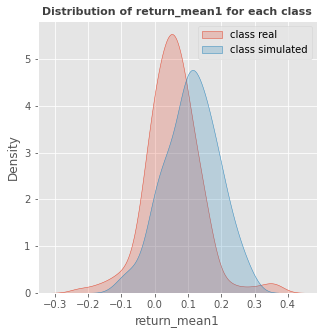

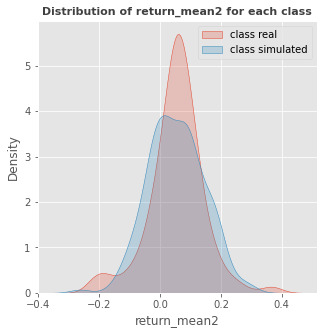

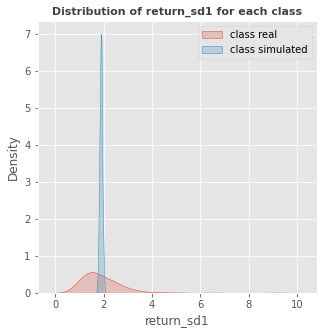

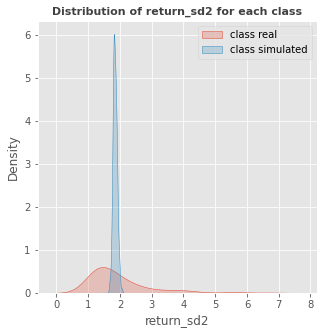

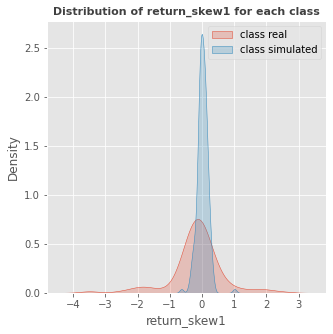

...

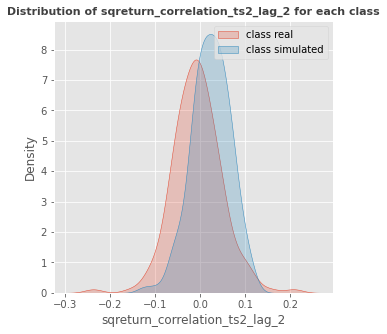

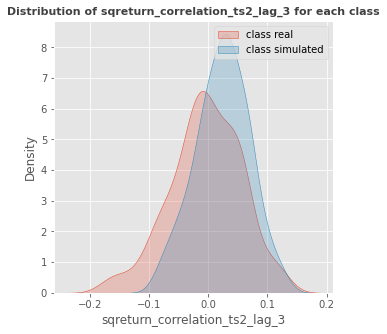

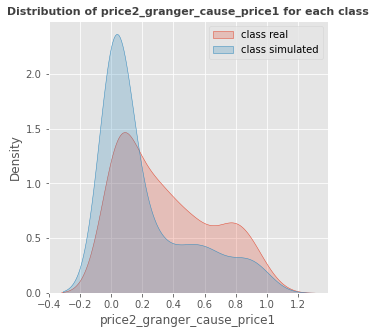

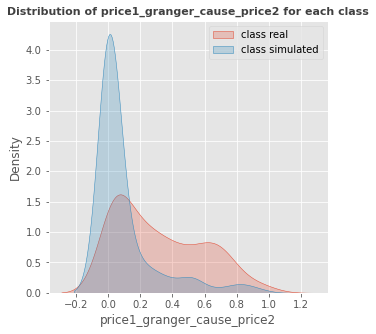

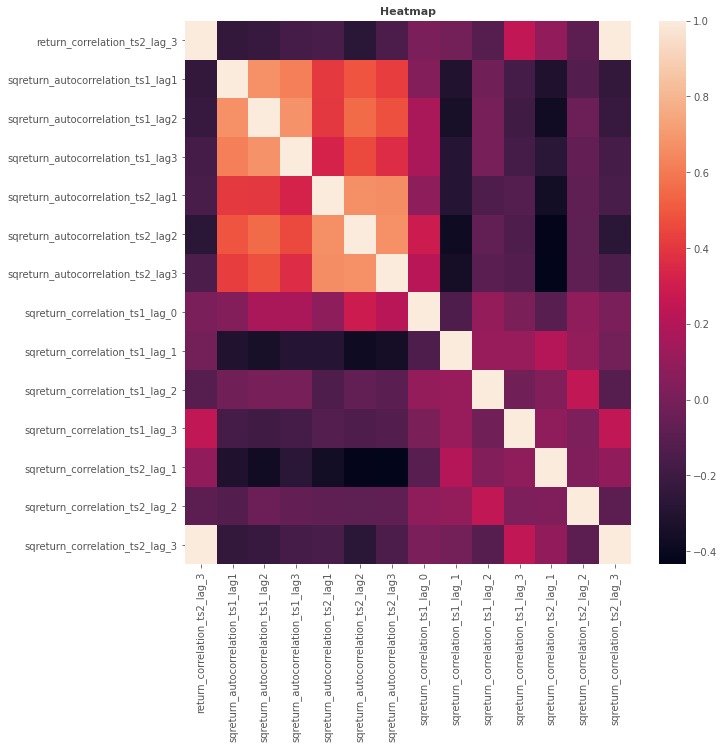

In [14]:
plt.rc('figure', max_open_warning = 0)
EDA.extensive_eda(X_train.iloc[:, 0:20], y_train, save_path="/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/EDA_oujump")
EDA.extensive_eda(X_train.iloc[:, 20:36], y_train, save_path="/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/EDA_oujump")

In [5]:
random_seed = 9868
real_statistics = create_statistics(
    label="real", 
    rolling_window=20, 
    return_csv_location=real_data_folder + "pair_returns_classify.csv", 
    price_csv_location=real_data_folder + "pair_prices_classify.csv")

n_sim_jumpou_log_prices = n_jumpou_simulation(
    random_seed=random_seed, num_sim=248,
        mu11=params[4], mu12=params[5], 
        mu21=params[6], mu22=params[7], 
        sigma11=params[8], sigma12=params[9], 
        sigma21=params[10], sigma22=params[11],
        j11=params[12], j12=params[13], 
        j21=params[14], j22=params[15],
        
        alpha=2*params[0]*params[1]+0.5, 
        beta1=params[0], beta2=params[1], 
        delta0=params[2], 
        mu1=0, mu2=0, 
        lambda11=params[3], lambda12=0, 
        lambda21=0, lambda22=1/params[3],
    xinit_vec=xinit_vec, T0=T0, T=T, length=length)

n_sim_jumpou_pair_prices = log_price_to_price(n_log_price=n_sim_jumpou_log_prices)
n_sim_jumpou_pair_returns = price_to_return(n_price=n_sim_jumpou_pair_prices)

n_sim_jumpou_pair_prices.to_csv("/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/n_sim_jumpou_pair_prices.csv")
n_sim_jumpou_pair_returns.to_csv("/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/n_sim_jumpou_pair_returns.csv")


simulated_statistics = create_statistics(
    label="simulated", 
    rolling_window=20, 
    return_csv_location="/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/n_sim_jumpou_pair_returns.csv", 
    price_csv_location="/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/n_sim_jumpou_pair_prices.csv")


dataset = pd.concat([real_statistics, simulated_statistics])
X = dataset.iloc[:, 0:36]
y = dataset.iloc[:, 36]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=random_seed)
automl = AutoML(eval_metric='accuracy')
automl.fit(X_train, y_train)
predictions = automl.predict(X_test)
accuracy_result = accuracy_score(y_test, predictions)

print(f"Accuracy of predictions:  {accuracy_result:.3f}")


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=1.5909  , p=0.2048  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=3.2140  , p=0.2005  , df=2
likelihood ratio test: chi2=3.2037  , p=0.2015  , df=2
parameter F test:         F=1.5909  , p=0.2048  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=6.5049  , p=0.0016  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=13.1418 , p=0.0014  , df=2
likelihood ratio test: chi2=12.9713 , p=0.0015  , df=2
parameter F test:         F=6.5049  , p=0.0016  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6032  , p=0.4377  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.6068  , p=0.4360  , df=1
likelihood ratio test: chi2=0.6065  , p=0.4361  , df=1
parameter F test:         F=0.6032  , p=0.4377  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=11.8732 , p=0.0006  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0003  , p=0.9854  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.0003  , p=0.9853  , df=1
likelihood ratio test: chi2=0.0003  , p=0.9853  , df=1
parameter F test:         F=0.0003  , p=0.9854  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0843  , p=0.2982  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.0908  , p=0.2963  , df=1
likelihood ratio test: chi2=1.0896  , p=0.2965  , df=1
parameter F test:         F=1.0843  , p=0.2982  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2695  , p=0.6039  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.2712  , p=0.6026  , df=1
likelihood ratio test: chi2=0.2711  , p=0.6026  , df=1
parameter F test:         F=0.2695  , p=0.6039  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.5235  , p=0.2177  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5427  , p=0.4617  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.5459  , p=0.4600  , df=1
likelihood ratio test: chi2=0.5456  , p=0.4601  , df=1
parameter F test:         F=0.5427  , p=0.4617  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.1434  , p=0.0768  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=3.1625  , p=0.0753  , df=1
likelihood ratio test: chi2=3.1525  , p=0.0758  , df=1
parameter F test:         F=3.1434  , p=0.0768  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.0913  , p=0.0808  , df_denom=487, df_num=4
ssr based chi2 test:   chi2=8.5196  , p=0.0743  , df=4
likelihood ratio test: chi2=8.4473  , p=0.0765  , df=4
parameter F test:         F=2.0913  , p=0.0808  , df_denom=487, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.0263  , p=0.3931  

ssr based F test:         F=0.2000  , p=0.6549  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.2012  , p=0.6538  , df=1
likelihood ratio test: chi2=0.2012  , p=0.6538  , df=1
parameter F test:         F=0.2000  , p=0.6549  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9680  , p=0.3257  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.9738  , p=0.3237  , df=1
likelihood ratio test: chi2=0.9729  , p=0.3240  , df=1
parameter F test:         F=0.9680  , p=0.3257  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9209  , p=0.3377  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.9265  , p=0.3358  , df=1
likelihood ratio test: chi2=0.9257  , p=0.3360  , df=1
parameter F test:         F=0.9209  , p=0.3377  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9024  , p=0.1684  , df_denom=496, df_num=1
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.3228  , p=0.7243  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=0.6521  , p=0.7218  , df=2
likelihood ratio test: chi2=0.6517  , p=0.7219  , df=2
parameter F test:         F=0.3228  , p=0.7243  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.7111  , p=0.0251  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=7.4974  , p=0.0235  , df=2
likelihood ratio test: chi2=7.4415  , p=0.0242  , df=2
parameter F test:         F=3.7111  , p=0.0251  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=3.1959  , p=0.0744  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=3.2152  , p=0.0730  , df=1
likelihood ratio test: chi2=3.2049  , p=0.0734  , df=1
parameter F test:         F=3.1959  , p=0.0744  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.6800  , p=0.1955  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3529  , p=0.5527  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.3551  , p=0.5513  , df=1
likelihood ratio test: chi2=0.3549  , p=0.5513  , df=1
parameter F test:         F=0.3529  , p=0.5527  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.6498  , p=0.4206  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.6538  , p=0.4188  , df=1
likelihood ratio test: chi2=0.6533  , p=0.4189  , df=1
parameter F test:         F=0.6498  , p=0.4206  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.8344  , p=0.0098  , df_denom=490, df_num=3
ssr based chi2 test:   chi2=11.6676 , p=0.0086  , df=3
likelihood ratio test: chi2=11.5328 , p=0.0092  , df=3
parameter F test:         F=3.8344  , p=0.0098  , df_denom=490, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.1800  , p=0.3168  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.7966  , p=0.4514  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=1.6094  , p=0.4472  , df=2
likelihood ratio test: chi2=1.6068  , p=0.4478  , df=2
parameter F test:         F=0.7966  , p=0.4514  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.0710  , p=0.0176  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=8.2247  , p=0.0164  , df=2
likelihood ratio test: chi2=8.1575  , p=0.0169  , df=2
parameter F test:         F=4.0710  , p=0.0176  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.4084  , p=0.5231  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.4108  , p=0.5215  , df=1
likelihood ratio test: chi2=0.4107  , p=0.5216  , df=1
parameter F test:         F=0.4084  , p=0.5231  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0695  , p=0.3016  


Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.6434  , p=0.0269  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=7.3607  , p=0.0252  , df=2
likelihood ratio test: chi2=7.3068  , p=0.0259  , df=2
parameter F test:         F=3.6434  , p=0.0269  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.2685  , p=0.0389  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=6.6032  , p=0.0368  , df=2
likelihood ratio test: chi2=6.5598  , p=0.0376  , df=2
parameter F test:         F=3.2685  , p=0.0389  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.4345  , p=0.7837  , df_denom=487, df_num=4
ssr based chi2 test:   chi2=1.7703  , p=0.7779  , df=4
likelihood ratio test: chi2=1.7671  , p=0.7785  , df=4
parameter F test:         F=0.4345  , p=0.7837  , df_denom=487, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.5613  , p=0.1834  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.5360  , p=0.8073  , df_denom=478, df_num=7
ssr based chi2 test:   chi2=3.8699  , p=0.7946  , df=7
likelihood ratio test: chi2=3.8547  , p=0.7963  , df=7
parameter F test:         F=0.5360  , p=0.8073  , df_denom=478, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=2.2240  , p=0.0312  , df_denom=478, df_num=7
ssr based chi2 test:   chi2=16.0565 , p=0.0246  , df=7
likelihood ratio test: chi2=15.8005 , p=0.0270  , df=7
parameter F test:         F=2.2240  , p=0.0312  , df_denom=478, df_num=7

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7815  , p=0.3771  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.7863  , p=0.3752  , df=1
likelihood ratio test: chi2=0.7856  , p=0.3754  , df=1
parameter F test:         F=0.7815  , p=0.3771  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.1180  , p=0.1462  

ssr based F test:         F=1.7070  , p=0.0943  , df_denom=475, df_num=8
ssr based chi2 test:   chi2=14.1450 , p=0.0781  , df=8
likelihood ratio test: chi2=13.9455 , p=0.0832  , df=8
parameter F test:         F=1.7070  , p=0.0943  , df_denom=475, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.6345  , p=0.1125  , df_denom=475, df_num=8
ssr based chi2 test:   chi2=13.5437 , p=0.0945  , df=8
likelihood ratio test: chi2=13.3606 , p=0.1000  , df=8
parameter F test:         F=1.6345  , p=0.1125  , df_denom=475, df_num=8

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.5123  , p=0.5994  , df_denom=493, df_num=2
ssr based chi2 test:   chi2=1.0350  , p=0.5960  , df=2
likelihood ratio test: chi2=1.0339  , p=0.5963  , df=2
parameter F test:         F=0.5123  , p=0.5994  , df_denom=493, df_num=2

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=4.1450  , p=0.0164  , df_denom=493, df_num=2
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5039  , p=0.4781  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.5070  , p=0.4765  , df=1
likelihood ratio test: chi2=0.5067  , p=0.4766  , df=1
parameter F test:         F=0.5039  , p=0.4781  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.3313  , p=0.2491  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.3393  , p=0.2472  , df=1
likelihood ratio test: chi2=1.3375  , p=0.2475  , df=1
parameter F test:         F=1.3313  , p=0.2491  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.8242  , p=0.1774  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.8352  , p=0.1755  , df=1
likelihood ratio test: chi2=1.8318  , p=0.1759  , df=1
parameter F test:         F=1.8242  , p=0.1774  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3090  , p=0.5785  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3332  , p=0.5640  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.3352  , p=0.5626  , df=1
likelihood ratio test: chi2=0.3351  , p=0.5627  , df=1
parameter F test:         F=0.3332  , p=0.5640  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0985  , p=0.7538  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.0991  , p=0.7529  , df=1
likelihood ratio test: chi2=0.0991  , p=0.7529  , df=1
parameter F test:         F=0.0985  , p=0.7538  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.2741  , p=0.1322  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=2.2879  , p=0.1304  , df=1
likelihood ratio test: chi2=2.2826  , p=0.1308  , df=1
parameter F test:         F=2.2741  , p=0.1322  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0432  , p=0.3076  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.4674  , p=0.2263  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.4763  , p=0.2244  , df=1
likelihood ratio test: chi2=1.4741  , p=0.2247  , df=1
parameter F test:         F=1.4674  , p=0.2263  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2420  , p=0.6230  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.2435  , p=0.6217  , df=1
likelihood ratio test: chi2=0.2434  , p=0.6218  , df=1
parameter F test:         F=0.2420  , p=0.6230  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5113  , p=0.4749  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.5144  , p=0.4732  , df=1
likelihood ratio test: chi2=0.5141  , p=0.4733  , df=1
parameter F test:         F=0.5113  , p=0.4749  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1745  , p=0.6763  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9148  , p=0.3393  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.9203  , p=0.3374  , df=1
likelihood ratio test: chi2=0.9195  , p=0.3376  , df=1
parameter F test:         F=0.9148  , p=0.3393  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.3692  , p=0.0209  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=5.4016  , p=0.0201  , df=1
likelihood ratio test: chi2=5.3726  , p=0.0205  , df=1
parameter F test:         F=5.3692  , p=0.0209  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.3113  , p=0.5771  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.3132  , p=0.5757  , df=1
likelihood ratio test: chi2=0.3131  , p=0.5758  , df=1
parameter F test:         F=0.3113  , p=0.5771  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.4801  , p=0.2243  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.5424  , p=0.1115  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=2.5578  , p=0.1098  , df=1
likelihood ratio test: chi2=2.5512  , p=0.1102  , df=1
parameter F test:         F=2.5424  , p=0.1115  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1897  , p=0.6634  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.1908  , p=0.6622  , df=1
likelihood ratio test: chi2=0.1908  , p=0.6622  , df=1
parameter F test:         F=0.1897  , p=0.6634  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7344  , p=0.1885  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.7449  , p=0.1865  , df=1
likelihood ratio test: chi2=1.7418  , p=0.1869  , df=1
parameter F test:         F=1.7344  , p=0.1885  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.5370  , p=0.4640  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8151  , p=0.3670  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=0.8201  , p=0.3652  , df=1
likelihood ratio test: chi2=0.8194  , p=0.3654  , df=1
parameter F test:         F=0.8151  , p=0.3670  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.0053  , p=0.3165  , df_denom=496, df_num=1
ssr based chi2 test:   chi2=1.0114  , p=0.3146  , df=1
likelihood ratio test: chi2=1.0104  , p=0.3148  , df=1
parameter F test:         F=1.0053  , p=0.3165  , df_denom=496, df_num=1

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.2960  , p=0.2751  , df_denom=490, df_num=3
ssr based chi2 test:   chi2=3.9437  , p=0.2676  , df=3
likelihood ratio test: chi2=3.9281  , p=0.2693  , df=3
parameter F test:         F=1.2960  , p=0.2751  , df_denom=490, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.8269  , p=0.4795  


Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.0465  , p=0.3942  , df_denom=481, df_num=6
ssr based chi2 test:   chi2=6.4488  , p=0.3748  , df=6
likelihood ratio test: chi2=6.4071  , p=0.3792  , df=6
parameter F test:         F=1.0465  , p=0.3942  , df_denom=481, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=2.0624  , p=0.0562  , df_denom=481, df_num=6
ssr based chi2 test:   chi2=12.7090 , p=0.0479  , df=6
likelihood ratio test: chi2=12.5483 , p=0.0508  , df=6
parameter F test:         F=2.0624  , p=0.0562  , df_denom=481, df_num=6

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.6220  , p=0.1834  , df_denom=490, df_num=3
ssr based chi2 test:   chi2=4.9355  , p=0.1766  , df=3
likelihood ratio test: chi2=4.9111  , p=0.1784  , df=3
parameter F test:         F=1.6220  , p=0.1834  , df_denom=490, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.8312  , p=0.0379  


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.1161  , p=0.1464  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.1288  , p=0.1446  , df=1
likelihood ratio test: chi2=2.1243  , p=0.1450  , df=1
parameter F test:         F=2.1161  , p=0.1464  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1194  , p=0.7298  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1201  , p=0.7289  , df=1
likelihood ratio test: chi2=0.1201  , p=0.7289  , df=1
parameter F test:         F=0.1194  , p=0.7298  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.0968  , p=0.3639  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=9.0878  , p=0.3349  , df=8
likelihood ratio test: chi2=9.0051  , p=0.3419  , df=8
parameter F test:         F=1.0968  , p=0.3639  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=2.0227  , p=0.0422  


Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.7129  , p=0.1037  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=12.3660 , p=0.0891  , df=7
likelihood ratio test: chi2=12.2137 , p=0.0937  , df=7
parameter F test:         F=1.7129  , p=0.1037  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.8954  , p=0.0684  , df_denom=479, df_num=7
ssr based chi2 test:   chi2=13.6834 , p=0.0571  , df=7
likelihood ratio test: chi2=13.4973 , p=0.0609  , df=7
parameter F test:         F=1.8954  , p=0.0684  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.6301  , p=0.1815  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=4.9601  , p=0.1747  , df=3
likelihood ratio test: chi2=4.9356  , p=0.1766  , df=3
parameter F test:         F=1.6301  , p=0.1815  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.2860  , p=0.8355  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.7434  , p=0.0687  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=18.2128 , p=0.0515  , df=10
likelihood ratio test: chi2=17.8832 , p=0.0570  , df=10
parameter F test:         F=1.7434  , p=0.0687  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.0968  , p=0.3627  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=11.4580 , p=0.3230  , df=10
likelihood ratio test: chi2=11.3263 , p=0.3327  , df=10
parameter F test:         F=1.0968  , p=0.3627  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.4907  , p=0.6889  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=1.4932  , p=0.6838  , df=3
likelihood ratio test: chi2=1.4909  , p=0.6844  , df=3
parameter F test:         F=0.4907  , p=0.6889  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=2.2388  , 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.9418  , p=0.1641  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.9535  , p=0.1622  , df=1
likelihood ratio test: chi2=1.9497  , p=0.1626  , df=1
parameter F test:         F=1.9418  , p=0.1641  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.2200  , p=0.6393  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.2213  , p=0.6381  , df=1
likelihood ratio test: chi2=0.2212  , p=0.6381  , df=1
parameter F test:         F=0.2200  , p=0.6393  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.9546  , p=0.0122  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=15.1082 , p=0.0099  , df=5
likelihood ratio test: chi2=14.8827 , p=0.0109  , df=5
parameter F test:         F=2.9546  , p=0.0122  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.6877  , p=0.1359  

likelihood ratio test: chi2=11.2778 , p=0.1270  , df=7
parameter F test:         F=1.5802  , p=0.1390  , df_denom=479, df_num=7

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.7537  , p=0.0024  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=19.1940 , p=0.0018  , df=5
likelihood ratio test: chi2=18.8320 , p=0.0021  , df=5
parameter F test:         F=3.7537  , p=0.0024  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.4888  , p=0.7847  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=2.4997  , p=0.7765  , df=5
likelihood ratio test: chi2=2.4934  , p=0.7775  , df=5
parameter F test:         F=0.4888  , p=0.7847  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.2137  , p=0.2795  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=12.6789 , p=0.2422  , df=10
likelihood ratio test: chi2=12.5180 , p=0.2519  , df=10
parameter F test:         F=1.2137 

ssr based F test:         F=4.0729  , p=0.0441  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=4.0975  , p=0.0429  , df=1
likelihood ratio test: chi2=4.0808  , p=0.0434  , df=1
parameter F test:         F=4.0729  , p=0.0441  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.0060  , p=0.4135  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=5.1440  , p=0.3986  , df=5
likelihood ratio test: chi2=5.1175  , p=0.4017  , df=5
parameter F test:         F=1.0060  , p=0.4135  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.7862  , p=0.0171  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=14.2472 , p=0.0141  , df=5
likelihood ratio test: chi2=14.0464 , p=0.0153  , df=5
parameter F test:         F=2.7862  , p=0.0171  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=3.3536  , p=0.0358  , df_denom=494, df_num=2
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.3992  , p=0.0493  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=9.7739  , p=0.0444  , df=4
likelihood ratio test: chi2=9.6790  , p=0.0462  , df=4
parameter F test:         F=2.3992  , p=0.0493  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=4.9298  , p=0.0007  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=20.0828 , p=0.0005  , df=4
likelihood ratio test: chi2=19.6876 , p=0.0006  , df=4
parameter F test:         F=4.9298  , p=0.0007  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=6.3548  , p=0.0120  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=6.3932  , p=0.0115  , df=1
likelihood ratio test: chi2=6.3526  , p=0.0117  , df=1
parameter F test:         F=6.3548  , p=0.0120  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.9023  , p=0.3426  

ssr based F test:         F=1.0227  , p=0.4177  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=8.4738  , p=0.3886  , df=8
likelihood ratio test: chi2=8.4018  , p=0.3952  , df=8
parameter F test:         F=1.0227  , p=0.4177  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.4774  , p=0.1628  , df_denom=476, df_num=8
ssr based chi2 test:   chi2=12.2417 , p=0.1407  , df=8
likelihood ratio test: chi2=12.0922 , p=0.1471  , df=8
parameter F test:         F=1.4774  , p=0.1628  , df_denom=476, df_num=8

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=1.1252  , p=0.3459  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=5.7536  , p=0.3309  , df=5
likelihood ratio test: chi2=5.7205  , p=0.3344  , df=5
parameter F test:         F=1.1252  , p=0.3459  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=0.5386  , p=0.7471  , df_denom=485, df_num=5
ssr based chi2 test: 


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=6.3106  , p=0.0001  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=25.7081 , p=0.0000  , df=4
likelihood ratio test: chi2=25.0653 , p=0.0000  , df=4
parameter F test:         F=6.3106  , p=0.0001  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=0.3185  , p=0.8656  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=1.2976  , p=0.8618  , df=4
likelihood ratio test: chi2=1.2959  , p=0.8621  , df=4
parameter F test:         F=0.3185  , p=0.8656  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.7141  , p=0.1911  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=1.7244  , p=0.1891  , df=1
likelihood ratio test: chi2=1.7214  , p=0.1895  , df=1
parameter F test:         F=1.7141  , p=0.1911  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=5.5735  , p=0.0186  


Granger Causality
number of lags (no zero) 9
ssr based F test:         F=2.8865  , p=0.0025  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=27.0216 , p=0.0014  , df=9
likelihood ratio test: chi2=26.3056 , p=0.0018  , df=9
parameter F test:         F=2.8865  , p=0.0025  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 9
ssr based F test:         F=0.7962  , p=0.6200  , df_denom=473, df_num=9
ssr based chi2 test:   chi2=7.4540  , p=0.5900  , df=9
likelihood ratio test: chi2=7.3981  , p=0.5957  , df=9
parameter F test:         F=0.7962  , p=0.6200  , df_denom=473, df_num=9

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.1230  , p=0.0066  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=12.5454 , p=0.0057  , df=3
likelihood ratio test: chi2=12.3900 , p=0.0062  , df=3
parameter F test:         F=4.1230  , p=0.0066  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.3874  , p=0.7621  

ssr based F test:         F=2.2334  , p=0.0151  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=23.3318 , p=0.0096  , df=10
likelihood ratio test: chi2=22.7944 , p=0.0115  , df=10
parameter F test:         F=2.2334  , p=0.0151  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.4487  , p=0.1560  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=15.1345 , p=0.1272  , df=10
likelihood ratio test: chi2=14.9060 , p=0.1355  , df=10
parameter F test:         F=1.4487  , p=0.1560  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=3.0928  , p=0.0008  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=32.3096 , p=0.0004  , df=10
likelihood ratio test: chi2=31.2910 , p=0.0005  , df=10
parameter F test:         F=3.0928  , p=0.0008  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.4619  , p=0.1507  , df_denom=470, df_num=10
ssr b


Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.3525  , p=0.0532  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=9.5835  , p=0.0481  , df=4
likelihood ratio test: chi2=9.4923  , p=0.0499  , df=4
parameter F test:         F=2.3525  , p=0.0532  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.5417  , p=0.1889  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=6.2804  , p=0.1792  , df=4
likelihood ratio test: chi2=6.2410  , p=0.1819  , df=4
parameter F test:         F=1.5417  , p=0.1889  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=8.1773  , p=0.0044  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=8.2267  , p=0.0041  , df=1
likelihood ratio test: chi2=8.1597  , p=0.0043  , df=1
parameter F test:         F=8.1773  , p=0.0044  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.0395  , p=0.8425  


Granger Causality
number of lags (no zero) 10
ssr based F test:         F=2.7766  , p=0.0024  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=29.0068 , p=0.0012  , df=10
likelihood ratio test: chi2=28.1823 , p=0.0017  , df=10
parameter F test:         F=2.7766  , p=0.0024  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 10
ssr based F test:         F=1.7580  , p=0.0659  , df_denom=470, df_num=10
ssr based chi2 test:   chi2=18.3652 , p=0.0491  , df=10
likelihood ratio test: chi2=18.0301 , p=0.0545  , df=10
parameter F test:         F=1.7580  , p=0.0659  , df_denom=470, df_num=10

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=3.0493  , p=0.0283  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=9.2783  , p=0.0258  , df=3
likelihood ratio test: chi2=9.1929  , p=0.0268  , df=3
parameter F test:         F=3.0493  , p=0.0283  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.1115  , 


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=9.6671  , p=0.0020  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=9.7254  , p=0.0018  , df=1
likelihood ratio test: chi2=9.6321  , p=0.0019  , df=1
parameter F test:         F=9.6671  , p=0.0020  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.8276  , p=0.3634  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.8326  , p=0.3615  , df=1
likelihood ratio test: chi2=0.8319  , p=0.3617  , df=1
parameter F test:         F=0.8276  , p=0.3634  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=3.7861  , p=0.0023  , df_denom=485, df_num=5
ssr based chi2 test:   chi2=19.3598 , p=0.0016  , df=5
likelihood ratio test: chi2=18.9915 , p=0.0019  , df=5
parameter F test:         F=3.7861  , p=0.0023  , df_denom=485, df_num=5

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.4486  , p=0.0331  

likelihood ratio test: chi2=10.3850 , p=0.0344  , df=4
parameter F test:         F=2.5761  , p=0.0369  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=1.3618  , p=0.2461  , df_denom=488, df_num=4
ssr based chi2 test:   chi2=5.5477  , p=0.2356  , df=4
likelihood ratio test: chi2=5.5170  , p=0.2382  , df=4
parameter F test:         F=1.3618  , p=0.2461  , df_denom=488, df_num=4

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=4.1098  , p=0.0068  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=12.5051 , p=0.0058  , df=3
likelihood ratio test: chi2=12.3507 , p=0.0063  , df=3
parameter F test:         F=4.1098  , p=0.0068  , df_denom=491, df_num=3

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=1.6405  , p=0.1791  , df_denom=491, df_num=3
ssr based chi2 test:   chi2=4.9915  , p=0.1724  , df=3
likelihood ratio test: chi2=4.9667  , p=0.1743  , df=3
parameter F test:         F=1.6405  , p


Granger Causality
number of lags (no zero) 1
ssr based F test:         F=2.3540  , p=0.1256  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=2.3682  , p=0.1238  , df=1
likelihood ratio test: chi2=2.3626  , p=0.1243  , df=1
parameter F test:         F=2.3540  , p=0.1256  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.1676  , p=0.6825  , df_denom=497, df_num=1
ssr based chi2 test:   chi2=0.1686  , p=0.6814  , df=1
likelihood ratio test: chi2=0.1685  , p=0.6814  , df=1
parameter F test:         F=0.1676  , p=0.6825  , df_denom=497, df_num=1

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.3059  , p=0.2528  , df_denom=482, df_num=6
ssr based chi2 test:   chi2=8.0470  , p=0.2347  , df=6
likelihood ratio test: chi2=7.9823  , p=0.2394  , df=6
parameter F test:         F=1.3059  , p=0.2528  , df_denom=482, df_num=6

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=0.6752  , p=0.6698  

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


AutoML steps: ['simple_algorithms', 'default_algorithms', 'ensemble']
* Step simple_algorithms will try to check up to 3 models
1_Baseline accuracy 0.505747 trained in 0.3 seconds
2_DecisionTree accuracy 0.83908 trained in 11.09 seconds
3_Linear accuracy 0.896552 trained in 3.18 seconds
* Step default_algorithms will try to check up to 3 models
4_Default_Xgboost accuracy 0.965517 trained in 3.94 seconds
5_Default_NeuralNetwork accuracy 0.977011 trained in 1.98 seconds
6_Default_RandomForest accuracy 0.942529 trained in 7.14 seconds
* Step ensemble will try to check up to 1 model
Ensemble accuracy 0.988506 trained in 0.4 seconds


An input array is constant; the correlation coefficent is not defined.


AutoML fit time: 38.82 seconds
AutoML best model: Ensemble
Accuracy of predictions:  0.973


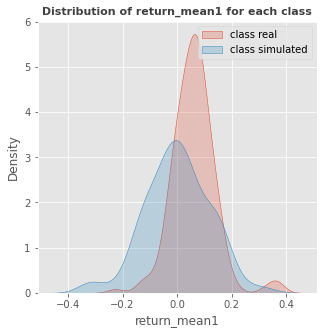

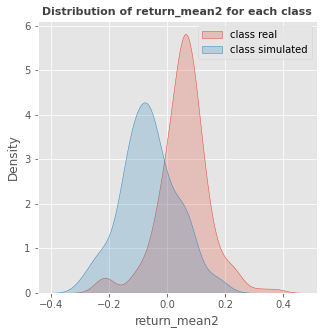

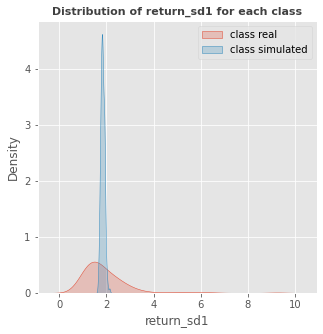

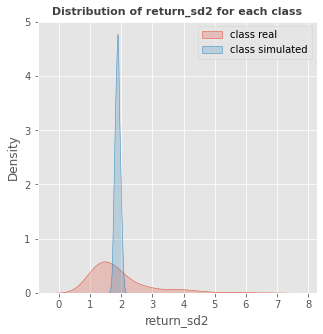

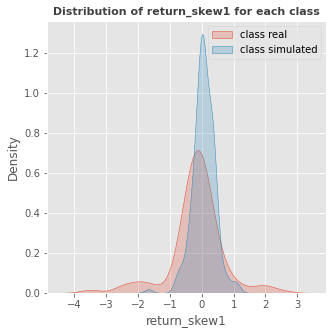

...

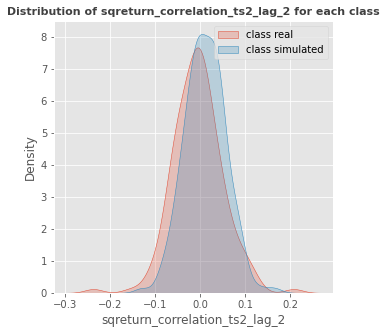

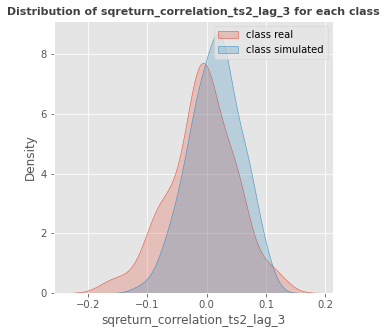

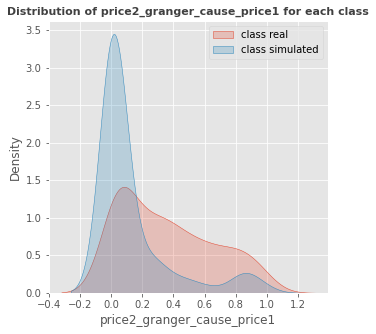

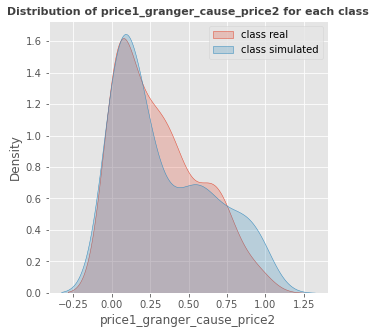

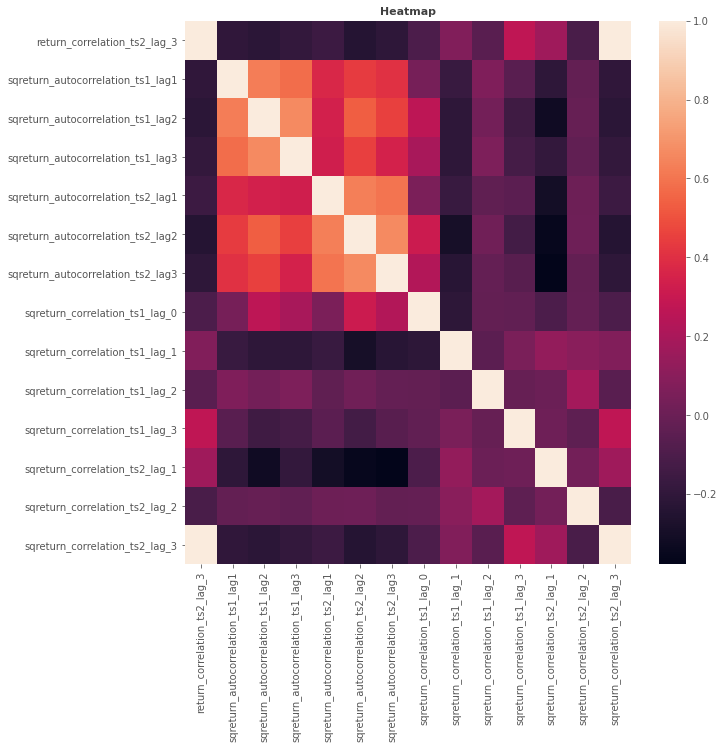

In [6]:
plt.rc('figure', max_open_warning = 0)
EDA.extensive_eda(X_train.iloc[:, 0:20], y_train, save_path="/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/EDA_oujump_2")
EDA.extensive_eda(X_train.iloc[:, 20:36], y_train, save_path="/Users/changmao/Desktop/OneDrive - Imperial College London/InferStat - MSc Summer Project/GitHub/Summer-Research-Project/Calibration/Cluster jobs/ou_jump_stvol/EDA_oujump_2")